# Data Cleaning 311 Data and Exploring

In [1]:
import pandas as pd
df = pd.read_csv('311_Service_Requests.csv')
df.head(5)
print(df.shape)

KeyboardInterrupt: 

### Questions:
    1. What types of services are there? Which ones are the most common? Can they be bucketed?
    2. Do certain locations have a preference for type of service? Is there a difference in service time for services or locations?
    3. Do any glaring issues arise, and how can we fix these issues?

In [3]:
df.shape

(3655438, 37)

# Only Keep Requests that constitute top 99% in volume

In [2]:
SR_types = df.groupby('SR_TYPE')['SR_TYPE'].count().sort_values(ascending = False)
top_SR_types = SR_types[SR_types>(3655438-1193699)/100]

#we have 16 types of violations that make up 
#if we remove "Information Calls" we have 19 violations that make up 99% of the complaints
top_SRs = [request for request in top_SR_types.index][2:]
top_SRs

NameError: name 'df' is not defined

In [5]:
plt.barh(SR_types.head(5).sort_values().index, SR_types.sort_values().head(5))
plt.title('Top 311 Service Call Types')

NameError: name 'plt' is not defined

# EDA

# Look at Different Departments

Text(0.5, 1.0, '311 Service Calls by Department')

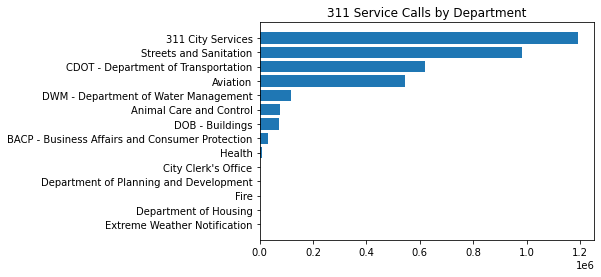

In [97]:
department_groupby = df.groupby('OWNER_DEPARTMENT')['SR_TYPE'].count()
department_groupby = department_groupby.sort_values()
plt.barh(department_groupby.index, department_groupby)
plt.title('311 Service Calls by Department')

# Filter Out Data That Does Not Include Top Requests

In [98]:
requests_df = df[df.SR_TYPE.isin(top_SRs)]

In [99]:
#pickle data to make access easier
import pickle
requests_df.to_pickle('requests_df.pkl')

In [100]:
%%time
df = pd.read_pickle('requests_df.pkl')

CPU times: user 6.21 s, sys: 17 s, total: 23.2 s
Wall time: 42.7 s


look at how service requests have changed over time
- create year variable, group by year
- create variable "completion time" - closed date - created date

look at how service requests operate per month

    
map out service requests according to location

loop in census data to determine:
    - neighborhoods
    - income demographic
    - racial demographics
    - more to come on this later

# Data by Month

CREATED_MONTH
1      37320
2      33114
3      39488
4      43224
5      65107
6      92941
7     165982
8     167322
9      88526
10     70445
11     44738
12     36415
Name: SR_TYPE, dtype: int64

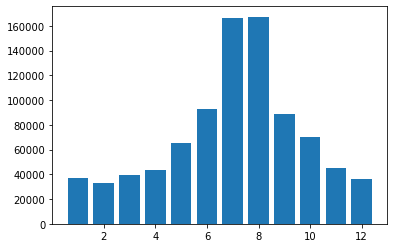

In [102]:
import matplotlib.pyplot as plt
group = df[df.OWNER_DEPARTMENT == 'Streets and Sanitation'].groupby('CREATED_MONTH')['SR_TYPE'].count()
plt.bar(group.index, group)
#most requests come during July and August

# Create Completion Time Column

In [103]:
df['CREATED_DATE'][1][:10]

df['CREATED_DATE'] = df['CREATED_DATE'].apply(lambda x: x[:10])
df['CLOSED_DATE'] = df['CLOSED_DATE'].apply(lambda x: str(x)[:10])

In [104]:
df['CREATED_DATE'] = pd.to_datetime(df['CREATED_DATE'])
df['CLOSED_DATE'] = pd.to_datetime(df['CLOSED_DATE'])


In [105]:
df['COMPLETION_TIME'] = df['CLOSED_DATE']-df['CREATED_DATE']

In [106]:
#df['tdColumn'] = pd.to_numeric(df['tdColumn'].dt.days, downcast='integer')

df['COMPLETION_TIME'] = pd.to_numeric(df['COMPLETION_TIME'].dt.days, downcast = 'integer')

In [107]:
hood_df = pd.read_csv('Neighborhoods_2012b.csv')
#hood_df['the_geom'][2]

In [108]:
df.groupby('SR_TYPE')['COMPLETION_TIME'].mean().sort_values(ascending = False)

df.sample(frac = .1).to_csv('request_df2.csv')

In [109]:
census_tracts = pd.read_csv('CensusTractsTIGER2010.csv')


# Get Neighborhood Assignments 

In [110]:
def get_location(df):
    lat = float(df['LATITUDE'])
    lon = float(df['LONGITUDE'])
    return (lon, lat)



In [111]:
import pandas as pd
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import re
import geopandas as gpd
import plotly.express as px

In [113]:
df = pd.read_csv('request_df2.csv')
df['LOCATION2'] = df.apply(get_location, axis = 1)

/Users/plam1122/opt/anaconda3/envs/metis/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning:

Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.



In [114]:
df2 = df[df.OWNER_DEPARTMENT == 'Streets and Sanitation']

In [115]:
fig = px.scatter_mapbox(df2, lat="LATITUDE", lon="LONGITUDE", color="SR_TYPE", zoom = 9, mapbox_style='open-street-map')
fig.show()


In [116]:
#look into relationships between service time and neighborhood
#look into how predictive tool may help lessen time in areas where it takes forever to have service

In [117]:
nb = 'geo_export_95ac4c6b-19f1-4900-94d0-8152a5de48ce.shp'

hoods = gpd.read_file('Neighborhoods/geo_export_95ac4c6b-19f1-4900-94d0-8152a5de48ce.shp', encoding="utf-8")

In [119]:
census_tracts = gpd.read_file('Census_Tracts/geo_export_e5e8bcc6-6537-4d63-bb85-82690b1ecfea.shp', encoding = 'utf-8')
#hoods = gpd.read_file('Neighborhoods/geo_export_95ac4c6b-19f1-4900-94d0-8152a5de48ce.shp', encoding="utf-8")
census_tracts

,commarea,commarea_n,countyfp10,geoid10,name10,namelsad10,notes,statefp10,tractce10,geometry
0,44,44.0,031,17031842400,8424,Census Tract 8424,None,17,842400,"POLYGON ((-87.62405 41.73022, -87.62405 41.730..."
1,59,59.0,031,17031840300,8403,Census Tract 8403,None,17,840300,"POLYGON ((-87.68608 41.82296, -87.68607 41.823..."
2,34,34.0,031,17031841100,8411,Census Tract 8411,None,17,841100,"POLYGON ((-87.62935 41.85280, -87.62934 41.852..."
3,31,31.0,031,17031841200,8412,Census Tract 8412,None,17,841200,"POLYGON ((-87.68813 41.85569, -87.68816 41.856..."
4,32,32.0,031,17031839000,8390,Census Tract 8390,None,17,839000,"POLYGON ((-87.63312 41.87449, -87.63306 41.874..."
...,...,...,...,...,...,...,...,...,...,...
796,7,7.0,031,17031070400,704,Census Tract 704,None,17,070400,"POLYGON ((-87.65746 41.93258, -87.65722 41.932..."
797,7,7.0,031,17031070500,705,Census Tract 705,None,17,070500,"POLYGON ((-87.66349 41.93036, -87.66350 41.930..."
798,13,13.0,031,17031130300,1303,Census Tract 1303,None,17,130300,"POLYGON ((-87.71436 41.98300, -87.71472 41.982..."
799,29,29.0,031,17031292200,2922,Census Tract 2922,None,17,292200,"POLYGON ((-87.71317 41.85523, -87.71357 41.855..."


In [ ]:
#Get Neighborhood and Census Tracts for All 

In [128]:
%%time
comm_map = hoods
census = census_tracts
def get_neighborhood(location):
    i = 0
    location_in_chicago = Point(location)
    for index, row in comm_map.iterrows():
        chicago_community_polygon = row['geometry']
        if chicago_community_polygon.contains(location_in_chicago):
            i +=1
            print(i, row['sec_neigh'])
            return row['sec_neigh']
        
def get_census_tract(location):
    location_in_chicago = Point(location)
    i = 0
    for index, row in census.iterrows():
        chicago_community_polygon = row['geometry']
        if chicago_community_polygon.contains(location_in_chicago):
            i += 1
            print(i, row['name10'])
            return row['name10']

df['NEIGHBORHOOD'] = df['LOCATION2'].apply(get_neighborhood)

df['CENSUS_TRACT'] = df['LOCATION2'].apply(get_census_tract)

1 WASHINGTON PARK
1 DUNNING
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 ROGERS PARK
1 MARQUETTE PARK,GAGE PARK
1 ROGERS PARK
1 ASHBURN
1 AUBURN GRESHAM
1 UPTOWN
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 BACK OF THE YARDS
1 OHARE
1 NORTH PARK,ALBANY PARK
1 DUNNING
1 CHATHAM,BURNSIDE
1 LINCOLN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ROGERS PARK
1 SOUTHEAST SIDE
1 AUSTIN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH LAWNDALE
1 OHARE
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 MIDWAY AIRPORT
1 PULLMAN
1 SOUTH CHICAGO
1 UNITED CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 JEFFERSON PARK
1 LINCOLN SQUARE
1 OHARE
1 BUCKTOWN
1 OHARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 OHARE
1 ASHBURN
1 OH

1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 RIVER NORTH
1 AUSTIN
1 AUSTIN
1 HUMBOLDT PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OAKLAND,KENWOOD
1 WICKER PARK,WEST TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BEVERLY
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 OHARE
1 HUMBOLDT PARK
1 ASHBURN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 MONTCLARE, GALEWOOD
1 OHARE
1 LAKE VIEW
1 EDGEWATER
1 OHARE
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 BACK OF THE YARDS
1 BRIDGEPORT
1 BRONZEVILLE
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 WEST LOOP
1 OHARE
1 

1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 UPTOWN
1 CHATHAM,BURNSIDE
1 WOODLAWN
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 PORTAGE PARK
1 GARFIELD PARK
1 UNITED CENTER
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 BRIDGEPORT
1 AUBURN GRESHAM
1 UPTOWN
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 OHARE
1 UPTOWN
1 WICKER PARK,WEST TOWN
1 OHARE
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTHEAST SIDE
1 ASHBURN
1 WEST PULLMAN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 PORTAGE PARK
1 JEFFERSON PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ROGERS PARK
1 LITTLE VILLAGE
1 OHARE
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 NORTH PARK,ALBANY PARK
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 ENGLEWOOD
1 OHARE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE

1 OHARE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 NEAR SOUTH SIDE
1 LAKE VIEW
1 LOWER WEST SIDE
1 WEST PULLMAN
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 ENGLEWOOD
1 ENGLEWOOD
1 LAKE VIEW
1 HUMBOLDT PARK
1 BRONZEVILLE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 GARFIELD PARK
1 NORWOOD PARK
1 LOGAN SQUARE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 NORWOOD PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 OHARE
1 ROGERS PARK
1 JEFFERSON PARK
1 PORTAGE PARK
1 NORTH LAWNDALE
1 BEVERLY
1 OHARE
1 OHARE
1 WEST RIDGE
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 ENGLEWOOD
1 WEST RIDGE
1 GARFIELD PARK
1 NORTH PARK,ALBANY PARK
1 WOODLAWN
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 OHARE
1 AUBURN GRESHAM
1 WEST RIDGE
1 OHARE
1 OHARE
1 BUCKTOWN
1 ROGERS PARK
1 LOWER WEST SIDE
1 OHARE
1 WEST LAWN
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CR

1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 AUBURN GRESHAM
1 LINCOLN PARK
1 OHARE
1 EDGEWATER
1 OHARE
1 UPTOWN
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUSTIN
1 CHATHAM,BURNSIDE
1 SAUGANASH,FOREST GLEN
1 LINCOLN PARK
1 SOUTH CHICAGO
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 UNITED CENTER
1 WOODLAWN
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AUSTIN
1 LINCOLN PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 AUBURN GRESHAM
1 SOUTH CHICAGO
1 GRANT PARK
1 ENGLEWOOD
1 RIVER NORTH
1 LINCOLN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 KENWOOD,OAKLAND
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND C

1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 NORTH LAWNDALE
1 WEST RIDGE
1 SOUTH CHICAGO
1 LITTLE VILLAGE
1 EDISON PARK
1 OHARE
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 GARFIELD PARK
1 ENGLEWOOD
1 OHARE
1 GARFIELD PARK
1 OHARE
1 HYDE PARK
1 OHARE
1 PORTAGE PARK
1 LOGAN SQUARE
1 OHARE
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 NEAR SOUTH SIDE
1 NORTH LAWNDALE
1 WEST PULLMAN
1 WASHINGTON PARK
1 NORTH LAWNDALE
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 LAKE VIEW
1 WEST LAWN
1 ENGLEWOOD
1 BRIDGEPORT
1 OHARE
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 ROGERS PARK
1 WEST PULLMAN
1 UNITED CENTER
1 WICKER PARK,WEST TOWN
1 OHARE
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 LAKE VIEW
1 BRONZEVILLE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 NORTH CENTER
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VI

1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BUCKTOWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 JEFFERSON PARK
1 WOODLAWN
1 NORTH CENTER
1 WOODLAWN
1 OHARE
1 OHARE
1 PORTAGE PARK
1 WEST PULLMAN
1 HUMBOLDT PARK
1 WEST PULLMAN
1 OHARE
1 AUSTIN
1 BRIDGEPORT
1 AUSTIN
1 MIDWAY AIRPORT
1 BEVERLY
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 KENWOOD,OAKLAND
1 OHARE
1 UNITED CENTER
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 BUCKTOWN
1 GARFIELD PARK
1 BRIDGEPORT
1 LITTLE VILLAGE
1 STREETERVILLE
1 LITTLE VILLAGE
1 WEST PULLMAN
1 NORTH PARK,ALBANY PARK
1 UPTOWN
1 CHATHAM,BURNSIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 LITTLE ITALY, UIC
1 CHATHAM,BURNSIDE
1 BEVERLY
1 SOUTH CHICAGO
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 RIVERDALE
1 OAKLAND,KENWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 NORTH 

1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 PORTAGE PARK
1 WEST RIDGE
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 DUNNING
1 LINCOLN PARK
1 SOUTHEAST SIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 OHARE
1 WOODLAWN
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 PULLMAN
1 DUNNING
1 MIDWAY AIRPORT
1 WEST LAWN
1 SOUTH CHICAGO
1 UNITED CENTER
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 ROGERS PARK
1 ENGLEWOOD
1 LINCOLN PARK
1 ROGERS PARK
1 NORTH CENTER
1 SAUGANASH,FOREST GLEN
1 WEST PULLMAN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 MIDWAY AIRPORT
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WEST PULLMAN
1 IRVING

1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 OHARE
1 BACK OF THE YARDS
1 WEST RIDGE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 LOWER WEST SIDE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WEST RIDGE
1 UNITED CENTER
1 BEVERLY
1 IRVING PARK,AVONDALE
1 OHARE
1 PORTAGE PARK
1 AUSTIN
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 SHEFFIELD & DEPAUL
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 PULLMAN
1 CHATHAM,BURNSIDE
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LAKE VIEW
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 ASHBURN
1 UNITED CENTER
1 UPTOWN
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 LINCOLN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 OHARE
1 ENGLEWOOD
1 GARFIE

1 PULLMAN
1 NORWOOD PARK
1 JEFFERSON PARK
1 UPTOWN
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 BUCKTOWN
1 OHARE
1 PULLMAN
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 OHARE
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 AUSTIN
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 LOOP
1 LOGAN SQUARE
1 OHARE
1 WEST LAWN
1 OHARE
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 SAUGANASH,FOREST GLEN
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVER NORTH
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 BEVERLY
1 GOLD COAST
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 AV

1 PORTAGE PARK
1 OHARE
1 ROGERS PARK
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 BEVERLY
1 LITTLE VILLAGE
1 WEST PULLMAN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH CENTER
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 OHARE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 BEVERLY
1 NORTH LAWNDALE
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 WEST RIDGE
1 NORTH CENTER
1 BELMONT CRAIGIN,HERMOSA
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 RIVER NORTH
1 HUMBOLDT PARK
1 WEST RIDGE
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 LITTLE ITALY, UIC
1 NORTH LAWNDALE
1 ENGLEWOOD
1 JEFFERSON PARK
1 OHARE
1 NORWOOD PARK
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 WEST RIDGE
1 OHARE
1 SAUGAN

1 HYDE PARK
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 OHARE
1 OHARE
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 JACKSON PARK
1 GARFIELD PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 ROGERS PARK
1 OHARE
1 GARFIELD PARK
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 LOWER WEST SIDE
1 DUNNING
1 OHARE
1 AUSTIN
1 GARFIELD PARK
1 BEVERLY
1 OHARE
1 PORTAGE PARK
1 NEAR SOUTH SIDE
1 ASHBURN
1 ROGERS PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 GARFIELD PARK
1 OHARE
1 WEST PULLMAN
1 ENGLEWOOD
1 WEST PULLMAN
1 LAKE VIEW
1 PORTAGE PARK
1 WEST LOOP
1 LAKE VIEW
1 UPTOWN
1 OHARE
1 BRIDGEPORT
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 AVALON PARK,CALUMET HEIGHTS
1 

1 OHARE
1 ENGLEWOOD
1 WEST LAWN
1 OHARE
1 LINCOLN PARK
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 ASHBURN
1 ASHBURN
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WOODLAWN
1 HUMBOLDT PARK
1 OHARE
1 BUCKTOWN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 ENGLEWOOD
1 ROGERS PARK
1 OHARE
1 WEST PULLMAN
1 UPTOWN
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 EDISON PARK
1 BRONZEVILLE
1 AUSTIN
1 SHEFFIELD & DEPAUL
1 ENGLEWOOD
1 WEST PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 STREETERVILLE
1 OHARE
1 ROGERS PARK
1 OHARE
1 LITTLE VILLAGE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 OHARE
1 SOUTH

1 LAKE VIEW
1 BUCKTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 ROGERS PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE ITALY, UIC
1 OHARE
1 NORTH LAWNDALE
1 ROGERS PARK
1 GOLD COAST
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 CHATHAM,BURNSIDE
1 NORWOOD PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 CHATHAM,BURNSIDE
1 PULLMAN
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 BUCKTOWN
1 WEST PULLMAN
1 OHARE
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 BRONZEVILLE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 OHARE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 WEST PULLMAN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 GARFIELD PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 JEFFERSON PARK
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD

1 NORTH LAWNDALE
1 LOWER WEST SIDE
1 OHARE
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 SOUTH CHICAGO
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 CHATHAM,BURNSIDE
1 LINCOLN SQUARE
1 SOUTH CHICAGO
1 LOOP
1 MONTCLARE, GALEWOOD
1 OHARE
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 NORTH CENTER
1 IRVING PARK,AVONDALE
1 WEST LOOP
1 OHARE
1 OHARE
1 LINCOLN PARK
1 NORTH CENTER
1 ARMOUR SQUARE,CHINATOWN
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 ED

1 NORWOOD PARK
1 LITTLE VILLAGE
1 OHARE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORWOOD PARK
1 OHARE
1 DUNNING
1 OHARE
1 AUSTIN
1 LAKE VIEW
1 ASHBURN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 MONTCLARE, GALEWOOD
1 NORTH CENTER
1 OHARE
1 DUNNING
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 NORTH CENTER
1 BEVERLY
1 OHARE
1 BRONZEVILLE
1 OHARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 EDGEWATER
1 SOUTH CHICAGO
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 WEST RIDGE
1 BEVERLY
1 LAKE VIEW
1 AUSTIN
1 AUBURN GRESHAM
1 OHARE
1 LINCOLN SQUARE
1 ROGERS PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1

1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 LOOP
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 ROGERS PARK
1 EDISON PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 WEST LOOP
1 LOWER WEST SIDE
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 WEST LAWN
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 LITTLE VILLAGE
1 PORTAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WEST PULLMAN
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 LITTLE ITALY, UIC
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 UPTOWN
1 NORTH CENTER
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NEAR SOUTH SIDE
1 OHARE


1 WEST RIDGE
1 SOUTHEAST SIDE
1 WEST LAWN
1 NORTH CENTER
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 ASHBURN
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 AUBURN GRESHAM
1 RIVER NORTH
1 ENGLEWOOD
1 GARFIELD PARK
1 UNITED CENTER
1 PORTAGE PARK
1 LAKE VIEW
1 MOUNT GREENWOOD,MORGAN PARK
1 HYDE PARK
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 WEST LOOP
1 LOGAN SQUARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ROGERS PARK
1 NORWOOD PARK
1 ASHBURN
1 WEST PULLMAN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 LOWER WEST SIDE
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 WEST PULLMAN
1 SOUTHEAST SIDE
1 OHARE
1 W

1 RIVER NORTH
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 PORTAGE PARK
1 EDGEWATER
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 LINCOLN SQUARE
1 NORTH LAWNDALE
1 LAKE VIEW
1 LAKE VIEW
1 OHARE
1 CHATHAM,BURNSIDE
1 EDGEWATER
1 NORTH LAWNDALE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 AUBURN GRESHAM
1 WASHINGTON PARK
1 GARFIELD PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 WEST RIDGE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 SAUGANASH,FOREST GLEN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 PORTAGE PARK
1 WEST RIDGE
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 ROGERS PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 KENWOOD,OAKLAND
1 PORTAGE PARK
1 ANDERSONVILLE
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 UPTOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 AUSTIN
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 AUSTIN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ARCHER

1 UPTOWN
1 AUSTIN
1 LINCOLN SQUARE
1 BRIDGEPORT
1 WOODLAWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 GRANT PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 EDISON PARK
1 BUCKTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 LAKE VIEW
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 ASHBURN
1 BRIDGEPORT
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 LAKE VIEW
1 SOUTH CHICAGO
1 AVALON PARK,CALUMET HEIGHTS
1 GARFIELD PARK
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 BRONZEVILLE
1 EDISON PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN PARK
1 HUMBOLDT PARK
1 ENGLEWOOD
1 DUNNING
1 SOUTHEAST SIDE
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 ARMOUR SQUARE,CHINATOWN
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,M

1 OHARE
1 MONTCLARE, GALEWOOD
1 NORWOOD PARK
1 EDGEWATER
1 SOUTHEAST SIDE
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 WASHINGTON PARK
1 UPTOWN
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 LAKE VIEW
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LAKE VIEW
1 ASHBURN
1 BACK OF THE YARDS
1 ENGLEWOOD
1 AUSTIN
1 BRONZEVILLE
1 PORTAGE PARK
1 HUMBOLDT PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRONZEVILLE
1 OHARE
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 NORWOOD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 NORTH CENTER
1 OHARE
1 

1 MONTCLARE, GALEWOOD
1 ROGERS PARK
1 CHATHAM,BURNSIDE
1 NORTH LAWNDALE
1 WEST LOOP
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 ROGERS PARK
1 JEFFERSON PARK
1 LAKE VIEW
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 OLD TOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 RIVER NORTH
1 LOGAN SQUARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 HYDE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 KENWOOD,OAKLAND
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 PORTAGE PARK
1 GARFIELD PARK
1 OHARE
1 LITTLE VILLAGE


1 WICKER PARK,WEST TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 UPTOWN
1 ENGLEWOOD
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 SOUTHEAST SIDE
1 OHARE
1 AUBURN GRESHAM
1 BUCKTOWN
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 CHATHAM,BURNSIDE
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 DUNNING
1 NORTH CENTER
1 HUMBOLDT PARK
1 OHARE
1 BRIDGEPORT
1 ENGLEWOOD
1 BEVERLY
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 DUNNING
1 DUNNING
1 MIDWAY AIRPORT
1 SAUGANASH,FOREST GLEN
1 PULLMAN
1 OHARE
1 BEVERLY
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 JEFFERSON PARK
1 AUBURN GRESHAM
1 OHARE
1

1 BUCKTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 WEST LAWN
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 GOLD COAST
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 EDISON PARK
1 OHARE
1 SOUTHEAST SIDE
1 AUSTIN
1 OHARE
1 HYDE PARK
1 ENGLEWOOD
1 MONTCLARE, GALEWOOD
1 DUNNING
1 JEFFERSON PARK
1 ASHBURN
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 OHARE
1 ENGLEWOOD
1 OHARE
1 SAUGANASH,FOREST GLEN
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LAKE VIEW
1 OHARE
1 NORWOOD PARK
1 AUBURN GRESHAM
1 JACKSON PARK
1 EDGEWATER
1 OHARE
1 WICKER PARK,WEST TOWN
1 BRONZEVILLE
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 WEST RIDGE
1 WOODLAWN
1 LOOP
1 AUSTIN
1 EDISON PARK
1 BACK OF THE YARDS
1 BRONZEVILLE
1 AUBURN GRESHAM
1 EDISON PARK
1 MONTCLARE, GALEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 AUSTIN
1 NORWOOD P

1 WICKER PARK,WEST TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 STREETERVILLE
1 WEST RIDGE
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 OHARE
1 LAKE VIEW
1 WEST PULLMAN
1 OHARE
1 OLD TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 PORTAGE PARK
1 OHARE
1 BUCKTOWN
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 ANDERSONVILLE
1 SOUTHEAST SIDE
1 AUSTIN
1 PORTAGE PARK
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 LAKE VIEW
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAIGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 PORTAGE PARK
1 LINCOLN SQUARE
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 RIVER NORTH
1 

1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LAKE VIEW
1 ROGERS PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 BEVERLY
1 NEAR SOUTH SIDE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 OHARE
1 ASHBURN
1 EDGEWATER
1 OHARE
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 LAKE VIEW
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 UPTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 BUCKTOWN
1 WOODLAWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OLD TOWN
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 BELMONT CRAIGIN,HERMOSA
1 ENGLEWOOD
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 BRIDGEPORT
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 ENGLEWOOD
1 OHARE
1 EDGEWATER
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 PORTAGE PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 K

1 EDISON PARK
1 OHARE
1 WASHINGTON PARK
1 HUMBOLDT PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LAKE VIEW
1 OHARE
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 GRANT PARK
1 WICKER PARK,WEST TOWN
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 EDGEWATER
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 LINCOLN PARK
1 WEST LOOP
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 JEFFERSON PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUSTIN
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 ASHBURN
1 AUSTIN
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 LAKE VIEW
1 OHARE
1 BACK OF THE YARDS
1 LAKE VIEW
1 WEST PULLMAN
1 ASHBURN
1 ENGLEWOOD
1 LITTLE ITALY, UIC
1 JEFFERSON PARK
1 

1 MIDWAY AIRPORT
1 AUSTIN
1 NORTH CENTER
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 BEVERLY
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 AUBURN GRESHAM
1 LINCOLN PARK
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 BACK OF THE YARDS
1 BUCKTOWN
1 RIVER NORTH
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 AUSTIN
1 LINCOLN SQUARE
1 SOUTH CHICAGO
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 LINCOLN PARK
1 LAKE VIEW
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH CENTER
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MONTCLARE, GALEWOOD
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 GARFIELD PARK
1 EDGEWATER
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 WE

1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AUSTIN
1 SOUTHEAST SIDE
1 NORTH CENTER
1 ASHBURN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 UPTOWN
1 ENGLEWOOD
1 LITTLE VILLAGE
1 WOODLAWN
1 LOGAN SQUARE
1 OHARE
1 AUSTIN
1 LOWER WEST SIDE
1 WEST LOOP
1 NORTH CENTER
1 LITTLE VILLAGE
1 HUMBOLDT PARK
1 ROGERS PARK
1 NORTH LAWNDALE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AUSTIN
1 GARFIELD PARK
1 BEVERLY
1 NORWOOD PARK
1 OHARE
1 MIDWAY AIRPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 LOOP
1 BRONZEVILLE
1 LOOP
1 ENGLEWOOD
1 GARFIELD PARK
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 NORTH CENTER
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 UNITED CENTER
1 OHARE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 OHARE
1 NORTH CENTER
1 MIDWAY AIRPORT
1 OHARE
1 BRONZEVILLE
1 NORTH CENTER
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 BRONZEVILLE
1 OHARE
1 OHARE
1 BEVERLY
1 ENGLEWOOD


1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 PORTAGE PARK
1 HYDE PARK
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 EDISON PARK
1 BELMONT CRAGIN,HERMOSA
1 PULLMAN
1 ENGLEWOOD
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 SOUTHEAST SIDE
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LINCOLN PARK
1 OHARE
1 AUBURN GRESHAM
1 WEST LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LOOP
1 OHARE
1 PORTAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BOYSTOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 NEAR SOUTH SIDE
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN PARK
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 OHARE
1 LAKE VIEW
1 LITTLE ITALY, UIC
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING

1 LINCOLN SQUARE
1 HUMBOLDT PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 GRANT PARK
1 OHARE
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 DUNNING
1 OHARE
1 OHARE
1 PRINTERS ROW
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 DUNNING
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 ASHBURN
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 NORTH CENTER
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 BRIDGEPORT
1 PORTAGE PARK
1 BEVERLY
1 OHARE
1 OHARE
1 AUSTIN
1 DUNNING
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST RIDGE
1 PORTAGE PARK
1 NORTH LAWNDALE
1 PORTAGE PARK
1 ANDERSONVILLE
1 WICKER PARK,WEST TOWN
1 WICKER PARK,WEST TOWN
1 PORTAGE PARK
1 NORWOOD PARK
1 AU

1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 BEVERLY
1 OHARE
1 OHARE
1 WEST LAWN
1 LITTLE ITALY, UIC
1 PORTAGE PARK
1 LAKE VIEW
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BRONZEVILLE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 EDISON PARK
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 EDGEWATER
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 LINCOLN PARK
1 WEST RIDGE
1 BACK OF THE YARDS
1 OHARE
1 ASHBURN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON PARK
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 UPTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 BOYSTOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 KENWO

1 WOODLAWN
1 WEST LAWN
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 WEST LAWN
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST PULLMAN
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 UNITED CENTER
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 MARQUETTE PARK,GAGE PARK
1 PULLMAN
1 OHARE
1 PORTAGE PARK
1 GARFIELD PARK
1 GARFIELD PARK
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 NORTH LAWNDALE
1 OHARE
1 BUCKTOWN
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 EDGEWATER
1 UPTOWN
1 LOWER WEST SIDE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 BEVERLY
1 OHARE
1 BACK OF THE YARDS
1 WEST LOOP
1 OHARE
1 IRVING PARK,AVOND

1 WICKER PARK,WEST TOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON PARK
1 OHARE
1 UPTOWN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 ROGERS PARK
1 OHARE
1 PORTAGE PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 AUSTIN
1 EDISON PARK
1 DUNNING
1 PORTAGE PARK
1 OHARE
1 ASHBURN
1 ENGLEWOOD
1 UPTOWN
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 HUMBOLDT PARK
1 NORTH CENTER
1 OHARE
1 LOGAN SQUARE
1 NORWOOD PARK
1 OHARE
1 MUSEUM CAMPUS
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 BEVERLY
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 ASHBURN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LOOP
1 OHARE
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 NORTH CENTER
1 PORTAGE PARK
1 AUSTIN
1 DUNNING
1 GOLD COAST
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 LOGAN SQUARE
1 LINCOLN PARK
1 OHARE
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 NORWOOD PARK
1 KENWOOD,OAKLAND
1 

1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 NORTH LAWNDALE
1 LAKE VIEW
1 BACK OF THE YARDS
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 NORTH CENTER
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 LAKE VIEW
1 LAKE VIEW
1 AUSTIN
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 LINCOLN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 RIVER NORTH
1 ASHBURN
1 LINCOLN PARK
1 OHARE
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST RIDGE
1 ENGLEWOOD
1 BEVERLY
1 BRIGHTON PARK,MCKINLEY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 OAKLAND,KENWOOD
1 BEVERLY
1 UPTOWN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 WASHI

1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 NEAR SOUTH SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 WEST RIDGE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 RIVER NORTH
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 LAKE VIEW
1 ROGERS PARK
1 LAKE VIEW
1 SAUGANASH,FOREST GLEN
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 ROGERS PARK
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAIGIN,HERMOSA
1 DUNNING
1 BEVERLY
1 OHARE
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 BRONZEVILLE
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CRAGIN,H

1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUSTIN
1 BUCKTOWN
1 OHARE
1 NORWOOD PARK
1 OHARE
1 WEST LAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OLD TOWN
1 OHARE
1 PULLMAN
1 ROGERS PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 ARCHER HEIGHTS,WEST ELSDON
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 MONTCLARE, GALEWOOD
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 OHARE
1 DUNNING
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 WICKER PARK,WEST TOWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WOODLAWN
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 RIVER NORTH
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIDGEPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 WOODLAWN
1 RIVER NORTH
1 LITTLE ITALY, UIC
1 NORTH CENTER
1 GARFIELD PARK
1 OHARE
1 PORTAGE PARK
1 ASHBURN
1 ARCHER HEIGHTS,WEST ELSDON

1 SOUTH SHORE, GRAND CROSSING
1 UPTOWN
1 LOWER WEST SIDE
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 ENGLEWOOD
1 NORTH CENTER
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 BELMONT CRAIGIN,HERMOSA
1 KENWOOD,OAKLAND
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 UPTOWN
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 OHARE
1 DUNNING
1 ENGLEWOOD
1 LAKE VIEW
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 AUBURN GRESHAM
1 LAKE VIEW
1 BUCKTOWN
1 BRONZEVILLE
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 RIVER NORTH
1 LITTLE ITALY, UIC
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 NORTH CENTER
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CRO

1 BELMONT CRAGIN,HERMOSA
1 BRONZEVILLE
1 OHARE
1 ROGERS PARK
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 LOOP
1 OHARE
1 ASHBURN
1 WEST RIDGE
1 HUMBOLDT PARK
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 ROGERS PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 ASHBURN
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 OHARE
1 LAKE VIEW
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SAUGANASH,FOREST GLEN

1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 ENGLEWOOD
1 EDISON PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 BRIDGEPORT
1 OHARE
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 WEST PULLMAN
1 AUBURN GRESHAM
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 JEFFERSON PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE VILLAGE
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 DUNNING
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 BUCKTOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1

1 MARQUETTE PARK,GAGE PARK
1 NORTH CENTER
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 ENGLEWOOD
1 PORTAGE PARK
1 WRIGLEYVILLE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH CHICAGO
1 LAKE VIEW
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 OHARE
1 AUBURN GRESHAM
1 EDISON PARK
1 BRIDGEPORT
1 OHARE
1 LITTLE VILLAGE
1 UPTOWN
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 WEST LAWN
1 BUCKTOWN
1 LITTLE VILLAGE
1 ENGLEWOOD
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 BACK OF THE YARDS
1 OHARE
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE


1 LITTLE VILLAGE
1 DUNNING
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 LAKE VIEW
1 UPTOWN
1 EDGEWATER
1 LOGAN SQUARE
1 WEST RIDGE
1 LOGAN SQUARE
1 LOGAN SQUARE
1 WEST RIDGE
1 NORWOOD PARK
1 HUMBOLDT PARK
1 WEST PULLMAN
1 WOODLAWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WEST LOOP
1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 ENGLEWOOD
1 WEST PULLMAN
1 OHARE
1 AUBURN GRESHAM
1 SAUGANASH,FOREST GLEN
1 SOUTH SHORE, GRAND CROSSING
1 WRIGLEYVILLE
1 OHARE
1 WEST LOOP
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 SOUTH CHICAGO
1 MOUNT GREENWOOD,MORGAN PARK
1 CHATHAM,BURNSIDE
1 WRIGLEYVILLE
1 GARFIELD PARK
1 OHARE
1 BEVERLY
1 OHARE
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 NEAR SOUTH SIDE
1 OHARE
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 SOUTHEAST SIDE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 WEST PULLMAN
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 SOUTH CHICAGO
1 WICKER PARK,WEST TOWN
1 OH

1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 OHARE
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 ROGERS PARK
1 HUMBOLDT PARK
1 MONTCLARE, GALEWOOD
1 LINCOLN SQUARE
1 DUNNING
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 OHARE
1 HYDE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 WOODLAWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 LOOP
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 OHARE
1 UPTOWN
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 EDGEWATER
1 WICKER PARK,WEST TOWN
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 LOGAN SQUARE
1 NEAR SOUTH SIDE
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 OH

1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN PARK
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORWOOD PARK
1 LINCOLN PARK
1 WEST RIDGE
1 AUSTIN
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 WRIGLEYVILLE
1 OHARE
1 UPTOWN
1 PORTAGE PARK
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 EDGEWATER
1 UNITED CENTER
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 WEST PULLMAN
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 EDGEWATER
1 LOGAN SQUARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 KENWOOD,OAKLAND
1 DUNNING
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 BELMONT CRAI

1 LOGAN SQUARE
1 BACK OF THE YARDS
1 ARCHER HEIGHTS,WEST ELSDON
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 LOOP
1 MIDWAY AIRPORT
1 OHARE
1 WOODLAWN
1 LINCOLN SQUARE
1 BRIDGEPORT
1 STREETERVILLE
1 WEST PULLMAN
1 OHARE
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOWER WEST SIDE
1 AUBURN GRESHAM
1 RIVER NORTH
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 DUNNING
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 HYDE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST RIDGE
1 OHARE
1 DUNNING
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 RIVER NORTH
1 WEST LOOP
1 EDISON PARK
1 OHARE
1 LITTLE ITALY, UIC
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 ENGLEWOOD
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 AUSTIN
1 PORTAGE PARK
1 WEST LOOP
1 MIDWAY AIRPORT
1 BELMONT CRAIGIN,HE

1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 AUSTIN
1 LOWER WEST SIDE
1 ASHBURN
1 OHARE
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON PARK
1 MIDWAY AIRPORT
1 WASHINGTON PARK
1 DUNNING
1 LAKE VIEW
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 PULLMAN
1 NORTH CENTER
1 WOODLAWN
1 OHARE
1 NORWOOD PARK
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 UPTOWN
1 IRVING PARK,AVONDALE
1 NORTH PARK,ALBANY PARK
1 RIVER NORTH
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 AUBURN GRESHAM
1 LINCOLN SQUARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 OHARE
1 OHARE
1

1 AUSTIN
1 CHATHAM,BURNSIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUSTIN
1 LOGAN SQUARE
1 OHARE
1 WOODLAWN
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 LITTLE ITALY, UIC
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 OHARE
1 ASHBURN
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 OHARE
1 NORTH LAWNDALE
1 NORTH LAWNDALE
1 AUSTIN
1 OHARE
1 UPTOWN
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 LITTLE ITALY, UIC
1 LINCOLN PARK
1 OHARE
1 ASHBURN
1 OHARE
1 AUSTIN
1 ARMOUR SQUARE,CHINATOWN
1 DUNNING
1 ASHBURN
1 OHARE
1 OHARE
1 BRONZEVILLE
1 EDISON PARK
1 BELMONT CRAIGIN,HERMOSA
1 BEVERLY
1 PORTAGE PARK
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 OAKLAND,KENWOOD
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 ASHBURN
1 OHARE
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 ASHBURN
1 DUNNING
1 JEFFERSON PARK
1 MARQUETTE PARK,GAGE PARK
1 EN

1 MONTCLARE, GALEWOOD
1 LITTLE ITALY, UIC
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LOOP
1 SOUTH SHORE, GRAND CROSSING
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LOOP
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 BUCKTOWN
1 KENWOOD,OAKLAND
1 EDGEWATER
1 OHARE
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 WASHINGTON PARK
1 AUSTIN
1 BACK OF THE YARDS
1 OHARE
1 SOUTHEAST SIDE
1 PORTAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 WEST RIDGE
1 OHARE
1 SOUTHEAST SIDE
1 AUSTIN
1 HYDE PARK
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 PORTAGE PARK
1 AUBURN GRESHAM
1 ANDERSONVILLE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 MIDWAY AIRPORT
1 OLD TOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 AVALON PAR

1 SAUGANASH,FOREST GLEN
1 EDGEWATER
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 WEST RIDGE
1 OHARE
1 WEST LAWN
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 PORTAGE PARK
1 LITTLE VILLAGE
1 OLD TOWN
1 WOODLAWN
1 BELMONT CRAGIN,HERMOSA
1 BEVERLY
1 BEVERLY
1 ARCHER HEIGHTS,WEST ELSDON
1 CHATHAM,BURNSIDE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 UPTOWN
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WOODLAWN
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 OHARE
1 NORWOOD PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 MONTCLARE, GALEWOOD
1 BRIDGEPORT
1 OHARE
1 GARFIELD PARK
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 GARFIELD PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 LOGAN SQUARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WE

1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 WEST RIDGE
1 GOLD COAST
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 LAKE VIEW
1 LOOP
1 ENGLEWOOD
1 OHARE
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 ROGERS PARK
1 WASHINGTON PARK
1 OAKLAND,KENWOOD
1 EDGEWATER
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 AUBURN GRESHAM
1 OHARE
1 UPTOWN
1 JACKSON PARK
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 UPTOWN
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 WRIGLEYVILLE
1 WICKER PARK,WEST TOWN
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 GARFIELD PARK
1 WEST LOOP
1 AUBURN GRESHAM
1 OHARE
1 ENGLEWOOD
1 OHARE
1 WOODLAW

1 OHARE
1 LITTLE ITALY, UIC
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 WEST LOOP
1 UNITED CENTER
1 OHARE
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 ENGLEWOOD
1 LINCOLN PARK
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 AUSTIN
1 EDGEWATER
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 BRIDGEPORT
1 OHARE
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 WOODLAWN
1 OHARE
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 OHARE
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 WOODLAWN
1 BELMONT CRAIGIN,HERMOSA
1 HUMBOLDT PARK
1 OHARE
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 O

1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH LAWNDALE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 AUSTIN
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 OHARE
1 BRIDGEPORT
1 IRVING PARK,AVONDALE
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 OHARE
1 AUSTIN
1 AUBURN GRESHAM
1 BRONZEVILLE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 AVALON PARK,CALUMET HEIGHTS
1 CHATHAM,BURNSIDE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 BUCKTOWN
1 MONTCLARE, GALEWOOD
1 BRIDGEPORT
1 CHATHAM,BURNSIDE
1 OHARE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOWN
1 DUNNING
1 OHARE
1 GARFIELD PARK
1 ENGLEWOOD
1 WEST PULLMAN
1 SHEFFIELD & DEPAUL
1 O

1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON PARK
1 BELMONT CRAGIN,HERMOSA
1 HUMBOLDT PARK
1 UPTOWN
1 OHARE
1 LOOP
1 IRVING PARK,AVONDALE
1 DUNNING
1 LITTLE VILLAGE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 WEST RIDGE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 ROGERS PARK
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 KENWOOD,OAKLAND
1 ENGLEWOOD
1 OHARE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 ENGLEWOOD
1 LOGAN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 BRONZEVILLE
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 AUBURN GRESHAM
1 EDGEWATER
1 LINCOLN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 ASHBURN
1 LO

1 BELMONT CRAIGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 OHARE
1 ROGERS PARK
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 RIVERDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 ASHBURN
1 OHARE
1 RIVER NORTH
1 BRIDGEPORT
1 OHARE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST LOOP
1 NORTH LAWNDALE
1 EDISON PARK
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOGAN SQUARE
1 UNITED CENTER
1 OHARE
1 WOODLAWN
1 ENGLEWOOD
1 DUNNING
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 PORTAGE PARK
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 OHARE
1 ROGERS PARK
1 OHARE
1 DUNNING
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 NORTH PARK,ALBANY PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 LINCOLN PARK
1 LITT

1 NORTH LAWNDALE
1 OHARE
1 NORTH LAWNDALE
1 SAUGANASH,FOREST GLEN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 JEFFERSON PARK
1 BRIDGEPORT
1 WEST RIDGE
1 LOWER WEST SIDE
1 OHARE
1 WEST RIDGE
1 NORTH CENTER
1 NORWOOD PARK
1 ENGLEWOOD
1 KENWOOD,OAKLAND
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 WEST PULLMAN
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ENGLEWOOD
1 NORWOOD PARK
1 OHARE
1 OLD TOWN
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST RIDGE
1 GARFIELD PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 HYDE PARK
1 AUBURN GRESHAM
1 WEST LAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 EDGEWATER
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS

1 OHARE
1 OHARE
1 WOODLAWN
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH CENTER
1 OHARE
1 LITTLE ITALY, UIC
1 NORWOOD PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 OHARE
1 LINCOLN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 WEST LOOP
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 WEST PULLMAN
1 WEST PULLMAN
1 OLD TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 LAKE VIEW
1 GRANT PARK
1 OHARE
1 BRONZEVILLE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 ARMOUR SQUARE,CHINATOWN
1 NORWOOD PARK
1 OHARE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 LINCOLN PARK
1 BACK OF THE YARDS
1 PORTAGE PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 PRINTERS ROW
1 SOUTHEAST SIDE
1 OHARE
1 UNITED CENTE

1 LITTLE VILLAGE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIDGEPORT
1 OHARE
1 MONTCLARE, GALEWOOD
1 LAKE VIEW
1 WEST LAWN
1 OHARE
1 HYDE PARK
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 AUBURN GRESHAM
1 RIVER NORTH
1 SOUTH CHICAGO
1 NORTH LAWNDALE
1 OHARE
1 BUCKTOWN
1 LITTLE ITALY, UIC
1 ROGERS PARK
1 LOOP
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LINCOLN PARK
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LOGAN SQUARE
1 LOOP
1 NORTH CENTER
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 OLD TOWN
1 ASHBURN
1 OHARE
1 WEST PULLMAN
1 OHARE
1 RIVER NORTH
1 NORTH LAWNDALE
1 SOUTH CHICAGO
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIGHTON

1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 OHARE
1 AUSTIN
1 OHARE
1 BUCKTOWN
1 SAUGANASH,FOREST GLEN
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 BEVERLY
1 AVALON PARK,CALUMET HEIGHTS
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 NORTH CENTER
1 WOODLAWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 SOUTH CHICAGO
1 OHARE
1 NORTH LAWNDALE
1 LOWER WEST SIDE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LITTLE VILLAGE
1 BRONZEVILLE
1 WRIGLEYVILLE
1 DUNNING
1 LINCOLN SQUARE
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 LAKE VIEW
1 LITTLE VILLAGE
1 EDISON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 NORTH CENTER
1 AUBURN GRESHAM
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 NORTH CENTER
1 GARFIELD PARK
1 PORTAGE PARK
1 AUBUR

1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN PARK
1 OHARE
1 WEST RIDGE
1 WEST RIDGE
1 JEFFERSON PARK
1 OHARE
1 SOUTHEAST SIDE
1 WEST RIDGE
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 BRIDGEPORT
1 LITTLE VILLAGE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIDGEPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 ASHBURN
1 UPTOWN
1 LITTLE VILLAGE
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 GREEKTOWN
1 OHARE
1 OHARE
1 OHARE
1 UPTOWN
1 JEFFERSON PARK
1 ROGERS PARK
1 WEST PULLMAN
1 LINCOLN PARK
1 LITTLE VILLAGE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 UPTOWN
1 OLD TOWN
1 SOUTH CHICAGO
1 NORTH PARK,ALBANY PARK
1 JEFFERSON PARK
1 LITTLE ITALY, UIC
1 LITTLE ITALY, UIC
1 BELMONT CRAGIN,HERMOSA
1 HUMBOLDT PARK
1 LINCOLN PARK
1 ASHBURN
1 HUMBOLDT PARK
1 LINCOLN PARK
1 OHARE
1 STREETERVIL

1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WEST PULLMAN
1 OHARE
1 WEST RIDGE
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 OHARE
1 BRONZEVILLE
1 NORTH CENTER
1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 NORTH CENTER
1 UNITED CENTER
1 OHARE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 BEVERLY
1 BRONZEVILLE
1 OHARE
1 WEST RIDGE
1 PORTAGE PARK
1 WEST LOOP
1 LOGAN SQUARE
1 BRIDGEPORT
1 WEST RIDGE
1 OHARE
1 EDGEWATER
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 LOOP
1 AUBURN GRESHAM
1 OHARE
1 WOODLAWN
1 LINCOLN PARK
1 AUSTIN
1 AUSTIN
1 LOWER WEST SIDE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 BEVERLY
1 SAUGANASH,FOREST GLEN
1 ARCHER HEIGHTS,WEST ELSDON
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT

1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 RIVER NORTH
1 OHARE
1 OHARE
1 UNITED CENTER
1 BRIDGEPORT
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LOOP
1 WOODLAWN
1 OHARE
1 UNITED CENTER
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LOOP
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 DUNNING
1 PORTAGE PARK
1 STREETERVILLE
1 ENGLEWOOD
1 NORWOOD PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 GOLD COAST
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 ASHBURN
1 HUMBOLDT PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 SOUTHEAST SIDE
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE
1 WOODLAWN
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 DUNNING
1 HUMBOLDT PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 DUNNING
1 AU

1 ENGLEWOOD
1 WEST PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 BELMONT CRAIGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 WRIGLEYVILLE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 EDGEWATER
1 OHARE
1 NORTH PARK,ALBANY PARK
1 KENWOOD,OAKLAND
1 PORTAGE PARK
1 DUNNING
1 OHARE
1 WRIGLEYVILLE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WOODLAWN
1 BRIDGEPORT
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 ASHBURN
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 NORTH CENTER
1 DUNNING
1 NORTH CENTER
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTHEAST SIDE
1 LAKE VIEW
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 SOUTH 

1 SOUTH CHICAGO
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 LITTLE ITALY, UIC
1 AUSTIN
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 BELMONT CRAIGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 OHARE
1 AUBURN GRESHAM
1 NORWOOD PARK
1 LITTLE VILLAGE
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OAKLAND,KENWOOD
1 LOOP
1 LINCOLN PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 KENWOOD,OAKLAND
1 WEST LAWN
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 MIDWAY AIRPORT
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 OHARE
1 SOUTHEAST SIDE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 MONTCLARE, GALEWOOD
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 WRIGLEYVILLE
1 OHARE
1 

1 OHARE
1 OHARE
1 EDISON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTHEAST SIDE
1 LAKE VIEW
1 LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 OHARE
1 HUMBOLDT PARK
1 ASHBURN
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 OHARE
1 LOGAN SQUARE
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 OHARE
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 OHARE
1 ROGERS PARK
1 WOODLAWN
1 OHARE
1 SOUTHEAST SIDE
1 SOUTH CHICAGO
1 ROGERS PARK
1 SHEFFIELD & DEPAUL
1 LOGAN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 AUSTIN
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 RIVER NORTH
1 OHARE
1 LAKE VIEW
1 EDISON PARK
1 ASHBURN
1 OHARE
1 LINCOLN PARK
1 WEST RIDGE
1 LITTLE ITALY, UIC
1 ENGLEWOOD
1 WEST PULLMAN
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 BRONZEVILLE
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 EN

1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 WASHINGTON PARK
1 UNITED CENTER
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 EDGEWATER
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ASHBURN
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 NORWOOD PARK
1 OHARE
1 EDGEWATER
1 OHARE
1 NORTH CENTER
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 NORTH PARK,ALBANY PARK
1 PORTAGE PARK
1 AUBURN GRESHAM
1 WICKER PARK,WEST TOWN
1 OHARE
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 OHARE
1 HYDE PARK
1 WASHINGTON PARK
1 WICKER PARK,WEST TOWN
1 GARFIELD PARK
1 ENGLEWOOD
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MONTCLARE, GALEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 MONTCLARE, GALEWOOD
1 DUNNING
1 SAUGANASH,FOREST GLEN
1 BACK OF THE YARDS


1 ROGERS PARK
1 NORWOOD PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 AUSTIN
1 BRONZEVILLE
1 WEST RIDGE
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 OHARE
1 PORTAGE PARK
1 JEFFERSON PARK
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN SQUARE
1 UPTOWN
1 OHARE
1 DUNNING
1 OHARE
1 AUSTIN
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 OHARE
1 OAKLAND,KENWOOD
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 WEST RIDGE
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 BRIDGEPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN SQUARE
1 GARFIELD PARK
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 WEST LAWN
1 SAUGANASH,FOREST GLEN
1 WEST LOOP
1 SAUGANASH,FOREST GLEN
1 LAKE VIEW
1 LINCOLN SQUARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 NORTH LA

1 EDGEWATER
1 PORTAGE PARK
1 LOWER WEST SIDE
1 BACK OF THE YARDS
1 OLD TOWN
1 BACK OF THE YARDS
1 WEST PULLMAN
1 ENGLEWOOD
1 WEST RIDGE
1 UNITED CENTER
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 LOWER WEST SIDE
1 OHARE
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 OHARE
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 WEST RIDGE
1 WEST RIDGE
1 OHARE
1 SHEFFIELD & DEPAUL
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 OHARE
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LINCOLN SQUARE
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 BRONZEVILLE
1 SAUGANASH,FOREST GLEN
1 NORWOOD PARK
1 JEFFERSON PARK
1 SOUTH CHICAGO
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 AUSTIN
1 OHARE
1 ASHBURN
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 DUNNING
1 OHARE
1 WEST PULLMAN
1 OHARE
1 HUMBOLDT PARK
1 ANDERSONVILLE
1 SOUTH SHORE, GRAND CROSSING
1 NO

1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE ITALY, UIC
1 AUBURN GRESHAM
1 ENGLEWOOD
1 DUNNING
1 NEAR SOUTH SIDE
1 LAKE VIEW
1 EDGEWATER
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 DUNNING
1 HUMBOLDT PARK
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 OHARE
1 OHARE
1 BRONZEVILLE
1 NORTH CENTER
1 AUSTIN
1 BEVERLY
1 OHARE
1 UPTOWN
1 ENGLEWOOD
1 OHARE
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 WEST RIDGE
1 NORTH LAWNDALE
1 ROGERS PARK
1 LOOP
1 OHARE
1 UPTOWN
1 SHEFFIELD & DEPAUL
1 PORTAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 OHARE
1 LAKE VIEW
1 OHARE
1 NORTH PARK,ALBANY PARK
1 AVALON PARK,CAL

1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PULLMAN
1 ENGLEWOOD
1 ASHBURN
1 OHARE
1 GARFIELD PARK
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 BEVERLY
1 OHARE
1 UPTOWN
1 AUBURN GRESHAM
1 DUNNING
1 WEST PULLMAN
1 OHARE
1 JEFFERSON PARK
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BUCKTOWN
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 DUNNING
1 LAKE VIEW
1 PULLMAN
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 LINCOLN PARK
1 ASHBURN


1 ENGLEWOOD
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 OHARE
1 WASHINGTON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 WEST LAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 NORWOOD PARK
1 OHARE
1 LINCOLN PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 LINCOLN SQUARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 HUMBOLDT PARK
1 LINCOLN SQUARE
1 ENGLEWOOD
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 WEST PULLMAN
1 OHARE
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA


1 OHARE
1 NORTH CENTER
1 LOWER WEST SIDE
1 WEST RIDGE
1 BRIDGEPORT
1 MIDWAY AIRPORT
1 OHARE
1 LOOP
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LOGAN SQUARE
1 GARFIELD PARK
1 DUNNING
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 LITTLE VILLAGE
1 JEFFERSON PARK
1 LAKE VIEW
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 BACK OF THE YARDS
1 ASHBURN
1 OHARE
1 GRANT PARK
1 CHATHAM,BURNSIDE
1 NORWOOD PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 ENGLEWOOD
1 OHARE
1 BEVERLY
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LINCOLN SQUARE
1 WEST PULLMAN
1 ENGLEWOOD
1 OHARE
1 UPTOWN
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORWOOD PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 NORWOOD PARK
1 EDGEWATER
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LINCOLN

1 OHARE
1 ROGERS PARK
1 AUSTIN
1 BACK OF THE YARDS
1 OHARE
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AUBURN GRESHAM
1 OHARE
1 HUMBOLDT PARK
1 AUSTIN
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 DUNNING
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 DUNNING
1 OHARE
1 GARFIELD PARK
1 BUCKTOWN
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 MILLENIUM PARK
1 BELMONT CRAGIN,HERMOSA
1 AUBURN GRESHAM
1 LOOP
1 LITTLE VILLAGE
1 LOOP
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 BRIDGEPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 HYDE PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 SAUGANASH,FOREST GLEN
1 ASHBURN
1 OHARE
1 SOUTHEAST SIDE
1 HYDE PA

1 UPTOWN
1 NORWOOD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 AUSTIN
1 DUNNING
1 LINCOLN SQUARE
1 DUNNING
1 OHARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 NORTH CENTER
1 LINCOLN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 LINCOLN PARK
1 WICKER PARK,WEST TOWN
1 MONTCLARE, GALEWOOD
1 OHARE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 WEST RIDGE
1 SOUTH CHICAGO
1 BRIGHTON PARK,MCKINLEY PARK
1 ANDERSONVILLE
1 SOUTHEAST SIDE
1 BRIDGEPORT
1 ENGLEWOOD
1 BEVERLY
1 BRONZEVILLE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 NORWOOD PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LITTLE VILLAGE
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WOODLAWN
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 NORTH LAWNDALE
1 WOODLAWN
1 

1 OHARE
1 OHARE
1 UPTOWN
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 OHARE
1 AUBURN GRESHAM
1 BRONZEVILLE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 SOUTH CHICAGO
1 OHARE
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 NORWOOD PARK
1 LOWER WEST SIDE
1 BRIDGEPORT
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST LOOP
1 EDISON PARK
1 WEST RIDGE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 CHATHAM,BURNSIDE
1 DUNNING
1 LITTLE VILLAGE
1 OHARE
1 LINCOLN SQUARE
1 NORTH PARK,ALBANY PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 MUSEUM CAMPUS
1 NORTH LAWNDALE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST LOOP
1 BEVERLY
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 SOUTHEAS

1 OHARE
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 AUSTIN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 GARFIELD PARK
1 OHARE
1 NORWOOD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 AUSTIN
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 WOODLAWN
1 SOUTH CHICAGO
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 WOODLAWN
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 JEFFERSON PARK
1 ENGLEWOOD
1 EDGEWATER
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 LITTLE VILLAGE
1 HYDE PARK
1 NORWOOD PARK
1 LITTLE VILL

1 ENGLEWOOD
1 AUBURN GRESHAM
1 WEST RIDGE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE ITALY, UIC
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 WEST RIDGE
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 DUNNING
1 WEST RIDGE
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 OHARE
1 PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 LOGAN SQUARE
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 OLD TOWN
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OLD TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 ENGLEWOOD
1 LOOP
1 LAKE VIEW
1 OHARE
1 RIVER NORTH
1 IRVING PARK,AVONDALE
1 SHEFFIELD & DEPAUL
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 EDISON PARK
1 BELMONT CRAIGIN,HERMOSA
1 LOGAN SQUARE
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 BRIDGEPORT
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHA

1 WEST LAWN
1 AVALON PARK,CALUMET HEIGHTS
1 GOLD COAST
1 HYDE PARK
1 OHARE
1 BEVERLY
1 RIVERDALE
1 HYDE PARK
1 OHARE
1 OHARE
1 LOOP
1 OHARE
1 OHARE
1 OHARE
1 EDGEWATER
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 PORTAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 BRIDGEPORT
1 SAUGANASH,FOREST GLEN
1 BRIDGEPORT
1 OHARE
1 OHARE
1 PORTAGE PARK
1 BUCKTOWN
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SHEFFIELD & DEPAUL
1 WEST RIDGE
1 EDISON PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BRONZEVILLE
1 GARFIELD PARK
1 WEST RIDGE
1 DUNNING
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BACK OF THE YARDS
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 ENGLEWOOD
1 ENGLEWOOD
1 E

1 LOGAN SQUARE
1 ARMOUR SQUARE,CHINATOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 LINCOLN SQUARE
1 OHARE
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 SOUTH CHICAGO
1 MONTCLARE, GALEWOOD
1 OHARE
1 BRONZEVILLE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LINCOLN PARK
1 BRONZEVILLE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 GOLD COAST
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 EDISON PARK
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 ARMOUR SQUARE,CHINATOWN
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 UPTOWN
1 EDGEWATER
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 SOUTH CHICAGO
1 OHARE
1 OLD TOWN
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SAUGANASH,FOREST GLEN
1 MOUNT GREENWOOD,MORGAN PARK
1 

1 OHARE
1 LAKE VIEW
1 OHARE
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 LOOP
1 LINCOLN PARK
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 RIVER NORTH
1 OHARE
1 ASHBURN
1 LITTLE ITALY, UIC
1 SOUTH CHICAGO
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIDGEPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 MONTCLARE, GALEWOOD
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 HUMBOLDT PARK
1 NORWOOD PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 EDISON PARK
1 AUSTIN
1 WEST LOOP
1 WOODLAWN
1 LOOP
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 AUBURN GRESHAM
1 LAKE VIEW
1 OHARE
1 OHARE
1 WASH

1 LINCOLN SQUARE
1 OHARE
1 DUNNING
1 OHARE
1 OHARE
1 WEST PULLMAN
1 NORTH LAWNDALE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 GARFIELD PARK
1 OHARE
1 SOUTH CHICAGO
1 WEST RIDGE
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 LOOP
1 WEST PULLMAN
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 GRANT PARK
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 AUSTIN
1 NORWOOD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST LAWN
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 NORTH CENTER
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 NORTH CENTER
1 AUBURN GRESHAM
1 ASHBURN
1 LAKE VIEW
1 ROGERS PARK
1 EDGEWATER

1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 ROGERS PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 LITTLE VILLAGE
1 OHARE
1 WEST RIDGE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 LINCOLN PARK
1 OHARE
1 UPTOWN
1 LOWER WEST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LAKE VIEW
1 LOWER WEST SIDE
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 OHARE
1 MIDWAY AIRPORT
1 BEVERLY
1 OHARE
1 ASHBURN
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH LAWNDALE
1 NORWOOD PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 GARFIELD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SAUGANASH,FOREST GLEN
1 EDGEWATER
1 WICKER

1 BRIGHTON PARK,MCKINLEY PARK
1 KENWOOD,OAKLAND
1 ASHBURN
1 GARFIELD PARK
1 NORTH CENTER
1 NORTH LAWNDALE
1 OHARE
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 BRIDGEPORT
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVER NORTH
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 GARFIELD PARK
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 RUSH & DIVISION
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 NORWOOD PARK
1 ASHBURN
1 ANDERSONVILLE
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 SOUTHEAST SIDE
1 SOUTH CHICAGO
1 ENGLEWOOD
1 ASHBURN
1 PORTAGE PARK
1 DUNNING
1 EDGEWATER
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 WEST RIDGE
1 LOWER WEST SIDE
1 OHARE
1 BRONZEVILLE
1 AUSTIN
1 SOUTHEAST

1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 WEST RIDGE
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 UPTOWN
1 OHARE
1 OHARE
1 PORTAGE PARK
1 LOWER WEST SIDE
1 AUBURN GRESHAM
1 WICKER PARK,WEST TOWN
1 OHARE
1 BEVERLY
1 LITTLE ITALY, UIC
1 GARFIELD PARK
1 OHARE
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 SOUTH CHICAGO
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 NORWOOD PARK
1 WEST LAWN
1 WEST LOOP
1 BRIDGEPORT
1 NORTH LAWNDALE
1 KENWOOD,OAKLAND
1 AUSTIN
1 OHARE
1 OHARE
1 DUNNING
1 OHARE
1 PORTAGE PARK
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 BUCKTOWN
1 LOGAN SQUARE
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 NORTH LAWNDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA


1 AUSTIN
1 NORTH LAWNDALE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 LAKE VIEW
1 OHARE
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 OLD TOWN
1 ASHBURN
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 OHARE
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 NORWOOD PARK
1 OHARE
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 JEFFERSON PARK
1 WEST PULLMAN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 OHARE
1 CHATHAM,BURNSIDE
1 BELMONT CRAGIN,HERMOSA
1 AUBURN GRESHAM
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 SHEFFIELD & DEPAUL
1 GARFIELD PARK
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON PARK
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 WEST LOOP
1 WEST RIDGE
1 SOUTHEAST SIDE
1 BRIDGEPORT
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 DUNNING
1 LITTLE VILLAGE
1 EDISON PARK
1 BRO

1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 KENWOOD,OAKLAND
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 MONTCLARE, GALEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 SOUTHEAST SIDE
1 AUSTIN
1 PORTAGE PARK
1 EDGEWATER
1 MONTCLARE, GALEWOOD
1 MIDWAY AIRPORT
1 BEVERLY
1 LOGAN SQUARE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 PORTAGE PARK
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH LAWNDALE
1 OHARE
1 OHARE

1 LOWER WEST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WEST PULLMAN
1 OHARE
1 ENGLEWOOD
1 ASHBURN
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON PARK
1 ROGERS PARK
1 NORTH CENTER
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 BRIDGEPORT
1 LOWER WEST SIDE
1 LOGAN SQUARE
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 WOODLAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MONTCLARE, GALEWOOD
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE

1 SOUTH SHORE, GRAND CROSSING
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 BEVERLY
1 CHATHAM,BURNSIDE
1 OHARE
1 WEST LOOP
1 HUMBOLDT PARK
1 LOOP
1 MIDWAY AIRPORT
1 ROGERS PARK
1 NORTH CENTER
1 HUMBOLDT PARK
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 DUNNING
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 SOUTH CHICAGO
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 ENGLEWOOD
1 PORTAGE PARK
1 DUNNING
1 WASHINGTON PARK
1 OHARE
1 LAKE VIEW
1 OHARE
1 AUBURN GRESHAM
1 ROGERS PARK
1 NORTH LAWNDALE
1 OHARE
1 ENGLEWOOD
1 STREETERVILLE
1 HUMBOLDT PARK
1 PORTAGE PARK
1 GARFIELD PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUSTIN
1 MIDWAY AIRPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 UNITED CENTER
1 SHEFFIELD & DEPAUL
1 OHARE
1 PULLMAN
1 MARQUETTE PARK,GAGE P

1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 ARCHER HEIGHTS,WEST ELSDON
1 LAKE VIEW
1 LAKE VIEW
1 WEST RIDGE
1 MIDWAY AIRPORT
1 WOODLAWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 BEVERLY
1 AUBURN GRESHAM
1 OHARE
1 UPTOWN
1 OHARE
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 ASHBURN
1 SOUTH CHICAGO
1 BEVERLY
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 OHARE
1 LITTLE VILLAGE
1 WRIGLEYVILLE
1 DUNNING
1 AVALON PARK,CALUMET HEIGHTS
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 NORTH CENTER
1 OHARE
1 LINCOLN SQUARE
1 WEST LAWN
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LITTLE VILLAGE
1 LAKE VIEW
1 OHARE
1 ENGL

1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 NORTH CENTER
1 BEVERLY
1 OHARE
1 BRIDGEPORT
1 ASHBURN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 AUBURN GRESHAM
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 WEST PULLMAN
1 BRONZEVILLE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 ENGLEWOOD
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 GARFIELD PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WEST LAWN
1 BUCKTOWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 WOODLAWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 BRIDGEPORT
1 WASHINGTON PARK
1 LINCOLN PARK
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 ARMOUR SQUARE,CHINATOWN
1 WEST PULLMAN
1 ASHBURN
1 LITTLE VILLAGE
1 ENGLEWOOD
1 OHARE
1 DUNNING
1 ARCHER HEIGHTS,

1 OLD TOWN
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 CHATHAM,BURNSIDE
1 BRIDGEPORT
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 LITTLE VILLAGE
1 NORTH LAWNDALE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTHEAST SIDE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ANDERSONVILLE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST LOOP
1 SHEFFIELD & DEPAUL
1 WEST LAWN
1 UPTOWN
1 LITTLE ITALY, UIC
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 BRONZEVILLE
1 UPTOWN
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OLD TOWN
1 OHARE
1 LINCOLN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 OHARE
1 WEST RIDGE
1 OHARE
1 MIDWAY AIRPO

1 WICKER PARK,WEST TOWN
1 WEST LAWN
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 WEST RIDGE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 DUNNING
1 PORTAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORWOOD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 OHARE
1 WASHINGTON PARK
1 AUBURN GRESHAM
1 CHATHAM,BURNSIDE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 LOOP
1 OHARE
1 EDGEWATER
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 ENGLEWOOD
1 LAKE VIEW
1 ENGLEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 SOUTHEAST SIDE
1 EDGEWATER
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 DUNNING
1 PORTAGE PARK
1 BACK OF THE 

1 WICKER PARK,WEST TOWN
1 OHARE
1 LOGAN SQUARE
1 BRIDGEPORT
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 HUMBOLDT PARK
1 OHARE
1 LAKE VIEW
1 OHARE
1 OLD TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WEST LOOP
1 WASHINGTON PARK
1 NORTH PARK,ALBANY PARK
1 LINCOLN SQUARE
1 OHARE
1 IRVING PARK,AVONDALE
1 EDGEWATER
1 OHARE
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 WEST RIDGE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LOOP
1 AUBURN GRESHAM
1 OHARE
1 ENGLEWOOD
1 ARMOUR SQUARE,CHINATOWN
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 OHARE
1 WEST RIDGE
1 LINCOLN SQUARE
1 BRIDGEPORT
1 PULLMAN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 BOYSTOWN
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 MONTCLARE, GALE

1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH CHICAGO
1 SOUTHEAST SIDE
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 BUCKTOWN
1 WEST LAWN
1 OHARE
1 WOODLAWN
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST RIDGE
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 LOOP
1 BEVERLY
1 NORTH CENTER
1 OHARE
1 BEVERLY
1 NORTH LAWNDALE
1 OHARE
1 NORWOOD PARK
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 SOUTH CHICAGO
1 MOUNT GREENWOOD,MORGAN PARK
1 EDISON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 WEST LAWN
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOGAN SQUARE
1 NORWOOD PARK
1 OHARE
1 EDGEWATER
1 OHARE
1 OHARE
1 OHARE
1 

1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 BEVERLY
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BUCKTOWN
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 NORWOOD PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 AUSTIN
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 ASHBURN
1 OHARE
1 OHARE
1 GARFIELD PARK
1 BEVERLY
1 LITTLE VILLAGE
1 OHARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 NORTH CENTER
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 OHARE
1 LINCOLN SQUARE
1 WEST PULLMAN
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 DUNNING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WEST LAWN
1 DUNNING
1 ENGLEWOOD
1 OHARE
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 DUNNING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ENGLEWOOD
1 OHARE
1 IRVING PARK,AVO

1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 AUSTIN
1 HUMBOLDT PARK
1 OAKLAND,KENWOOD
1 IRVING PARK,AVONDALE
1 CHATHAM,BURNSIDE
1 RIVER NORTH
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 LINCOLN SQUARE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 GARFIELD PARK
1 ASHBURN
1 MIDWAY AIRPORT
1 BUCKTOWN
1 SAUGANASH,FOREST GLEN
1 ENGLEWOOD
1 OHARE
1 WEST LOOP
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 AVALON PARK,CALUMET HEIGHTS
1 JEFFERSON PARK
1 LITTLE VILLAGE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 SOUTH CHICAGO
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 NEAR SOUTH SIDE
1 ENGLEWOOD
1 LAKE VIEW
1 MIDWAY AIRPORT
1 LINCOLN PARK
1 GARFIELD PARK
1 OHARE
1 EDGEWATER
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 ASHBURN
1 NORTH LAWNDALE
1 OLD

1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 NORTH CENTER
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 ROGERS PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH CENTER
1 OHARE
1 PORTAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 LOWER WEST SIDE
1 OHARE
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH CENTER
1 NORTH LAWNDALE
1 BELMONT 

1 OHARE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST PULLMAN
1 WEST PULLMAN
1 OHARE
1 LOOP
1 PULLMAN
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 PORTAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 GARFIELD PARK
1 BRIDGEPORT
1 ASHBURN
1 AUBURN GRESHAM
1 JEFFERSON PARK
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 OHARE
1 BRIDGEPORT
1 WASHINGTON PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 DUNNING
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 ROGERS PARK
1 WRIGLEYVILLE
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 LOWER WEST SIDE
1 ASHBURN
1 OHARE
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 LITTLE VILLAGE
1 WEST LOOP
1 BACK OF THE YARDS
1 BELMONT CRAIGIN,HERMOSA
1

1 MIDWAY AIRPORT
1 BEVERLY
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 NORWOOD PARK
1 OHARE
1 LITTLE VILLAGE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 OHARE
1 WOODLAWN
1 PULLMAN
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 NORTH LAWNDALE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 OLD TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 OHARE
1 BEVERLY
1 OHARE
1 LINCOLN SQUARE
1 ROGERS PARK
1 WEST RIDGE
1 GARFIELD PARK
1 OHARE
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WEST LOOP
1 ASHBURN
1 BACK OF THE YARDS
1 PORTAGE PARK
1 LAKE VIEW
1 OHARE
1 MIDWAY AIRPORT
1 BELMONT CRAGIN,HERMOSA
1 OHARE


1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 LOOP
1 OHARE
1 OHARE
1 OHARE
1 OLD TOWN
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 AUSTIN
1 WOODLAWN
1 NORTH PARK,ALBANY PARK
1 GARFIELD PARK
1 OHARE
1 LAKE VIEW
1 NORTH CENTER
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 LAKE VIEW
1 LAKE VIEW
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 LITTLE VILLAGE
1 OHARE
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 BUCKTOWN
1 BACK OF THE YARDS
1 PORTAGE PARK
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 LOWER WEST SIDE
1 ANDERSONVILLE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST LOOP
1 LOGAN SQUARE
1 OHARE
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 WEST PULLMAN
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MOUNT GR

1 PORTAGE PARK
1 HYDE PARK
1 NORTH CENTER
1 ARMOUR SQUARE,CHINATOWN
1 CHATHAM,BURNSIDE
1 LITTLE ITALY, UIC
1 JEFFERSON PARK
1 NORWOOD PARK
1 GARFIELD PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 OHARE
1 LAKE VIEW
1 BACK OF THE YARDS
1 OHARE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 UNITED CENTER
1 SOUTHEAST SIDE
1 OHARE
1 LITTLE VILLAGE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 BRIDGEPORT
1 WOODLAWN
1 WASHINGTON PARK
1 LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 JEFFERSON PARK
1 LOOP
1 DUNNING
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 GARFIELD PARK
1 OHARE
1 PORTAGE PARK
1 RIVERDALE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 BEVERLY
1 PO

1 DUNNING
1 CHATHAM,BURNSIDE
1 BRONZEVILLE
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 WEST LOOP
1 WEST RIDGE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 UPTOWN
1 OHARE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 WEST LAWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 GARFIELD PARK
1 OHARE
1 OHARE
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 LOOP
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 NORWOOD PARK
1 OHARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 BRIDGEPORT
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 OHARE
1 WEST LAWN
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 RIVER NORTH
1 PORTAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 PULLMAN
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 BRONZEVILLE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 BUCKTOWN
1 ENGLEWOOD
1 AUSTIN
1 OHARE
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 IRVIN

1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 EDISON PARK
1 OHARE
1 RUSH & DIVISION
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 ANDERSONVILLE
1 MOUNT GREENWOOD,MORGAN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 WOODLAWN
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 NORTH CENTER
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 OHARE
1 LINCOLN PARK
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN PARK
1 STREETERVILLE
1 OHARE
1 EDGEWATER
1 SHEFFIELD & DEPAUL
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 NEAR SOUTH SIDE
1 SOUTH CHICAGO
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 MOUN

1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 WEST LAWN
1 NORWOOD PARK
1 LITTLE ITALY, UIC
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 LINCOLN SQUARE
1 ASHBURN
1 OHARE
1 LINCOLN PARK
1 ASHBURN
1 OHARE
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 LITTLE ITALY, UIC
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 NORWOOD PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WRIGLEYVILLE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 ENGLEWOOD
1 OHARE
1 WEST PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PORTAGE PARK
1 ROGERS PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 WOODLAWN
1 GARFIELD PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1

1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 UNITED CENTER
1 MIDWAY AIRPORT
1 OHARE
1 BRIDGEPORT
1 OHARE
1 BRIDGEPORT
1 LOWER WEST SIDE
1 NORWOOD PARK
1 WASHINGTON PARK
1 PORTAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 UNITED CENTER
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 OHARE
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 GOLD COAST
1 OHARE
1 HUMBOLDT PARK
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 OHARE
1 OHARE
1 AUSTIN
1 HUMBOLDT PARK
1 OHARE
1 ENGLEWOOD
1 LOGAN SQUA

1 OHARE
1 AUSTIN
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 PORTAGE PARK
1 WEST RIDGE
1 OHARE
1 ROGERS PARK
1 BUCKTOWN
1 WOODLAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 UPTOWN
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 LINCOLN PARK
1 LOGAN SQUARE
1 ENGLEWOOD
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 UPTOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 AUBURN GRESHAM
1 NORWOOD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 WASHINGTON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LAKE VIEW
1 AVALON PARK,CALUMET HEIGHTS
1 ENGL

1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 LAKE VIEW
1 UPTOWN
1 CHATHAM,BURNSIDE
1 AVALON PARK,CALUMET HEIGHTS
1 ASHBURN
1 OHARE
1 LOOP
1 DUNNING
1 NORTH CENTER
1 NORTH LAWNDALE
1 WOODLAWN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 OAKLAND,KENWOOD
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST RIDGE
1 BUCKTOWN
1 WEST LAWN
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 SOUTHEAST SIDE
1 WEST LAWN
1 OLD TOWN
1 ENGLEWOOD
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 WEST RIDGE
1 PORTAGE PARK
1 LINCOLN PA

1 IRVING PARK,AVONDALE
1 WEST LAWN
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 ENGLEWOOD
1 WEST LOOP
1 MARQUETTE PARK,GAGE PARK
1 WRIGLEYVILLE
1 LINCOLN SQUARE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ASHBURN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MONTCLARE, GALEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 OHARE
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 OHARE
1 OHARE
1 LAKE VIEW
1 RIVER NORTH
1 EDGEWATER
1 OHARE
1 WEST LOOP
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 GARFIELD PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 LOGAN SQUARE
1 ENGLEWOOD
1 BEVERLY
1 SAUGANASH,FOREST GLEN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 BELMONT

1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 ASHBURN
1 OHARE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 UPTOWN
1 OHARE
1 LAKE VIEW
1 EDISON PARK
1 PULLMAN
1 SOUTH CHICAGO
1 OHARE
1 ENGLEWOOD
1 DUNNING
1 AUSTIN
1 AUSTIN
1 BRONZEVILLE
1 BRIGHTON PARK,MCKINLEY PARK
1 ROGERS PARK
1 ENGLEWOOD
1 NORTH CENTER
1 LOOP
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OLD TOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 AUBURN GRESHAM
1 MONTCLARE, GALEWOOD
1 MONTCLARE, GALEWOOD
1 NORTH PARK,ALBANY PARK
1 HYDE PARK
1 LITTLE VILLAGE
1 OHARE
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 ENGLEWOOD
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 ANDERSONVILLE
1 OHARE
1 RIVER NORTH
1 OHARE
1 O

1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 EDISON PARK
1 SHEFFIELD & DEPAUL
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 WEST LAWN
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 GARFIELD PARK
1 OHARE
1 LINCOLN SQUARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON PARK
1 OHARE
1 LITTLE VILLAGE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 AUSTIN
1 OHARE
1 OHARE
1 HYDE PARK
1 OHARE
1 AUBURN GRESHAM
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST RIDGE
1 OHARE
1 LAKE VIEW
1 OHARE
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 NORTH LAWNDALE
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 NEAR SOUTH SIDE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 MIDWAY AIRPORT
1 GOLD COAST
1 OHARE
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 I

1 OHARE
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ROGERS PARK
1 OHARE
1 WEST LOOP
1 BACK OF THE YARDS
1 NORWOOD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ENGLEWOOD
1 PULLMAN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 DUNNING
1 OHARE
1 ENGLEWOOD
1 OHARE
1 LITTLE ITALY, UIC
1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 WEST LOOP
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 OHARE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 OHARE
1 NORTH LAWNDALE
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 CHATHAM,BURNSIDE
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOWN
1 ROGERS PARK
1 WEST RIDGE
1 LOGAN SQUARE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 BUCKTOWN
1 HUMBOLDT PARK
1 CHATHAM,BURNSIDE
1 EDISON PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WICKER PARK,WEST TOWN
1 

1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 WEST RIDGE
1 WEST LAWN
1 LOGAN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 MIDWAY AIRPORT
1 WEST LOOP
1 LINCOLN SQUARE
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 ENGLEWOOD
1 OHARE
1 BACK OF THE YARDS
1 WOODLAWN
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 BEVERLY
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 LOOP
1 LAKE VIEW
1 BRONZEVILLE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 UNITED CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 AUSTIN
1 NORTH CENTER
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 GREEKTOWN
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAIGIN,HERMOSA
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 NORWOOD PARK
1 BUCKTOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 LOWER WEST SID

1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 EDGEWATER
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 PORTAGE PARK
1 LOGAN SQUARE
1 OHARE
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 UPTOWN
1 LAKE VIEW
1 LOGAN SQUARE
1 NORWOOD PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BRONZEVILLE
1 LITTLE ITALY, UIC
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 AUSTIN
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ARCHER HEIGHTS,WEST ELSDON
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 OHARE
1 OHARE
1 WEST PULLMAN
1 LOGAN SQUARE
1 GARFIELD PARK
1 AUSTIN
1 AUBURN GRESHAM
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 LOW

1 BELMONT CRAGIN,HERMOSA
1 WEST RIDGE
1 LINCOLN SQUARE
1 MIDWAY AIRPORT
1 AUSTIN
1 MONTCLARE, GALEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 WEST PULLMAN
1 HUMBOLDT PARK
1 ENGLEWOOD
1 NORTH CENTER
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 DUNNING
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 BACK OF THE YARDS
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 WEST RIDGE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 BEVERLY
1 LOOP
1 HUMBOLDT PARK
1 OHARE
1 LINCOLN PARK
1 ENGLEWOOD
1 OHARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 WEST PULLMAN
1 HUMBOLDT PA

1 OHARE
1 NORWOOD PARK
1 UPTOWN
1 OHARE
1 MIDWAY AIRPORT
1 NORTH CENTER
1 OHARE
1 LOGAN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ASHBURN
1 LOWER WEST SIDE
1 OHARE
1 BRONZEVILLE
1 BRIGHTON PARK,MCKINLEY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OLD TOWN
1 EDGEWATER
1 STREETERVILLE
1 UPTOWN
1 OHARE
1 OHARE
1 NORWOOD PARK
1 OHARE
1 RUSH & DIVISION
1 OHARE
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WOODLAWN
1 OHARE
1 LOGAN SQUARE
1 AVALON PARK,CALUMET HEIGHTS
1 LOWER WEST SIDE
1 WEST PULLMAN
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 OHARE
1 WEST LAWN
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 ROGERS PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST LAWN
1 OHARE
1 OHARE
1 WEST RIDGE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRA

1 DUNNING
1 BRONZEVILLE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 BACK OF THE YARDS
1 ENGLEWOOD
1 BEVERLY
1 LOWER WEST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 ROGERS PARK
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 LOGAN SQUARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 AUSTIN
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 DUNNING
1 HUMBOLDT PARK
1 OHARE
1 RIVERDALE
1 PORTAGE PARK
1 MONTCLARE, GALEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 

1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 MILLENIUM PARK
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 ENGLEWOOD
1 UNITED CENTER
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 OHARE
1 WEST LAWN
1 NORTH CENTER
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 NORWOOD PARK
1 CHATHAM,BURNSIDE
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 GARFIELD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WOODLAWN
1 NORTH CENTER
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 RIVER NORTH
1 BRONZEVILLE
1 NORTH LAWNDALE
1 

1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 GARFIELD PARK
1 WOODLAWN
1 OHARE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 NORWOOD PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 SHEFFIELD & DEPAUL
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 OHARE
1 BUCKTOWN
1 SAUGANASH,FOREST GLEN
1 AUSTIN
1 MIDWAY AIRPORT
1 WEST RIDGE
1 OHARE
1 LITTLE VILLAGE
1 HUMBOLDT PARK
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 WASHINGTON PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 OHARE
1 EDISON PARK
1 WEST LOOP
1 EDISON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LOOP
1 AUBURN GRESHAM
1 OHARE
1 SOUTH CHICAGO
1 S

1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LOGAN SQUARE
1 SOUTHEAST SIDE
1 BELMONT CRAGIN,HERMOSA
1 HYDE PARK
1 PORTAGE PARK
1 OHARE
1 WEST RIDGE
1 OHARE
1 WICKER PARK,WEST TOWN
1 MONTCLARE, GALEWOOD
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 OHARE
1 UNITED CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 BEVERLY
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 OHARE
1 LITTLE ITALY, UIC
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ANDERSONVILLE
1 NORWOOD PARK
1 AUBURN GRESHAM
1 SAUGANASH,FOREST GLEN
1 LOWER WEST SIDE
1 ASHBURN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK

1 WEST RIDGE
1 LAKE VIEW
1 BRONZEVILLE
1 WEST RIDGE
1 HUMBOLDT PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 HUMBOLDT PARK
1 DUNNING
1 NORTH PARK,ALBANY PARK
1 GARFIELD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON PARK
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 LINCOLN SQUARE
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 OHARE
1 ROGERS PARK
1 OHARE
1 HUMBOLDT PARK
1 B

1 BUCKTOWN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 OAKLAND,KENWOOD
1 KENWOOD,OAKLAND
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 OHARE
1 GARFIELD PARK
1 WEST LAWN
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 ROGERS PARK
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PORTAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 ROGERS PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 ASHBURN
1 OHARE
1 OHARE
1 WEST LOOP
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 A

1 BRIDGEPORT
1 LAKE VIEW
1 PORTAGE PARK
1 OHARE
1 ASHBURN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MIDWAY AIRPORT
1 WEST LOOP
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 SAUGANASH,FOREST GLEN
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 LAKE VIEW
1 LITTLE ITALY, UIC
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 ENGLEWOOD
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NEAR SOUTH SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 RIVER NORTH
1 ENGLEWOOD
1 OHARE
1 OHARE
1 LINCOLN PARK
1 OHARE
1 NORTH CENTER
1 HUMBOLDT PARK
1 OHARE
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 ANDERSONVILLE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 ROGERS PARK
1 OHARE
1 NORTH LAWNDALE
1

1 LINCOLN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ROGERS PARK
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 DUNNING
1 IRVING PARK,AVONDALE
1 ARMOUR SQUARE,CHINATOWN
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WEST LAWN
1 STREETERVILLE
1 OHARE
1 NORTH LAWNDALE
1 SOUTH CHICAGO
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 ROGERS PARK
1 WEST PULLMAN
1 LINCOLN PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 HUMBOLDT PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ENGLEWOOD
1 NORTH LAWNDALE
1 OHARE
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 AUSTIN
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 EDGEWATER
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 ENGLEWOOD
1 HUMBOLDT PA

1 ENGLEWOOD
1 OHARE
1 OHARE
1 LAKE VIEW
1 AUBURN GRESHAM
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 AUBURN GRESHAM
1 BACK OF THE YARDS
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 BUCKTOWN
1 OHARE
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 OHARE
1 AUBURN GRESHAM
1 BRONZEVILLE
1 ASHBURN
1 OHARE
1 UNITED CENTER
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LITTLE VILLAGE
1 SOUTH CHICAGO
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CRAGIN,HERMOSA
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 NORTH CENTER
1 BACK OF THE YARDS
1 KENWOOD,OAKLAND
1 PORTAGE PARK
1 BRONZEVILLE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 AUSTIN
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 OHARE
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 OHARE
1 UNITED CENTER
1 GARFIELD PA

1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 LITTLE VILLAGE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BEVERLY
1 GARFIELD PARK
1 WEST PULLMAN
1 NORTH CENTER
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 PULLMAN
1 LAKE VIEW
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 SAUGANASH,FOREST GLEN
1 WEST PULLMAN
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 HUMBOLDT PARK
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAIGIN,HERMOSA
1 UNITED CENTER
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 OHARE
1 LOGAN SQUARE
1 BELMONT CRAIGIN,HERMOSA
1 BEVERLY
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 OHARE
1 STREETERVILLE
1 ENGLEWOOD
1 OHARE
1 NORTH CENTER
1 MONTCLARE, GALEWOOD
1 OHARE
1 LAKE VIEW
1 UNITED CENTER
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 W

1 BELMONT CRAIGIN,HERMOSA
1 PORTAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 WRIGLEYVILLE
1 OHARE
1 BACK OF THE YARDS
1 WEST PULLMAN
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 NORTH LAWNDALE
1 LAKE VIEW
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 EDGEWATER
1 AUSTIN
1 ROGERS PARK
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 BUCKTOWN
1 BEVERLY
1 BRONZEVILLE
1 UNITED CENTER
1 ENGLEWOOD
1 OHARE
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LOWER WEST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LINCOLN PARK
1 MONTCLARE, GALEWOOD
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 DUNNING
1 HUMBOLDT PARK
1 ROGERS PARK
1 BACK OF THE YARDS
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 OHARE
1 MONTCLARE, GALEWOOD
1 BACK OF THE YARDS
1 NORWOOD PARK
1 WEST PULLMAN
1 LOOP
1 WICKER PAR

1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 OHARE
1 JEFFERSON PARK
1 WOODLAWN
1 BEVERLY
1 OHARE
1 EDISON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAIGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OLD TOWN
1 WICKER PARK,WEST TOWN
1 OAKLAND,KENWOOD
1 SAUGANASH,FOREST GLEN
1 BRIDGEPORT
1 EDGEWATER
1 LINCOLN PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 GARFIELD PARK
1 PORTAGE PARK
1 UPTOWN
1 LITTLE ITALY, UIC
1 SOUTH CHICAGO
1 GARFIELD PARK
1 OHARE
1 UPTOWN
1 MONTCLARE, GALEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 AVALON PARK,CALUMET HEIGHTS
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BRONZEVILLE
1 RIVER NORTH
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 SOU

1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 GARFIELD PARK
1 OHARE
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 PORTAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WICKER PARK,WEST TOWN
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 OHARE
1 LITTLE ITALY, UIC
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 BEVERLY
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 MILLENIUM PARK
1 RIVER NORTH
1 ARCHER HEIGHTS,WEST ELSDON
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 OHARE
1 PULLMAN
1 WEST RIDGE
1 OHARE
1 BRONZEVILLE
1 LOOP
1 LOWER WEST SIDE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 ENGLEWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1

1 BEVERLY
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST LAWN
1 ASHBURN
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 LOGAN SQUARE
1 NORTH CENTER
1 CHATHAM,BURNSIDE
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 LOGAN SQUARE
1 OHARE
1 ROGERS PARK
1 OHARE
1 ROGERS PARK
1 PORTAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ANDERSONVILLE
1 OHARE
1 BUCKTOWN
1 NORTH CENTER
1 SOUTHEAST SIDE
1 BRIDGEPORT
1 WOODLAWN
1 OHARE
1 LINCOLN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 LOWER WEST SIDE
1 LINCOLN PARK
1 HUMBOLDT PARK
1 EDISON PARK
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 WEST RIDGE
1 OLD TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LITTLE ITALY, UIC
1 LOOP
1 

1 WEST RIDGE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 LOOP
1 ENGLEWOOD
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 LOWER WEST SIDE
1 KENWOOD,OAKLAND
1 OHARE
1 OHARE
1 GARFIELD PARK
1 HYDE PARK
1 OHARE
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 DUNNING
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH LAWNDALE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 UPTOWN
1 BACK OF THE YARDS
1 DUNNING
1 SOUTHEAST SIDE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUSTIN
1 OHARE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 GARFIELD PARK
1 PORTAGE PARK
1 AUSTIN
1 PORTAGE PARK
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 AUSTIN
1 NORTH LAWNDALE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 GARFIELD PARK
1 WEST LOOP
1 OHARE


1 EDISON PARK
1 AUSTIN
1 EDISON PARK
1 LITTLE VILLAGE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 AUSTIN
1 BEVERLY
1 OHARE
1 UNITED CENTER
1 PULLMAN
1 NORTH CENTER
1 OHARE
1 WEST PULLMAN
1 LAKE VIEW
1 AUBURN GRESHAM
1 BELMONT CRAIGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 SOUTHEAST SIDE
1 LINCOLN SQUARE
1 AUSTIN
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 LOGAN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 BUCKTOWN
1 AUBURN GRESHAM
1 SOUTH CHICAGO
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 BACK OF THE YARDS
1 AUBURN GRESHAM
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 WOODLAWN
1 OHARE
1 HYDE PARK
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 AUBURN GRESHAM
1 WEST LAWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LAKE VIEW
1 OHARE
1 ROGER

1 SOUTH SHORE, GRAND CROSSING
1 ARCHER HEIGHTS,WEST ELSDON
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 WEST RIDGE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 OHARE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 UPTOWN
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 BRONZEVILLE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ASHBURN
1 OHARE
1 WEST RIDGE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 E

1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 GARFIELD PARK
1 RIVER NORTH
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 NORTH LAWNDALE
1 WASHINGTON PARK
1 OHARE
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 AUSTIN
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 WOODLAWN
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 LOOP
1 AUBURN GRESHAM
1 PORTAGE PARK
1 PORTAGE PARK
1 GARFIELD PARK
1 LINCOLN PARK
1 WEST RIDGE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST LAWN
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 LINCOLN SQUARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 OHARE


1 LINCOLN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LOGAN SQUARE
1 WEST PULLMAN
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 OHARE
1 LAKE VIEW
1 JEFFERSON PARK
1 OLD TOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST LOOP
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 BEVERLY
1 OHARE
1 MIDWAY AIRPORT
1 NORTH CENTER
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 RIVER NORTH
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 OHARE
1 PULLMAN
1 IRVING PARK,AVONDALE
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ENGLEWOOD
1 MONTCLARE, GALEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WEST PULLMAN
1 BRONZEVILLE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 GARFIELD PARK
1 MONTCLARE, GALEWOOD
1 SOU

1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 GARFIELD PARK
1 LOGAN SQUARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 NORTH CENTER
1 DUNNING
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 ROGERS PARK
1 LOOP
1 OHARE
1 LOWER WEST SIDE
1 WEST RIDGE
1 JEFFERSON PARK
1 OHARE
1 WOODLAWN
1 WOODLAWN
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORWOOD PARK
1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 HUMBOLDT PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 SOUTH 

1 SOUTH SHORE, GRAND CROSSING
1 MONTCLARE, GALEWOOD
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 MIDWAY AIRPORT
1 UPTOWN
1 UPTOWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTH CHICAGO
1 AUSTIN
1 PORTAGE PARK
1 SOUTH CHICAGO
1 ENGLEWOOD
1 EDGEWATER
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 AUBURN GRESHAM
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BRONZEVILLE
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 WEST PULLMAN
1 WOODLAWN
1 OHARE
1 ROGERS PARK
1 BRONZEVILLE
1 LOWER WEST SIDE
1 OHARE
1 EDISON PARK
1 AUSTIN
1 LAKE VIEW
1 OHARE
1 LITTLE VILLAGE
1 WOODLAWN
1 UPTOWN
1 GARFIELD PARK
1 OH

1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 LOGAN SQUARE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 SOUTH CHICAGO
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 LAKE VIEW
1 OHARE
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 ASHBURN
1 ASHBURN
1 AUBURN GRESHAM
1 MIDWAY AIRPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WEST LOOP
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 BELMONT CRAIGIN,HERMOSA
1 NORTH LAWNDALE
1 AUSTIN
1 SOUTHEAST SIDE
1 OHARE
1 JEFFERSON PARK
1 ROGERS PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 BRONZEVILLE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 WEST RIDGE
1 OHARE
1 WASHINGTON PARK
1 MOUNT GREENWOO

1 WICKER PARK,WEST TOWN
1 OHARE
1 ASHBURN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 DUNNING
1 BRONZEVILLE
1 BEVERLY
1 OHARE
1 DUNNING
1 OHARE
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 RIVERDALE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 WEST RIDGE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 WEST RIDGE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 NORTH CENTER
1 BRONZEVILLE
1 BRIDGEPORT
1 WEST PULLMAN
1 OHARE
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIDGEPORT
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WEST 

1 LOOP
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 KENWOOD,OAKLAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 NORWOOD PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ENGLEWOOD
1 EDGEWATER
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BACK OF THE YARDS
1 LINCOLN PARK
1 WEST LAWN
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 NORWOOD PARK
1 LAKE VIEW
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTH CHICAGO
1 AUSTIN
1 GARFIELD PARK
1 OHARE
1 OHARE
1 BUCKTOWN
1 OHARE
1 UNITED CENTER
1 OHARE
1 EDISON PARK
1 PORTAGE PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 WEST RIDGE
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 PORTAGE PARK
1 LOOP
1 NORTH PARK,ALBANY PARK
1 LOGAN SQUARE
1 DUNNING
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 OHARE
1 BRIDGEPORT


1 JEFFERSON PARK
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 OHARE
1 GARFIELD PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 EDISON PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 BUCKTOWN
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 MONTCLARE, GALEWOOD
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 LITTLE VILLAGE
1 LAKE VIEW
1 ARMOUR SQUARE,CHINATOWN
1 LOGAN SQUARE
1 WEST RIDGE
1 BRIDGEPORT
1 WEST RIDGE
1 UNITED CENTER
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 M

1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 EDISON PARK
1 OHARE
1 OHARE
1 WEST RIDGE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WEST PULLMAN
1 BRONZEVILLE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 BUCKTOWN
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 PORTAGE PARK
1 GARFIELD PARK
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 OHARE
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 WEST LOOP
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 OHARE
1 BRONZEVILLE
1 AUBURN GRESHAM
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 WASHINGTON PARK
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN


1 PORTAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 WOODLAWN
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 EDGEWATER
1 OHARE
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 BEVERLY
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 OHARE
1 LOOP
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 EDGEWATER
1 NORTH LAWNDALE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 PORTAGE PARK
1 BEVERLY
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 NORWOOD PARK
1 MONTCLARE, GALEWOOD
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 WEST LOOP
1 OHARE


1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ENGLEWOOD
1 GARFIELD PARK
1 LOWER WEST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 JEFFERSON PARK
1 LOOP
1 OHARE
1 WEST RIDGE
1 LITTLE VILLAGE
1 OHARE
1 PULLMAN
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WEST LOOP
1 KENWOOD,OAKLAND
1 OHARE
1 LOGAN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 ROGERS PARK
1 MONTCLARE, GALEWOOD
1 OHARE
1 UNITED CENTER
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BUCKTOWN
1 WOODLAWN
1 WOODLAWN
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 OHARE
1 LITTLE ITALY, UIC
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 AUSTIN
1 OHARE
1 LITTLE VILLAGE
1 UPTOWN
1 BRONZEVILLE
1 OHARE
1 OHARE
1 ROGERS PARK
1 BRONZEVIL

1 OHARE
1 LOOP
1 OHARE
1 BEVERLY
1 OHARE
1 BRIDGEPORT
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 GARFIELD PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BACK OF THE YARDS
1 LITTLE ITALY, UIC
1 PRINTERS ROW
1 UPTOWN
1 OHARE
1 BUCKTOWN
1 OHARE
1 NORWOOD PARK
1 BACK OF THE YARDS
1 WEST LOOP
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LOOP
1 CHATHAM,BURNSIDE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 AUSTIN
1 OHARE
1 BEVERLY
1 OHARE
1 OHARE
1 PULLMAN
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 NORTH PARK,ALBANY P

1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 OHARE
1 AUSTIN
1 WEST LAWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 NORTH PARK,ALBANY PARK
1 WEST LAWN
1 ARMOUR SQUARE,CHINATOWN
1 UPTOWN
1 RUSH & DIVISION
1 WICKER PARK,WEST TOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 DUNNING
1 LAKE VIEW
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 BRIDGEPORT
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 HUMBOLDT PARK
1 UPTOWN
1 LAKE VIEW
1 LAKE VIEW
1 EDISON PARK
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 OAKLAND,KENWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 SOUTHEAST SIDE
1 BEVERLY
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 AUSTIN
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 HYDE PARK
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 JEFFERSON PA

1 AVALON PARK,CALUMET HEIGHTS
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 HUMBOLDT PARK
1 HYDE PARK
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BACK OF THE YARDS
1 WICKER PARK,WEST TOWN
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 SOUTH CHICAGO
1 AUSTIN
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 BUCKTOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 WEST RIDGE
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 UPTOWN
1 NORTH LAWNDALE
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 DUNNING
1 OHARE
1 ASHBURN
1 LAKE VIEW
1 BACK OF THE YARDS
1 LI

1 WEST RIDGE
1 BACK OF THE YARDS
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 LAKE VIEW
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BACK OF THE YARDS
1 HYDE PARK
1 ENGLEWOOD
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 NORTH CENTER
1 OHARE
1 KENWOOD,OAKLAND
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 WEST RIDGE
1 OHARE
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 NORTH CENTER
1 LAKE VIEW
1 SOUTH CHICAGO
1 OHARE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 LOWER WEST SIDE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 OHARE
1 LITTLE ITALY, UIC
1 MOUNT GREENWOOD,MORGAN PARK
1

1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 OHARE
1 GARFIELD PARK
1 SOUTH CHICAGO
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OLD TOWN
1 SOUTH CHICAGO
1 OHARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 NORTH LAWNDALE
1 LOWER WEST SIDE
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 LAKE VIEW
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTH CHICAGO
1 WOODLAWN
1 ASHBURN
1 GARFIELD PARK
1 BACK OF THE YARDS
1 OHARE
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 WEST RIDGE
1 OHARE
1 LINCOLN SQUARE
1 BEVERLY
1 WICKER PARK,WEST TOWN
1 NORTH CENTER
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 DUNNING
1 OHARE
1 OHARE
1 ENGLEWOOD
1 JEFFERSON PARK
1 OHARE
1 BEVERLY
1 AVALON PARK,CALUMET HEIGHTS
1 LINCOLN SQUARE
1 WEST LOOP
1 SAUGANASH,FOREST GLEN
1 ROGERS PARK
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 B

1 LITTLE VILLAGE
1 GARFIELD PARK
1 ENGLEWOOD
1 OHARE
1 MIDWAY AIRPORT
1 LAKE VIEW
1 MIDWAY AIRPORT
1 ASHBURN
1 OHARE
1 LAKE VIEW
1 MONTCLARE, GALEWOOD
1 EDGEWATER
1 PORTAGE PARK
1 OHARE
1 BEVERLY
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST RIDGE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAIGIN,HERMOSA
1 JEFFERSON PARK
1 LOGAN SQUARE
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 NEAR SOUTH SIDE
1 OHARE
1 LOWER WEST SIDE
1 PORTAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 CHATHAM,BURNSIDE
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 OHARE
1 BRONZEVILLE
1 NORTH LAWNDALE
1 WEST RIDGE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 SOUTHEAST SIDE
1 OHARE
1 LITTLE VI

1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 EDISON PARK
1 GARFIELD PARK
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 WEST RIDGE
1 OHARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 GARFIELD PARK
1 SHEFFIELD & DEPAUL
1 OHARE
1 DUNNING
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 BRONZEVILLE
1 AUBURN GRESHAM
1 NORTH CENTER
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ARCHE

1 WOODLAWN
1 OHARE
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 IRVING PARK,AVONDALE
1 GOLD COAST
1 ARMOUR SQUARE,CHINATOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AUBURN GRESHAM
1 AUSTIN
1 EDISON PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 LOOP
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 OHARE
1 WEST LOOP
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVER NORTH
1 NORTH LAWNDALE
1 BRONZEVILLE
1 LAKE VIEW
1 LINCOLN SQUARE
1 SOUTHEAST SIDE
1 WEST LAWN
1 GARFIELD PARK
1 OHARE
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ENGLEWOOD
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 WEST RIDGE
1 MIDWAY AIRPORT
1 CHATHAM,BURNSIDE
1 LAKE VIEW
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN PARK
1 BELMONT CRAGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 NORTH LAWNDALE
1 

1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOGAN SQUARE
1 DUNNING
1 OHARE
1 ENGLEWOOD
1 WEST LAWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 ROGERS PARK
1 STREETERVILLE
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 AUSTIN
1 BRONZEVILLE
1 EDGEWATER
1 WASHINGTON PARK
1 WEST LAWN
1 LINCOLN SQUARE
1 LOWER WEST SIDE
1 OHARE
1 WEST LOOP
1 UPTOWN
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 OHARE
1 HUMBOLDT PARK
1 LINCOLN SQUARE
1 WEST RIDGE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHAR

1 WICKER PARK,WEST TOWN
1 GARFIELD PARK
1 AUBURN GRESHAM
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 WOODLAWN
1 EDISON PARK
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BACK OF THE YARDS
1 UPTOWN
1 NORTH PARK,ALBANY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 BRIDGEPORT
1 LAKE VIEW
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 RIVERDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 LAKE VIEW
1 OHARE
1 WEST LAWN
1 SOUTH CHICAGO
1 LOOP
1 BRONZEVILLE
1 PORTAGE PARK
1 LOGAN SQUARE
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 LINCOLN PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 

1 JEFFERSON PARK
1 MIDWAY AIRPORT
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 AUBURN GRESHAM
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 OHARE
1 NORWOOD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 SOUTH CHICAGO
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 EDGEWATER
1 OHARE
1 KENWOOD,OAKLAND
1 AUBURN GRESHAM
1 WEST RIDGE
1 EDGEWATER
1 NORTH LAWNDALE
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 PORTAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 RIVER NORTH
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 ROGERS PARK
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 ARCHER H

1 DUNNING
1 LITTLE VILLAGE
1 LAKE VIEW
1 SHEFFIELD & DEPAUL
1 OHARE
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 DUNNING
1 OHARE
1 RIVERDALE
1 EDGEWATER
1 WEST RIDGE
1 LITTLE ITALY, UIC
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 AUSTIN
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 WEST RIDGE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 LINCOLN SQUARE
1 WICKER PARK,WEST TOWN
1 NEAR SOUTH SIDE
1 LITTLE ITALY, UIC
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 ARMOUR SQUARE,CHINATOWN
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 BELM

1 UPTOWN
1 AUBURN GRESHAM
1 GARFIELD PARK
1 LITTLE VILLAGE
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 KENWOOD,OAKLAND
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 WEST LOOP
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 OHARE
1 KENWOOD,OAKLAND
1 NORTH CENTER
1 BRONZEVILLE
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 OHARE
1 LINCOLN SQUARE
1 ROGERS PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 WEST PULLMAN
1 BACK OF THE YARDS
1 LINCOLN PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BACK OF THE YARDS
1 WICKER PARK,WEST TOWN
1 WEST LOOP
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 BRIDGEPORT
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 OHARE
1 UPTOWN
1 ENGLEWOOD
1 OHARE
1 AUSTIN
1 AUSTIN
1 LITT

1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 SOUTHEAST SIDE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 NORTH LAWNDALE
1 OHARE
1 CHATHAM,BURNSIDE
1 MONTCLARE, GALEWOOD
1 LAKE VIEW
1 ENGLEWOOD
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 NORTH CENTER
1 NORTH LAWNDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 AUBURN GRESHAM
1 OHARE
1 WEST LOOP
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 OAKLAND,KENWOOD
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 EDGEWATER
1 OHARE
1 WEST LOOP
1 DUNNING
1 OHARE
1 CHATHAM,BURNSIDE
1 LOWER WEST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 JE

1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 AUSTIN
1 MONTCLARE, GALEWOOD
1 DUNNING
1 IRVING PARK,AVONDALE
1 OHARE
1 EDISON PARK
1 NORTH LAWNDALE
1 ROGERS PARK
1 HUMBOLDT PARK
1 WEST PULLMAN
1 WEST LAWN
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 ASHBURN
1 GARFIELD PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 HUMBOLDT PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 SOUTH CHICAGO
1 MONTCLARE, GALEWOOD
1 NORTH CENTER
1 ENGLEWOOD
1 OHARE
1 LITTLE ITALY, UIC
1 IRVING PAR

1 WASHINGTON PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 EDGEWATER
1 BRONZEVILLE
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 LOWER WEST SIDE
1 BRIDGEPORT
1 OHARE
1 WEST RIDGE
1 WICKER PARK,WEST TOWN
1 LOWER WEST SIDE
1 ENGLEWOOD
1 UPTOWN
1 OHARE
1 LINCOLN PARK
1 CHATHAM,BURNSIDE
1 WICKER PARK,WEST TOWN
1 NORWOOD PARK
1 GARFIELD PARK
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 WEST PULLMAN
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 MONTCLARE, GALEWOOD
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 OHARE
1 ROGERS PARK
1 WEST LAWN
1 LOGAN SQUARE
1 AUSTIN
1 IRVING PARK,AVONDALE
1 OHARE
1 CHATHAM,BURNSIDE
1 BRIDGEPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 ROGERS PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 NORTH CENTER
1 OHARE
1 WASHINGTON PARK
1 ENGLEWOOD
1 WEST RIDGE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 ENGLEWOOD
1 GARFIELD PA

1 ENGLEWOOD
1 LAKE VIEW
1 OHARE
1 AUSTIN
1 LINCOLN SQUARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 RIVERDALE
1 OHARE
1 ASHBURN
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 ROGERS PARK
1 AUSTIN
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 RIVER NORTH
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 AUSTIN
1 OHARE
1 LINCOLN SQUARE
1 ROGERS PARK
1 EDGEWATER
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 EDGEWATER
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ASHBURN
1 AUSTIN
1 OHARE
1 OHARE
1 WEST LOOP
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AUBURN GRESHAM
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 NO

1 SOUTH CHICAGO
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 NORTH LAWNDALE
1 BRONZEVILLE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 EDGEWATER
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 ASHBURN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 BRIDGEPORT
1 LAKE VIEW
1 NORTH LAWNDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 LOWER WEST SIDE
1 WEST LOOP
1 HYDE PARK
1 AUBURN GRESHAM
1 LAKE VIEW
1 WEST PULLMAN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 LOWER WEST SIDE
1 LITTLE VILLAGE
1 EDISON PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 LITTLE I

1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 UPTOWN
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN PARK
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUSTIN
1 AUSTIN
1 OHARE
1 LINCOLN PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 JEFFERSON PARK
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BRONZEVILLE
1 JEFFERSON PARK
1 OHARE
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 ROGERS PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 LOGAN SQUARE
1 WOODLAWN
1 GARFIELD PARK
1 OHARE
1 SOUTH CHICAGO
1 PORTAGE PARK
1 BELMONT CRAIGIN,HERMOSA
1 CHATHAM,BURNSIDE
1 AUSTIN
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 OHARE
1 ENGLEWOOD
1 ASHBURN
1 OHARE
1 WEST RIDGE
1 DUNNING
1 OHARE
1 LINCOLN PARK
1 WEST PULLMAN
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHAR

1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 NORTH CENTER
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 UNITED CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 ASHBURN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 OHARE
1 DUNNING
1 OHARE
1 ENGLEWOOD
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 OHARE
1 ANDERSONVILLE
1 MARQUETTE PARK,GAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WOODLAWN
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 OHARE
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 UPTOWN
1 OHARE
1 BRONZEVILLE
1 ROGERS PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PAR

1 AUSTIN
1 OHARE
1 ROGERS PARK
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 ENGLEWOOD
1 AUBURN GRESHAM
1 BRIDGEPORT
1 ENGLEWOOD
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH CENTER
1 LITTLE VILLAGE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAIGIN,HERMOSA
1 WEST LOOP
1 NORTH LAWNDALE
1 OHARE
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 DUNNING
1 OHARE
1 OHARE
1 DUNNING
1 OHARE
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 WRIGLEYVILLE
1 SAUGANASH,FOREST GLEN
1 LINCOLN PARK
1 LINCOLN SQUARE
1 LOOP
1 OHARE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 SAUGANAS

1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 LINCOLN SQUARE
1 OHARE
1 CHATHAM,BURNSIDE
1 SOUTHEAST SIDE
1 JEFFERSON PARK
1 PORTAGE PARK
1 HUMBOLDT PARK
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 RIVERDALE
1 OHARE
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 NORWOOD PARK
1 ENGLEWOOD
1 ENGLEWOOD
1 AUSTIN
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 AUSTIN
1 OHARE
1 HUMBOLDT PARK
1 BELMONT CRAIGIN,HERMOSA
1 LOWER WEST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 ANDERSONVILLE
1 ASHBURN
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 LITTLE VILLAGE
1 OHARE
1 LOGAN SQUARE
1 KENWOOD,OAKLAND
1 OHARE
1 SHE

1 MIDWAY AIRPORT
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 BUCKTOWN
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 LOOP
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 BRONZEVILLE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 KENWOOD,OAKLAND
1 OHARE
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 GARFIELD PARK
1 PORTAGE PARK
1 OHARE
1 WEST RIDGE
1 BEVERLY
1 ENGLEWOOD
1 OHARE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 LINCOLN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 EDGEWATER
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 BRONZEVILLE
1 AUSTIN
1 LAKE VIEW
1 LAKE VIEW
1 NORTH LAWNDALE
1 DUN

1 WEST PULLMAN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 JEFFERSON PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 JEFFERSON PARK
1 BRONZEVILLE
1 ROGERS PARK
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 ENGLEWOOD
1 BRONZEVILLE
1 OHARE
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVERDALE
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 JEFFERSON PARK
1 BEVERLY
1 OHARE
1 OHARE
1 OAKLAND,KENWOOD
1 ASHBURN
1 BUCKTOWN
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 WEST RIDGE
1 ROGERS PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 RIVER NORTH
1 MIDWAY AIRPORT
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH CHICAGO
1 GARFIELD PARK
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 JACKSO

1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 GARFIELD PARK
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 KENWOOD,OAKLAND
1 ARCHER HEIGHTS,WEST ELSDON
1 OLD TOWN
1 NEAR SOUTH SIDE
1 GARFIELD PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ENGLEWOOD
1 ENGLEWOOD
1 WEST PULLMAN
1 WEST LAWN
1 OHARE
1 WEST PULLMAN
1 AUBURN GRESHAM
1 NORWOOD PARK
1 LINCOLN SQUARE
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 OHARE
1 UPTOWN
1 OHARE
1 JEFFERSON PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WICKER PARK,WEST TOWN
1 OHARE
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 OHARE
1 LITTLE VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 WOODLAWN
1 ENGLEWOOD
1 GARFIELD PARK
1 HYDE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OAKLAND,KENWOOD
1 MONTCLARE, GALEWOOD
1 OHARE
1 BRONZEVILLE
1 AUSTIN
1 BACK OF THE YARDS
1 EDGEWATER
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ENGLEWOOD
1 OHARE
1 D

1 OHARE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 WEST RIDGE
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 ROGERS PARK
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 LINCOLN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN SQUARE
1 PORTAGE PARK
1 ASHBURN
1 ENGLEWOOD
1 BACK OF THE YARDS
1 OHARE
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 SOUTH CHICAGO
1 BUCKTOWN
1 LINCOLN PARK
1 BRONZEVILLE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 DUNNING
1 BELMONT CRAIGIN,HERMOSA
1 STREETERVILLE
1 IRVING PARK,AVONDALE
1 UNITED CENTER
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 L

1 NORTH CENTER
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH CHICAGO
1 AUSTIN
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH CENTER
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 EDGEWATER
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 STREETERVILLE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 ROGERS PARK
1 WEST RIDGE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTH CHICAGO
1 EDGEWATER
1 NORTH CENTER
1 OHARE
1 WEST LAWN
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 WEST LAWN
1 BACK OF THE YARDS
1 MONTCLARE, GALEWOOD
1 UNITED CENTER
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 STREETERVILLE
1 BACK OF THE YARD

1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 WEST RIDGE
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 BRIDGEPORT
1 ROGERS PARK
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 BACK OF THE YARDS
1 AUBURN GRESHAM
1 LINCOLN SQUARE
1 GARFIELD PARK
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 LAKE VIEW
1 LINCOLN SQUARE
1 OHARE
1 NORWOOD PARK
1 PORTAGE PARK
1 BRONZEVILLE
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WOODLAWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 ASHBURN
1 OHARE
1 SOUTH CHICAGO
1 PORTAGE PARK
1 JEFFERSON PARK
1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 LITTLE VILLA

1 WEST PULLMAN
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 MONTCLARE, GALEWOOD
1 BEVERLY
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST RIDGE
1 OHARE
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 AUBURN GRESHAM
1 WASHINGTON PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 NORWOOD PARK
1 DUNNING
1 DUNNING
1 WASHINGTON PARK
1 NORTH PARK,ALBANY PARK
1 LOGAN SQUARE
1 ASHBURN
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LAWN
1 OHARE
1 OHARE
1 WEST LAWN
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH CENTER
1 WEST RIDGE
1 LOWER WEST SIDE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 STREETERVILLE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 UPTOWN
1 AUSTIN
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 PORTAGE PARK
1 EDGEWATER
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 OHARE
1 LAKE VIEW
1 DUNNING
1 WOODLAWN
1 SOU

1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAIGIN,HERMOSA
1 ARCHER HEIGHTS,WEST ELSDON
1 WICKER PARK,WEST TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BACK OF THE YARDS
1 BRONZEVILLE
1 OHARE
1 OHARE
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 WEST RIDGE
1 GOLD COAST
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON PARK
1 AUBURN GRESHAM
1 BELMONT CRAIGIN,HERMOSA
1 AUBURN GRESHAM
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 LINCOLN SQUARE
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OLD TOWN
1 IRVING PARK,AVONDALE
1 DUNNING
1 HUMBOLDT PARK
1 OHARE
1 LOGAN SQUARE
1 ROGERS PARK
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 ASHBURN
1 OHARE
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WASHIN

1 LINCOLN PARK
1 OHARE
1 BRONZEVILLE
1 LINCOLN PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 AUSTIN
1 WEST LOOP
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 UPTOWN
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST RIDGE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 ASHBURN
1 DUNNING
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 AVALON PARK,CALUMET HEIGHTS
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 LOOP
1 OHARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 WEST RIDGE
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 BEVERLY
1 BRONZEVILLE
1 OHARE
1 AUSTIN
1 LAKE VIEW
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 SAUGANASH,FOREST GLEN
1 LOWER WEST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 ARMOUR SQUARE,CHINATOWN
1 NORWO

1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 OHARE
1 CHATHAM,BURNSIDE
1 WOODLAWN
1 HUMBOLDT PARK
1 WEST RIDGE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 SOUTH CHICAGO
1 BUCKTOWN
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 LITTLE ITALY, UIC
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 NORWOOD PARK
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 ROGERS PARK
1 LOOP
1 UPTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WEST PULLMAN
1 LINCOLN SQUARE
1 NORTH LAWNDALE
1 GARFIELD PARK
1 UPTOWN
1 LITTLE VILLAGE
1 BRIDGEPORT
1 HUMBOLDT PARK
1 NORTH CENTER
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 SOUTHEAST SIDE
1 

1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 OLD TOWN
1 SOUTH SHORE, GRAND CROSSING
1 UPTOWN
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 DUNNING
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 PORTAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 BACK OF THE YARDS
1 MONTCLARE, GALEWOOD
1 NORTH LAWNDALE
1 OHARE
1 BUCKTOWN
1 ENGLEWOOD
1 SOUTH CHICAGO
1 OHARE
1 NORWOOD PARK
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 SHEFFIELD & DEPAUL
1 OHARE
1 OHARE
1 ASHBURN
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOOP
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 LAKE VIEW
1 WEST LAWN
1 OHARE
1 DUNNING
1 LOWER WEST SIDE
1 LITTLE ITALY, U

1 BEVERLY
1 MONTCLARE, GALEWOOD
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 NORTH CENTER
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 AUBURN GRESHAM
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 HYDE PARK
1 ASHBURN
1 ASHBURN
1 CHATHAM,BURNSIDE
1 OLD TOWN
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BEVERLY
1 LITTLE VILLAGE
1 OHARE
1 MIDWAY AIRPORT
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 EDISON PARK
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 OHARE
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRONZEVILLE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 HYDE PARK
1 OLD TOWN
1 MARQUETTE PARK,GAGE PARK
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 OHARE
1 ASHBURN
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 AU

1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 MONTCLARE, GALEWOOD
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 LINCOLN PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST LOOP
1 LOWER WEST SIDE
1 BRONZEVILLE
1 OHARE
1 LINCOLN SQUARE
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 OHARE
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 BACK OF THE YARDS
1 ENGLEWOOD
1 PORTAGE PARK
1 OHARE
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LITTLE ITALY, UIC
1 OHARE
1 NORTH CENTER
1 OHARE
1 BEVERLY
1 OHARE
1 WASHINGTON PARK
1 DUNNING
1 NORWOOD PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 BRIDGEPORT
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST PULLMAN
1 LAKE VIEW
1 OHARE
1 PORTAGE PARK
1 PULLMAN
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 ASHBURN
1 OHARE
1 LAKE VIEW
1 PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 JEFFERSON PARK
1 WEST LAWN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 WASHINGTON 

1 DUNNING
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 KENWOOD,OAKLAND
1 OHARE
1 WEST PULLMAN
1 SOUTH CHICAGO
1 BUCKTOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 UNITED CENTER
1 NORWOOD PARK
1 LOWER WEST SIDE
1 GARFIELD PARK
1 AUSTIN
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LOWER WEST SIDE
1 OHARE
1 BRONZEVILLE
1 LOWER WEST SIDE
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 BEVERLY
1 OHARE
1 AUSTIN
1 BUCKTOWN
1 EDISON PARK
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 WEST RIDGE
1 SAUGANASH,FOREST GLEN
1 STREETERVILLE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 NORTH CENTER
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 OHARE
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 LITTLE VILLAGE
1 GARFIELD PARK
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 SAUGANASH,FOREST GLEN
1 BRONZEVILLE
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 OHARE
1 PORTAGE 

1 BRIDGEPORT
1 LOOP
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 BUCKTOWN
1 WRIGLEYVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 LOGAN SQUARE
1 LINCOLN PARK
1 UPTOWN
1 LINCOLN SQUARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 LAKE VIEW
1 SAUGANASH,FOREST GLEN
1 PORTAGE PARK
1 EDGEWATER
1 HUMBOLDT PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 ASHBURN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 LOOP
1 OHARE
1 OHARE
1 WEST PULLMAN
1 AUBURN GRESHAM
1 OLD TOWN
1 HUMBOLDT PARK
1 KENWOOD,OAKLAND
1 BACK OF THE YARDS
1 SOUTH CHICAGO
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 BELMONT CRAIGIN,HERMOSA
1 AUBURN GRESHAM
1 OHARE
1 BRONZEVILLE
1 OHARE
1 S

1 ARMOUR SQUARE,CHINATOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 ARMOUR SQUARE,CHINATOWN
1 NORTH CENTER
1 ROGERS PARK
1 SOUTH CHICAGO
1 LOOP
1 LITTLE VILLAGE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON PARK
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 UPTOWN
1 NORTH PARK,ALBANY PARK
1 WEST RIDGE
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 BACK OF THE YARDS
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 NORTH CENTER
1 BACK OF THE YARDS
1 ARCHER HEIGHTS,WEST ELSDON
1 AUBURN GRESHAM
1 WEST RIDGE
1 NORTH CENTER
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 LITTLE VILLAGE
1 HUMBOLDT PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 BRIDGEPORT
1 GARFIELD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSEL

1 OHARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 BRONZEVILLE
1 ROGERS PARK
1 OHARE
1 JEFFERSON PARK
1 LINCOLN PARK
1 LINCOLN PARK
1 ENGLEWOOD
1 EDISON PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 BUCKTOWN
1 HYDE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 IRVING PARK,AVONDALE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 NORTH CENTER
1 SOUTH CHICAGO
1 LAKE VIEW
1 WEST PULLMAN
1 WEST RIDGE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 PORTAGE PARK
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 OHARE
1 LOGAN SQUARE
1 LINCOLN PARK
1 ASHBURN
1 SAUGANASH,FOREST GLEN
1 LITTLE ITALY, UIC
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 BR

1 OHARE
1 OHARE
1 OHARE
1 EDGEWATER
1 EDISON PARK
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 OHARE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 OHARE
1 ASHBURN
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 UNITED CENTER
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 BEVERLY
1 SOUTH CHICAGO
1 OHARE
1 SOUTH CHICAGO
1 ASHBURN
1 NORTH LAWNDALE
1 WEST PULLMAN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BACK OF THE YARDS
1 AUSTIN
1 HUMBOLDT PARK
1 UPTOWN
1 OHARE
1 NORWOOD PARK
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 OHARE
1 LINCO

1 BUCKTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN PARK
1 LITTLE VILLAGE
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTHEAST SIDE
1 PULLMAN
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MIDWAY AIRPORT
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 RIVER NORTH
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NEAR SOUTH SIDE
1 OHARE
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 LITTLE ITALY, UIC
1 AUBURN GRESHAM
1 LOWER WEST SIDE
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GOLD COAST
1 SOUTH CHICAGO
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 WEST LAWN
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 DUNNING
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 AUSTIN
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 BRIGHTON PARK,M

1 LINCOLN SQUARE
1 GRANT PARK
1 OLD TOWN
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 PORTAGE PARK
1 CHATHAM,BURNSIDE
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 AUSTIN
1 UPTOWN
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 OHARE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH CENTER
1 OHARE
1 HYDE PARK
1 AUSTIN
1 LOGAN SQUARE
1 OHARE
1 KENWOOD,OAKLAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 BRONZEVILLE
1 HYDE PARK
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 AUBURN GRESHAM
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 ROGERS PARK
1 NORTH LAWNDALE
1 PORTAGE PARK
1 LOGAN SQUARE
1 OHARE
1 BACK OF THE YARDS
1 UPTOWN
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 

1 LAKE VIEW
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST PULLMAN
1 PORTAGE PARK
1 OHARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 PORTAGE PARK
1 NORTH CENTER
1 EDISON PARK
1 WASHINGTON PARK
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 GARFIELD PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 EDGEWATER
1 SOUTH SHORE, GRAND CROSSING
1 BUCKTOWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 OLD TOWN
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 WOODLAWN
1 AUBURN GRESHAM
1 PORTAGE PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 OAKLAND,KENWOOD
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 BACK OF THE YARDS
1 O

1 PORTAGE PARK
1 UNITED CENTER
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 BEVERLY
1 BRIDGEPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 WOODLAWN
1 OHARE
1 AUSTIN
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 NORTH PARK,ALBANY PARK
1 WEST RIDGE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 OHARE
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MONTCLARE, GALEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN PARK
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 RIVER NORTH
1 AUSTIN
1 BRIDGEPORT
1 OHARE
1 DUNNING
1 PORTAGE PARK
1 WE

1 RIVER NORTH
1 AUSTIN
1 OHARE
1 JEFFERSON PARK
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BRIDGEPORT
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN SQUARE
1 UPTOWN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 BOYSTOWN
1 NORWOOD PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 BRIDGEPORT
1 WEST LAWN
1 BACK OF THE YARDS
1 MOUNT GREENWOOD,MORGAN PARK
1 GARFIELD PARK
1 OHARE
1 ASHBURN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 ROGERS PARK
1 WOODLAWN
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 BRIDGEPORT
1 NORTH CENTER
1 LINCOLN SQUARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 EDISON PARK
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 WEST RIDGE
1 LOGAN SQUARE
1 OHARE
1 IRVING PARK,

1 BRIDGEPORT
1 LOGAN SQUARE
1 ASHBURN
1 ENGLEWOOD
1 ENGLEWOOD
1 PORTAGE PARK
1 SOUTH CHICAGO
1 BRIDGEPORT
1 ASHBURN
1 BACK OF THE YARDS
1 NORWOOD PARK
1 OLD TOWN
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 EDGEWATER
1 AUSTIN
1 OHARE
1 OHARE
1 BRONZEVILLE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WEST PULLMAN
1 LOWER WEST SIDE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 IRVING PARK,AVONDALE
1 ASHBURN
1 SAUGANASH,FOREST GLEN
1 JEFFERSON PARK
1 NORTH PARK,ALBANY PARK
1 GARFIELD PARK
1 SOUTH CHICAGO
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MONTCLARE, GALEWOOD
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 WEST LAWN
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 ARMOUR SQUARE,CHINATOWN
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 WOODLAWN
1 NORTH CENTER
1 OHARE


1 OHARE
1 AUSTIN
1 NORTH LAWNDALE
1 LITTLE ITALY, UIC
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 EDISON PARK
1 PORTAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 HYDE PARK
1 LAKE VIEW
1 AVALON PARK,CALUMET HEIGHTS
1 ENGLEWOOD
1 OHARE
1 OHARE
1 UPTOWN
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SAUGANASH,FOREST GLEN
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ROGERS PARK
1 GARFIELD PARK
1 MONTCLARE, GALEWOOD
1 GARFIELD PARK
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 UPTOWN
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 ROGERS PARK
1 OHARE
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 BRIDGEPORT
1 CHA

1 ROGERS PARK
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 SAUGANASH,FOREST GLEN
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 AUSTIN
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ANDERSONVILLE
1 PORTAGE PARK
1 SOUTH CHICAGO
1 LITTLE VILLAGE
1 AUSTIN
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 OHARE
1 WASHINGTON PARK
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LOWER WEST SIDE
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 NORTH CENTER
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 LITTLE VILLAGE
1 OHARE
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 EDISON PARK
1 OHARE
1 WEST PULLMAN
1 GARFIELD PARK
1 OHARE
1 BEVERLY
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY 

1 CHATHAM,BURNSIDE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 SAUGANASH,FOREST GLEN
1 OLD TOWN
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 EDGEWATER
1 ENGLEWOOD
1 WASHINGTON PARK
1 LAKE VIEW
1 BRIDGEPORT
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 WEST PULLMAN
1 WEST RIDGE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 PORTAGE PARK
1 OHARE
1 UPTOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 JEFFERSON PARK
1 AUBURN GRESHAM
1 CHATHAM,BURNSIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 OHARE
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 AUSTIN
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LITTLE ITALY, UIC
1 OHARE
1 BACK OF THE YARDS


1 WEST LAWN
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 WEST RIDGE
1 LOGAN SQUARE
1 AUSTIN
1 NORTH CENTER
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 EDGEWATER
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 EDISON PARK
1 NORTH CENTER
1 BELMONT CRAIGIN,HERMOSA
1 NORTH CENTER
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 ROGERS PARK
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 LITTLE VILLAGE
1 BRIDGEPORT
1 OHARE
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 EDGEWATER
1 MOUNT GREENWOOD,MORGAN PARK
1 BACK OF THE YARDS
1 EDGEWATER
1 SOUTH SHORE, GRAND CROSSING
1 NORWOOD PARK
1 GOLD COAST
1 SHEFFIELD & DEPAUL
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 BACK OF THE YARDS
1 SOUTH CHICAGO
1 NORTH LAWNDALE
1 OHARE
1 NORWOOD PARK
1 OHARE
1 PORTAGE PARK
1 LOWER WE

1 MIDWAY AIRPORT
1 OHARE
1 WEST LOOP
1 MIDWAY AIRPORT
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 AUBURN GRESHAM
1 LOWER WEST SIDE
1 PORTAGE PARK
1 GOLD COAST
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE ITALY, UIC
1 LINCOLN SQUARE
1 BRIDGEPORT
1 OHARE
1 MIDWAY AIRPORT
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 LITTLE ITALY, UIC
1 WASHINGTON PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST RIDGE
1 NORTH CENTER
1 ARCHER HEIGHTS,WEST ELSDON
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 WEST LAWN
1 NEAR SOUTH SIDE
1 LOGAN SQUARE
1 LITTLE ITALY, UIC
1 OHARE
1 NORTH LAWNDALE
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 AUBURN GRES

1 OHARE
1 OHARE
1 BEVERLY
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 EDISON PARK
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BEVERLY
1 WEST RIDGE
1 BRONZEVILLE
1 OHARE
1 DUNNING
1 LINCOLN PARK
1 OHARE
1 OHARE
1 OHARE
1 UPTOWN
1 LITTLE ITALY, UIC
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 BEVERLY
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 AUBURN GRESHAM
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 BEVERLY
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 ENGLEWOOD
1 LINCOLN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 OHARE
1 LOGAN SQUARE
1 STREETERVILLE
1 LAKE VIEW
1 RIVER NORTH
1 OHARE
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK

1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 ASHBURN
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST LAWN
1 GARFIELD PARK
1 AUSTIN
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 MIDWAY AIRPORT
1 EDGEWATER
1 BACK OF THE YARDS
1 NORTH CENTER
1 SOUTH CHICAGO
1 WASHINGTON PARK
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 MOUNT GREENWOOD,MORGAN PARK
1 LAKE VIEW
1 MONTCLARE, GALEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 BACK OF THE YARDS
1 WEST PULLMAN
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 LINCOLN PARK
1 W

1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 OHARE
1 WOODLAWN
1 GARFIELD PARK
1 LINCOLN PARK
1 NORTH LAWNDALE
1 OHARE
1 LINCOLN PARK
1 OHARE
1 ENGLEWOOD
1 WEST PULLMAN
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 EDGEWATER
1 SHEFFIELD & DEPAUL
1 ENGLEWOOD
1 NORWOOD PARK
1 ROGERS PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 UPTOWN
1 PORTAGE PARK
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 LAKE VIEW
1 OHARE
1 STREETERVILLE
1 NORTH CENTER
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 CHATHAM,BURNSIDE
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 ARCHER HEIGHTS,WEST ELSDON
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 GARF

1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 GARFIELD PARK
1 OHARE
1 WEST LAWN
1 NORTH LAWNDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 UNITED CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 OHARE
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRONZEVILLE
1 NORTH CENTER
1 EDISON PARK
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 LOOP
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 LOWER WEST SIDE
1 OHARE
1 AUSTIN
1 OHARE
1 BRIDGEPORT
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 WEST PULLMAN


1 LOWER WEST SIDE
1 ENGLEWOOD
1 LOGAN SQUARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUSTIN
1 OHARE
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 BOYSTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 GARFIELD PARK
1 OHARE
1 NORWOOD PARK
1 WEST LAWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 CHATHAM,BURNSIDE
1 WEST LAWN
1 OAKLAND,KENWOOD
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 ROGERS PARK
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 WEST LAWN
1 OLD TOWN
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 NORTH LAWNDALE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 WEST RIDGE
1 ASHBURN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WEST LOOP
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN PARK
1 ASHBURN
1 PORTAGE P

1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BEVERLY
1 ARCHER HEIGHTS,WEST ELSDON
1 UNITED CENTER
1 BACK OF THE YARDS
1 OHARE
1 ROGERS PARK
1 OHARE
1 BRONZEVILLE
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 LAKE VIEW
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST RIDGE
1 LINCOLN SQUARE
1 OHARE
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MONTCLARE, GALEWOOD
1 AUSTIN
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 BRONZEVILLE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 LINCOLN PARK
1 OHARE
1 LOGAN SQUARE
1 WEST LAWN
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 GARFIELD PARK
1 SHEFFIELD & DEPAUL
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH LAWNDALE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PORT

1 LOWER WEST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 JEFFERSON PARK
1 OHARE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 OHARE
1 HUMBOLDT PARK
1 AUSTIN
1 BRONZEVILLE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LINCOLN SQUARE
1 OHARE
1 BACK OF THE YARDS
1 WICKER PARK,WEST TOWN
1 OHARE
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 OHARE
1 HUMBOLDT PARK
1 NORWOOD PARK
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 GOLD COAST
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 LOGAN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 PORTAGE PARK
1 ROGERS PARK
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 OHARE
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 LITTLE VILL

1 PORTAGE PARK
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 OHARE
1 WEST RIDGE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 MOUNT GREENWOOD,MORGAN PARK
1 LOWER WEST SIDE
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 OHARE
1 BACK OF THE YARDS
1 OAKLAND,KENWOOD
1 OHARE
1 WEST PULLMAN
1 WEST LAWN
1 OHARE
1 LAKE VIEW
1 OHARE
1 DUNNING
1 DUNNING
1 SOUTH CHICAGO
1 EDISON PARK
1 OHARE
1 ENGLEWOOD
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 SAUGANASH,FOREST GLEN
1 CHATHAM,BURNSIDE
1 GARFIELD PARK
1 OHARE
1 RUSH & DIVISION
1 BELMONT CRAIGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 NORTH PARK,ALBANY PARK
1 UNITED CENTER
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 UNITED CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK


1 PORTAGE PARK
1 ASHBURN
1 BEVERLY
1 NORTH LAWNDALE
1 AUSTIN
1 OHARE
1 AUSTIN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 MIDWAY AIRPORT
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 LOWER WEST SIDE
1 WOODLAWN
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LITTLE VILLAGE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 UPTOWN
1 PORTAGE PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WEST LAWN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WEST LOOP
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST RIDGE
1 ENGLEWOOD
1 AUSTIN
1 LOWER WEST SIDE
1 EDGEWATER
1 JEFFERS

1 UPTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 WEST PULLMAN
1 SOUTH SHORE, GRAND CROSSING
1 NORTH CENTER
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 HUMBOLDT PARK
1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 JEFFERSON PARK
1 NORTH CENTER
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 WEST LAWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE VILLAGE
1 ASHBURN
1 MOUNT GREENWOOD,MORGAN PARK
1 BEVERLY
1 SAUGANASH,FOREST GLEN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 KEN

1 MOUNT GREENWOOD,MORGAN PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 UPTOWN
1 OHARE
1 BACK OF THE YARDS
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST RIDGE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRONZEVILLE
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 LAKE VIEW
1 SOUTHEAST SIDE
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 LAKE VIEW
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 PORTAGE PARK
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 BRONZEVILLE
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 OHARE
1 NORTH CENTER
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 NORTH LAWNDALE
1 OHARE
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 WEST RIDGE
1 LOWER WEST SIDE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WEST PULLMAN
1 AVALON PARK,CALUMET HEIGHTS
1 NORW

1 ARCHER HEIGHTS,WEST ELSDON
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 UPTOWN
1 AUBURN GRESHAM
1 ARCHER HEIGHTS,WEST ELSDON
1 LINCOLN SQUARE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BRIDGEPORT
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 LITTLE VILLAGE
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 OHARE
1 AUSTIN
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 WEST RIDGE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 NORWOOD PARK
1 OHARE
1 OHARE
1 ASHBURN
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 RIVER NO

1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 ANDERSONVILLE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 JEFFERSON PARK
1 OHARE
1 AUSTIN
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 CHATHAM,BURNSIDE
1 SAUGANASH,FOREST GLEN
1 AUSTIN
1 OHARE
1 NORWOOD PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 NORWOOD PARK
1 PORTAGE PARK
1 AUSTIN
1 OHARE
1 WEST LAWN
1 OHARE
1 EDISON PARK
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 KENWOOD,OAKLAND
1 HUMBOLDT PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 BRONZEVILLE
1 HUMBOLDT PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 MONTCLARE, GALEWOOD
1 BRONZEVILLE
1 ROGERS PARK
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 GARFIELD PARK
1 OHARE
1 

1 WEST PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 UNITED CENTER
1 RUSH & DIVISION
1 OHARE
1 LINCOLN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BUCKTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 NORWOOD PARK
1 NORWOOD PARK
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 LOOP
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LITTLE VILLAGE
1 UNITED CENTER
1 ARMOUR SQUARE,CHINATOWN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 LINCOLN SQUARE
1 WEST PULLMAN
1 KENWOOD,OAKLAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 UPTOWN
1 OHARE
1 BACK OF THE YARDS
1 LOWER WEST S

1 MONTCLARE, GALEWOOD
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 AUBURN GRESHAM
1 OLD TOWN
1 ENGLEWOOD
1 OHARE
1 PULLMAN
1 WOODLAWN
1 ASHBURN
1 WEST PULLMAN
1 BEVERLY
1 DUNNING
1 ENGLEWOOD
1 WRIGLEYVILLE
1 LAKE VIEW
1 LINCOLN PARK
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST RIDGE
1 OHARE
1 AUSTIN
1 CHATHAM,BURNSIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 OHARE
1 DUNNING
1 OHARE
1 NORTH LAWNDALE
1 LOWER WEST SIDE
1 WEST RIDGE
1 ENGLEWOOD
1 NORTH CENTER
1 MONTCLARE, GALEWOOD
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 LITTLE ITALY, UIC
1 HUMBOLDT PARK
1 OHARE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 WEST RIDGE
1 AUBURN GRESHAM
1 OHARE
1 LOGAN SQUARE
1 EDGEWATER
1 LITTLE VILLAGE
1 OHARE
1 ASHBURN
1 WEST PULLMAN
1 LOOP
1 IRVING PARK,AVONDALE
1 MONTCLARE, GALEWOOD
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK

1 NORWOOD PARK
1 ASHBURN
1 OHARE
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 BRIDGEPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 MONTCLARE, GALEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 GARFIELD PARK
1 OHARE
1 NORTH LAWNDALE
1 ASHBURN
1 AUSTIN
1 ASHBURN
1 WEST RIDGE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 ENGLEWOOD
1 OHARE
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 AUSTIN
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 LAKE VIEW
1 ANDERSONVILLE
1 OHARE
1 CHATHAM,BURNSIDE
1 AUSTIN
1 UPTOWN
1 NORTH CENTER
1 RIVER NORTH
1 CHATHAM,BURNSIDE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 HUMBOLDT PARK
1 WRIGLEYVILLE
1 AUSTIN
1 LITTLE ITALY, UIC
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 ENGLEWOOD
1 EDGEWATER
1 ENGLEWOOD
1 DUNNING
1

1 WOODLAWN
1 SOUTHEAST SIDE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 NORTH LAWNDALE
1 OHARE
1 ASHBURN
1 LINCOLN PARK
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 BEVERLY
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ANDERSONVILLE
1 HYDE PARK
1 MIDWAY AIRPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 ASHBURN
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 OHARE
1 BRONZEVILLE
1 WEST RIDGE
1 NORTH CENTER
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 PORTAGE PARK
1 ENGLEWOOD
1 OAKLAND,KENWOOD
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 PULLMAN
1 WEST LOOP
1 CHATHAM,BURNSIDE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 RIVER NORTH
1 ENGLEWOOD
1 OHARE
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 WEST LOOP
1 BRIDGEPORT
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD

1 ENGLEWOOD
1 ASHBURN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ENGLEWOOD
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 EDGEWATER
1 BRIGHTON PARK,MCKINLEY PARK
1 LOOP
1 BACK OF THE YARDS
1 LAKE VIEW
1 LOGAN SQUARE
1 BUCKTOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 DUNNING
1 NORTH CENTER
1 MIDWAY AIRPORT
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 ROGERS PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUBURN GRESHAM
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 EDGEWATER
1 SOUTHEAST SIDE
1 UPTOWN
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 PORTAGE PARK
1 OLD TOWN
1 OHARE
1 AUSTIN
1 UPTOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 AUBURN GRESHAM
1 OHAR

1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 NEAR SOUTH SIDE
1 MUSEUM CAMPUS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUBURN GRESHAM
1 GARFIELD PARK
1 BELMONT CRAIGIN,HERMOSA
1 LINCOLN PARK
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 NORTH LAWNDALE
1 GOLD COAST
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 SAUGANASH,FOREST GLEN
1 DUNNING
1 LAKE VIEW
1 NORTH CENTER
1 OHARE
1 LAKE VIEW
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTHEAST SIDE
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MONTCLARE, GALEWOOD
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BELMONT 

1 BELMONT CRAGIN,HERMOSA
1 SOUTH CHICAGO
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 UPTOWN
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 AUSTIN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 EDGEWATER
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIDGEPORT
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON PARK
1 WEST LAWN
1 WEST LAWN
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 OHARE
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 SOUTH CHICAGO
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 WOODLAWN
1 OHARE
1 WEST LAWN
1 OH

1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 EDGEWATER
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 BRONZEVILLE
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 BRIDGEPORT
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BUCKTOWN
1 OHARE
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 RIVER NORTH
1 MIDWAY AIRPORT
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 BRONZEVILLE
1 OHARE
1 NORTH CENTER
1 LOWER WEST SIDE
1 LITTLE VILLAGE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 DUNNING
1 OHARE
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 PULLMAN
1 ASHBURN
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 BELMO

1 WEST RIDGE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 EDGEWATER
1 OLD TOWN
1 OHARE
1 OHARE
1 BEVERLY
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WICKER PARK,WEST TOWN
1 NORWOOD PARK
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 PORTAGE PARK
1 EDGEWATER
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 OHARE
1 WOODLAWN
1 WICKER PARK,WEST TOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST LAWN
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 AUSTIN
1 AUBURN GRESHAM
1 NORTH PARK,ALBANY PARK
1 SHEFFIELD & DEPAUL
1 OHARE
1 LAKE VIEW
1 OHARE
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 OHARE
1 LOWER WEST SIDE
1 SOUTH CHICAGO
1 JEFFERSON PARK
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WOODLAWN
1 RIVERDALE
1 ENGLEWOOD
1 NORTH LAWNDALE
1 WEST LAWN
1 DUNNING
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 OHARE
1 LAKE VIEW
1 O

1 MARQUETTE PARK,GAGE PARK
1 EDISON PARK
1 MONTCLARE, GALEWOOD
1 UNITED CENTER
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 NORWOOD PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ENGLEWOOD
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 PULLMAN
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 ANDERSONVILLE
1 EDGEWATER
1 OHARE
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 NORTH CENTER
1 UPTOWN
1 ROGERS PARK
1 ARMOUR SQUARE,CHINATOWN
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 WEST LOOP
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 EDISON PARK
1 OHARE
1 AUSTIN
1 PORTAGE PARK
1 GARFIELD PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 BRIGHTON PARK,MC

1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 UNITED CENTER
1 WEST PULLMAN
1 OHARE
1 OHARE
1 LINCOLN PARK
1 WEST RIDGE
1 WEST RIDGE
1 RIVER NORTH
1 OHARE
1 BEVERLY
1 UNITED CENTER
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 OHARE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LOOP
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 WEST LAWN
1 LITTLE VILLAGE
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 UPTOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 GREEKTOWN
1 NORTH PARK,ALBANY PARK
1 MIDWAY AIRPORT
1 RIVER NORTH
1 LINCOLN PARK
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 HU

1 BRONZEVILLE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 WEST RIDGE
1 BEVERLY
1 OHARE
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 WEST PULLMAN
1 JEFFERSON PARK
1 OHARE
1 LOWER WEST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 WEST LOOP
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 PULLMAN
1 WEST LOOP
1 LOWER WEST SIDE
1 OHARE
1 NORTH CENTER
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 EDGEWATER
1 MIDWAY AIRPORT
1 DUNNING
1 AUBURN GRESHAM
1 OHARE
1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 NORTH CENTER
1 OHARE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 

1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 BUCKTOWN
1 KENWOOD,OAKLAND
1 WEST PULLMAN
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRONZEVILLE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORWOOD PARK
1 ASHBURN
1 JEFFERSON PARK
1 NORTH PARK,ALBANY PARK
1 LAKE VIEW
1 BEVERLY
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 OHARE
1 WEST RIDGE
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 SAUGANASH,FOREST GLEN
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WEST PULLMAN
1 GARFIELD PARK
1 OHARE
1 BRIDGEPORT
1 OHARE
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 LINCOLN SQUARE
1 OHARE
1 LAKE VIEW
1 SAUGANASH,FOREST GLEN
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 DUNNING
1 MOUNT GREENWOOD,MORGAN 

1 MIDWAY AIRPORT
1 NORWOOD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 BELMONT CRAIGIN,HERMOSA
1 GARFIELD PARK
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 OHARE
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 CHATHAM,BURNSIDE
1 LOGAN SQUARE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BUCKTOWN
1 LOWER WEST SIDE
1 HYDE PARK
1 NEAR SOUTH SIDE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 OHARE
1 LINCOLN SQUARE
1 WEST LOOP
1 OHARE
1 HUMBOLDT PARK
1 HYDE PARK
1 LINCOLN SQUARE
1 OHARE
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 WEST PULLMAN
1 GARFIELD PARK
1 OHARE
1 ENGLEWOOD
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 UNITED CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 MONTCLARE, GALEWOOD
1 LOGAN SQUARE
1 GARFIELD PARK
1 WEST PULLMAN
1 ENGLEWOOD


1 OLD TOWN
1 AUSTIN
1 WEST PULLMAN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 GARFIELD PARK
1 BRIDGEPORT
1 DUNNING
1 OHARE
1 UPTOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SHEFFIELD & DEPAUL
1 SOUTHEAST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 LOOP
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH CENTER
1 JACKSON PARK
1 WOODLAWN
1 RIVER NORTH
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 LINCOLN PARK
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 HUMBOLDT PARK
1 LINCOLN SQUARE
1 EDISON PARK
1 OHARE
1 LAKE VIEW
1 OHARE
1 ANDERSONVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 DUNNING
1 BRONZEVILLE
1 OHARE
1 OHARE
1 NORTH CENTER
1 OHARE

1 WASHINGTON PARK
1 MIDWAY AIRPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 SOUTH CHICAGO
1 SAUGANASH,FOREST GLEN
1 NORTH LAWNDALE
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WOODLAWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OLD TOWN
1 SAUGANASH,FOREST GLEN
1 NORTH CENTER
1 ENGLEWOOD
1 LITTLE ITALY, UIC
1 WICKER PARK,WEST TOWN
1 SAUGANASH,FOREST GLEN
1 LOOP
1 GOLD COAST
1 MONTCLARE, GALEWOOD
1 GARFIELD PARK
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOGAN SQUARE
1 BACK OF THE YARDS
1 AUSTIN
1 OHARE
1 WEST PULLMAN
1 GARFIELD PARK
1 JEFFERSON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BEVERLY
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 MIDWAY AIRPORT
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 OHARE
1 HYDE PARK
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 LINCOLN SQUARE
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST RIDGE

1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 LOWER WEST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 PRINTERS ROW
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 NORTH CENTER
1 NORWOOD PARK
1 OHARE
1 EDGEWATER
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 SOUTH CHICAGO
1 ENGLEWOOD
1 WOODLAWN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 PORTAGE PARK
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LOOP
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 WASHINGTON PARK
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 OHARE
1 

1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 WOODLAWN
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LOOP
1 HUMBOLDT PARK
1 LITTLE ITALY, UIC
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 ANDERSONVILLE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUSTIN
1 EDISON PARK
1 DUNNING
1 LAKE VIEW
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LOGAN SQUARE
1 DUNNING
1 LITTLE ITALY, UIC
1 OHARE
1 LAKE VIEW
1 AUBURN GRESHAM
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 LOOP
1 EDGEWATER
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUBURN GRESHAM
1 AUSTIN
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WEST RIDGE
1 HUMBOLDT PARK
1 OHARE
1 NORWOOD PARK
1 OHARE
1 NORTH CENTER
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 SOUTH SHOR

1 RIVER NORTH
1 OHARE
1 OHARE
1 HYDE PARK
1 BUCKTOWN
1 AUBURN GRESHAM
1 ASHBURN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 LITTLE ITALY, UIC
1 NORWOOD PARK
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 UPTOWN
1 LOOP
1 LINCOLN PARK
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 OLD TOWN
1 AUSTIN
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 KENWOOD,OAKLAND
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 SOUTH CHICAGO
1 WEST PULLMAN
1 SOUTHEAST SIDE
1 AUSTIN
1 LITTLE VILLAGE
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 NORTH LAWNDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WEST RIDGE
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 LAK

1 ROGERS PARK
1 LAKE VIEW
1 ARCHER HEIGHTS,WEST ELSDON
1 HUMBOLDT PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 LITTLE VILLAGE
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 ARMOUR SQUARE,CHINATOWN
1 ASHBURN
1 ENGLEWOOD
1 WOODLAWN
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 BEVERLY
1 OHARE
1 OHARE
1 ENGLEWOOD
1 DUNNING
1 LITTLE ITALY, UIC
1 LITTLE VILLAGE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 ASHBURN
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 BEVERLY
1 OHARE
1 GARFIELD PARK
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 NORTH CENTER
1 OHARE
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 NORTH CENTER
1 OHARE
1 OHARE
1 EDGEWATER
1 WRIGLEYVILLE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 SHEFFIELD & DEPAUL
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 ARCHER HEIG

1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 OHARE
1 AUSTIN
1 OHARE
1 WASHINGTON PARK
1 BACK OF THE YARDS
1 PORTAGE PARK
1 OHARE
1 LINCOLN PARK
1 LOWER WEST SIDE
1 LAKE VIEW
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 BELMONT CRAIGIN,HERMOSA
1 PORTAGE PARK
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 OHARE
1 ROGERS PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 UPTOWN
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 EDISON PARK
1 ANDERSONVILLE
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 SOUTH CHICAGO
1 ENGLEWOOD
1 LOOP
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 UPTOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 

1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 NORWOOD PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 MONTCLARE, GALEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 EDGEWATER
1 DUNNING
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 AUSTIN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 SAUGANASH,FOREST GLEN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 NORWOOD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 OHARE
1 WEST RIDGE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 ENGLEWOOD
1 OHARE
1 WOODLAWN
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 WASH

1 SOUTH CHICAGO
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 KENWOOD,OAKLAND
1 WASHINGTON HEIGHTS,ROSELAND
1 EDGEWATER
1 PORTAGE PARK
1 LINCOLN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAIGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 AUSTIN
1 GARFIELD PARK
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 UPTOWN
1 SOUTH CHICAGO
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 UPTOWN
1 WOODLAWN
1 WEST RIDGE
1 WEST RIDGE
1 OHARE
1 AUSTIN
1 OHARE
1 AUSTIN
1 LITTLE ITALY, UIC
1 ENGLEWOOD
1 NORTH CENTER
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 ARCHER HEIGHTS,WEST ELSDON
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH CHICAGO
1 LOWER WEST SIDE
1 HYDE PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 SOUTHEAST SIDE
1 OHAR

1 WEST RIDGE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH CENTER
1 OHARE
1 NORTH CENTER
1 NORTH LAWNDALE
1 WEST RIDGE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 AUSTIN
1 MIDWAY AIRPORT
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 OHARE
1 STREETERVILLE
1 WOODLAWN
1 ENGLEWOOD
1 LAKE VIEW
1 OHARE
1 AUSTIN
1 LAKE VIEW
1 LAKE VIEW
1 EDGEWATER
1 OHARE
1 OHARE
1 STREETERVILLE
1 BEVERLY
1 RIVER NORTH
1 OHARE
1 NORWOOD PARK
1 OHARE
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON PARK
1 OHARE
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 LOWER WEST SIDE
1 ENGLEWOOD
1 WOODLAWN
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 KENWOOD,OAKLAND
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 E

1 NORTH PARK,ALBANY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 PORTAGE PARK
1 OHARE
1 WOODLAWN
1 NORWOOD PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 EDISON PARK
1 EDGEWATER
1 LAKE VIEW
1 OHARE
1 BRONZEVILLE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 OHARE
1 AUSTIN
1 WEST LOOP
1 SOUTH SHORE, GRAND CROSSING
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 NORWOOD PARK
1 AUBURN GRESHAM
1 MIDWAY AIRPORT
1 OHARE
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 WEST LAWN
1 OHARE
1 BRONZEVILLE
1 LINCOLN SQUARE
1 WEST RIDGE
1 LOGAN SQUARE
1 OHARE
1 UNITED CENTER
1 BUCKTOWN
1 RIVER NORTH
1 OHARE
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 MUSEUM CAMPUS
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 AUSTIN
1 PORTAGE PARK
1 LOGAN SQUARE
1 OHARE
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 

1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 AUSTIN
1 IRVING PARK,AVONDALE
1 OHARE
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 STREETERVILLE
1 BRONZEVILLE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 MONTCLARE, GALEWOOD
1 WEST PULLMAN
1 EDGEWATER
1 NORTH CENTER
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 UPTOWN
1 OHARE
1 OHARE
1 WEST LOOP
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OLD TOWN
1 LOGAN SQUARE
1 RIVER NORTH
1 LINCOLN PARK
1 WEST LOOP
1 WEST RIDGE
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 EDGEWATER
1 ENGLEWOOD
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 BEVERLY
1 NORTH PARK,ALBANY PARK
1 WEST RIDGE
1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAIGIN,HERMOSA
1 UPTOWN

1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WRIGLEYVILLE
1 WEST RIDGE
1 OHARE
1 UPTOWN
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 DUNNING
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 SOUTHEAST SIDE
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 WOODLAWN
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 UNITED CENTER
1 OHARE
1 ENGLEWOOD
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 BACK OF THE YARDS
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 ARCHER HEIGHTS,WEST ELSDON
1 MARQUETTE PARK,GAGE PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 LIT

1 EDISON PARK
1 AUBURN GRESHAM
1 CHATHAM,BURNSIDE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NEAR SOUTH SIDE
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 UNITED CENTER
1 AUSTIN
1 ASHBURN
1 EDGEWATER
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OAKLAND,KENWOOD
1 OHARE
1 WEST RIDGE
1 ENGLEWOOD
1 WEST RIDGE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 CHATHAM,BURNSIDE
1 JEFFERSON PARK
1 OHARE
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BACK OF THE YARDS
1 ASHBURN
1 GARFIELD PARK
1 PORTAGE PARK
1 PORTAGE PARK
1 EDGEWATER
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 NORTH LAWNDALE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 AUSTIN
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 EDISON PARK
1 O

1 WICKER PARK,WEST TOWN
1 OHARE
1 ENGLEWOOD
1 ROGERS PARK
1 OHARE
1 NORWOOD PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 OHARE
1 WEST LOOP
1 SOUTH CHICAGO
1 ENGLEWOOD
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 OHARE
1 WOODLAWN
1 OHARE
1 BRIDGEPORT
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 NORWOOD PARK
1 BUCKTOWN
1 PRINTERS ROW
1 EDGEWATER
1 AUBURN GRESHAM
1 BACK OF THE YARDS
1 OHARE
1 BRIDGEPORT
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 WICKER PARK,WEST TOWN
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 LOWER WEST SIDE
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 SOUTH CHICAGO
1 NORTH LAWNDALE
1 SAUGANASH,FOREST GLEN
1 MIDWAY AIRPORT
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LOOP
1 SOUTH SHORE, GRAND CROSSING
1 LINCOL

1 HYDE PARK
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 PORTAGE PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 BRIDGEPORT
1 LOWER WEST SIDE
1 OHARE
1 NORTH CENTER
1 AVALON PARK,CALUMET HEIGHTS
1 LAKE VIEW
1 OHARE
1 OAKLAND,KENWOOD
1 OHARE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 HUMBOLDT PARK
1 ENGLEWOOD
1 LINCOLN PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST LAWN
1 OHARE
1 AUSTIN
1 AUSTIN
1 LINCOLN PARK
1 LOGAN SQUARE
1 SOUTH CHICAGO
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 RIVER NORTH
1 OHARE
1 ANDERSONVILLE
1 WOODLAWN
1 WEST RIDGE
1 OHARE
1 OHARE
1 WEST LAWN
1 BEVERLY
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 WOODLAWN
1 OHARE
1 MILLENIUM PARK
1 OHARE
1 DUNNING
1 OHARE
1 PORTAGE PARK
1 OHARE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 ROGERS PARK
1 OHARE
1 NORTH CENTER
1 IRVING PARK,AVONDALE
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 PORTAGE PARK
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LINCOLN P

1 WEST LAWN
1 OHARE
1 AUSTIN
1 OHARE
1 NORTH CENTER
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 OHARE
1 NORTH CENTER
1 EDGEWATER
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 LITTLE ITALY, UIC
1 OHARE
1 PORTAGE PARK
1 LITTLE ITALY, UIC
1 NORWOOD PARK
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 EDISON PARK
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 LOWER WEST SIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 WEST RIDGE
1 UPTOWN
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 AUSTIN
1 AUBURN GRESHAM
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 LOWER WEST SIDE
1 OHARE
1 SOUTH 

1 PORTAGE PARK
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ASHBURN
1 BELMONT CRAIGIN,HERMOSA
1 HUMBOLDT PARK
1 MONTCLARE, GALEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST LAWN
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 EDGEWATER
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 WEST LOOP
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 NORTH CENTER
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 SAUGANASH,FOREST GLEN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORTH CENTER
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 OHARE
1 SOUTH CHICAGO
1 AUSTIN
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 UK

1 LITTLE VILLAGE
1 WOODLAWN
1 NORTH LAWNDALE
1 OHARE
1 EDGEWATER
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 SOUTH CHICAGO
1 WEST LAWN
1 AVALON PARK,CALUMET HEIGHTS
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 LAKE VIEW
1 ARCHER HEIGHTS,WEST ELSDON
1 SAUGANASH,FOREST GLEN
1 BACK OF THE YARDS
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 OHARE
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 OHARE
1 CHATHAM,BURNSIDE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ENGLEWOOD
1 BEVERLY
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 NO

1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 LINCOLN PARK
1 OHARE
1 WEST RIDGE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 WEST PULLMAN
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 LITTLE ITALY, UIC
1 OHARE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 WASHINGTON PARK
1 CHATHAM,BURNSIDE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 DUNNING
1 AVALON PARK,CALUMET HEIGHTS
1 BEVERLY
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 OHARE
1 PORTAGE PARK
1 LITTLE ITALY, UIC
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 OHARE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND


1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 WEST RIDGE
1 UNITED CENTER
1 LINCOLN SQUARE
1 ANDERSONVILLE
1 OHARE
1 OAKLAND,KENWOOD
1 OHARE
1 UNITED CENTER
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST RIDGE
1 OLD TOWN
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ANDERSONVILLE
1 PORTAGE PARK
1 WEST PULLMAN
1 ROGERS PARK
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ASHBURN
1 ENGLEWOOD
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 LAKE VIEW
1 OHARE
1 DUNNING
1 NEAR SOUTH SIDE
1 ROGERS PARK
1 PORTAGE PARK
1 LOGAN SQUARE
1 LOOP
1 BUCKTOWN
1 SOUTH SHORE, GRAND CROSSING
1 BEVERLY
1 GARFIELD PARK
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 GARFIELD PARK
1 OHARE
1 BEVERLY
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 BACK OF THE YAR

1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 AUSTIN
1 SOUTHEAST SIDE
1 BRIDGEPORT
1 WASHINGTON PARK
1 LOWER WEST SIDE
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LITTLE VILLAGE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 LINCOLN SQUARE
1 WEST LAWN
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 MONTCLARE, GALEWOOD
1 EDISON PARK
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 WEST PULLMAN
1 BACK OF THE YARDS
1 LAKE VIEW
1 BRONZEVILLE
1 PORTAGE PARK
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 ASHBURN
1 UPTOWN
1 BUCKTOWN
1 NEAR SOUTH SIDE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 CHATHAM,BURNSIDE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 EDGEWATER
1 CHA

1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 OHARE
1 OLD TOWN
1 NORTH LAWNDALE
1 WOODLAWN
1 ROGERS PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 GARFIELD PARK
1 WOODLAWN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SAUGANASH,FOREST GLEN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 GARFIELD PARK
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 ASHBURN
1 OHARE
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 SOUTH CHICAGO
1 EDISON PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 ROGERS PARK
1 OHARE
1 ROGERS PARK
1 ARMOUR SQUARE,CHINATOWN
1 MIDWAY AIRPORT
1 ROGERS PARK
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1

1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 WRIGLEYVILLE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 RIVERDALE
1 BELMONT CRAIGIN,HERMOSA
1 MIDWAY AIRPORT
1 AUSTIN
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OAKLAND,KENWOOD
1 DUNNING
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH LAWNDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORWOOD PARK
1 HUMBOLDT PARK
1 LOOP
1 ASHBURN
1 RIVERDALE
1 HUMBOLDT PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 HYDE PARK
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 OHARE
1 AUSTIN
1 LOOP
1 WEST PULLMAN
1 WEST PULLMAN
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 WEST LOOP
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 NORTH LAWNDALE
1 OHARE
1 WEST LOOP
1 WEST LOOP
1 OHARE
1 H

1 OHARE
1 SAUGANASH,FOREST GLEN
1 LINCOLN SQUARE
1 WRIGLEYVILLE
1 OHARE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 LITTLE VILLAGE
1 OHARE
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 DUNNING
1 OHARE
1 WEST LAWN
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LAWN
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 EDGEWATER
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 WEST PULLMAN
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 WOODLAWN
1 NORWOOD PARK
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 OHARE
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 MONTCLARE, GALEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH LAWNDALE
1 AUSTIN
1 SOUT

1 MIDWAY AIRPORT
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 LITTLE ITALY, UIC
1 OHARE
1 NORWOOD PARK
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVER NORTH
1 LOWER WEST SIDE
1 OHARE
1 WEST LAWN
1 NORTH PARK,ALBANY PARK
1 ROGERS PARK
1 BUCKTOWN
1 NORTH CENTER
1 OHARE
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 SHEFFIELD & DEPAUL
1 BACK OF THE YARDS
1 NEAR SOUTH SIDE
1 BELMONT CRAIGIN,HERMOSA
1 LOGAN SQUARE
1 OHARE
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAIGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LOG

1 BELMONT CRAGIN,HERMOSA
1 MOUNT GREENWOOD,MORGAN PARK
1 LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BUCKTOWN
1 OLD TOWN
1 OHARE
1 OHARE
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 WOODLAWN
1 OHARE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 CHATHAM,BURNSIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 MONTCLARE, GALEWOOD
1 EDGEWATER
1 DUNNING
1 BEVERLY
1 ENGLEWOOD
1 LOWER WEST SIDE
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 WOODLAWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 AUBURN GRESHAM
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 PORTAGE PARK
1 WASHINGTON PARK
1 BRIDGEPORT
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 ROGERS PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 SOUTH SHORE

1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST PULLMAN
1 CHATHAM,BURNSIDE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 WOODLAWN
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WOODLAWN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 HUMBOLDT PARK
1 RIVER NORTH
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 BUCKTOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 OHARE
1 LINCOLN SQUARE
1 ENGLEWOOD
1 EDISON PARK
1 PORTAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 OHARE
1 ASHBURN
1 OHARE
1 OHARE
1 HYDE PARK
1 OHARE
1 OHARE
1 AUSTIN
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 PORTAGE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OH

1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORWOOD PARK
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 LAKE VIEW
1 SAUGANASH,FOREST GLEN
1 LITTLE VILLAGE
1 ASHBURN
1 OHARE
1 GARFIELD PARK
1 HYDE PARK
1 AUSTIN
1 NORWOOD PARK
1 PORTAGE PARK
1 PORTAGE PARK
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BRIDGEPORT
1 PORTAGE PARK
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 KENWOOD,OAKLAND
1 OHARE
1 JEFFERSON PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 ARMOUR SQUARE,CHINATOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 NORTH CENTER
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 DUN

1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 LOOP
1 SOUTH CHICAGO
1 HYDE PARK
1 LINCOLN SQUARE
1 LAKE VIEW
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 LOOP
1 GARFIELD PARK
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 OHARE
1 WEST LOOP
1 RIVER NORTH
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 NEAR SOUTH SIDE
1 ROGERS PARK
1 LAKE VIEW
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 AUSTIN
1 BRIDGEPORT
1 OHARE
1 WOODLAWN
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 PORTAGE PARK
1 OHARE
1 UNITED CENTER
1 MONTCLARE, GALEWOOD
1 OHARE
1 WOODLAWN
1 WOODLAWN
1 SOUTHEAST SIDE
1 WASHINGTON PARK
1 BRONZEVILLE
1 NORTH CENTER
1 WEST LOOP
1 OHARE
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 PULLMAN
1 NORWOOD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 LAKE VIEW
1 WEST PULLMAN
1 WASHINGTON HEIGHTS

1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 LOGAN SQUARE
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 OHARE
1 WEST LOOP
1 OHARE
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 JEFFERSON PARK
1 PRINTERS ROW
1 OHARE
1 BEVERLY
1 LITTLE VILLAGE
1 ASHBURN
1 SOUTH CHICAGO
1 WEST PULLMAN
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 LAKE VIEW
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 SOUTH CHICAGO
1 UNITED CENTER
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 CHATHAM,BURNSIDE
1 HYDE PARK
1 HUMBOLDT PARK
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,RO

1 OLD TOWN
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 RIVER NORTH
1 HYDE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 OHARE
1 EDGEWATER
1 LAKE VIEW
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 LAKE VIEW
1 BELMONT CRAGIN,HERMOSA
1 BEVERLY
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 OAKLAND,KENWOOD
1 BEVERLY
1 OHARE
1 EDGEWATER
1 OHARE
1 WEST RIDGE
1 NORTH CENTER
1 OHARE
1 OHARE
1 NEAR SOUTH SIDE
1 HUMBOLDT PARK
1 UPTOWN
1 NORTH PARK,ALBANY PARK
1 BEVERLY
1 SOUTH CHICAGO
1 EDISON PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 EDISON PARK
1 OHARE
1 LINCOLN SQUARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 ROGERS PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 PORTAGE PARK
1 LITTLE ITALY, UIC
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 GARFIEL

1 OHARE
1 BACK OF THE YARDS
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH CENTER
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ENGLEWOOD
1 ANDERSONVILLE
1 BRIDGEPORT
1 UNITED CENTER
1 LINCOLN PARK
1 AUBURN GRESHAM
1 BEVERLY
1 NORTH PARK,ALBANY PARK
1 BUCKTOWN
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 BRIDGEPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 OHARE
1 BOYSTOWN
1 ENGLEWOOD
1 ENGLEWOOD
1 WEST PULLMAN
1 SAUGANASH,FOREST GLEN
1 PORTAGE PARK
1 OHARE
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 IRVING PARK,AVONDALE
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 OHARE
1 UNITED CENTER
1 UPTOWN
1 OHARE
1 EDGEWATER
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 EDGEWATER
1 WICKER PARK,WEST TOWN
1 OHARE
1 BA

1 IRVING PARK,AVONDALE
1 AUSTIN
1 LOOP
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 AUSTIN
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BUCKTOWN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GARFIELD PARK
1 PORTAGE PARK
1 WEST RIDGE
1 OHARE
1 LINCOLN PARK
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 BRONZEVILLE
1 OHARE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 LITTLE ITALY, UIC
1 PULLMAN
1 OHARE
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BUCKTOWN
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 OHARE
1 ENGLEWOOD
1 JEFFERSON PARK
1 LAKE VIEW
1 LINCOLN SQUARE
1 AUSTIN
1 UPTOWN
1 NORTH CENTER
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 OHARE
1 LOWER WEST SIDE
1 ENGLEWOOD
1 LOOP
1 WEST PULLMAN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDA

1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 BACK OF THE YARDS
1 WEST RIDGE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OAKLAND,KENWOOD
1 ENGLEWOOD
1 OHARE
1 SOUTHEAST SIDE
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 LOOP
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 GARFIELD PARK
1 AUSTIN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BACK OF THE YARDS
1 LINCOLN PARK
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WEST RIDGE
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 BEVERLY
1 ASHBURN
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 JEFFERSON PARK
1 MONTCLARE, GALEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS

1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 OHARE
1 OHARE
1 LINCOLN PARK
1 OHARE
1 UNITED CENTER
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 AUSTIN
1 OAKLAND,KENWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST LOOP
1 OHARE
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 STREETERVILLE
1 LOGAN SQUARE
1 WOODLAWN
1 NORTH LAWNDALE
1 AUSTIN
1 LOWER WEST SIDE
1 LOGAN SQUARE
1 UPTOWN
1 OHARE
1 GARFIELD PARK
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 MIDWAY AIRPORT
1 LAKE VIEW
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 WOODLAWN
1 OHARE
1 BEVERLY
1 WEST RIDGE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 AUSTIN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 ASHBURN
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 LAKE VIEW
1 WEST L

1 AUSTIN
1 WEST LOOP
1 GARFIELD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 LOOP
1 GARFIELD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 WOODLAWN
1 SOUTHEAST SIDE
1 OHARE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 UNITED CENTER
1 BEVERLY
1 LAKE VIEW
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 AUBURN GRESHAM
1 ROGERS PARK
1 SAUGANASH,FOREST GLEN
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 ANDERSONVILLE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON PARK
1 AUSTIN
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 AUSTIN
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 NORTH CENTER
1 OHARE
1 LOOP
1 BUCKTOWN
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 ENGLEWOOD
1 GARFIELD PARK
1 PORTAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWN

1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 LINCOLN PARK
1 OHARE
1 HUMBOLDT PARK
1 WEST PULLMAN
1 OHARE
1 GARFIELD PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BRIDGEPORT
1 EDISON PARK
1 ENGLEWOOD
1 EDGEWATER
1 WRIGLEYVILLE
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 UNITED CENTER
1 WRIGLEYVILLE
1 PORTAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 AVALON PARK,CALUMET HEIGHTS
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 NORTH CENTER
1 SOUTHEAST SIDE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ANDERSONVILLE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 HYDE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 JEFFERSON PARK
1 UPTOWN
1 WEST LOOP
1 BACK OF THE YARDS
1 PORTAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORWOOD PARK
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUSTIN
1 OH

1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LITTLE VILLAGE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 IRVING PARK,AVONDALE
1 LOGAN SQUARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 OHARE
1 NORTH CENTER
1 OHARE
1 LAKE VIEW
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 OHARE
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 DUNNING
1 WEST PULLMAN
1 BACK OF THE YARDS
1 OHARE
1 ROGERS PARK
1 SOUTH SHORE, GRAND CROSSING
1 MONTCLARE, GALEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH CENTER
1 WEST PULLMAN
1 OHARE
1 NORTH LAWNDALE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON PARK
1 EDGEWATER
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 SAUGANASH,FOREST 

1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 WEST LAWN
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 SOUTH CHICAGO
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 LITTLE ITALY, UIC
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 WOODLAWN
1 BRONZEVILLE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 WOODLAWN
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 CHATHAM,BURNSIDE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 PORTAGE PARK
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 UPTOWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WEST PULLMAN
1 AUBURN GRESHAM
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 JEFFERSON PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON 

1 GOLD COAST
1 MARQUETTE PARK,GAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 IRVING PARK,AVONDALE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 AVALON PARK,CALUMET HEIGHTS
1 JEFFERSON PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 ROGERS PARK
1 OHARE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 LAKE VIEW
1 OHARE
1 LITTLE VILLAGE
1 WEST LOOP
1 MONTCLARE, GALEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 UPTOWN
1 SOUTHEAST SIDE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 ASHBURN
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 OHARE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OLD TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 WEST RIDGE
1 UNITED CENTER
1 OHARE
1 MIDWAY AIRPORT
1 LINCOLN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CR

1 HUMBOLDT PARK
1 ENGLEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LINCOLN PARK
1 SOUTHEAST SIDE
1 LAKE VIEW
1 ENGLEWOOD
1 NORTH LAWNDALE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 OHARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 BUCKTOWN
1 OHARE
1 OHARE
1 BRIDGEPORT
1 SHEFFIELD & DEPAUL
1 LITTLE VILLAGE
1 OHARE
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST PULLMAN
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 OHARE
1 NORWOOD PARK
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 OHARE
1 LOWER WEST SIDE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 WEST PULLMAN
1 LAKE VIEW
1 HUMBOLDT PAR

1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 NORWOOD PARK
1 OHARE
1 LITTLE VILLAGE
1 AUSTIN
1 LOWER WEST SIDE
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN SQUARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 KENWOOD,OAKLAND
1 ASHBURN
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 WEST LOOP
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AUSTIN
1 WEST PULLMAN
1 BRONZEVILLE
1 BELMONT CRAGIN,HERMOSA
1 KENWOOD,OAKLAND
1 ASHBURN
1 MOUNT GREENWOOD,MORGAN PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 WEST LOOP
1 LOOP
1 NORTH LAWNDALE
1 WEST PULLMAN
1 CHATHAM,

1 AUSTIN
1 CHATHAM,BURNSIDE
1 IRVING PARK,AVONDALE
1 OHARE
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LOOP
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 BRONZEVILLE
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 OHARE
1 WOODLAWN
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 LOGAN SQUARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 MONTCLARE, GALEWOOD
1 WASHINGTON PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 AUSTIN
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 HYDE PARK
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 BRIDGEPORT
1 OHARE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 ENGLEWOOD
1 OHARE


1 AUSTIN
1 LINCOLN SQUARE
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 OHARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 WEST PULLMAN
1 OHARE
1 NORTH CENTER
1 WICKER PARK,WEST TOWN
1 OHARE
1 BUCKTOWN
1 ENGLEWOOD
1 OHARE
1 NORTH PARK,ALBANY PARK
1 HYDE PARK
1 OHARE
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 SOUTHEAST SIDE
1 ASHBURN
1 OHARE
1 OHARE
1 WEST LAWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 LINCOLN PARK
1 ASHBURN
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 WOODLAWN
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTHEAST SIDE
1 WOODLAWN
1 NORTH PARK,ALBANY PARK
1 NORWOOD PARK
1 ASHBURN
1 WEST PULLMAN
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 WEST RIDGE
1 LOOP
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 OHARE
1 AUSTIN
1 WEST LAWN
1 HUMBOLDT 

1 BEVERLY
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 WASHINGTON PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 LOWER WEST SIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 BUCKTOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST PULLMAN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 JEFFERSON PARK
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 LITTLE ITALY, UIC
1 BRIDGEPORT
1 OHARE
1 PORTAGE PARK
1 LITTLE VILLAGE
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 OHARE
1 KENWOOD,OAKLAND
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 WEST RIDGE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 CHATHAM,BURNSIDE
1 WEST PULLMAN
1 OHARE
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 ROGERS PARK
1 LAKE VIEW
1 OHARE
1 NORWOOD PARK
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 UPTOWN
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 DUN

1 OHARE
1 OHARE
1 WEST RIDGE
1 WEST RIDGE
1 LOGAN SQUARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 ENGLEWOOD
1 OHARE
1 NORTH PARK,ALBANY PARK
1 DUNNING
1 PULLMAN
1 BACK OF THE YARDS
1 OHARE
1 LINCOLN SQUARE
1 ENGLEWOOD
1 BEVERLY
1 OHARE
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 BRONZEVILLE
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OLD TOWN
1 IRVING PARK,AVONDALE
1 LITTLE ITALY, UIC
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BUCKTOWN
1 LOWER WEST SIDE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WASHINGTON PARK
1 EDISON PARK
1 OHARE
1 WEST RIDGE
1 PORTAGE PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 ENGLEWOOD
1 HYDE PARK
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 WOODLAWN
1 NORTH CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 BEVERLY
1 MOUNT GREENWOOD,MORGA

1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH LAWNDALE
1 WEST LAWN
1 OHARE
1 OHARE
1 ENGLEWOOD
1 PULLMAN
1 NORTH LAWNDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 AUBURN GRESHAM
1 DUNNING
1 OHARE
1 BUCKTOWN
1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 NEAR SOUTH SIDE
1 OHARE
1 OHARE
1 AUSTIN
1 ASHBURN
1 ENGLEWOOD
1 BACK OF THE YARDS
1 LAKE VIEW
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 BELMONT CRAIGIN,HERMOSA
1 JEFFERSON PARK
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 JEFFERSON PARK
1 MIDWAY AIRPORT
1 BEVERLY
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST RIDGE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 JEFFERSON PARK
1 NORTH CENTER
1 LITTLE ITALY, UIC
1 HUMBOLDT PARK
1 OLD TOWN
1 WASHINGTON H

1 MARQUETTE PARK,GAGE PARK
1 JEFFERSON PARK
1 HYDE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 BEVERLY
1 OHARE
1 OHARE
1 OHARE
1 WRIGLEYVILLE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ANDERSONVILLE
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 WOODLAWN
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 JACKSON PARK
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 ENGLEWOOD
1 BELMONT CRAIGIN,HERMOSA
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 OAKLAND,KENWOOD
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 EDISON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 BELMONT CRAIGIN,HERMOSA
1 WEST PULLMAN
1 LINCOLN PARK
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 NORTH CENTER
1 OHARE
1 OHARE
1 OHARE
1 EDGEWATER
1 SAUGANASH,FOREST GLEN

1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 MIDWAY AIRPORT
1 WOODLAWN
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 WICKER PARK,WEST TOWN
1 BRIDGEPORT
1 WOODLAWN
1 NORWOOD PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 ENGLEWOOD
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH CENTER
1 IRVING PARK,AVONDALE
1 LINCOLN SQUARE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 RIVER NORTH
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 WEST LAWN
1 OHARE
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 SAUGANASH,FOREST GLEN
1 WASHINGTON PARK
1 LOWER WEST SIDE
1 AUSTIN
1 WEST RIDGE
1 WEST PULLMAN
1 SOUTH CHICAGO
1 OHARE
1 BUCKTOWN
1 NORWOOD PARK
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WOODLAWN
1 ASHBURN
1 OHA

1 KENWOOD,OAKLAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 WICKER PARK,WEST TOWN
1 OHARE
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 LOWER WEST SIDE
1 OHARE
1 RIVERDALE
1 NORTH CENTER
1 BACK OF THE YARDS
1 OHARE
1 LOOP
1 EDGEWATER
1 WEST RIDGE
1 UNITED CENTER
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 BUCKTOWN
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN PARK
1 OHARE
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 GARFIELD PARK
1 LOWER WEST SIDE
1 IRVING PARK,AVONDALE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 OHARE
1 NORWOOD PARK
1 NORTH PARK,ALBANY PARK
1 NORWOOD PARK
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 AUSTIN
1 OHARE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 ENGLEWOOD
1 AUST

1 HYDE PARK
1 OHARE
1 UNITED CENTER
1 AUSTIN
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 NORWOOD PARK
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BRIDGEPORT
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 SHEFFIELD & DEPAUL
1 OHARE
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 BUCKTOWN
1 OHARE
1 UNITED CENTER
1 WICKER PARK,WEST TOWN
1 BELMONT CRAIGIN,HERMOSA
1 NORTH CENTER
1 LITTLE ITALY, UIC
1 UPTOWN
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 AUBURN GRESHAM
1 OHARE
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 DUNNING
1 OHARE
1 LITTLE ITALY, UIC
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN PARK
1 WICKER PARK,WEST TOWN
1 GARFIELD PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 RIVER NORTH
1 HUMBOLDT PARK
1 LAKE VIEW
1 OHARE
1 CHATHAM,BURNSIDE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SAUGANASH,FOREST GLEN
1 ASHBURN
1 J

1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 LINCOLN SQUARE
1 OHARE
1 JEFFERSON PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 LITTLE ITALY, UIC
1 PULLMAN
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 BRIGHTON PARK,MCKINLEY PARK
1 EDGEWATER
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 EDISON PARK
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST PULLMAN
1 LITTLE ITALY, UIC
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 OHARE
1 WEST LOOP
1 LAKE VIEW
1 BACK OF THE YARDS
1 HYDE PARK
1 OHARE
1 LAKE VIEW
1 ENGLEWOOD
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 HUMBOLDT PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 STREETERVILLE
1 OHARE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 BRONZEVILLE
1 ENGLEWOOD
1 BEVERLY
1 BRONZEVILLE

1 OAKLAND,KENWOOD
1 WEST PULLMAN
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 LOGAN SQUARE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 OHARE
1 ASHBURN
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LAWN
1 AUSTIN
1 SOUTH CHICAGO
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 OHARE
1 CHATHAM,BURNSIDE
1 DUNNING
1 OHARE
1 WEST PULLMAN
1 LITTLE VILLAGE
1 OHARE
1 AUBURN GRESHAM
1 NORWOOD PARK
1 ROGERS PARK
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 OHARE
1 OHARE
1 WOODLAWN
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 OHARE
1 DUNNING
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 LOWER WEST SIDE
1 OHARE
1 AUSTIN
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 NORWOOD PARK
1 OHARE
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 WEST RIDGE
1 PORTAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 OLD TOWN
1 BRONZEVILLE
1 PULLMAN
1 ENGLEWOOD
1 NORTH CENTER
1 MOUNT GREENWOOD

1 NORTH CENTER
1 SOUTHEAST SIDE
1 LINCOLN SQUARE
1 WEST RIDGE
1 EDGEWATER
1 PORTAGE PARK
1 NORTH CENTER
1 AUSTIN
1 ASHBURN
1 WEST RIDGE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 NEAR SOUTH SIDE
1 LOGAN SQUARE
1 LAKE VIEW
1 NORWOOD PARK
1 ASHBURN
1 BRONZEVILLE
1 BACK OF THE YARDS
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 NORWOOD PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 OHARE
1 UPTOWN
1 OHARE
1 DUNNING
1 OHARE
1 AUSTIN
1 OHARE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 UNITED CENTER
1 OHARE
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 OHARE
1 BRIDGEPORT
1 DUNNING
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 PORTAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVERDALE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 KENWOOD,OAKLAND
1 ARCHER HEIGHTS,WEST ELS

1 AUSTIN
1 WEST RIDGE
1 OHARE
1 OHARE
1 RIVER NORTH
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 OHARE
1 WEST RIDGE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 ENGLEWOOD
1 BACK OF THE YARDS
1 ROGERS PARK
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 GARFIELD PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 DUNNING
1 WEST RIDGE
1 GARFIELD PARK
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LAKE VIEW
1 BACK OF THE YARDS
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LOWER WEST SIDE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 WEST LAWN
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 LINCOLN PARK
1 DUNNING
1 MOUNT GREENWOOD,MORGAN PARK
1 AUSTIN
1 ROGERS PARK
1 OHARE
1 RIVER NORTH
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 SAUG

1 OHARE
1 WASHINGTON PARK
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 LOOP
1 NORTH CENTER
1 AUBURN GRESHAM
1 MIDWAY AIRPORT
1 ARCHER HEIGHTS,WEST ELSDON
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 STREETERVILLE
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST PULLMAN
1 OHARE
1 LAKE VIEW
1 LOGAN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORWOOD PARK
1 LOWER WEST SIDE
1 JEFFERSON PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 BEVERLY
1 NORTH LAWNDALE
1 BRONZEVILLE
1 BRIDGEPORT
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 PORTAGE PARK
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 HUMBOLDT PARK
1 WEST PULLMAN
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 AUSTIN
1 

1 LOWER WEST SIDE
1 DUNNING
1 CHATHAM,BURNSIDE
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 OLD TOWN
1 SHEFFIELD & DEPAUL
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 LOGAN SQUARE
1 SAUGANASH,FOREST GLEN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 LOWER WEST SIDE
1 OHARE
1 ASHBURN
1 LINCOLN SQUARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 OHARE
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HYDE PARK
1 NORWOOD PARK
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 LOOP
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 MUSEUM CAMPUS
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTHEAST SIDE
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 N

1 WEST LAWN
1 NORTH LAWNDALE
1 WRIGLEYVILLE
1 OHARE
1 HUMBOLDT PARK
1 BEVERLY
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 AUSTIN
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 UNITED CENTER
1 OHARE
1 OHARE
1 ROGERS PARK
1 ROGERS PARK
1 NORTH LAWNDALE
1 OHARE
1 LOOP
1 JEFFERSON PARK
1 EDISON PARK
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 LINCOLN SQUARE
1 LOGAN SQUARE
1 PORTAGE PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 ASHBURN
1 LOOP
1 CHATHAM,BURNSIDE
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 LINCOLN PARK
1 UNITED CENTER
1 OHARE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 DUNNING
1 LOOP
1 OHARE
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 OHARE
1 RIVER NORTH
1 LINCOLN PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OLD TOWN
1 OHARE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 WEST LAWN
1 IRVING PARK,AV

1 BELMONT CRAGIN,HERMOSA
1 MOUNT GREENWOOD,MORGAN PARK
1 GARFIELD PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 WOODLAWN
1 BELMONT CRAGIN,HERMOSA
1 NEAR SOUTH SIDE
1 RIVERDALE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 HUMBOLDT PARK
1 OHARE
1 BACK OF THE YARDS
1 SOUTH CHICAGO
1 HUMBOLDT PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 GARFIELD PARK
1 OHARE
1 OHARE
1 BEVERLY
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 OHARE
1 BEVERLY
1 KENWOOD,OAKLAND
1 HUMBOLDT PARK
1 OHARE
1 BRIDGEPORT
1 BACK OF THE YARDS
1 SOUTH CHICAGO
1 JEFFERSON PARK
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 OHARE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 WOODLAWN
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 OHARE
1 LAKE VIEW
1 LINCOLN PARK
1 AUBURN

1 OHARE
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 UNITED CENTER
1 ENGLEWOOD
1 HUMBOLDT PARK
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 HYDE PARK
1 ASHBURN
1 OHARE
1 OHARE
1 BUCKTOWN
1 OHARE
1 HUMBOLDT PARK
1 DUNNING
1 GARFIELD PARK
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BEVERLY
1 LOWER WEST SIDE
1 ASHBURN
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 OHARE
1 WEST RIDGE
1 BOYSTOWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTH CHICAGO
1 GARFIELD PARK
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 WEST PULLMAN
1 OHARE
1 BEVERLY
1 ENGLEWOOD
1 OHARE
1 AUSTIN
1 DUNNING
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 BEVERLY
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 LOGAN SQUARE
1 EDISON PARK
1 AUBURN GRESHAM
1 LOOP
1 OLD TOWN
1 A

1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 SAUGANASH,FOREST GLEN
1 NORWOOD PARK
1 OHARE
1 OHARE
1 BEVERLY
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LOOP
1 OHARE
1 NORWOOD PARK
1 OHARE
1 BEVERLY
1 NORTH LAWNDALE
1 OHARE
1 LOGAN SQUARE
1 EDGEWATER
1 OHARE
1 WEST LAWN
1 BACK OF THE YARDS
1 DUNNING
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 OHARE
1 NORWOOD PARK
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 MILLENIUM PARK
1 HUMBOLDT PARK
1 DUNNING
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 CHATHAM,BURNSIDE
1 EDISON PARK
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1 PULLMAN
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE


1 AUBURN GRESHAM
1 HYDE PARK
1 SOUTH CHICAGO
1 DUNNING
1 LITTLE VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BACK OF THE YARDS
1 WEST LAWN
1 OHARE
1 OHARE
1 HYDE PARK
1 WEST RIDGE
1 LOGAN SQUARE
1 OHARE
1 LINCOLN SQUARE
1 LOGAN SQUARE
1 ROGERS PARK
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 LITTLE ITALY, UIC
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH CENTER
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 EDISON PARK
1 UPTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 AVALON PARK,CALUMET HEIGHTS
1 HUMBOLDT PARK
1 MONTCLARE, GALEWOOD
1 BELMONT CRAGIN,HERMOSA
1 BUCKTOWN
1 BRONZEVILLE
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 HYDE PARK
1 LINCOLN SQUARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 JEFFERSON PARK
1 WEST PULLMAN
1 JEFFERSON PARK
1 OHARE
1 ROGERS PARK
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 ENGLEWOOD
1 MONTCLARE, GALEWOOD
1 OHARE
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 BELMONT CRAGIN,HERMOSA
1 LOOP
1 UNITED CENTER

1 OHARE
1 LINCOLN PARK
1 PULLMAN
1 OHARE
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 OHARE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MIDWAY AIRPORT
1 WOODLAWN
1 EDISON PARK
1 AUSTIN
1 OHARE
1 WICKER PARK,WEST TOWN
1 UPTOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 BUCKTOWN
1 HUMBOLDT PARK
1 OLD TOWN
1 ENGLEWOOD
1 SOUTH CHICAGO
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 ASHBURN
1 WEST LAWN
1 IRVING PARK,AVONDALE
1 SAUGANASH,FOREST GLEN
1 AUSTIN
1 NORTH CENTER
1 ENGLEWOOD
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 LOWER WEST SIDE
1 AUBURN GRESHAM
1 SOUTHEAST SID

1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 ENGLEWOOD
1 AUSTIN
1 WEST PULLMAN
1 NORTH CENTER
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 RIVERDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 NORTH LAWNDALE
1 MONTCLARE, GALEWOOD
1 OHARE
1 BEVERLY
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 OHARE
1 SOUTHEAST SIDE
1 DUNNING
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 LOOP
1 OHARE
1 DUN

1 OHARE
1 PORTAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 ROGERS PARK
1 OHARE
1 NORWOOD PARK
1 CHATHAM,BURNSIDE
1 WRIGLEYVILLE
1 BELMONT CRAIGIN,HERMOSA
1 KENWOOD,OAKLAND
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 EDISON PARK
1 BRIDGEPORT
1 ENGLEWOOD
1 UNITED CENTER
1 HUMBOLDT PARK
1 AUSTIN
1 OHARE
1 NORWOOD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 BOYSTOWN
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 SAUGANASH,FOREST GLEN
1 WASHINGTON HEIGHTS,ROSELAND
1 MONTCLARE, GALEWOOD
1 SOUTH CHICAGO
1 GARFIELD PARK
1 NORTH LAWNDALE
1 PORTAGE PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 AUSTIN
1 LOWER WEST SIDE
1 IRVING PARK,AVONDALE
1 PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 SAUGANASH,FOREST GLE

1 AUSTIN
1 ENGLEWOOD
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 MONTCLARE, GALEWOOD
1 OHARE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GOLD COAST
1 BACK OF THE YARDS
1 WEST LAWN
1 OHARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NEAR SOUTH SIDE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 LOWER WEST SIDE
1 LINCOLN SQUARE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 DUNNING
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 BRIDGEPORT
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 ASHBURN
1 SOUTH CHICAGO
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 BRONZEVILLE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 GARFIELD PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 WEST LOOP
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 AUSTIN
1 

1 MONTCLARE, GALEWOOD
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 MIDWAY AIRPORT
1 AUSTIN
1 GARFIELD PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 RIVER NORTH
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 ASHBURN
1 SAUGANASH,FOREST GLEN
1 SOUTHEAST SIDE
1 ASHBURN
1 OHARE
1 OHARE
1 OHARE
1 NORTH CENTER
1 LOGAN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 NORWOOD PARK
1 ASHBURN
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 AUSTIN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 BACK OF THE YARDS
1 OHARE
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON PARK
1 NORWOOD PARK
1 OHARE
1 BRIDGEPORT
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 BRIGHTON PARK,MC

1 ARCHER HEIGHTS,WEST ELSDON
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 WEST PULLMAN
1 NORTH CENTER
1 OHARE
1 WEST LAWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 HUMBOLDT PARK
1 BACK OF THE YARDS
1 EDGEWATER
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 OHARE
1 HUMBOLDT PARK
1 ASHBURN
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 WICKER PARK,WEST TOWN
1 OLD TOWN
1 WOODLAWN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 NORTH CENTER
1 OHARE
1 DUNNING
1 LOWER WEST SIDE
1 OHARE
1 PORTAGE PARK
1 WEST RIDGE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LOGAN SQUARE
1 OHARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 OHARE
1 BRONZEVILLE
1 WICKER PARK,WEST TOWN
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOGAN SQUARE
1 ENGLEWOOD
1 OHARE
1 JEFFERS

1 OHARE
1 GARFIELD PARK
1 PULLMAN
1 LOWER WEST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 LITTLE VILLAGE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 PORTAGE PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 UPTOWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 ROGERS PARK
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ARMOUR SQUARE,CHINATOWN
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 LINCOLN PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 SOUTH CHICAGO
1 ROGERS PARK
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 LOGAN SQUARE
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ANDERSONVILLE
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND C

1 OHARE
1 OHARE
1 EDGEWATER
1 OHARE
1 OHARE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 EDISON PARK
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 OHARE
1 OHARE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 BUCKTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 JEFFERSON PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST RIDGE
1 LINCOLN PARK
1 CHATHAM,BURNSIDE
1 GARFIELD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 BACK OF THE YARDS
1 EDISON PARK
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 GOLD COAST
1 OHARE
1 AUSTIN
1 SAUGANASH,FOREST GLEN
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 NEAR SOUTH SIDE
1 GARFIELD PARK
1 OHARE
1 WEST LOOP
1 MIDWAY AIRPORT
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTHEAST SIDE
1 OHARE
1 WEST LAWN
1 NORTH CE

1 OHARE
1 ENGLEWOOD
1 LINCOLN PARK
1 DUNNING
1 OHARE
1 EDGEWATER
1 OHARE
1 AUSTIN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MIDWAY AIRPORT
1 MONTCLARE, GALEWOOD
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LOOP
1 OHARE
1 ENGLEWOOD
1 OHARE
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 NORTH PARK,ALBANY PARK
1 NORTH CENTER
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LOOP
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 ASHBURN
1 UNITED CENTER
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 DUNNING
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 WEST LOOP
1 MONTCLARE, GALEWOOD
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN SQUAR

1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 WOODLAWN
1 NEAR SOUTH SIDE
1 OAKLAND,KENWOOD
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 OHARE
1 OLD TOWN
1 BEVERLY
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 CHATHAM,BURNSIDE
1 PULLMAN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 UPTOWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MOUNT GR

1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 OHARE
1 LINCOLN PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST RIDGE
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST LAWN
1 OHARE
1 EDGEWATER
1 SOUTHEAST SIDE
1 LITTLE ITALY, UIC
1 SAUGANASH,FOREST GLEN
1 OHARE
1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 WEST RIDGE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 WEST LAWN
1 LAKE VIEW
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST RIDGE
1 NORWOOD PARK
1 PULLMAN
1 BRONZEVILLE
1 LOGAN SQUARE
1 NORTH LAWNDALE
1 LINCOLN SQUARE
1 GARFIELD PARK
1 WEST RIDGE
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 NORTH CENTER
1 WOODLAWN
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 WEST LOOP
1 SOUTHEAST SIDE
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 WOODLAWN
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 BRONZEVI

1 WASHINGTON HEIGHTS,ROSELAND
1 ROGERS PARK
1 ENGLEWOOD
1 LAKE VIEW
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 OHARE
1 ASHBURN
1 CHATHAM,BURNSIDE
1 ROGERS PARK
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 OHARE
1 WEST RIDGE
1 BELMONT CRAGIN,HERMOSA
1 BRIDGEPORT
1 PORTAGE PARK
1 PORTAGE PARK
1 NORTH CENTER
1 SOUTH CHICAGO
1 BRONZEVILLE
1 JEFFERSON PARK
1 SAUGANASH,FOREST GLEN
1 WICKER PARK,WEST TOWN
1 OHARE
1 WEST PULLMAN
1 BELMONT CRAIGIN,HERMOSA
1 BELMONT CRAIGIN,HERMOSA
1 NORWOOD PARK
1 LINCOLN PARK
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 AUSTIN
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 BRIDGEPORT
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1

1 MARQUETTE PARK,GAGE PARK
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LINCOLN PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 WEST RIDGE
1 HUMBOLDT PARK
1 ASHBURN
1 LAKE VIEW
1 AVALON PARK,CALUMET HEIGHTS
1 KENWOOD,OAKLAND
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 RIVER NORTH
1 NORTH LAWNDALE
1 BACK OF THE YARDS
1 SAUGANASH,FOREST GLEN
1 SOUTHEAST SIDE
1 PORTAGE PARK
1 WEST LAWN
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORWOOD PARK
1 AUSTIN
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 OHARE
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 HYDE PARK
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 SOUTHEAST SIDE
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 NORWOOD PARK
1 OHARE
1 LINCOLN PARK
1 BACK OF THE YARDS
1 ENGLEWOOD
1 CHATHAM,BURNSIDE
1 BRIGHTON PARK,MCKINLEY PA

1 SOUTHEAST SIDE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 MONTCLARE, GALEWOOD
1 RUSH & DIVISION
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 NORTH CENTER
1 NORTH PARK,ALBANY PARK
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 BRONZEVILLE
1 LOGAN SQUARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 NORWOOD PARK
1 RIVER NORTH
1 BACK OF THE YARDS
1 WOODLAWN
1 OHARE
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 OHARE
1 HYDE PARK
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 SAUGANASH,FOREST GLEN
1 BEVERLY
1 AUSTIN
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 OAKLAND,KENWOOD
1 GARFIELD PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 DUNNING
1 NORTH CENTER
1 BACK OF THE YARDS
1 OHARE
1 MONTCLARE, GALEWOOD
1 LOGAN SQUARE
1 OHARE
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 OHARE
1 ENGLEWOOD
1 WE

1 NORTH CENTER
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 MIDWAY AIRPORT
1 AUSTIN
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 ASHBURN
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 DUNNING
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SHEFFIELD & DEPAUL
1 NORWOOD PARK
1 EDGEWATER
1 OHARE
1 OHARE
1 LAKE VIEW
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 PORTAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 BACK OF THE YARDS
1 WEST PULLMAN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST RIDGE
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 WEST LOOP
1 DUNNING
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 BACK OF THE YARDS
1 GARFIELD PARK
1 SOUTH CHICAGO
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 MOUNT GREENWOOD,MOR

1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTH CHICAGO
1 OHARE
1 SOUTH CHICAGO
1 HYDE PARK
1 NORWOOD PARK
1 DUNNING
1 WICKER PARK,WEST TOWN
1 AVALON PARK,CALUMET HEIGHTS
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 HUMBOLDT PARK
1 LAKE VIEW
1 MONTCLARE, GALEWOOD
1 DUNNING
1 JEFFERSON PARK
1 BEVERLY
1 OHARE
1 OHARE
1 DUNNING
1 RUSH & DIVISION
1 NORTH LAWNDALE
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 OHARE
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 AUBURN GRESHAM
1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 ANDERSONVILLE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 OHARE
1 ARCHER HEIGHTS,

1 LINCOLN PARK
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 CHATHAM,BURNSIDE
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 NORTH CENTER
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 LOGAN SQUARE
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 PORTAGE PARK
1 NORTH LAWNDALE
1 EDISON PARK
1 PORTAGE PARK
1 AUSTIN
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIDGEPORT
1 WEST LAWN
1 GARFIELD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 BRIDGEPORT
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 OHARE
1 MIDWAY AIRPORT
1 LITTLE ITALY, UIC
1 ENGLEWOOD
1 JEFFERSON PARK
1 NORTH LAWNDALE
1 JEFFERSON PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 PORTAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN PARK
1 WASHINGTON PARK
1 OHARE
1 OHARE
1 GARFIELD PARK
1 ENGLEWOOD
1 AUBURN GRESHAM
1 MONTCLARE, GAL

1 BRIGHTON PARK,MCKINLEY PARK
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 WOODLAWN
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 SHEFFIELD & DEPAUL
1 OHARE
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 AUBURN GRESHAM
1 WEST PULLMAN
1 BRONZEVILLE
1 ASHBURN
1 WEST LOOP
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 LINCOLN PARK
1 AUSTIN
1 SOUTHEAST SIDE
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 DUNNING
1 OHARE
1 OHARE
1 WEST PULLMAN
1 NORTH PARK,ALBANY PARK
1 GARFIELD PARK
1 WEST LOOP
1 LOGAN SQUARE
1 AUBURN GRESHAM
1 ASHBURN
1 RIVERDALE
1 SAUGANASH,FOREST GLEN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 OHARE
1 JEFFERSON PARK
1 BELMONT CRAIGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MIDWAY AIRPORT
1 WASH

1 BUCKTOWN
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 LOWER WEST SIDE
1 LITTLE VILLAGE
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 HYDE PARK
1 BELMONT CRAGIN,HERMOSA
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 WOODLAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 BRIDGEPORT
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 AUSTIN
1 OHARE
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 OHARE
1 MIDWAY AIRPORT
1 GARFIELD PARK
1 OHARE
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 ARMOUR SQUARE,CHINATOWN
1 BRONZEVILLE
1 OHARE
1 MIDWAY AIRPORT
1 KENWOOD,OAKLAND
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRE

1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 LAKE VIEW
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTHEAST SIDE
1 EDISON PARK
1 ASHBURN
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 EDISON PARK
1 OHARE
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 AUSTIN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 SOUTH SHORE, GRAND CROSSING
1 UNITED CENTER
1 LITTLE VILLAGE
1 ENGLEWOOD
1 NORWOOD PARK
1 SOUTHEAST SIDE
1 ASHBURN
1 MONTCLARE, GALEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 LOOP
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 MONTCLARE, GALEWOOD
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 SOUTHEAST SIDE
1 LINCOLN PARK
1 LAKE VIEW
1 AVALON PARK,CALUMET HEIG

1 LITTLE VILLAGE
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 MONTCLARE, GALEWOOD
1 LITTLE VILLAGE
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 OHARE
1 RIVER NORTH
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LINCOLN PARK
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 WEST RIDGE
1 LINCOLN PARK
1 PORTAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ENGLEWOOD
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 BRONZEVILLE
1 HUMBOLDT PARK
1 DUNNING
1 BRIDGEPORT
1 NORTH LAWNDALE
1 ROGERS PARK
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 BELMONT CRAGIN,HERMOSA
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 NORWOOD PARK
1 BRONZEVILLE
1 OHARE
1 JEFFERSON PARK
1 JEFFERSON PARK
1 UNITED CENTER
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 O

1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 ARMOUR SQUARE,CHINATOWN
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 LOOP
1 GARFIELD PARK
1 JEFFERSON PARK
1 ASHBURN
1 OHARE
1 NORTH CENTER
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 ASHBURN
1 AUBURN GRESHAM
1 KENWOOD,OAKLAND
1 AUSTIN
1 IRVING PARK,AVONDALE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 OHARE
1 BEVERLY
1 WEST PULLMAN
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 UPTOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH LAWNDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OLD TOWN
1 GARFIELD PARK
1 OHARE
1 OHARE
1 RUSH & DIVISION
1 GARFIELD PARK
1 BELMO

1 LAKE VIEW
1 OHARE
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 BEVERLY
1 DUNNING
1 BUCKTOWN
1 JEFFERSON PARK
1 BRONZEVILLE
1 ENGLEWOOD
1 JEFFERSON PARK
1 LOGAN SQUARE
1 LINCOLN SQUARE
1 ASHBURN
1 LINCOLN SQUARE
1 ENGLEWOOD
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 LOWER WEST SIDE
1 NORTH CENTER
1 ROGERS PARK
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 PULLMAN
1 WEST PULLMAN
1 IRVING PARK,AVONDALE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH CHICAGO
1 HYDE PARK
1 OHARE
1 KENWOOD,OAKLAND
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 AUSTIN
1 WEST RIDGE
1 WOODLAWN
1 JEFFERSON PARK
1 WEST LAWN
1 BRONZEVILLE
1 BEVERLY
1 IRVING PARK,AVONDALE
1 OHARE
1 NEAR SOUTH SIDE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 OHARE
1 ARCHER HEIGHTS,WEST E

1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 ENGLEWOOD
1 UPTOWN
1 LINCOLN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 UPTOWN
1 OHARE
1 LITTLE ITALY, UIC
1 PORTAGE PARK
1 OHARE
1 BACK OF THE YARDS
1 EDGEWATER
1 GRANT PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MONTCLARE, GALEWOOD
1 SOUTH CHICAGO
1 WOODLAWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 RIVERDALE
1 OHARE
1 LOWER WEST SIDE
1 LAKE VIEW
1 SOUTHEAST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 EDGEWATER
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ROGERS PARK
1 ENGLEWOOD
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 JEFFERSON PARK
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 B

1 BELMONT CRAGIN,HERMOSA
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 WEST RIDGE
1 ENGLEWOOD
1 OHARE
1 ASHBURN
1 CHATHAM,BURNSIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 BACK OF THE YARDS
1 ASHBURN
1 OHARE
1 WEST RIDGE
1 SOUTH CHICAGO
1 NORTH LAWNDALE
1 PORTAGE PARK
1 PORTAGE PARK
1 WEST LAWN
1 HUMBOLDT PARK
1 WICKER PARK,WEST TOWN
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 NORTH CENTER
1 OHARE
1 ASHBURN
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OHARE
1 UNITED CENTER
1 WASHINGTON PARK
1 OHARE
1 ASHBURN
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 NEAR SOUTH SIDE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 BRONZEVILLE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 AUBURN GRESHAM
1 BEVERLY
1 AUSTIN
1 EDGEWATER
1 OHARE
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 ENGLEWOOD
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 STREETERVILLE
1 SOUTH CHICAGO
1 OHARE
1 OLD TOWN
1 ASHBURN


1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LINCOLN SQUARE
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 JEFFERSON PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 GARFIELD PARK
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 LOGAN SQUARE
1 OHARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 ARMOUR SQUARE,CHINATOWN
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 UPTOWN
1 SHEFFIELD & DEPAUL
1 ENGLEWOOD
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 OHARE
1 LOGAN SQUARE
1 HYDE PARK
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 HYDE PARK
1 LOWER WEST SIDE
1 OHARE
1 SOUTHEAST SIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH PARK,ALBANY PARK
1 KENWOOD,OAKLAND
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST LAWN
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 NORTH CENTER
1 OHARE
1 OHARE
1 LITTLE ITALY, UIC
1 NEAR SOUTH SIDE
1 ENGLEWOOD
1 LINCOL

1 ENGLEWOOD
1 LINCOLN SQUARE
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 KENWOOD,OAKLAND
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WOODLAWN
1 WEST LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH LAWNDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 LOOP
1 NORTH LAWNDALE
1 PORTAGE PARK
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 CHATHAM,BURNSIDE
1 BRONZEVILLE
1 NORTH PARK,AL

1 DUNNING
1 ARCHER HEIGHTS,WEST ELSDON
1 EDGEWATER
1 WEST RIDGE
1 LOWER WEST SIDE
1 MARQUETTE PARK,GAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WRIGLEYVILLE
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 LOGAN SQUARE
1 OHARE
1 LINCOLN PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 WEST RIDGE
1 HYDE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 DUNNING
1 NORTH LAWNDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 BACK OF THE YARDS
1 STREETERVILLE
1 UNITED CENTER
1 JEFFERSON PARK
1 OHARE
1 AUBURN GRESHAM
1 NORTH PARK,ALBANY PARK
1 BACK OF THE YARDS
1 ENGLEWOOD
1 WEST PULLMAN
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WRIGLEYVILLE
1 IRVING PARK,AVONDALE
1 LOWER WEST SIDE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OAKLAND,KENWOOD
1 OHARE
1 HYDE PARK
1 NORTH LAWNDALE
1 

1 OHARE
1 STREETERVILLE
1 MIDWAY AIRPORT
1 OHARE
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 ENGLEWOOD
1 WEST RIDGE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 DUNNING
1 BACK OF THE YARDS
1 OHARE
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 PORTAGE PARK
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 BUCKTOWN
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 LOGAN SQUARE
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 NORWOOD PARK
1 HYDE PARK
1 OHARE
1 HYDE PARK
1 CHATHAM,BURNSIDE
1 EDGEWATER
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 KENWOOD,OAKLAND
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 OHARE
1 AUSTIN
1 OHARE
1 OHARE

1 NORWOOD PARK
1 WEST PULLMAN
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORWOOD PARK
1 AUSTIN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ENGLEWOOD
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 JEFFERSON PARK
1 BRONZEVILLE
1 JEFFERSON PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 WOODLAWN
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 OHARE
1 AUBURN GRESHAM
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 AUSTIN
1 OHARE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 CHATHAM,BURNSIDE
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH CENTER
1 NORTH LAWNDALE
1 DUNNING
1 LOWER WEST SIDE
1 LINCOLN SQUARE
1 UNITED CENTER
1 LAKE VIEW
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 NORWOOD PARK
1 LINCOLN SQUARE
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 OHARE
1 WASHINGTON PARK

1 AUSTIN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 UPTOWN
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 JEFFERSON PARK
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 EDGEWATER
1 OHARE
1 HUMBOLDT PARK
1 WEST RIDGE
1 LOOP
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 WEST RIDGE
1 ASHBURN
1 OHARE
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WEST LOOP
1 IRVING PARK,AVONDALE
1 DUNNING
1 BACK OF THE YARDS
1 OHARE
1 LAKE VIEW
1 BACK OF THE YARDS
1 BRIDGEPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LAWN
1 WICKER PARK,WEST TOWN
1 UPTOWN
1 UNITED CENTER
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 UPTOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ASHBURN
1 ASHBURN
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 UKRAINIAN VIL

1 ENGLEWOOD
1 JEFFERSON PARK
1 RIVER NORTH
1 SOUTH CHICAGO
1 BRONZEVILLE
1 BACK OF THE YARDS
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 HUMBOLDT PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 GARFIELD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BRIDGEPORT
1 OHARE
1 MONTCLARE, GALEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 AUSTIN
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 BRONZEVILLE
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 NORTH LAWNDALE
1 WEST RIDGE
1 OHARE
1 WICKER PARK,WEST TOWN
1 WEST LAWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OAKLAND,KENWOOD
1 OHARE
1 PORTAGE PARK
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 NORWOOD PARK
1 ARMOUR SQUARE,CHINATOWN
1 OAKLAND,KENWOOD
1 LITTLE VILLAGE
1 OHARE
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AVALON PARK,CALUMET H

1 LOWER WEST SIDE
1 HYDE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 LINCOLN SQUARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 BACK OF THE YARDS
1 MARQUETTE PARK,GAGE PARK
1 PULLMAN
1 PORTAGE PARK
1 PORTAGE PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 OHARE
1 SOUTHEAST SIDE
1 HYDE PARK
1 WEST PULLMAN
1 OHARE
1 ENGLEWOOD
1 WEST PULLMAN
1 BACK OF THE YARDS
1 SAUGANASH,FOREST GLEN
1 NORTH LAWNDALE
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 BACK OF THE YARDS
1 OHARE
1 EDGEWATER
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 ENGLEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 DUNNING
1 LOGAN SQUARE
1 SOUTH CHICAGO
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 OLD TOWN
1 SOUTH SHORE, GRAN

1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 OHARE
1 LOOP
1 BELMONT CRAIGIN,HERMOSA
1 LAKE VIEW
1 MIDWAY AIRPORT
1 NORTH LAWNDALE
1 OHARE
1 ENGLEWOOD
1 EDGEWATER
1 NORTH LAWNDALE
1 PORTAGE PARK
1 NORWOOD PARK
1 UPTOWN
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 WEST RIDGE
1 LINCOLN PARK
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 LOOP
1 BRIGHTON PARK,MCKINLEY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 NORWOOD PARK
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 SOUTHEAST SIDE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 MIDWAY AIRPORT
1 LITTLE VILLAGE
1 LAKE VIEW
1 ENGLEWOOD
1 HUMBOLDT PARK
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 BEVERLY
1 BRONZEVILLE
1 WICKER PARK,WEST TOWN
1 OHARE
1 LITTLE VILLAGE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST LOOP
1 ARMOUR SQUARE,CHINATOWN
1 WEST RIDGE
1 ARCHER HEIGHTS,WEST ELSDON
1 WOODLAWN
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 OH

1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 EDISON PARK
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 JEFFERSON PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 ARMOUR SQUARE,CHINATOWN
1 DUNNING
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 BEVERLY
1 LOGAN SQUARE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 WEST LOOP
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 LINCOLN PARK
1 AUSTIN
1 ARCHER HEIGHTS,WEST ELSDON
1 DUNNING
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 NORTH CENTER
1 PORTAGE PARK
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 NORTH LAWNDALE
1 OHARE
1 RIVER NORTH
1 JEFFERSON PARK
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 AUBURN GRESHAM
1

1 CHATHAM,BURNSIDE
1 AUSTIN
1 GARFIELD PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 WEST RIDGE
1 ENGLEWOOD
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTHEAST SIDE
1 WASHINGTON PARK
1 LAKE VIEW
1 AUSTIN
1 HYDE PARK
1 OHARE
1 OHARE
1 SOUTH CHICAGO
1 STREETERVILLE
1 UPTOWN
1 OHARE
1 OHARE
1 DUNNING
1 AUSTIN
1 RIVER NORTH
1 ENGLEWOOD
1 OHARE
1 ASHBURN
1 HUMBOLDT PARK
1 PORTAGE PARK
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 SOUTH CHICAGO
1 NORTH CENTER
1 BACK OF THE YARDS
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 GARFIELD PARK
1 LINCOLN SQUARE
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 OHARE
1 PORTAGE PARK
1 BEVERLY
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 OHARE
1 BUCKTOWN
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 RIVERDALE
1 LAKE VIEW
1 OHARE
1 OHARE
1 BUCKTOWN
1 LAKE VIEW
1 LOGAN SQUARE
1 AVALON PA

1 BRONZEVILLE
1 OHARE
1 ENGLEWOOD
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 NORTH CENTER
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 EDISON PARK
1 AUSTIN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST LAWN
1 LOWER WEST SIDE
1 AUSTIN
1 ENGLEWOOD
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 SAUGANASH,FOREST GLEN
1 NORWOOD PARK
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 LITTLE VILLAGE
1 BEVERLY
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 BACK OF THE YARDS
1 OHARE
1 AUSTIN
1 ENGLEWOOD
1 BACK OF THE YARDS
1 OHARE
1 LOGAN SQUARE
1 ASHBURN
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CRO

1 AUSTIN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 EDGEWATER
1 WEST RIDGE
1 NEAR SOUTH SIDE
1 PULLMAN
1 WASHINGTON PARK
1 ARMOUR SQUARE,CHINATOWN
1 SOUTHEAST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 LOGAN SQUARE
1 EDGEWATER
1 LOGAN SQUARE
1 OHARE
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 JEFFERSON PARK
1 SOUTHEAST SIDE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WEST RIDGE
1 NORWOOD PARK
1 OHARE
1 OHARE
1 KENWOOD,OAKLAND
1 RIVER NORTH
1 GRANT PARK
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 DUNNING
1 OHARE
1 OHARE
1 UNITED CENTER
1 OHARE
1 BEVERLY
1 WEST LAWN
1 LITTLE ITALY, UIC
1 DUNNING
1 NORTH CENTER
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WEST RIDGE
1 EDISON PARK
1 AUSTIN
1 OHARE
1 WEST RIDGE
1

1 AUBURN GRESHAM
1 WEST LAWN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 ASHBURN
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 WASHINGTON PARK
1 DUNNING
1 AUSTIN
1 OHARE
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 AUBURN GRESHAM
1 BACK OF THE YARDS
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WEST LAWN
1 NORWOOD PARK
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 LOWER WEST SIDE
1 BELMONT CRAGIN,HERMOSA
1 AUSTIN
1 OHARE
1 LAKE VIEW
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LITTLE VILLAGE
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 HYDE PARK
1 BRONZEVILLE
1 OHARE

1 ENGLEWOOD
1 EDGEWATER
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 LITTLE VILLAGE
1 WOODLAWN
1 NORTH LAWNDALE
1 NORTH CENTER
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 CHATHAM,BURNSIDE
1 NORTH CENTER
1 OHARE
1 LOOP
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 ASHBURN
1 WASHINGTON HEIGHTS,ROSELAND
1 UNITED CENTER
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 OHARE
1 PORTAGE PARK
1 LAKE VIEW
1 JEFFERSON PARK
1 SAUGANASH,FOREST GLEN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WEST LAWN
1 WICKER PARK,WEST TOWN
1 OHARE
1 PORTAGE PARK
1 WEST LAWN
1 OHARE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 ASHBURN
1 ASHBURN
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 CHATHAM,BURNSIDE
1 OHARE
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 WEST RIDGE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 ROGERS PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 DUNNING
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 OHARE
1 MARQUETTE PARK,GAG

1 WEST RIDGE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LINCOLN PARK
1 ASHBURN
1 NORWOOD PARK
1 ANDERSONVILLE
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 MONTCLARE, GALEWOOD
1 MOUNT GREENWOOD,MORGAN PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 SAUGANASH,FOREST GLEN
1 WEST RIDGE
1 OHARE
1 HUMBOLDT PARK
1 ROGERS PARK
1 UNITED CENTER
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 ROGERS PARK
1 LOWER WEST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 RIVERDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 BRONZEVILLE
1 HUMBOLDT PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 ENGLEWOOD
1 OHARE
1 LINCOLN PARK
1 OHARE
1 PORTAGE PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 M

1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 BRONZEVILLE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORWOOD PARK
1 OHARE
1 BUCKTOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 LOGAN SQUARE
1 MARQUETTE PARK,GAGE PARK
1 WEST LAWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 BRIDGEPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 LAKE VIEW
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 ROGERS PARK
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 BRIDGEPORT
1 BELMONT CRAGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 OHARE
1 CHATHAM,BURNSIDE
1 BELMONT CRAGIN,HERMOSA
1 BUCKTOWN
1 IRVING PARK,AVONDALE
1 OHARE
1 ROGERS PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1

1 OHARE
1 OHARE
1 WEST RIDGE
1 BACK OF THE YARDS
1 LINCOLN SQUARE
1 BEVERLY
1 ENGLEWOOD
1 DUNNING
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 LAKE VIEW
1 OHARE
1 OHARE
1 NORTH CENTER
1 NORTH LAWNDALE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 OHARE
1 WEST RIDGE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 PORTAGE PARK
1 NORTH LAWNDALE
1 OAKLAND,KENWOOD
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 PORTAGE PARK
1 OHARE
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 AUBURN GRESHAM
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 NORTH CENTER
1 OHARE
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTHEAST SIDE
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 WOODLAWN
1 OHARE
1 PORTAGE PARK
1 ENGLEWOOD
1 WEST PULLMAN
1 NORWOOD PARK
1 NEAR SOUTH SIDE
1 BEVERLY
1 ENGLEWOOD
1 NORTH LAWNDA

1 OHARE
1 BUCKTOWN
1 OHARE
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 BEVERLY
1 LOGAN SQUARE
1 OHARE
1 PORTAGE PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LAWN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 AVALON PARK,CALUMET HEIGHTS
1 ASHBURN
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 CHATHAM,BURNSIDE
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 OHARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 BEVERLY
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 WEST PULLMAN
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 UNITED CENTER
1 ARCHER HEIGHTS,WEST ELSDON
1 ASHBURN
1 GOLD COAST
1 MARQUETTE PARK,GAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOW

1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 WEST LAWN
1 OHARE
1 OHARE
1 BRONZEVILLE
1 RIVER NORTH
1 NEAR SOUTH SIDE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 WOODLAWN
1 HUMBOLDT PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON PARK
1 OHARE
1 LOWER WEST SIDE
1 BRIDGEPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 BEVERLY
1 ENGLEWOOD
1 LITTLE VILLAGE
1 DUNNING
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 PORTAGE PARK
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 PULLMAN
1 PORTAGE PARK
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH CHICAGO
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 CHATHAM,BURNSIDE
1 SOUTHEAST SIDE
1 OHARE
1 NORTH CENTER
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 BRONZEVILLE
1 HYDE PARK
1 SOUTH SHORE, GRAND CROSSING
1 BRONZEVILLE
1 SOUTHEAST SIDE
1 

1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 UPTOWN
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 WICKER PARK,WEST TOWN
1 SHEFFIELD & DEPAUL
1 WEST LOOP
1 WOODLAWN
1 NORWOOD PARK
1 PORTAGE PARK
1 ENGLEWOOD
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 OHARE
1 NORTH LAWNDALE
1 BRIDGEPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 NORTH LAWNDALE
1 EDISON PARK
1 OHARE
1 NORTH LAWNDALE
1 CHATHAM,BURNSIDE
1 OHARE
1 WICKER PARK,WEST TOWN
1 IRVING PARK,AVONDALE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 BRONZEVILLE
1 LAKE VIEW
1 ENGLEWOOD
1 BACK OF THE YARDS
1 BUCKTOWN
1 DUNNING
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 SAUGANASH,FOREST GLEN
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 SAUGANASH,FOREST GLEN
1 LOOP
1 OHARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 BEVERLY
1 SOUTHEAST SIDE
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 GARFIELD PARK
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 MOUNT GREEN

1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ASHBURN
1 MOUNT GREENWOOD,MORGAN PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 OHARE
1 KENWOOD,OAKLAND
1 LINCOLN PARK
1 NORWOOD PARK
1 MIDWAY AIRPORT
1 OHARE
1 WRIGLEYVILLE
1 IRVING PARK,AVONDALE
1 OHARE
1 RIVERDALE
1 NORTH PARK,ALBANY PARK
1 ASHBURN
1 ROGERS PARK
1 HUMBOLDT PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 NORTH CENTER
1 CHATHAM,BURNSIDE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 CHATHAM,BURNSIDE
1 EDISON PARK
1 OHARE
1 MIDWAY AIRPORT
1 SOUTH CHICAGO
1 WICKER PARK,WEST TOWN
1 OHARE
1 LINCOLN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 NORTH CENTER
1 OHARE
1 EDGEWATER
1 LOGAN SQUARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDAL

1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 ENGLEWOOD
1 OHARE
1 OHARE
1 GARFIELD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SAUGANASH,FOREST GLEN
1 SAUGANASH,FOREST GLEN
1 NORTH CENTER
1 WEST LAWN
1 LINCOLN SQUARE
1 LAKE VIEW
1 EDGEWATER
1 ENGLEWOOD
1 OHARE
1 LAKE VIEW
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 ENGLEWOOD
1 WOODLAWN
1 OHARE
1 AUBURN GRESHAM
1 PORTAGE PARK
1 BELMONT CRAGIN,HERMOSA
1 WEST LOOP
1 GARFIELD PARK
1 MONTCLARE, GALEWOOD
1 SAUGANASH,FOREST GLEN
1 OAKLAND,KENWOOD
1 ENGLEWOOD
1 OHARE
1 WOODLAWN
1 ASHBURN
1 OHARE
1 OHARE
1 NORWOOD PARK
1 LOWER WEST SIDE
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 WEST LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 OHARE
1 ROGERS PARK
1 PORTAGE PARK
1 LOWER WEST SIDE
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 PORTAGE PARK
1 BUCKTOWN
1 DUNNING
1 UPTOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 LITTLE VILLAGE
1 OHARE
1 W

1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 UPTOWN
1 OHARE
1 OHARE
1 WASHINGTON PARK
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 OHARE
1 LOWER WEST SIDE
1 WASHINGTON PARK
1 CHATHAM,BURNSIDE
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 OHARE
1 RIVER NORTH
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 WEST RIDGE
1 WOODLAWN
1 ASHBURN
1 LITTLE ITALY, UIC
1 RIVER NORTH
1 BRIGHTON PARK,MCKINLEY PARK
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 BRONZEVILLE
1 WEST RIDGE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 AVALON PARK,CALUMET HEIGHTS
1 LOWER WEST SIDE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 OHARE
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ROGERS PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ASHBURN
1 BRIDGEPORT
1 WICKER PARK,WEST TOWN
1 IR

1 AUSTIN
1 SOUTHEAST SIDE
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 RIVERDALE
1 SOUTH SHORE, GRAND CROSSING
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 OAKLAND,KENWOOD
1 CHATHAM,BURNSIDE
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH CENTER
1 LITTLE VILLAGE
1 GARFIELD PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 LOOP
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 OHARE
1 BACK OF THE YARDS
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTHEAST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 OHARE
1 LITTLE VILLAGE
1 NORTH PARK,ALBANY PARK
1 LOGAN SQUARE
1 DUNNING
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST LAWN
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 BRONZEVILLE
1 UPTOWN
1 SOUTH CHICAGO
1 UPTOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 POR

1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 OLD TOWN
1 HUMBOLDT PARK
1 GARFIELD PARK
1 NORTH PARK,ALBANY PARK
1 UNITED CENTER
1 OHARE
1 NORTH PARK,ALBANY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 WOODLAWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 RUSH & DIVISION
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 ROGERS PARK
1 PORTAGE PARK
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 RIVER NORTH
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 AUSTIN
1 MOUNT GREENWOOD,MORGAN PARK
1 EDGEWATER
1 RIVER NORTH
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 LAKE VIEW
1 OHARE
1 RIVER NORTH
1 ROGERS PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BUCKTOWN
1 LAKE VIEW
1 ROGERS PARK
1 NORTH LAWNDALE
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 OHARE
1 SAUGANASH,FOREST GLEN
1 EDG

1 NORTH PARK,ALBANY PARK
1 WICKER PARK,WEST TOWN
1 SHEFFIELD & DEPAUL
1 MIDWAY AIRPORT
1 OHARE
1 LINCOLN SQUARE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ROGERS PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 LINCOLN PARK
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 BACK OF THE YARDS
1 OHARE
1 NORTH CENTER
1 NORTH PARK,ALBANY PARK
1 LINCOLN PARK
1 OHARE
1 BRIDGEPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 BUCKTOWN
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LOGAN SQUARE
1 EDISON PARK
1 WOODLAWN
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 BRIGHTON PARK,MCKINLEY PARK
1 WICKER PARK,WEST TOWN
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 WICKER PARK,WEST TOWN
1 PORTAGE PA

1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 BRONZEVILLE
1 GARFIELD PARK
1 EDISON PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 BEVERLY
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 ENGLEWOOD
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 GARFIELD PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 ROGERS PARK
1 OHARE
1 DUNNING
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 LINCOLN SQUARE
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 OHARE
1 OHARE
1 RIVER NORTH
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 NEAR SOUTH SIDE
1 OHARE
1 ENGLEWOOD
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 WASHINGTON PARK
1 SA

1 MARQUETTE PARK,GAGE PARK
1 BRIDGEPORT
1 WEST LAWN
1 SOUTHEAST SIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 NORWOOD PARK
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 LINCOLN SQUARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 PORTAGE PARK
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LITTLE ITALY, UIC
1 MOUNT GREENWOOD,MORGAN PARK
1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 BACK OF THE YARDS
1 OHARE
1 ASHBURN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTHEAST SIDE
1 UNITED CENTER
1 ENGLEWOOD
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 RIVER NORTH
1 PORTAGE PARK
1 EDISON PARK
1 NORTH LAWNDALE
1 LOGAN SQUARE
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOWN
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 LITTLE ITALY, UIC
1 OLD TOWN
1 WASHINGTON PARK
1 PORTAGE PARK
1 WASHINGTON PARK
1 OHARE
1 RIVER NORTH
1 R

1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 NEAR SOUTH SIDE
1 OHARE
1 MIDWAY AIRPORT
1 ASHBURN
1 HUMBOLDT PARK
1 NORTH LAWNDALE
1 SAUGANASH,FOREST GLEN
1 AVALON PARK,CALUMET HEIGHTS
1 HYDE PARK
1 WOODLAWN
1 LITTLE VILLAGE
1 OHARE
1 LITTLE VILLAGE
1 MONTCLARE, GALEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 OHARE
1 LITTLE VILLAGE
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LITTLE ITALY, UIC
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WOODLAWN
1 NORTH PARK,ALBANY PARK
1 RIVER NORTH
1 LITTLE ITALY, UIC
1 NORTH PARK,ALBANY PARK
1 AUBURN GRESHAM
1 AUSTIN
1 NORWOOD PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 HUMBOLDT PARK
1 ROGERS PARK
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 HYDE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHA

1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LAKE VIEW
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 WEST RIDGE
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 ENGLEWOOD
1 WASHINGTON PARK
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 ENGLEWOOD
1 LINCOLN SQUARE
1 AUBURN GRESHAM
1 SAUGANASH,FOREST GLEN
1 CHATHAM,BURNSIDE
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 CHATHAM,BURNSIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 LITTLE VILLAGE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 BACK OF THE YARDS
1 LITTLE VILLAGE
1 OHARE
1 DUNNING
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 UPTOWN
1 ASHBURN
1 OHARE
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 SOUTH SHORE, GRAND CROSSING
1 SAUGANASH,FOREST GLEN
1 WICKER PARK,

1 OHARE
1 AUBURN GRESHAM
1 WEST PULLMAN
1 LAKE VIEW
1 OHARE
1 HUMBOLDT PARK
1 WEST PULLMAN
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 BEVERLY
1 ASHBURN
1 ARCHER HEIGHTS,WEST ELSDON
1 DUNNING
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORTH LAWNDALE
1 WEST LAWN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 ENGLEWOOD
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 GARFIELD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 WICKER PARK,WEST TOWN
1 WICKER PARK,WEST TOWN
1 CHATHAM,BURNSIDE
1 BACK OF THE YARDS
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 LINCOLN PARK
1 DUNNING
1 CHATHAM,BURNSIDE
1 GARFIELD PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 LOWER WEST SIDE
1 DUNNING
1 GRANT PARK
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 OHARE
1 KENWOOD,OAKLAND
1 AUSTIN
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AUSTIN
1

1 ASHBURN
1 LAKE VIEW
1 LAKE VIEW
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 DUNNING
1 OHARE
1 OHARE
1 BRONZEVILLE
1 LAKE VIEW
1 WEST LOOP
1 DUNNING
1 AUSTIN
1 LITTLE VILLAGE
1 OHARE
1 IRVING PARK,AVONDALE
1 AUBURN GRESHAM
1 DUNNING
1 LINCOLN SQUARE
1 LOGAN SQUARE
1 OHARE
1 EDGEWATER
1 ROGERS PARK
1 OHARE
1 WEST LOOP
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTHEAST SIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON PARK
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 WRIGLEYVILLE
1 SOUTHEAST SIDE
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 ENGLEWOOD
1 AUBURN GRESHAM
1 KENWOOD,OAKLAND
1 WEST RIDGE
1 ENGLEWOOD
1 OHARE
1 WASHINGTON PARK
1 

1 LOOP
1 AVALON PARK,CALUMET HEIGHTS
1 WEST LAWN
1 IRVING PARK,AVONDALE
1 ASHBURN
1 OHARE
1 LINCOLN PARK
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 SHEFFIELD & DEPAUL
1 OHARE
1 ASHBURN
1 AUBURN GRESHAM
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUBURN GRESHAM
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 CHATHAM,BURNSIDE
1 GOLD COAST
1 WEST PULLMAN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 JEFFERSON PARK
1 ENGLEWOOD
1 JEFFERSON PARK
1 HUMBOLDT PARK
1 OHARE
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 LITTLE VILLAGE
1 UPTOWN
1 AUBURN GRESHAM
1 WRIGLEYVILLE
1 ROGERS PARK
1 BRIDGEPORT
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 LOGAN SQUARE
1 ENGLEWOOD
1 BACK OF THE YARDS
1 SOUTHEAST SIDE
1 SHEFFIELD & DEPAUL
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE


1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 ENGLEWOOD
1 LINCOLN SQUARE
1 GARFIELD PARK
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 EDISON PARK
1 SAUGANASH,FOREST GLEN
1 BELMONT CRAGIN,HERMOSA
1 HUMBOLDT PARK
1 AUSTIN
1 UPTOWN
1 RIVER NORTH
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 EDGEWATER
1 WEST RIDGE
1 OHARE
1 DUNNING
1 WEST PULLMAN
1 OHARE
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 WASHINGTON PARK
1 HUMBOLDT PARK
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 HUMBOLDT PARK
1 AVALON PARK,CALUMET HEIGHTS
1 AUSTIN
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 HUMBOLDT PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 PORTAGE PARK
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSEL

1 AUSTIN
1 LOGAN SQUARE
1 IRVING PARK,AVONDALE
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 OHARE
1 GARFIELD PARK
1 HUMBOLDT PARK
1 SOUTHEAST SIDE
1 WEST LOOP
1 WEST PULLMAN
1 OHARE
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH CHICAGO
1 LOOP
1 WEST LAWN
1 OHARE
1 LOWER WEST SIDE
1 SOUTHEAST SIDE
1 OHARE
1 MONTCLARE, GALEWOOD
1 LOOP
1 AUBURN GRESHAM
1 BELMONT CRAIGIN,HERMOSA
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WEST LAWN
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 OHARE
1 WEST RIDGE
1 BRIGHTON PARK,MCKINLEY PARK
1 HUMBOLDT PARK
1 OHARE
1 CHATHAM,BURNSIDE
1 WICKER PARK,WEST TOWN
1 ANDERSONVILLE
1 UPTOWN
1 ROGERS PARK
1 LITTLE ITALY, UIC
1 ROGERS PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 NORTH PARK,ALBANY PARK
1 NORTH CENTER
1 DUNNING
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 OHARE
1 ASHBURN
1 HUMBOLDT PARK
1

1 ENGLEWOOD
1 BEVERLY
1 OHARE
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH LAWNDALE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 NORTH PARK,ALBANY PARK
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 ASHBURN
1 WEST RIDGE
1 LINCOLN SQUARE
1 LITTLE VILLAGE
1 MARQUETTE PARK,GAGE PARK
1 GARFIELD PARK
1 ASHBURN
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON PARK
1 ROGERS PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 AUSTIN
1 BRONZEVILLE
1 MARQUETTE PARK,GAGE PARK
1 BRIDGEPORT
1 OHARE
1 SOUTH CHICAGO
1 RIVERDALE
1 ENGLEWOOD
1 LAKE VIEW
1 OHARE
1 ENGLEWOOD
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WICKER PARK,WEST TOWN
1 LOOP
1 PORTAGE PARK
1 LINCOLN PARK
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 GARFIELD PARK
1 WEST LAWN
1 EDGEWATER
1 WICKER PARK,WEST TOWN
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MIDWAY AIRPORT
1 ASHBURN
1 BRONZEVILLE
1 RIVER NORTH
1 HUMBOLDT PARK
1 BRONZEVILLE
1 OHARE

1 LOGAN SQUARE
1 NORTH LAWNDALE
1 OHARE
1 BUCKTOWN
1 SOUTH CHICAGO
1 WASHINGTON HEIGHTS,ROSELAND
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 DUNNING
1 SOUTH CHICAGO
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 CHATHAM,BURNSIDE
1 AUSTIN
1 WASHINGTON PARK
1 OHARE
1 SOUTHEAST SIDE
1 BRIGHTON PARK,MCKINLEY PARK
1 ARMOUR SQUARE,CHINATOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 LAKE VIEW
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LOGAN SQUARE
1 OHARE
1 LOGAN SQUARE
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 ASHBURN
1 BELMONT CRAGIN,HERMOSA
1 NORTH LAWNDALE
1 OHARE
1 NORTH CENTER
1 AUSTIN
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 BELMONT CRAGIN,HERMOSA
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 EDGEWATER
1 DUNNING
1 KENWOOD,OAKLAND
1 OHARE
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LOWER WEST SIDE
1 

1 WASHINGTON HEIGHTS,ROSELAND
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 JEFFERSON PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 ENGLEWOOD
1 IRVING PARK,AVONDALE
1 JEFFERSON PARK
1 SAUGANASH,FOREST GLEN
1 BEVERLY
1 OHARE
1 PULLMAN
1 WEST LOOP
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 SOUTH SHORE, GRAND CROSSING
1 WICKER PARK,WEST TOWN
1 NORTH LAWNDALE
1 AUSTIN
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 WEST LOOP
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 LOOP
1 OHARE
1 OHARE
1 SHEFFIELD & DEPAUL
1 SOUTH SHORE, GRAND CROSSING
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 HUMBOLDT PARK
1 LOWER WEST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 WEST LOOP
1 LINCOLN SQUARE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SHEFFIELD & DEPAUL
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 BUCKTOWN
1 MIDWAY AIRPORT
1 OHARE
1 CHATHAM,BURNSIDE
1 ASHBURN
1 LITTLE VILLAGE
1 MAR

1 LAKE VIEW
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 AUBURN GRESHAM
1 OHARE
1 WEST PULLMAN
1 ASHBURN
1 OHARE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 NORTH CENTER
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 BACK OF THE YARDS
1 CHATHAM,BURNSIDE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 RIVER NORTH
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 WEST LOOP
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 AUSTIN
1 UPTOWN
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AUSTIN
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WEST PULLMAN
1 LOWER WEST SIDE
1 CHATHAM,BURNSIDE
1 WEST RIDGE
1 ENGLEWOOD
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 BRONZEVILLE
1 UPTOWN
1 ARCHER HEIGHTS,W

1 WEST RIDGE
1 PORTAGE PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 OHARE
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 UPTOWN
1 OLD TOWN
1 OHARE
1 RIVERDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 OHARE
1 WASHINGTON PARK
1 OHARE
1 ASHBURN
1 WEST LAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN SQUARE
1 MIDWAY AIRPORT
1 NORTH PARK,ALBANY PARK
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGIN,HERMOSA
1 EDGEWATER
1 OHARE
1 NORWOOD PARK
1 SOUTHEAST SIDE
1 OHARE
1 NORTH CENTER
1 WOODLAWN
1 AUSTIN
1 ARCHER HEIGHTS,WEST ELSDON
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 OHARE
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 WEST RIDGE
1 OHARE
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 HYDE PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 BRIDGEPORT
1 GARFIELD PARK
1 WEST PULLMAN
1 LINCOLN PARK
1 AUSTIN
1 OHARE
1 OHARE
1 GARFIELD PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 HUMBOL

1 NORTH PARK,ALBANY PARK
1 DUNNING
1 OHARE
1 OHARE
1 BEVERLY
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 WASHINGTON PARK
1 BEVERLY
1 OHARE
1 OHARE
1 OHARE
1 LOOP
1 AUSTIN
1 BRONZEVILLE
1 OHARE
1 ASHBURN
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 PORTAGE PARK
1 OHARE
1 KENWOOD,OAKLAND
1 LITTLE VILLAGE
1 NORTH CENTER
1 ENGLEWOOD
1 JEFFERSON PARK
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 ROGERS PARK
1 MIDWAY AIRPORT
1 OHARE
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 PORTAGE PARK
1 LINCOLN SQUARE
1 MONTCLARE, GALEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 MONTCLARE, GALEWOOD
1 ENGLEWOOD
1 AUSTIN
1 BRIDGEPORT
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1

1 OHARE
1 OHARE
1 DUNNING
1 JEFFERSON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 OHARE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 UPTOWN
1 NORTH LAWNDALE
1 LOGAN SQUARE
1 OHARE
1 WEST PULLMAN
1 LOWER WEST SIDE
1 OHARE
1 BRONZEVILLE
1 LAKE VIEW
1 LAKE VIEW
1 CHATHAM,BURNSIDE
1 SOUTH SHORE, GRAND CROSSING
1 OLD TOWN
1 OHARE
1 LOGAN SQUARE
1 NORWOOD PARK
1 OHARE
1 LINCOLN SQUARE
1 IRVING PARK,AVONDALE
1 OHARE
1 AUSTIN
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 MIDWAY AIRPORT
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 EDISON PARK
1 PULLMAN
1 OHARE
1 GARFIELD PARK
1 NORTH LAWNDALE
1 ASHBURN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 MIDWAY AIRPORT
1 LITTLE ITALY, UIC
1 MIDWAY AIRPORT
1 OHARE
1 NORWOOD PARK
1 NORTH LAWNDALE
1 BRIDGEPORT
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 LINCOLN PARK
1 BRONZEVILLE
1 MIDWAY AIRPORT
1 OHARE
1 UPTOWN
1 OHARE
1 UPTOWN
1 OHARE
1 ENG

1 OLD TOWN
1 AUBURN GRESHAM
1 OHARE
1 GARFIELD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 SAUGANASH,FOREST GLEN
1 MIDWAY AIRPORT
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 LOGAN SQUARE
1 ASHBURN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BELMONT CRAGIN,HERMOSA
1 CHATHAM,BURNSIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 MONTCLARE, GALEWOOD
1 OHARE
1 WEST LOOP
1 MARQUETTE PARK,GAGE PARK
1 LOWER WEST SIDE
1 BRIDGEPORT
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 LAKE VIEW
1 LINCOLN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOWER WEST SIDE
1 AUSTIN
1 AUSTIN
1 NORTH PARK,ALBANY PARK
1 OHARE
1 NORTH CENTER
1 HUMBOLDT PARK
1 OHARE
1 AUSTIN
1 HUMBOLDT PARK
1 WEST LAWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WOODLAWN
1 OHARE
1 OHARE
1 BRONZEVILLE
1 BACK OF THE YARDS
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 NORWOOD PARK
1 OHARE
1 OHARE
1 OHARE
1 BOYSTOWN
1 WICKER PARK,WEST TO

1 DUNNING
1 BUCKTOWN
1 HUMBOLDT PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SAUGANASH,FOREST GLEN
1 NORTH PARK,ALBANY PARK
1 WEST PULLMAN
1 JEFFERSON PARK
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 BRONZEVILLE
1 ROGERS PARK
1 HUMBOLDT PARK
1 EDGEWATER
1 LOGAN SQUARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 SOUTH CHICAGO
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 BRONZEVILLE
1 NORTH CENTER
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 RUSH & DIVISION
1 SAUGANASH,FOREST GLEN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 NEAR SOUTH SIDE
1 HUMBOLDT PARK
1 PORTAGE PARK
1 LINCOLN SQUARE
1 PORTAGE PARK
1 EDGEWATER
1 HUMBOLDT PARK
1 AUBURN GRESHAM
1 MARQUETTE PARK,GAGE PARK
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 SOUTHEAST SIDE
1 LOWER WEST SIDE
1 OLD TOWN
1 OHARE
1 OHARE
1 AUSTIN
1 EDISON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 BRONZEVILLE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 LAKE V

1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 ARCHER HEIGHTS,WEST ELSDON
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 WEST LAWN
1 OHARE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 ASHBURN
1 ROGERS PARK
1 OHARE
1 WRIGLEYVILLE
1 AUBURN GRESHAM
1 RIVER NORTH
1 OHARE
1 MIDWAY AIRPORT
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 HUMBOLDT PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BRONZEVILLE
1 ANDERSONVILLE
1 GARFIELD PARK
1 ENGLEWOOD
1 NORWOOD PARK
1 JEFFERSON PARK
1 NORTH CENTER
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WEST LOOP
1 OHARE
1 WEST PULLMAN
1 AUSTIN
1 LITTLE ITALY, UIC
1 ROGERS PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LINCOLN SQUARE
1 BRONZEVILLE
1 OHARE
1 WEST RIDGE
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 AUBURN GRESHAM
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 AU

1 IRVING PARK,AVONDALE
1 BRIDGEPORT
1 OHARE
1 OHARE
1 OHARE
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 LAKE VIEW
1 NORTH CENTER
1 ENGLEWOOD
1 UPTOWN
1 AUSTIN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 WICKER PARK,WEST TOWN
1 ROGERS PARK
1 SOUTHEAST SIDE
1 BACK OF THE YARDS
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH LAWNDALE
1 SOUTHEAST SIDE
1 OHARE
1 ASHBURN
1 IRVING PARK,AVONDALE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 EDISON PARK
1 OHARE
1 AUBURN GRESHAM
1 BRIGHTON PARK,MCKINLEY PARK
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 WOODLAWN
1 SOUTH SHORE, GRAND CROSSING
1 AUSTIN
1 OHARE
1 UPTOWN
1 IRVING PARK,AVONDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 DUNNIN

1 DUNNING
1 ASHBURN
1 SOUTH SHORE, GRAND CROSSING
1 WEST LAWN
1 WEST LOOP
1 AUSTIN
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 LITTLE VILLAGE
1 OHARE
1 JEFFERSON PARK
1 LINCOLN SQUARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SAUGANASH,FOREST GLEN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH CHICAGO
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON PARK
1 OHARE
1 HUMBOLDT PARK
1 HUMBOLDT PARK
1 BRIDGEPORT
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 AUSTIN
1 LOGAN SQUARE
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 OHARE
1 AUSTIN
1 NORTH LAWNDALE
1 OHARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 JACKSON PARK
1 BELMONT CRAGIN,HERMOSA
1 NORTH CENTER
1 OHARE
1 WEST LOOP
1 ENGLEWOOD
1 UPTOWN
1 OHARE
1 NORWOOD PARK
1 LOWER WEST SIDE
1 EDISON PARK
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 DUNNING
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 GARFIELD PARK
1 LAKE VIEW
1 OHARE
1 LAKE VIEW
1 OHARE
1 MIDWAY AIRPORT
1 W

1 AUSTIN
1 OHARE
1 DUNNING
1 LINCOLN SQUARE
1 DUNNING
1 BRIGHTON PARK,MCKINLEY PARK
1 WRIGLEYVILLE
1 NORTH PARK,ALBANY PARK
1 OLD TOWN
1 GARFIELD PARK
1 NORWOOD PARK
1 CHATHAM,BURNSIDE
1 SOUTH CHICAGO
1 OHARE
1 ENGLEWOOD
1 WICKER PARK,WEST TOWN
1 NORTH PARK,ALBANY PARK
1 SOUTHEAST SIDE
1 UPTOWN
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 WEST LOOP
1 SOUTH CHICAGO
1 BRIDGEPORT
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 LAKE VIEW
1 IRVING PARK,AVONDALE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 GARFIELD PARK
1 OHARE
1 AUSTIN
1 UPTOWN
1 WEST RIDGE
1 WEST LOOP
1 EDGEWATER
1 AVALON PARK,CALUMET HEIGHTS
1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 AUBURN GRESHAM
1 OHARE
1 IRVING PARK,AVONDALE
1 WEST PULLMAN
1 OHARE
1 HUMBOLDT PARK
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 NORTH CENTER
1 ASHBURN
1 BEVERLY
1 WICKER PARK,WEST TOWN
1 WASHINGTON PARK
1 PORTAGE PARK
1

1 MIDWAY AIRPORT
1 MARQUETTE PARK,GAGE PARK
1 LOOP
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 LOWER WEST SIDE
1 HUMBOLDT PARK
1 BACK OF THE YARDS
1 LINCOLN SQUARE
1 JEFFERSON PARK
1 CHATHAM,BURNSIDE
1 OHARE
1 MIDWAY AIRPORT
1 WEST PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 EDGEWATER
1 WASHINGTON HEIGHTS,ROSELAND
1 ASHBURN
1 IRVING PARK,AVONDALE
1 HYDE PARK
1 NORWOOD PARK
1 BELMONT CRAGIN,HERMOSA
1 BUCKTOWN
1 MARQUETTE PARK,GAGE PARK
1 WEST PULLMAN
1 OHARE
1 BACK OF THE YARDS
1 HUMBOLDT PARK
1 ARMOUR SQUARE,CHINATOWN
1 ROGERS PARK
1 OHARE
1 WEST PULLMAN
1 OHARE
1 OHARE
1 WEST RIDGE
1 NORTH LAWNDALE
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LAKE VIEW
1 WASHINGTON PARK
1 NORTH CENTER
1 AUSTIN
1 WEST PULLMAN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST LAWN
1 WEST PULLMAN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 ENGLEWOOD
1 LITTLE VILLAGE
1 SOUTHEAST SIDE
1 NORWOOD PARK
1 LAKE VIEW
1 BRIGHTON PARK,MCKIN

1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 NORTH CENTER
1 AUSTIN
1 WOODLAWN
1 SOUTH SHORE, GRAND CROSSING
1 BUCKTOWN
1 OHARE
1 LITTLE VILLAGE
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 OHARE
1 PORTAGE PARK
1 WEST LOOP
1 LOOP
1 IRVING PARK,AVONDALE
1 UPTOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 GARFIELD PARK
1 RIVER NORTH
1 MARQUETTE PARK,GAGE PARK
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 LAKE VIEW
1 PORTAGE PARK
1 WEST RIDGE
1 WEST RIDGE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 NORTH LAWNDALE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON PARK
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 ROGERS PARK
1 GARFIELD PARK
1 ASHBURN
1 NORTH LAWNDALE
1 LITTLE VILLAGE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 N

1 LOWER WEST SIDE
1 JEFFERSON PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 WEST LAWN
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 OHARE
1 AUSTIN
1 BACK OF THE YARDS
1 OHARE
1 LAKE VIEW
1 NORTH PARK,ALBANY PARK
1 NEAR SOUTH SIDE
1 PORTAGE PARK
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 ASHBURN
1 EDGEWATER
1 JACKSON PARK
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 EDGEWATER
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 JEFFERSON PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 NORWOOD PARK
1 WEST LOOP
1 OHARE
1 NORTH CENTER
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 OHARE
1 SOUTHEAST SIDE
1 BRONZEVILLE
1 WEST RIDGE
1 WEST LAWN
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 JEFFERSON PARK
1 MARQUETTE PARK,GAGE PARK
1 ARMOUR SQUARE,CHINATOWN
1 OHARE
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST PULLMAN
1 EDGEWATER
1 AUSTIN
1 WEST LOOP
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 

1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 NORWOOD PARK
1 KENWOOD,OAKLAND
1 OHARE
1 SOUTH CHICAGO
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 MIDWAY AIRPORT
1 OHARE
1 WEST PULLMAN
1 OHARE
1 JEFFERSON PARK
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOWER WEST SIDE
1 WEST LAWN
1 BRIDGEPORT
1 ENGLEWOOD
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 STREETERVILLE
1 SHEFFIELD & DEPAUL
1 AUBURN GRESHAM
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 SOUTH SHORE, GRAND CROSSING
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 WEST PULLMAN
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 LITTLE VILLAGE
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 WEST LOOP
1 SOUTHEAST SIDE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 OHARE
1 WEST RIDGE
1 LINCOLN SQUARE
1 SOUTH CHICAGO
1 LOWER WEST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 BACK OF THE YARDS
1 HUMB

1 LITTLE ITALY, UIC
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 HYDE PARK
1 BUCKTOWN
1 LITTLE VILLAGE
1 AUSTIN
1 BELMONT CRAIGIN,HERMOSA
1 LOWER WEST SIDE
1 AVALON PARK,CALUMET HEIGHTS
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 AUBURN GRESHAM
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WOODLAWN
1 NORTH PARK,ALBANY PARK
1 ENGLEWOOD
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 EDGEWATER
1 PORTAGE PARK
1 LOWER WEST SIDE
1 ANDERSONVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 LOWER WEST SIDE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 MIDWAY AIRPORT
1 AUSTIN
1 WICKER PARK,WEST TOWN
1 SOUTH SHORE, GRAND CROSSING
1 WEST RIDGE
1 SOUTHEAST SIDE
1 BELMONT CRAIGIN,HERMOSA
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 SOUTH SHORE, GRAND CROSSING
1 MOUNT GREENWOOD,MORGAN PARK
1 AUBURN GRESHAM
1 LITTLE VILLAGE
1 ENGLEWOOD
1 MONTCLARE, GAL

1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 DUNNING
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 SOUTHEAST SIDE
1 OHARE
1 RIVER NORTH
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 SHEFFIELD & DEPAUL
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 ENGLEWOOD
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OLD TOWN
1 LINCOLN PARK
1 UNITED CENTER
1 GOLD COAST
1 BELMONT CRAGIN,HERMOSA
1 ROGERS PARK
1 BACK OF THE YARDS
1 LINCOLN PARK
1 PORTAGE PARK
1 AUBURN GRESHAM
1 BUCKTOWN
1 NORTH CENTER
1 HUMBOLDT PARK
1 OHARE
1 NORTH CENTER
1 OHARE
1 LITTLE VILLAGE
1 WICKER PARK,WEST TOWN
1 WRIGLEYVILLE
1 NORTH CENTER
1 MIDWAY AIRPORT
1 BRIGHTON PARK,MCKINLEY PARK
1 LAKE VIEW
1 BELMONT CRAGIN,HERMOSA
1 GARFIELD PARK
1 GARFIELD PARK
1 PORTAGE PARK
1 HYDE PARK
1 OHARE
1 WICKER PARK,WEST TOWN
1 BELMONT CRAGI

1 ROGERS PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 RIVER NORTH
1 ENGLEWOOD
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 EDGEWATER
1 EDISON PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 LOGAN SQUARE
1 BELMONT CRAIGIN,HERMOSA
1 LOGAN SQUARE
1 OHARE
1 LOWER WEST SIDE
1 NORTH LAWNDALE
1 BRONZEVILLE
1 OLD TOWN
1 MOUNT GREENWOOD,MORGAN PARK
1 BRIDGEPORT
1 OHARE
1 AUBURN GRESHAM
1 AUBURN GRESHAM
1 LITTLE ITALY, UIC
1 EDGEWATER
1 BRIDGEPORT
1 UPTOWN
1 OHARE
1 HUMBOLDT PARK
1 CHATHAM,BURNSIDE
1 WEST PULLMAN
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 OHARE
1 RIVER NORTH
1 OHARE
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 NORWOOD PARK
1 LOGAN SQUARE
1 WEST PULLMAN
1 OHARE
1 IRVING PARK,AVONDALE
1 LOOP
1 GARFIELD PARK
1 SOUTHEAST SIDE
1 SOUTH CHICAGO
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST RIDGE
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,M

1 AUSTIN
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 EDISON PARK
1 WASHINGTON PARK
1 HUMBOLDT PARK
1 OHARE
1 OHARE
1 LITTLE VILLAGE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 NORTH PARK,ALBANY PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 SOUTHEAST SIDE
1 WICKER PARK,WEST TOWN
1 STREETERVILLE
1 OHARE
1 NEAR SOUTH SIDE
1 LOGAN SQUARE
1 OHARE
1 WEST LOOP
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST RIDGE
1 OHARE
1 MIDWAY AIRPORT
1 NORTH LAWNDALE
1 LAKE VIEW
1 OHARE
1 AUSTIN
1 SOUTHEAST SIDE
1 BEVERLY
1 WEST PULLMAN
1 MIDWAY AIRPORT
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 NORWOOD PARK
1 HUMBOLDT PARK
1 PORTAGE PARK
1 NORTH LAWNDALE
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 MIDWAY AIRPORT
1 ASHBURN
1 OHARE
1 WEST LAWN
1 ROGERS PARK
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 NORTH LAWNDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 UNITED CENTER
1 OHARE
1 ASHBURN
1 BRONZEVILLE
1 ASHBURN
1 

1 OHARE
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH CHICAGO
1 LOGAN SQUARE
1 OHARE
1 HUMBOLDT PARK
1 WEST RIDGE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 LINCOLN PARK
1 LITTLE VILLAGE
1 WASHINGTON HEIGHTS,ROSELAND
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 OHARE
1 NORWOOD PARK
1 EDISON PARK
1 HYDE PARK
1 OHARE
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 EDISON PARK
1 OHARE
1 BEVERLY
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 NORWOOD PARK
1 OHARE
1 BRONZEVILLE
1 BEVERLY
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 AUSTIN
1 AUSTIN
1 MIDWAY AIRPORT
1 ENGLEWOOD
1 EDGEWATER
1 MIDWAY AIRPORT
1 ROGERS PARK
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 AUBURN GRESHAM
1 MONTCLARE, GALEWOOD
1 SOUTH

1 BRIGHTON PARK,MCKINLEY PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 BRIDGEPORT
1 UNITED CENTER
1 MIDWAY AIRPORT
1 OHARE
1 JEFFERSON PARK
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 NORTH CENTER
1 GARFIELD PARK
1 BRIDGEPORT
1 GARFIELD PARK
1 MIDWAY AIRPORT
1 LITTLE ITALY, UIC
1 OHARE
1 ENGLEWOOD
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST RIDGE
1 WEST LOOP
1 WEST RIDGE
1 LITTLE VILLAGE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 CHATHAM,BURNSIDE
1 OHARE
1 WEST RIDGE
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 RIVER NORTH
1 OHARE
1 ENGLEWOOD
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 AUBURN GRESHAM
1 SOUTHEAST SIDE
1 ARMOUR SQUARE,CHINATOWN
1 MARQUETTE PARK,GAGE PARK
1 MONTCLARE, GALEWOOD
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 NORTH CENTER
1 AUSTIN
1 OHARE
1 ENGLEWOOD
1 LAKE VIEW
1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 UPTOWN
1 OHARE
1 OHARE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 LINCOLN SQUARE
1 KE

1 WICKER PARK,WEST TOWN
1 ENGLEWOOD
1 PULLMAN
1 AUSTIN
1 SOUTH SHORE, GRAND CROSSING
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 PORTAGE PARK
1 BRONZEVILLE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 HYDE PARK
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 WEST RIDGE
1 OHARE
1 ENGLEWOOD
1 LOWER WEST SIDE
1 PORTAGE PARK
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WOODLAWN
1 CHATHAM,BURNSIDE
1 AUSTIN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BEVERLY
1 OHARE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 ROGERS PARK
1 NORWOOD PARK
1 BRONZEVILLE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 UNITED CENTER
1 AUBURN GRESHAM
1 HUMBOLDT PARK
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 CHATHAM,BURNSIDE
1 PORTAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 GARFIELD PARK
1 GARFIELD PARK
1 OHARE
1 MIDWAY AIRPORT
1 GARFIELD PAR

1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON HEIGHTS,ROSELAND
1 LOGAN SQUARE
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 WEST PULLMAN
1 OHARE
1 HUMBOLDT PARK
1 SOUTH SHORE, GRAND CROSSING
1 LINCOLN SQUARE
1 BACK OF THE YARDS
1 IRVING PARK,AVONDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 LOGAN SQUARE
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LOOP
1 WEST LAWN
1 OHARE
1 OHARE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 UNITED CENTER
1 OHARE
1 AUBURN GRESHAM
1 OHARE
1 ASHBURN
1 WICKER PARK,WEST TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 UPTOWN
1 LITTLE ITALY, UIC
1 BRIGHTON PARK,MCKINLEY PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 SOUTH CHICAGO
1 OHARE
1 NORTH LAWNDALE
1 NORTH LAWNDALE
1 MIDWAY AIRPORT
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 AUSTIN
1 OHARE
1 OHARE
1 PORTAGE PARK
1 WICKER PARK,

1 BRIGHTON PARK,MCKINLEY PARK
1 SHEFFIELD & DEPAUL
1 MIDWAY AIRPORT
1 AUSTIN
1 SOUTH CHICAGO
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 MARQUETTE PARK,GAGE PARK
1 AUBURN GRESHAM
1 AVALON PARK,CALUMET HEIGHTS
1 NORTH PARK,ALBANY PARK
1 GARFIELD PARK
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 LOOP
1 WASHINGTON HEIGHTS,ROSELAND
1 LINCOLN PARK
1 DUNNING
1 ENGLEWOOD
1 WEST LOOP
1 OHARE
1 UPTOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 WOODLAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 ROGERS PARK
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH CENTER
1 HUMBOLDT PARK
1 SAUGANASH,FOREST GLEN
1 RIVER NORTH
1 BELMONT CRAIGIN,HERMOSA
1 OHARE
1 JEFFERSON PARK
1 LOOP
1 OHARE
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 NORTH LAWNDALE
1 AUBURN GRESHAM
1 WICKER PARK,WEST TOWN
1 OHAR

1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 OHARE
1 UPTOWN
1 NORTH CENTER
1 PORTAGE PARK
1 SOUTHEAST SIDE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 AVALON PARK,CALUMET HEIGHTS
1 WASHINGTON PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 AVALON PARK,CALUMET HEIGHTS
1 DUNNING
1 EDISON PARK
1 EDISON PARK
1 OHARE
1 BUCKTOWN
1 LITTLE ITALY, UIC
1 WEST LOOP
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 OHARE
1 OHARE
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 BACK OF THE YARDS
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 OHARE
1 OHARE
1 OHARE
1 GARFIELD PARK
1 BRONZEVILLE
1 LOWER WEST SIDE
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 IRVING PARK,AVONDALE
1 OLD TOWN
1 PORTAGE PARK
1 EDISON PARK
1 OHARE
1 LOOP
1 OHARE
1 LOGAN SQUARE
1 OHARE
1 MIDWAY AIRPORT
1 BACK OF THE YARDS
1 AUSTIN
1 BRIGHTON PARK,MCKINLEY PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 ARCHER H

1 OHARE
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON PARK
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 MONTCLARE, GALEWOOD
1 HUMBOLDT PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 ARCHER HEIGHTS,WEST ELSDON
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 WEST LAWN
1 SOUTH SHORE, GRAND CROSSING
1 GARFIELD PARK
1 OHARE
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BEVERLY
1 OHARE
1 CHATHAM,BURNSIDE
1 ARCHER HEIGHTS,WEST ELSDON
1 BELMONT CRAGIN,HERMOSA
1 BRIDGEPORT
1 MOUNT GREENWOOD,MORGAN PARK
1 IRVING PARK,AVONDALE
1 WASHINGTON HEIGHTS,ROSELAND
1 NORTH PARK,ALBANY PARK
1 LINCOLN SQUARE
1 OHARE
1 ROGERS PARK
1 AUSTIN
1 LOWER WEST SIDE
1 OHARE
1 WOODLAWN
1 WASHINGTON HEIGHTS,ROSELAND
1 LAKE VIEW
1 OHARE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 JEFFERSON PARK
1 AUSTIN
1 MARQUETTE PAR

1 NORTH CENTER
1 LOGAN SQUARE
1 OHARE
1 ENGLEWOOD
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 NORTH LAWNDALE
1 SOUTH SHORE, GRAND CROSSING
1 LOWER WEST SIDE
1 OHARE
1 EDGEWATER
1 SOUTH CHICAGO
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 WICKER PARK,WEST TOWN
1 ARCHER HEIGHTS,WEST ELSDON
1 MARQUETTE PARK,GAGE PARK
1 EDGEWATER
1 LOGAN SQUARE
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 RUSH & DIVISION
1 DUNNING
1 BRIDGEPORT
1 OHARE
1 NORWOOD PARK
1 AVALON PARK,CALUMET HEIGHTS
1 BRIGHTON PARK,MCKINLEY PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 LITTLE ITALY, UIC
1 SOUTHEAST SIDE
1 OHARE
1 BACK OF THE YARDS
1 PORTAGE PARK
1 WEST LAWN
1 SOUTH CHICAGO
1 LINCOLN SQUARE
1 DUNNING
1 IRVING PARK,AVONDALE
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 MARQUETTE PARK,GAGE PARK
1 JEFFERSON PARK
1 BACK OF THE YARDS
1 OHARE
1 OHARE
1 OHARE
1 PORTAGE PARK
1 LAKE VIEW
1 OHARE
1 PORTAGE PA

1 ARCHER HEIGHTS,WEST ELSDON
1 WICKER PARK,WEST TOWN
1 SHEFFIELD & DEPAUL
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 WEST RIDGE
1 NORTH PARK,ALBANY PARK
1 SOUTH CHICAGO
1 NORTH PARK,ALBANY PARK
1 NORTH LAWNDALE
1 OHARE
1 WRIGLEYVILLE
1 UNITED CENTER
1 UNITED CENTER
1 OHARE
1 LINCOLN PARK
1 IRVING PARK,AVONDALE
1 MOUNT GREENWOOD,MORGAN PARK
1 HUMBOLDT PARK
1 AUSTIN
1 MARQUETTE PARK,GAGE PARK
1 AUSTIN
1 OHARE
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 ENGLEWOOD
1 PORTAGE PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 BRONZEVILLE
1 WOODLAWN
1 OHARE
1 WEST PULLMAN
1 AUBURN GRESHAM
1 OHARE
1 OHARE
1 BOYSTOWN
1 AUSTIN
1 NORTH LAWNDALE
1 LITTLE VILLAGE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH PARK,ALBANY PARK
1 MIDWAY AIRPORT
1 OHARE
1 RIVERDALE
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 NORTH PARK,ALBANY PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 WICKER PARK,WEST TOWN
1 AUBURN GRESHAM
1 STREETERVILLE
1 LITTLE VILLAGE
1 OHARE
1 ASHBURN
1 OHARE


1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 SOUTHEAST SIDE
1 OHARE
1 OHARE
1 ENGLEWOOD
1 MIDWAY AIRPORT
1 OHARE
1 LITTLE VILLAGE
1 WOODLAWN
1 OHARE
1 GARFIELD PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 MIDWAY AIRPORT
1 NORWOOD PARK
1 OHARE
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 AUSTIN
1 SOUTHEAST SIDE
1 AUBURN GRESHAM
1 WEST RIDGE
1 OHARE
1 ENGLEWOOD
1 GARFIELD PARK
1 OHARE
1 BELMONT CRAIGIN,HERMOSA
1 IRVING PARK,AVONDALE
1 OHARE
1 OHARE
1 OHARE
1 RIVER NORTH
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 RIVER NORTH
1 OHARE
1 MIDWAY AIRPORT
1 BELMONT CRAGIN,HERMOSA
1 MIDWAY AIRPORT
1 CHATHAM,BURNSIDE
1 ENGLEWOOD
1 STREETERVILLE
1 LOWER WEST SIDE
1 OHARE
1 UPTOWN
1 SOUTH SHORE, GRAND CROSSING
1 ROGERS PARK
1 ARCHER HEIGHTS,WEST ELSDON
1 WEST RIDGE
1 BELMONT CRAIGIN,HERMOSA
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 OHARE
1 WEST RIDGE
1 LOWE

1 OHARE
1 BEVERLY
1 WOODLAWN
1 IRVING PARK,AVONDALE
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 SOUTH CHICAGO
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 ENGLEWOOD
1 LINCOLN SQUARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 OHARE
1 LINCOLN SQUARE
1 BELMONT CRAGIN,HERMOSA
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 WEST PULLMAN
1 BRIGHTON PARK,MCKINLEY PARK
1 WEST PULLMAN
1 ASHBURN
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 NORTH CENTER
1 OHARE
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 IRVING PARK,AVONDALE
1 HUMBOLDT PARK
1 LITTLE VILLAGE
1 OHARE
1 BRONZEVILLE
1 OHARE
1 WEST RIDGE
1 BACK OF THE YARDS
1 ENGLEWOOD
1 SOUTHEAST SIDE
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 EDGEWATER
1 OHARE
1 AUBURN GRESHAM
1 ENGLEWOOD
1 NORTH LAWNDALE
1 BRIGHTON PARK,MCKINLEY PARK
1 NORWOOD PARK
1 OHARE
1 NORTH CENTER
1 OHARE
1 NORTH PARK,ALBANY PARK
1 LOGAN SQUARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 PORTAGE PARK
1 SAUGANASH,FOREST GLEN
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 LINCOLN SQU

1 SOUTHEAST SIDE
1 LOGAN SQUARE
1 OHARE
1 BACK OF THE YARDS
1 NORTH PARK,ALBANY PARK
1 OHARE
1 OHARE
1 OHARE
1 LOWER WEST SIDE
1 OHARE
1 OHARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SAUGANASH,FOREST GLEN
1 OHARE
1 UNITED CENTER
1 LINCOLN SQUARE
1 OHARE
1 LITTLE ITALY, UIC
1 WICKER PARK,WEST TOWN
1 BELMONT CRAIGIN,HERMOSA
1 BACK OF THE YARDS
1 MIDWAY AIRPORT
1 AUSTIN
1 OHARE
1 OHARE
1 LAKE VIEW
1 WEST PULLMAN
1 DUNNING
1 WASHINGTON HEIGHTS,ROSELAND
1 WEST LOOP
1 OHARE
1 CHATHAM,BURNSIDE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 PORTAGE PARK
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 OHARE
1 LINCOLN PARK
1 NORTH LAWNDALE
1 HUMBOLDT PARK
1 BACK OF THE YARDS
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 BOYSTOWN
1 MARQUETTE PARK,GAGE PARK
1 BACK OF THE YARDS
1 WEST RIDGE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 OHARE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 NORWOOD PARK
1 BRONZEVILLE
1 OHARE
1 BACK OF THE YARDS
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 HUMBOLDT PARK
1 BELMONT CRAGIN,HERMOSA


1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 DUNNING
1 WEST PULLMAN
1 OHARE
1 MIDWAY AIRPORT
1 WICKER PARK,WEST TOWN
1 NORWOOD PARK
1 OHARE
1 WEST PULLMAN
1 SOUTH CHICAGO
1 OHARE
1 LAKE VIEW
1 AUSTIN
1 LOOP
1 LINCOLN SQUARE
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORTH PARK,ALBANY PARK
1 ARMOUR SQUARE,CHINATOWN
1 ASHBURN
1 SOUTH CHICAGO
1 SOUTH SHORE, GRAND CROSSING
1 AUBURN GRESHAM
1 WICKER PARK,WEST TOWN
1 ASHBURN
1 LINCOLN PARK
1 HYDE PARK
1 BELMONT CRAGIN,HERMOSA
1 ENGLEWOOD
1 SOUTH SHORE, GRAND CROSSING
1 LOGAN SQUARE
1 CHATHAM,BURNSIDE
1 MOUNT GREENWOOD,MORGAN PARK
1 NEAR SOUTH SIDE
1 OLD TOWN
1 WICKER PARK,WEST TOWN
1 LITTLE ITALY, UIC
1 IRVING PARK,AVONDALE
1 MARQUETTE PARK,GAGE PARK
1 OHARE
1 WEST PULLMAN
1 SOUTHEAST SIDE
1 WASHINGTON HEIGHTS,ROSELAND
1 IRVING PARK,AVONDALE
1 OHARE
1 SAUGANASH,FOREST GLEN
1 MIDWAY AIRPORT
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 AUSTIN
1 LOOP
1 AUSTIN
1 OHARE
1 PORTAGE PARK
1 IRVING PARK,AVONDALE
1 OHARE
1 BRONZEVILLE
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 CHA

1 BRIDGEPORT
1 OHARE
1 PORTAGE PARK
1 LITTLE VILLAGE
1 AUSTIN
1 GARFIELD PARK
1 OHARE
1 RIVERDALE
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WEST RIDGE
1 GARFIELD PARK
1 IRVING PARK,AVONDALE
1 AVALON PARK,CALUMET HEIGHTS
1 WICKER PARK,WEST TOWN
1 OHARE
1 NORTH CENTER
1 OLD TOWN
1 DUNNING
1 AUBURN GRESHAM
1 LOGAN SQUARE
1 LITTLE VILLAGE
1 LAKE VIEW
1 DUNNING
1 JEFFERSON PARK
1 BRIDGEPORT
1 OHARE
1 OHARE
1 OHARE
1 BEVERLY
1 WEST LOOP
1 DUNNING
1 GARFIELD PARK
1 OHARE
1 SOUTH SHORE, GRAND CROSSING
1 SOUTHEAST SIDE
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 OHARE
1 JEFFERSON PARK
1 LINCOLN SQUARE
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 ROGERS PARK
1 WICKER PARK,WEST TOWN
1 OHARE
1 AVALON PARK,CALUMET HEIGHTS
1 OHARE
1 OHARE
1 OHARE
1 OHARE
1 DUNNING
1 SOUTHEAST SIDE
1 OHARE
1 BEVERLY
1 WICKER PARK,WEST TOWN
1 LAKE VIEW
1 WEST PULLMAN
1 OLD TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIGHTON PARK,MCKINLEY PARK
1 ENGLEWOOD
1 OHARE
1 OHARE
1 OHARE
1 WICKER PARK,WEST TOWN
1 OHARE
1 MIDWAY AIRPORT
1 OHARE
1 NORTH PAR

1 ARCHER HEIGHTS,WEST ELSDON
1 IRVING PARK,AVONDALE
1 OHARE
1 BEVERLY
1 OHARE
1 AUBURN GRESHAM
1 WOODLAWN
1 LITTLE VILLAGE
1 OLD TOWN
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE ITALY, UIC
1 SOUTH SHORE, GRAND CROSSING
1 LITTLE ITALY, UIC
1 OHARE
1 OHARE
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 BRIDGEPORT
1 PORTAGE PARK
1 OLD TOWN
1 ROGERS PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 WICKER PARK,WEST TOWN
1 OHARE
1 BELMONT CRAGIN,HERMOSA
1 NORWOOD PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 NORTH PARK,ALBANY PARK
1 DUNNING
1 IRVING PARK,AVONDALE
1 OHARE
1 IRVING PARK,AVONDALE
1 LITTLE VILLAGE
1 AUSTIN
1 LITTLE VILLAGE
1 BUCKTOWN
1 OHARE
1 LINCOLN PARK
1 WASHINGTON HEIGHTS,ROSELAND
1 LITTLE VILLAGE
1 SOUTH SHORE, GRAND CROSSING
1 CHATHAM,BURNSIDE
1 MIDWAY AIRPORT
1 KENWOOD,OAKLAND
1 NORWOOD PARK
1 SOUTH SHORE, GRAND CROSSING
1 ASHBURN
1 PORTAGE PARK
1 AUSTIN
1 OHARE
1 BRONZEVILLE
1 ENGLEWOOD
1 OHARE
1 NORTH LAWNDALE
1 AUSTIN
1 WASHINGTON HEIGHTS,ROSELAND
1 OHARE
1 GARFIELD PARK
1 WASHINGTON H

1 WOODLAWN
1 OHARE
1 NORTH PARK,ALBANY PARK
1 WASHINGTON PARK
1 LOGAN SQUARE
1 OHARE
1 GARFIELD PARK
1 WEST PULLMAN
1 BELMONT CRAGIN,HERMOSA
1 BACK OF THE YARDS
1 SOUTH SHORE, GRAND CROSSING
1 BUCKTOWN
1 HUMBOLDT PARK
1 MIDWAY AIRPORT
1 IRVING PARK,AVONDALE
1 GARFIELD PARK
1 ENGLEWOOD
1 LITTLE ITALY, UIC
1 SAUGANASH,FOREST GLEN
1 MARQUETTE PARK,GAGE PARK
1 JEFFERSON PARK
1 BRONZEVILLE
1 ENGLEWOOD
1 WASHINGTON HEIGHTS,ROSELAND
1 PORTAGE PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 DUNNING
1 LINCOLN PARK
1 WASHINGTON PARK
1 BRIGHTON PARK,MCKINLEY PARK
1 SAUGANASH,FOREST GLEN
1 LOGAN SQUARE
1 WASHINGTON HEIGHTS,ROSELAND
1 SOUTH SHORE, GRAND CROSSING
1 OHARE
1 MOUNT GREENWOOD,MORGAN PARK
1 SOUTH SHORE, GRAND CROSSING
1 IRVING PARK,AVONDALE
1 MIDWAY AIRPORT
1 LINCOLN SQUARE
1 UPTOWN
1 GARFIELD PARK
1 OHARE
1 LAKE VIEW
1 BRIGHTON PARK,MCKINLEY PARK
1 OHARE
1 ENGLEWOOD
1 WEST LAWN
1 UKRAINIAN VILLAGE AND EAST VILLAGE
1 OHARE
1 BACK OF THE YARDS
1 JEFFERSON PARK
1 RIVER NORTH
1 PORTAGE PARK
1 BELMONT 

1 9800
1 2207.02
1 9800
1 9800
1 2504
1 7001
1 9800
1 9800
1 7108
1 9800
1 9800
1 9800
1 8323
1 8417
1 9800
1 1511
1 3106
1 9800
1 9800
1 8414
1 3301
1 8355
1 9800
1 7004.01
1 4910
1 9800
1 3018.02
1 8415
1 9800
1 4802
1 8374
1 9800
1 9800
1 2925
1 2215
1 9800
1 2506
1 9800
1 6503.02
1 1510.02
1 2424
1 9800
1 7003.01
1 5610
1 5501
1 1007
1 705
1 6703
1 9800
1 9800
1 1906.01
1 814.03
1 4008
1 3017.02
1 9800
1 9800
1 2925
1 9800
1 6810
1 2522.02
1 2414
1 2403
1 9800
1 9800
1 801
1 2207.02
1 1503
1 9800
1 301.02
1 5611
1 203.01
1 6604
1 3801
1 707
1 1906.01
1 4207
1 5201
1 8437
1 9800
1 9800
1 2421
1 706
1 9800
1 1005
1 4503
1 7304
1 8388
1 9800
1 9800
1 8428
1 7104
1 8432
1 3801
1 4908
1 1403.02
1 4302
1 8315
1 902
1 9800
1 6305
1 2207.02
1 2411
1 9800
1 6112
1 818
1 8343
1 4701
1 6006
1 6910
1 5601
1 6814
1 6114
1 8307
1 1913.01
1 9800
1 5801
1 9800
1 6713
1 1507
1 5302
1 3017.01
1 6504
1 9800
1 4314
1 2216
1 1503
1 5604
1 9800
1 4212
1 1003
1 713
1 6204
1 7502
1 9800
1 6304
1 1301
1 83

1 711
1 8387
1 9800
1 8325
1 9800
1 903
1 3204
1 2605
1 9800
1 6806
1 8313
1 9800
1 9800
1 4305
1 8419
1 2206.02
1 7005.01
1 202
1 628
1 306.03
1 5806
1 7505
1 6806
1 9800
1 8426
1 1002
1 7114
1 1005
1 6304
1 8355
1 9800
1 9800
1 8437
1 3106
1 7207
1 9800
1 4605
1 4701
1 9800
1 3106
1 1911
1 9800
1 8421
1 7004.01
1 1101
1 8366
1 8422
1 8413
1 5305.01
1 8361
1 811
1 9800
1 9800
1 9800
1 9800
1 4004
1 2608
1 9800
1 9800
1 7115
1 701.03
1 9800
1 407
1 2922
1 5611
1 9800
1 302
1 6108
1 6716
1 203.02
1 4911
1 1202
1 8432
1 9800
1 1507
1 6302
1 9800
1 1404
1 3903
1 2521.01
1 6604
1 9800
1 1003
1 4914
1 5807
1 9800
1 5305.01
1 4301.01
1 6713
1 9800
1 8387
1 2004.01
1 306.01
1 9800
1 9800
1 9800
1 4805
1 4403
1 9800
1 4603.01
1 1202
1 9800
1 3017.02
1 3018.03
1 9800
1 8439
1 2004.02
1 8322
1 6504
1 9800
1 902
1 1103
1 6501
1 303
1 4409
1 4913
1 9800
1 1604
1 7506
1 9800
1 9800
1 8331
1 8352
1 3012
1 603
1 2925
1 404.02
1 1002
1 8387
1 9800
1 9800
1 8439
1 1203
1 503
1 6112
1 3109
1 8356
1 1710

1 9800
1 4309
1 8365
1 2307
1 6606
1 8430
1 9800
1 9800
1 2603
1 9800
1 7505
1 9800
1 1003
1 9800
1 9800
1 9800
1 8356
1 4605
1 6406
1 5501
1 9800
1 7110
1 7608.03
1 7005.01
1 8383
1 6009
1 7501
1 9800
1 2505
1 4804
1 1502
1 207.02
1 1504.01
1 6403
1 8326
1 5302
1 3012
1 1707
1 9800
1 9800
1 7207
1 8367
1 9800
1 1605.02
1 9800
1 1911
1 5802
1 2107
1 9800
1 6806
1 3901
1 2107
1 3016
1 1502
1 8373
1 8419
1 1611
1 2414
1 1606.01
1 4302
1 1507
1 1504.01
1 1604
1 1605.01
1 9800
1 9800
1 8392
1 9800
1 9800
1 9800
1 2423
1 5301
1 8386
1 107.02
1 6715
1 9800
1 2106.02
1 9800
1 9800
1 4004
1 8342
1 9800
1 5202
1 7004.01
1 1706
1 206.01
1 2801
1 8412
1 8433
1 8423
1 815
1 6501
1 5610
1 7302.01
1 5804
1 508
1 9800
1 8347
1 9800
1 9800
1 9800
1 315.02
1 203.02
1 6308
1 513
1 9800
1 6809
1 402.02
1 9800
1 4801
1 9800
1 7204
1 9800
1 9800
1 9800
1 9800
1 1913.01
1 1003
1 9800
1 9800
1 8404
1 6303
1 4805
1 1103
1 2909
1 1913.01
1 2425
1 9800
1 2004.02
1 2405
1 7501
1 9800
1 7503
1 5610
1 9800
1 6304


1 2922
1 308
1 6912
1 7403
1 1505.02
1 203.01
1 9800
1 9800
1 3109
1 5801
1 2522.01
1 815
1 6007
1 8311
1 1301
1 4303
1 3106
1 7403
1 811
1 2416
1 9800
1 9800
1 202
1 106
1 6405
1 9800
1 7401
1 2420
1 4402.02
1 9800
1 9800
1 7004.01
1 8344
1 9800
1 9800
1 1511
1 9800
1 7003.02
1 815
1 8386
1 505
1 8318
1 8348
1 9800
1 8314
1 621
1 9800
1 9800
1 2503
1 1504.02
1 8438
1 9800
1 9800
1 9800
1 6806
1 9800
1 7103
1 8391
1 8355
1 9800
1 9800
1 9800
1 1402
1 1508
1 9800
1 1703
1 1006
1 4206
1 8333
1 9800
1 9800
1 6406
1 4911
1 9800
1 4801
1 9800
1 5305.02
1 9800
1 1607
1 9800
1 9800
1 7114
1 7202
1 6304
1 4701
1 9800
1 502
1 1401
1 1703
1 5501
1 9800
1 9800
1 627
1 9800
1 1505.02
1 9800
1 4804
1 1005
1 8431
1 3006
1 9800
1 8408
1 9800
1 7201
1 9800
1 1507
1 634
1 6814
1 7201
1 9800
1 201
1 9800
1 9800
1 4402.01
1 1401
1 9800
1 2106.02
1 4905
1 5806
1 9800
1 2808
1 1604
1 8436
1 6715
1 6305
1 627
1 4909.02
1 208.02
1 3819
1 102.01
1 9800
1 3008
1 5302
1 9800
1 8306
1 9800
1 9800
1 1704
1 8428
1

1 1202
1 7207
1 9800
1 4406
1 4312
1 4313.01
1 626
1 1603
1 714
1 812.01
1 1604
1 6709
1 9800
1 6713
1 804
1 3201
1 3301
1 9800
1 9800
1 9800
1 4905
1 9800
1 5803
1 2507
1 1908
1 2804
1 9800
1 6120
1 9800
1 4911
1 9800
1 603
1 8401
1 8358
1 9800
1 3301
1 5002
1 9800
1 8348
1 8326
1 6912
1 4402.01
1 6403
1 9800
1 3108
1 7608.02
1 8386
1 7102
1 5702
1 6714
1 7204
1 6117
1 3104
1 9800
1 9800
1 8439
1 8426
1 9800
1 5805.02
1 6603.02
1 2507
1 304
1 4302
1 9800
1 6308
1 9800
1 9800
1 9800
1 9800
1 2513
1 4503
1 1908
1 6912
1 7111
1 1103
1 9800
1 8413
1 1801
1 604
1 9800
1 2411
1 9800
1 603
1 9800
1 2205
1 9800
1 9800
1 205
1 7302.02
1 9800
1 7005.01
1 2409
1 9800
1 9800
1 1911
1 7114
1 9800
1 1201
1 1511
1 6811
1 9800
1 107.01
1 6121
1 9800
1 5806
1 4105
1 2432
1 1801
1 1507
1 9800
1 1608
1 9800
1 5302
1 9800
1 9800
1 1105.02
1 7306
1 9800
1 9800
1 630
1 9800
1 9800
1 4909.02
1 9800
1 8413
1 9800
1 9800
1 3017.02
1 5002
1 1002
1 1104
1 310
1 9800
1 6716
1 2315
1 8309
1 9800
1 5002
1 1104
1 8

1 8340
1 5501
1 9800
1 1402
1 627
1 6006
1 1912
1 8318
1 4112
1 9800
1 9800
1 9800
1 5608
1 9800
1 4910
1 2510
1 9800
1 9800
1 1709
1 8340
1 9800
1 9800
1 7104
1 7105
1 8430
1 8439
1 2608
1 9800
1 4805
1 5609
1 8306
1 9800
1 2605
1 9800
1 1105.01
1 9800
1 317
1 6304
1 319
1 8340
1 8438
1 8428
1 4307
1 901
1 8432
1 1705
1 7608.02
1 2513
1 8371
1 7201
1 1705
1 1502
1 3301
1 7003.02
1 104
1 5603
1 9800
1 9800
1 9800
1 4701
1 2609
1 9800
1 5302
1 6715
1 5302
1 601
1 1503
1 2819
1 610
1 312
1 9800
1 8402
1 4401.02
1 9800
1 9800
1 9800
1 9800
1 9800
1 5611
1 4803
1 9800
1 319
1 106
1 1609
1 9800
1 2315
1 5804
1 6505
1 9800
1 5806
1 202
1 6120
1 9800
1 9800
1 3602
1 8388
1 9800
1 9800
1 6810
1 8396
1 8347
1 1904.02
1 8416
1 5102
1 5501
1 803
1 9800
1 6505
1 1904.01
1 9800
1 5805.02
1 813
1 2602
1 1003
1 9800
1 404.01
1 4314
1 6113
1 7502
1 9800
1 8408
1 2831
1 6713
1 3018.02
1 9800
1 202
1 6406
1 8422
1 510
1 9800
1 2522.02
1 2423
1 207.01
1 7403
1 402.01
1 4910
1 6809
1 9800
1 5807
1 4908
1 

1 5303
1 9800
1 701.02
1 4304
1 7202
1 502
1 8395
1 7502
1 6502
1 9800
1 8366
1 6716
1 8347
1 4402.02
1 5303
1 9800
1 2002
1 9800
1 9800
1 2431
1 4804
1 8368
1 1907.02
1 9800
1 9800
1 4910
1 9800
1 5906
1 1102
1 6304
1 6715
1 9800
1 6805
1 6814
1 8322
1 4302
1 2924
1 2411
1 8342
1 8416
1 4603.02
1 311
1 9800
1 9800
1 2421
1 4309
1 7501
1 5103
1 7003.01
1 5701
1 8325
1 9800
1 2517
1 3106
1 6814
1 610
1 9800
1 9800
1 8340
1 5202
1 7105
1 9800
1 7103
1 8342
1 6610
1 9800
1 1202
1 634
1 6604
1 1406.02
1 306.04
1 9800
1 2521.01
1 9800
1 9800
1 6720
1 9800
1 9800
1 702
1 8407
1 8426
1 9800
1 9800
1 3009
1 9800
1 3301
1 1001
1 6305
1 7001
1 1105.01
1 3807
1 9800
1 2315
1 9800
1 5204
1 4304
1 7502
1 9800
1 9800
1 9800
1 9800
1 8429
1 102.01
1 5502
1 5702
1 9800
1 9800
1 6702
1 8317
1 9800
1 8378
1 9800
1 2519
1 302
1 1201
1 9800
1 6309
1 9800
1 310
1 9800
1 1903
1 2517
1 1505.02
1 3814
1 6202
1 6608
1 3514
1 9800
1 6604
1 2712
1 1504.01
1 1903
1 5101
1 8340
1 7404
1 711
1 209.02
1 2518
1 509
1

1 7104
1 4910
1 1903
1 4905
1 8371
1 207.02
1 9800
1 8312
1 4910
1 6609
1 5703
1 2713
1 6713
1 7505
1 9800
1 9800
1 4207
1 2610
1 9800
1 6703
1 7302.02
1 4403
1 9800
1 8356
1 4903
1 6715
1 206.01
1 601
1 9800
1 9800
1 308
1 6604
1 5610
1 6611
1 9800
1 8343
1 8343
1 8368
1 8370
1 4605
1 8343
1 5802
1 9800
1 9800
1 1913.01
1 4912
1 9800
1 5610
1 5304
1 403
1 7001
1 2909
1 8439
1 9800
1 6407
1 1105.02
1 2610
1 8356
1 317
1 8422
1 1006
1 7114
1 206.02
1 5206
1 503
1 9800
1 1508
1 9800
1 8411
1 4905
1 1701
1 1606.01
1 1913.01
1 9800
1 5204
1 634
1 2427
1 9800
1 9800
1 9800
1 8367
1 3403
1 9800
1 9800
1 8370
1 1911
1 6720
1 1405
1 8307
1 5204
1 6201
1 4212
1 2522.02
1 2610
1 8403
1 8316
1 9800
1 9800
1 1006
1 8307
1 5609
1 9800
1 8402
1 4801
1 3005
1 2107
1 8403
1 6404
1 6403
1 6303
1 9800
1 9800
1 9800
1 7206
1 2429
1 4913
1 8391
1 8386
1 9800
1 5305.03
1 9800
1 5302
1 9800
1 103
1 7506
1 5607
1 622
1 2521.02
1 7004.02
1 503
1 7207
1 1201
1 6504
1 1506
1 2107
1 9800
1 9800
1 1508
1 9800
1 9

1 1904.01
1 5401.02
1 9800
1 2503
1 9800
1 2315
1 4503
1 1912
1 5609
1 3405
1 3819
1 1913.02
1 2605
1 2227
1 409
1 2511
1 4602
1 9800
1 1408
1 8347
1 6503.01
1 9800
1 8400
1 5203
1 1005
1 1506
1 409
1 5302
1 5701
1 9800
1 4401.02
1 6504
1 8426
1 1602
1 6903
1 9800
1 610
1 8349
1 4908
1 2610
1 9800
1 6809
1 8426
1 5102
1 1403.02
1 1605.01
1 2428
1 2430
1 8317
1 4903
1 5206
1 406
1 311
1 8411
1 4208
1 1402
1 9800
1 9800
1 7304
1 5604
1 9800
1 9800
1 4913
1 2411
1 205
1 8437
1 9800
1 6308
1 5205
1 202
1 8399
1 5302
1 7207
1 8316
1 9800
1 9800
1 9800
1 9800
1 9800
1 1612
1 8388
1 812.01
1 630
1 3011
1 716
1 1903
1 8403
1 105.03
1 9800
1 2909
1 2307
1 1909
1 1710
1 9800
1 9800
1 8370
1 8347
1 6406
1 1302
1 208.01
1 7202
1 1201
1 9800
1 9800
1 9800
1 9800
1 4402.01
1 4908
1 2309
1 509
1 5304
1 9800
1 9800
1 6403
1 4914
1 9800
1 9800
1 3012
1 3819
1 4909.02
1 9800
1 9800
1 1612
1 5003
1 1403.02
1 3204
1 5607
1 6604
1 8314
1 8411
1 6309
1 1602
1 9800
1 302
1 8367
1 1702
1 505
1 5806
1 9800
1 3

1 6813
1 512
1 2101
1 8414
1 3206
1 5305.01
1 9800
1 8355
1 9800
1 8331
1 9800
1 8367
1 6303
1 1511
1 2520
1 1601
1 309
1 9800
1 9800
1 1510.02
1 2004.02
1 8414
1 9800
1 9800
1 2705
1 2433
1 9800
1 3009
1 1003
1 8322
1 1204
1 9800
1 7104
1 2306
1 9800
1 9800
1 8397
1 9800
1 8319
1 2409
1 9800
1 4910
1 1203
1 104
1 9800
1 6705
1 7002
1 8318
1 9800
1 9800
1 6117
1 8305
1 8351
1 602
1 6006
1 4701
1 8403
1 6406
1 4803
1 308
1 7404
1 5603
1 9800
1 5702
1 9800
1 5702
1 5703
1 9800
1 6719
1 8309
1 4305
1 3302
1 2206.02
1 107.02
1 9800
1 8391
1 5801
1 4313.02
1 1406.02
1 4503
1 2433
1 4101
1 622
1 8378
1 5502
1 1911
1 1903
1 9800
1 8400
1 818
1 9800
1 1607
1 9800
1 9800
1 9800
1 208.01
1 4109
1 1907.01
1 3105
1 4913
1 2925
1 2608
1 6504
1 9800
1 2610
1 5610
1 5302
1 6715
1 9800
1 1508
1 9800
1 9800
1 2431
1 9800
1 1005
1 6304
1 1505.02
1 3106
1 8424
1 9800
1 9800
1 2608
1 6403
1 7502
1 1504.02
1 3801
1 9800
1 3106
1 7005.01
1 1003
1 204
1 9800
1 302
1 8387
1 5401.02
1 9800
1 207.02
1 9800
1 98

1 9800
1 5501
1 6503.01
1 8378
1 7201
1 9800
1 2204
1 1903
1 8349
1 402.01
1 9800
1 4212
1 1902
1 3906
1 4908
1 903
1 9800
1 9800
1 8305
1 1911
1 2004.01
1 9800
1 2715
1 6809
1 5501
1 7305
1 2402
1 6604
1 9800
1 1611
1 9800
1 9800
1 101
1 9800
1 8339
1 8429
1 8439
1 6304
1 9800
1 7106
1 407
1 9800
1 2210
1 4909.02
1 8415
1 2204
1 8311
1 2513
1 1406.01
1 5804
1 9800
1 707
1 9800
1 8412
1 9800
1 6305
1 2412
1 6903
1 8311
1 7004.02
1 9800
1 8388
1 5302
1 8330
1 2222
1 2416
1 9800
1 9800
1 5302
1 1006
1 4303
1 2925
1 1609
1 2216
1 5001
1 3201
1 9800
1 4407
1 6704
1 9800
1 9800
1 8387
1 9800
1 9800
1 626
1 1504.01
1 2425
1 1301
1 7403
1 9800
1 2204
1 1401
1 9800
1 7506
1 1203
1 4804
1 9800
1 4914
1 2207.02
1 5806
1 8436
1 6608
1 6607
1 4312
1 9800
1 6809
1 6913
1 7502
1 8418
1 2107
1 703
1 1605.02
1 6610
1 2808
1 5609
1 9800
1 1303
1 9800
1 1605.02
1 5501
1 9800
1 8430
1 9800
1 9800
1 106
1 406
1 8315
1 5501
1 8343
1 9800
1 1902
1 1913.02
1 306.03
1 6204
1 503
1 6120
1 9800
1 7404
1 8358
1 

1 2502
1 9800
1 9800
1 107.02
1 2607
1 9800
1 9800
1 8436
1 4406
1 6116
1 903
1 8438
1 2216
1 2307
1 5806
1 1504.02
1 2001
1 2607
1 2408
1 3018.02
1 2225
1 1705
1 208.01
1 1903
1 1004
1 1710
1 5303
1 5305.03
1 6720
1 5103
1 802.02
1 9800
1 2909
1 5802
1 9800
1 4909.02
1 9800
1 1007
1 9800
1 2206.01
1 9800
1 9800
1 601
1 9800
1 8367
1 202
1 2216
1 9800
1 9800
1 5609
1 9800
1 9800
1 7305
1 2431
1 5802
1 5003
1 1702
1 8342
1 1408
1 5805.02
1 9800
1 1510.02
1 2209.01
1 8396
1 8415
1 9800
1 205
1 9800
1 8387
1 7504
1 9800
1 6308
1 9800
1 5303
1 2832
1 9800
1 7301
1 6719
1 8364
1 6611
1 3018.01
1 1007
1 1906.02
1 3301
1 7202
1 9800
1 2606
1 9800
1 107.01
1 9800
1 9800
1 7404
1 7401
1 2503
1 8316
1 3801
1 306.03
1 1502
1 1204
1 814.01
1 9800
1 5302
1 9800
1 1504.02
1 3108
1 7112
1 2213
1 1612
1 2516
1 7004.02
1 6113
1 8351
1 9800
1 5304
1 505
1 9800
1 5302
1 8324
1 5610
1 9800
1 5906
1 3105
1 7002
1 2512
1 4804
1 9800
1 1404
1 5102
1 312
1 9800
1 4314
1 9800
1 9800
1 2433
1 4503
1 8387
1 812.

1 1401
1 5702
1 9800
1 9800
1 2426
1 9800
1 4804
1 5608
1 8368
1 8430
1 1613
1 1201
1 208.02
1 1201
1 8351
1 6103
1 9800
1 2432
1 313
1 208.01
1 8428
1 2405
1 7004.01
1 9800
1 2416
1 7505
1 4208
1 4008
1 9800
1 2828
1 8342
1 303
1 9800
1 8404
1 6303
1 6502
1 502
1 5704
1 3109
1 9800
1 9800
1 7202
1 6505
1 2606
1 7108
1 9800
1 9800
1 9800
1 6606
1 9800
1 6403
1 903
1 9800
1 8345
1 2315
1 9800
1 1404
1 629
1 9800
1 5602
1 8412
1 7301
1 3204
1 8423
1 3204
1 4907
1 1104
1 2205
1 8423
1 6203
1 301.01
1 9800
1 8346
1 619.01
1 9800
1 4604
1 9800
1 707
1 8330
1 7404
1 8346
1 4409
1 9800
1 9800
1 9800
1 9800
1 8314
1 6701
1 1104
1 6914
1 9800
1 5802
1 9800
1 2503
1 7105
1 8315
1 7005.02
1 2515
1 7114
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 6309
1 6704
1 9800
1 6305
1 6117
1 634
1 9800
1 8356
1 621
1 5304
1 7004.01
1 6810
1 8382
1 1103
1 7207
1 9800
1 407
1 8345
1 3018.03
1 9800
1 9800
1 8309
1 2315
1 9800
1 8350
1 1507
1 9800
1 6610
1 4206
1 9800
1 2405
1 8421
1 9800
1 9800
1 9800
1 6115
1 

1 5306
1 4601
1 9800
1 9800
1 4607
1 1907.02
1 9800
1 9800
1 2504
1 5103
1 502
1 7005.01
1 9800
1 9800
1 9800
1 9800
1 318
1 6720
1 3009
1 4201
1 8324
1 9800
1 2514
1 8412
1 8419
1 509
1 3012
1 2426
1 106
1 8431
1 2425
1 2521.02
1 8374
1 7204
1 1005
1 9800
1 6407
1 7404
1 3206
1 3812
1 3204
1 6709
1 8373
1 3017.01
1 9800
1 9800
1 503
1 5608
1 9800
1 9800
1 9800
1 5202
1 1607
1 1612
1 8380
1 9800
1 6706
1 4906
1 4603.02
1 9800
1 514
1 5607
1 9800
1 8436
1 506
1 9800
1 9800
1 6713
1 9800
1 9800
1 9800
1 6403
1 6303
1 6203
1 3514
1 9800
1 9800
1 7207
1 6715
1 208.02
1 9800
1 8415
1 9800
1 6904
1 622
1 601
1 6909
1 5304
1 903
1 9800
1 1913.01
1 1508
1 9800
1 8421
1 9800
1 5702
1 4003
1 9800
1 4802
1 4604
1 6912
1 804
1 4303
1 1105.01
1 9800
1 5501
1 403
1 9800
1 8416
1 2513
1 9800
1 6914
1 7114
1 1504.02
1 2108
1 5801
1 102.01
1 9800
1 9800
1 7204
1 1608
1 3403
1 2718
1 7302.02
1 3301
1 2922
1 2204
1 2210
1 9800
1 2502
1 3107
1 2309
1 1105.02
1 9800
1 9800
1 2301
1 6715
1 1203
1 9800
1 491

1 6605
1 2520
1 9800
1 7504
1 9800
1 208.02
1 1502
1 2922
1 1512
1 308
1 2429
1 2430
1 1505.02
1 1002
1 2512
1 2002
1 2521.01
1 9800
1 8402
1 6606
1 6712
1 7201
1 313
1 1202
1 4208
1 8309
1 2506
1 1204
1 9800
1 314
1 2105.02
1 8340
1 9800
1 9800
1 4303
1 2413
1 9800
1 4909.01
1 1407.01
1 6108
1 207.02
1 9800
1 8399
1 3108
1 104
1 8397
1 6407
1 4603.01
1 7110
1 8360
1 9800
1 9800
1 8418
1 1903
1 7403
1 1601
1 9800
1 2309
1 8359
1 4804
1 9800
1 9800
1 5805.02
1 8435
1 4409
1 8316
1 6009
1 817
1 8426
1 1605.02
1 2610
1 1711
1 6809
1 9800
1 8366
1 8373
1 9800
1 5802
1 2510
1 9800
1 1502
1 9800
1 6204
1 4305
1 9800
1 2922
1 2406
1 5305.01
1 9800
1 7304
1 9800
1 9800
1 9800
1 9800
1 2512
1 6116
1 9800
1 5305.03
1 8399
1 1502
1 1006
1 4402.02
1 4914
1 9800
1 9800
1 9800
1 4605
1 1503
1 9800
1 1405
1 8315
1 9800
1 6103
1 9800
1 8387
1 1105.01
1 8323
1 8428
1 8366
1 9800
1 9800
1 7505
1 9800
1 4601
1 8308
1 4306
1 2315
1 7101
1 8311
1 3903
1 2307
1 8369
1 301.02
1 6203
1 9800
1 8407
1 9800
1 98

1 6007
1 9800
1 9800
1 7005.01
1 1602
1 627
1 9800
1 311
1 9800
1 7003.01
1 9800
1 1404
1 8408
1 2505
1 3201
1 814.03
1 9800
1 903
1 1913.02
1 802.01
1 9800
1 7505
1 9800
1 9800
1 701.03
1 8416
1 5305.03
1 9800
1 1608
1 6813
1 6103
1 8415
1 6103
1 9800
1 8421
1 8306
1 2308
1 6305
1 8340
1 502
1 9800
1 6911
1 5502
1 2307
1 901
1 7304
1 8429
1 404.02
1 401
1 201
1 9800
1 2001
1 6607
1 8424
1 9800
1 8366
1 208.02
1 6204
1 9800
1 802.02
1 1605.01
1 1904.01
1 9800
1 2315
1 407
1 5205
1 6915
1 206.01
1 4913
1 9800
1 9800
1 203.01
1 6115
1 1605.01
1 1003
1 4409
1 5301
1 4402.02
1 7305
1 9800
1 6911
1 5610
1 7302.01
1 8319
1 7502
1 9800
1 4610
1 5003
1 8437
1 8374
1 4910
1 9800
1 1502
1 8370
1 9800
1 9800
1 9800
1 105.03
1 9800
1 102.02
1 6809
1 9800
1 4804
1 8366
1 2109
1 6813
1 9800
1 6904
1 2210
1 1004
1 9800
1 6407
1 3017.01
1 3108
1 4304
1 2001
1 5202
1 8432
1 303
1 5103
1 2431
1 1002
1 8322
1 7004.01
1 9800
1 6116
1 7302.02
1 2207.01
1 8403
1 1402
1 9800
1 7102
1 1303
1 7002
1 8430
1 837

1 5203
1 2504
1 4804
1 3106
1 1510.02
1 2405
1 703
1 9800
1 9800
1 1407.02
1 4312
1 9800
1 5805.02
1 9800
1 9800
1 2503
1 3403
1 6809
1 9800
1 9800
1 4206
1 6608
1 208.01
1 6503.01
1 502
1 6810
1 1408
1 2519
1 6305
1 9800
1 4003
1 5603
1 8305
1 2430
1 2216
1 9800
1 6121
1 2306
1 7302.01
1 9800
1 8311
1 6611
1 5609
1 4904
1 9800
1 4201
1 6806
1 9800
1 6914
1 9800
1 2207.02
1 9800
1 5203
1 7305
1 9800
1 305
1 8309
1 7202
1 2415
1 9800
1 2107
1 4701
1 8378
1 9800
1 1101
1 9800
1 7305
1 9800
1 9800
1 7112
1 8426
1 6202
1 1907.02
1 1203
1 2205
1 9800
1 3017.02
1 8430
1 3405
1 3011
1 505
1 1503
1 2429
1 810
1 6608
1 2315
1 8321
1 4201
1 4912
1 9800
1 6605
1 8352
1 7111
1 1801
1 2107
1 7302.02
1 9800
1 4909.01
1 9800
1 404.01
1 9800
1 7402
1 9800
1 9800
1 209.01
1 1707
1 9800
1 4909.02
1 306.03
1 5703
1 715
1 1605.02
1 8324
1 8306
1 7403
1 2909
1 9800
1 5302
1 1710
1 9800
1 5607
1 9800
1 6303
1 9800
1 9800
1 9800
1 2210
1 6714
1 9800
1 9800
1 9800
1 1301
1 4201
1 4912
1 401
1 5804
1 1006
1 71

1 4804
1 8311
1 8424
1 8411
1 2203
1 105.03
1 7110
1 203.01
1 8426
1 6103
1 1606.02
1 8347
1 8358
1 9800
1 9800
1 2434
1 1001
1 9800
1 6611
1 402.02
1 9800
1 3106
1 8426
1 701.03
1 1607
1 2922
1 5805.02
1 1505.02
1 3018.01
1 2414
1 7110
1 1705
1 9800
1 7302.02
1 8397
1 7003.01
1 9800
1 5807
1 3105
1 5603
1 1801
1 3902
1 1202
1 1301
1 4904
1 4004
1 7104
1 8370
1 6303
1 9800
1 8362
1 8403
1 409
1 2809
1 7114
1 8426
1 6712
1 5610
1 4701
1 8352
1 8436
1 8342
1 2002
1 9800
1 5101
1 511
1 9800
1 7005.01
1 9800
1 1605.02
1 3012
1 2909
1 4606
1 9800
1 8411
1 8360
1 5206
1 6904
1 6304
1 8395
1 9800
1 1913.02
1 7404
1 612
1 3006
1 8356
1 4911
1 9800
1 1902
1 8331
1 1502
1 5609
1 9800
1 9800
1 6407
1 903
1 8316
1 1201
1 6502
1 4407
1 4910
1 8339
1 9800
1 6716
1 8331
1 6611
1 1105.02
1 810
1 9800
1 1202
1 8352
1 310
1 2106.02
1 8438
1 3103
1 1005
1 1201
1 6503.02
1 706
1 9800
1 7608.03
1 9800
1 206.01
1 406
1 7402
1 8342
1 804
1 4110
1 9800
1 4401.01
1 602
1 9800
1 4301.02
1 8305
1 9800
1 9800
1 8

1 9800
1 9800
1 8438
1 6811
1 9800
1 9800
1 6502
1 2431
1 3403
1 8422
1 4307
1 9800
1 2213
1 9800
1 3007
1 9800
1 2106.02
1 7109
1 9800
1 408
1 6501
1 8344
1 9800
1 8329
1 2516
1 9800
1 8366
1 1303
1 6407
1 4302
1 1904.01
1 1608
1 9800
1 6806
1 9800
1 6608
1 6706
1 6607
1 5302
1 1003
1 5608
1 4805
1 6114
1 1706
1 1801
1 1902
1 2315
1 304
1 403
1 4312
1 6720
1 1103
1 2312
1 4401.02
1 3201
1 3007
1 2512
1 630
1 1801
1 1605.02
1 8386
1 9800
1 3510
1 9800
1 1903
1 8431
1 1608
1 510
1 3018.01
1 2922
1 903
1 5304
1 6810
1 8387
1 903
1 9800
1 2229
1 1705
1 4910
1 4503
1 9800
1 9800
1 6702
1 8413
1 9800
1 2315
1 2606
1 3201
1 5202
1 9800
1 9800
1 2522.02
1 8342
1 4110
1 2601
1 1003
1 3102
1 9800
1 2819
1 9800
1 2301
1 2001
1 5401.01
1 8342
1 4208
1 8367
1 9800
1 7005.02
1 705
1 9800
1 8350
1 4602
1 6712
1 9800
1 7302.01
1 4805
1 9800
1 1906.02
1 6813
1 6811
1 903
1 9800
1 1408
1 6603.02
1 3016
1 8399
1 9800
1 2302
1 7110
1 5304
1 7111
1 9800
1 6912
1 9800
1 1401
1 9800
1 2414
1 901
1 1103
1 98

1 2503
1 506
1 7504
1 9800
1 7104
1 3109
1 5602
1 9800
1 5205
1 2518
1 5611
1 9800
1 9800
1 9800
1 8395
1 5204
1 717
1 9800
1 9800
1 8401
1 5102
1 6915
1 8404
1 506
1 7004.02
1 601
1 9800
1 9800
1 8326
1 9800
1 1507
1 4204
1 4601
1 4108
1 9800
1 6119
1 6103
1 2214
1 9800
1 1203
1 3801
1 3504
1 5603
1 9800
1 2204
1 9800
1 8325
1 6304
1 9800
1 5203
1 6503.02
1 1909
1 9800
1 8310
1 8348
1 9800
1 9800
1 8330
1 2511
1 7404
1 2521.02
1 1002
1 1408
1 9800
1 6115
1 9800
1 2315
1 5610
1 2207.02
1 1702
1 1606.02
1 3018.02
1 1705
1 9800
1 9800
1 9800
1 5502
1 627
1 312
1 303
1 2207.02
1 203.01
1 2206.02
1 2207.02
1 202
1 1005
1 2315
1 5305.03
1 4207
1 9800
1 8350
1 2801
1 2515
1 9800
1 1611
1 6603.01
1 8314
1 6709
1 5305.01
1 9800
1 7106
1 1202
1 4303
1 611
1 9800
1 8330
1 3812
1 8340
1 2423
1 9800
1 8339
1 7402
1 4701
1 612
1 8368
1 9800
1 7202
1 9800
1 8424
1 3011
1 3302
1 9800
1 8413
1 5610
1 8340
1 3017.01
1 5103
1 1202
1 9800
1 5304
1 6904
1 902
1 4610
1 2435
1 9800
1 9800
1 9800
1 1201
1 62

1 2204
1 1401
1 9800
1 1005
1 713
1 207.01
1 2512
1 2504
1 8425
1 605
1 9800
1 312
1 1503
1 6709
1 1204
1 301.03
1 2808
1 8423
1 5608
1 9800
1 9800
1 5302
1 1001
1 8404
1 8387
1 208.01
1 1907.02
1 7104
1 9800
1 9800
1 7110
1 2105.01
1 8351
1 9800
1 9800
1 2909
1 5610
1 6707
1 302
1 8324
1 8388
1 9800
1 9800
1 3904
1 1710
1 9800
1 9800
1 9800
1 9800
1 603
1 9800
1 9800
1 9800
1 4605
1 2004.01
1 2507
1 5306
1 2411
1 8371
1 9800
1 407
1 9800
1 9800
1 6117
1 9800
1 6720
1 7115
1 6715
1 5803
1 4910
1 8423
1 4914
1 9800
1 8340
1 8388
1 8315
1 2506
1 6608
1 9800
1 9800
1 9800
1 7307
1 4403
1 4908
1 5304
1 5611
1 1801
1 2211
1 6608
1 2204
1 2827
1 6805
1 514
1 3103
1 8386
1 9800
1 7306
1 9800
1 1003
1 1907.02
1 5804
1 317
1 4910
1 9800
1 310
1 6609
1 4602
1 9800
1 3817
1 9800
1 8330
1 1903
1 6004
1 7104
1 7608.02
1 8347
1 9800
1 9800
1 6809
1 1608
1 4503
1 9800
1 5502
1 903
1 9800
1 3106
1 9800
1 9800
1 5701
1 5302
1 107.01
1 9800
1 5501
1 9800
1 717
1 9800
1 817
1 8437
1 5103
1 5603
1 8324
1 

1 7002
1 6302
1 9800
1 7112
1 409
1 9800
1 7305
1 2212
1 7305
1 5306
1 9800
1 9800
1 2912
1 9800
1 7404
1 9800
1 4701
1 6810
1 3206
1 9800
1 1103
1 2428
1 5704
1 1801
1 715
1 303
1 9800
1 5302
1 6503.01
1 6809
1 6407
1 8381
1 6309
1 5609
1 2001
1 9800
1 2819
1 9800
1 5301
1 4909.02
1 9800
1 9800
1 9800
1 1303
1 8331
1 8401
1 9800
1 4212
1 9800
1 3801
1 9800
1 2513
1 403
1 1201
1 6203
1 4801
1 3017.02
1 6712
1 818
1 7305
1 507
1 4503
1 9800
1 9800
1 6004
1 8404
1 627
1 4802
1 9800
1 8347
1 7501
1 1613
1 3006
1 9800
1 9800
1 9800
1 9800
1 8407
1 8326
1 701.01
1 5608
1 9800
1 8318
1 9800
1 6912
1 9800
1 4207
1 2406
1 5608
1 6502
1 4911
1 5704
1 8305
1 8308
1 104
1 3018.02
1 1607
1 2215
1 3018.02
1 5205
1 2808
1 2606
1 2229
1 9800
1 7104
1 3018.02
1 6912
1 8386
1 9800
1 7001
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 5603
1 1202
1 402.01
1 4909.02
1 2909
1 4905
1 305
1 1904.02
1 1913.01
1 2512
1 5101
1 9800
1 8344
1 302
1 9800
1 2434
1 3514
1 9800
1 6720
1 7206
1 207.02
1 4910
1 56

1 9800
1 1604
1 8436
1 402.01
1 8368
1 8392
1 4909.02
1 713
1 3018.03
1 2515
1 5502
1 7102
1 4601
1 3801
1 9800
1 2607
1 6505
1 305
1 8333
1 8311
1 9800
1 9800
1 1201
1 9800
1 307.03
1 2001
1 6304
1 407
1 6715
1 8399
1 6611
1 9800
1 715
1 1103
1 5703
1 5805.01
1 8314
1 3406
1 8351
1 2922
1 6104
1 9800
1 9800
1 4605
1 9800
1 4910
1 404.01
1 6904
1 9800
1 6609
1 9800
1 9800
1 9800
1 8352
1 9800
1 8425
1 8330
1 5501
1 9800
1 8349
1 7004.02
1 1504.02
1 8437
1 5608
1 9800
1 1910
1 1611
1 8324
1 4801
1 2912
1 9800
1 2924
1 9800
1 8419
1 9800
1 6604
1 3814
1 4212
1 8423
1 8340
1 4909.01
1 201
1 9800
1 3814
1 9800
1 4908
1 1101
1 101
1 4804
1 3903
1 625
1 6715
1 1404
1 4207
1 5501
1 9800
1 8371
1 605
1 401
1 5401.01
1 2515
1 8343
1 3005
1 9800
1 8318
1 701.02
1 9800
1 6713
1 4801
1 9800
1 7202
1 9800
1 9800
1 1710
1 3106
1 209.02
1 2107
1 8426
1 9800
1 7506
1 9800
1 8331
1 604
1 8396
1 7002
1 313
1 8307
1 6006
1 1502
1 7302.01
1 6702
1 710
1 9800
1 5804
1 9800
1 9800
1 4401.01
1 9800
1 7402
1 

1 6909
1 9800
1 9800
1 2106.02
1 1201
1 6715
1 8390
1 2505
1 9800
1 1707
1 2504
1 301.03
1 3008
1 9800
1 1602
1 3018.02
1 8378
1 4312
1 402.01
1 9800
1 7003.01
1 9800
1 6303
1 1003
1 9800
1 7403
1 9800
1 715
1 1401
1 9800
1 4105
1 7112
1 2522.02
1 9800
1 9800
1 5906
1 9800
1 1911
1 4805
1 4607
1 4407
1 8315
1 802.01
1 9800
1 9800
1 9800
1 1504.01
1 202
1 9800
1 8399
1 2305
1 8429
1 9800
1 6713
1 203.02
1 8324
1 4205
1 7307
1 1402
1 8391
1 4907
1 2307
1 9800
1 9800
1 9800
1 7501
1 2409
1 5305.02
1 9800
1 8323
1 5801
1 8424
1 6714
1 7401
1 9800
1 201
1 901
1 4107
1 9800
1 9800
1 5905
1 2203
1 2411
1 9800
1 5704
1 2602
1 6110
1 9800
1 6502
1 9800
1 4911
1 1902
1 9800
1 1611
1 3201
1 310
1 4905
1 5401.02
1 6504
1 4105
1 8343
1 8387
1 8395
1 7003.02
1 9800
1 408
1 5103
1 9800
1 2801
1 4305
1 9800
1 1504.01
1 2925
1 9800
1 2209.01
1 6704
1 9800
1 5302
1 9800
1 6603.02
1 6004
1 2101
1 9800
1 2002
1 7005.01
1 9800
1 6503.02
1 9800
1 1002
1 8326
1 9800
1 9800
1 9800
1 7506
1 9800
1 5502
1 1912


1 2712
1 7401
1 8410
1 310
1 9800
1 9800
1 1503
1 9800
1 1801
1 5907
1 4911
1 5204
1 6114
1 2101
1 1903
1 8323
1 9800
1 9800
1 6103
1 4402.02
1 8355
1 9800
1 9800
1 502
1 2210
1 2503
1 9800
1 9800
1 9800
1 104
1 8415
1 6806
1 8346
1 6810
1 7005.01
1 3302
1 5306
1 612
1 6714
1 2414
1 6201
1 9800
1 3901
1 2909
1 9800
1 8432
1 9800
1 9800
1 9800
1 5102
1 8360
1 9800
1 2415
1 8397
1 8403
1 4905
1 9800
1 6716
1 2808
1 8344
1 1303
1 9800
1 5101
1 7004.01
1 9800
1 8396
1 2207.02
1 5103
1 8308
1 4701
1 1609
1 8367
1 512
1 3104
1 628
1 7302.02
1 9800
1 8351
1 628
1 8423
1 6503.01
1 9800
1 7505
1 3018.02
1 8318
1 1608
1 2610
1 1002
1 3018.02
1 6605
1 5804
1 7505
1 3904
1 801
1 9800
1 8361
1 9800
1 2608
1 9800
1 2518
1 1908
1 9800
1 4306
1 9800
1 8419
1 2504
1 1904.02
1 6503.02
1 6904
1 9800
1 1608
1 7003.02
1 717
1 8391
1 2414
1 814.03
1 308
1 1201
1 6503.02
1 9800
1 8342
1 9800
1 7304
1 8437
1 6811
1 6611
1 6504
1 4605
1 612
1 1608
1 9800
1 9800
1 502
1 9800
1 2506
1 1602
1 8312
1 2106.01
1 671

1 3016
1 2819
1 2205
1 9800
1 1505.02
1 9800
1 7302.01
1 7005.01
1 2423
1 1103
1 2603
1 7112
1 4107
1 9800
1 5303
1 8307
1 6910
1 4908
1 3903
1 409
1 901
1 9800
1 2435
1 1103
1 9800
1 9800
1 2227
1 9800
1 4903
1 2925
1 301.03
1 2420
1 6912
1 1912
1 2107
1 3017.02
1 501
1 6811
1 9800
1 5203
1 4603.01
1 2424
1 9800
1 9800
1 8388
1 6608
1 627
1 2211
1 5103
1 8312
1 8356
1 1605.01
1 9800
1 4208
1 9800
1 9800
1 9800
1 3016
1 7305
1 1508
1 1705
1 1602
1 6120
1 1903
1 2412
1 9800
1 2101
1 513
1 9800
1 8326
1 8358
1 5305.01
1 2603
1 4205
1 5002
1 1404
1 9800
1 9800
1 5906
1 7306
1 2514
1 1801
1 3007
1 7506
1 7305
1 2002
1 107.01
1 6112
1 9800
1 4805
1 1704
1 2705
1 207.01
1 9800
1 8399
1 8395
1 9800
1 409
1 202
1 2804
1 509
1 2004.02
1 9800
1 9800
1 7403
1 9800
1 9800
1 312
1 9800
1 9800
1 9800
1 8309
1 5501
1 9800
1 1705
1 2215
1 9800
1 102.01
1 9800
1 9800
1 3204
1 9800
1 3901
1 8426
1 502
1 9800
1 8307
1 6502
1 6111
1 9800
1 4207
1 9800
1 9800
1 406
1 9800
1 302
1 8319
1 404.01
1 5603
1 251

1 9800
1 2715
1 6904
1 5001
1 2502
1 4604
1 6611
1 6909
1 9800
1 626
1 5203
1 9800
1 302
1 9800
1 8403
1 2831
1 9800
1 8424
1 1407.02
1 7303
1 1204
1 7110
1 1510.02
1 8350
1 5802
1 5302
1 9800
1 9800
1 8407
1 9800
1 9800
1 8426
1 8359
1 2433
1 3016
1 6505
1 2311
1 7403
1 7207
1 3301
1 2105.02
1 9800
1 2518
1 7104
1 1003
1 7302.01
1 9800
1 6607
1 6304
1 1105.02
1 3106
1 5102
1 9800
1 5609
1 9800
1 9800
1 609
1 8378
1 1105.01
1 2206.01
1 6713
1 6119
1 8318
1 9800
1 1604
1 1006
1 9800
1 4401.02
1 8417
1 1003
1 9800
1 9800
1 9800
1 2801
1 9800
1 1601
1 7115
1 6909
1 8413
1 9800
1 6914
1 8428
1 2511
1 1913.02
1 1710
1 4402.01
1 9800
1 9800
1 9800
1 9800
1 9800
1 7307
1 9800
1 8347
1 2413
1 2713
1 1302
1 4109
1 315.01
1 9800
1 7401
1 8367
1 6606
1 9800
1 9800
1 5204
1 9800
1 6812
1 1103
1 9800
1 7109
1 9800
1 8322
1 6505
1 502
1 502
1 2424
1 9800
1 6713
1 9800
1 4907
1 9800
1 9800
1 1201
1 8378
1 2001
1 9800
1 4406
1 3007
1 6811
1 4403
1 7302.01
1 6810
1 2420
1 2308
1 6204
1 8402
1 9800
1 18

1 632
1 2104
1 5807
1 6113
1 4802
1 2516
1 3302
1 4909.02
1 1608
1 9800
1 2209.02
1 7004.01
1 2434
1 9800
1 3018.03
1 4313.02
1 8386
1 2204
1 9800
1 8390
1 707
1 2229
1 2705
1 5905
1 7003.02
1 1913.01
1 2415
1 5607
1 1002
1 2205
1 6501
1 308
1 8345
1 1204
1 6407
1 2309
1 1001
1 8432
1 2315
1 8434
1 6503.02
1 1913.01
1 9800
1 9800
1 505
1 9800
1 7302.02
1 6007
1 1705
1 9800
1 1908
1 4911
1 1507
1 621
1 4909.02
1 714
1 9800
1 209.01
1 208.02
1 1105.02
1 9800
1 5103
1 206.01
1 1505.02
1 1904.02
1 321
1 1907.01
1 8434
1 8318
1 6608
1 8401
1 3017.01
1 9800
1 6904
1 9800
1 8397
1 5907
1 4205
1 7001
1 317
1 3008
1 1502
1 4909.01
1 9800
1 6201
1 9800
1 9800
1 4403
1 4406
1 9800
1 9800
1 2819
1 9800
1 9800
1 9800
1 321
1 1104
1 105.03
1 5302
1 706
1 8305
1 1007
1 8311
1 9800
1 311
1 715
1 4604
1 1302
1 1101
1 2827
1 8329
1 1907.02
1 2315
1 8326
1 7004.01
1 2315
1 713
1 9800
1 813
1 6502
1 9800
1 8315
1 9800
1 1604
1 9800
1 5201
1 8430
1 6604
1 6811
1 6714
1 5204
1 6505
1 5611
1 202
1 1406.02
1 

1 9800
1 802.02
1 8351
1 7202
1 7003.02
1 2315
1 1201
1 9800
1 5205
1 6505
1 6303
1 9800
1 2514
1 9800
1 9800
1 8439
1 9800
1 1601
1 5101
1 9800
1 1703
1 2409
1 9800
1 2420
1 5305.03
1 6806
1 5702
1 2410
1 6304
1 3818
1 1710
1 7104
1 1505.02
1 7402
1 9800
1 2808
1 5905
1 6606
1 9800
1 9800
1 6406
1 1911
1 9800
1 8325
1 6608
1 6707
1 1613
1 9800
1 1504.02
1 7302.01
1 8426
1 705
1 1608
1 6814
1 506
1 1403.01
1 3514
1 1105.01
1 5703
1 2424
1 8420
1 6404
1 1908
1 9800
1 5102
1 8308
1 6117
1 2106.02
1 6120
1 2430
1 8316
1 9800
1 1710
1 1710
1 9800
1 1711
1 7301
1 205
1 5003
1 9800
1 5603
1 9800
1 4701
1 4907
1 2515
1 9800
1 7005.01
1 4301.01
1 6703
1 8407
1 8374
1 5303
1 2402
1 9800
1 7004.02
1 624
1 2214
1 9800
1 9800
1 2909
1 9800
1 2106.01
1 9800
1 8419
1 6810
1 9800
1 1913.01
1 7404
1 9800
1 403
1 6501
1 9800
1 9800
1 9800
1 8426
1 507
1 1913.02
1 1506
1 9800
1 6911
1 9800
1 4304
1 9800
1 6713
1 6718
1 4302
1 1908
1 1510.02
1 4306
1 8436
1 6502
1 8314
1 9800
1 9800
1 2209.01
1 8426
1 98

1 3007
1 8340
1 8350
1 107.01
1 7204
1 3301
1 201
1 1704
1 4803
1 9800
1 1710
1 9800
1 1605.01
1 710
1 5203
1 9800
1 9800
1 8435
1 4910
1 7002
1 401
1 6502
1 6304
1 8386
1 9800
1 2601
1 9800
1 6603.02
1 9800
1 1708
1 8426
1 1911
1 5608
1 8422
1 6606
1 2925
1 5305.01
1 7114
1 9800
1 8315
1 3018.01
1 1204
1 1609
1 9800
1 9800
1 7005.01
1 6302
1 4403
1 8343
1 8346
1 6715
1 5303
1 8391
1 8311
1 4206
1 6502
1 8331
1 8349
1 2214
1 9800
1 9800
1 8333
1 4313.02
1 8342
1 1711
1 4304
1 8309
1 628
1 6609
1 8403
1 1606.01
1 9800
1 2521.01
1 1801
1 6103
1 4307
1 8323
1 2601
1 2608
1 2431
1 7305
1 1609
1 2425
1 8361
1 2412
1 8360
1 3818
1 3109
1 2506
1 2305
1 6913
1 510
1 5103
1 9800
1 1702
1 9800
1 5205
1 4903
1 5805.02
1 2004.01
1 9800
1 9800
1 9800
1 2210
1 4804
1 6903
1 4905
1 7504
1 9800
1 1801
1 8437
1 9800
1 6720
1 6115
1 2312
1 1003
1 4903
1 6113
1 9800
1 5205
1 9800
1 4701
1 7005.02
1 2416
1 5610
1 9800
1 204
1 1508
1 2435
1 5604
1 8307
1 103
1 8414
1 8343
1 8428
1 2430
1 8428
1 1103
1 5305

1 7305
1 5807
1 9800
1 9800
1 9800
1 7003.02
1 6604
1 7202
1 8347
1 6913
1 3204
1 7302.02
1 2925
1 1903
1 9800
1 1512
1 4003
1 4409
1 603
1 629
1 9800
1 3018.02
1 5203
1 7402
1 9800
1 308
1 4402.02
1 803
1 9800
1 1902
1 903
1 2601
1 9800
1 7004.02
1 205
1 903
1 5705
1 9800
1 9800
1 1903
1 5501
1 9800
1 6716
1 9800
1 9800
1 6713
1 2307
1 9800
1 4402.01
1 6304
1 7403
1 9800
1 7113
1 2712
1 1507
1 1105.01
1 717
1 1608
1 4409
1 1003
1 9800
1 9800
1 6502
1 7005.02
1 2214
1 203.01
1 8325
1 9800
1 8387
1 2315
1 8368
1 902
1 301.02
1 9800
1 2101
1 8306
1 7005.02
1 6406
1 9800
1 1908
1 9800
1 601
1 3403
1 5203
1 7505
1 6712
1 8346
1 4408
1 4910
1 1408
1 1201
1 1801
1 1606.01
1 6304
1 9800
1 6203
1 7104
1 9800
1 8364
1 8371
1 6610
1 9800
1 5001
1 1902
1 1707
1 505
1 7108
1 2305
1 2421
1 9800
1 2922
1 9800
1 4407
1 2415
1 9800
1 2608
1 9800
1 6103
1 1005
1 5305.01
1 7112
1 1405
1 9800
1 9800
1 9800
1 7505
1 9800
1 4008
1 4610
1 9800
1 715
1 502
1 2508
1 6909
1 5103
1 9800
1 9800
1 2521.01
1 6119


1 2922
1 9800
1 1902
1 7304
1 4602
1 903
1 5610
1 5202
1 4003
1 812.02
1 2204
1 7005.02
1 1203
1 2315
1 2601
1 312
1 7004.01
1 6604
1 8382
1 5611
1 8438
1 9800
1 4804
1 4908
1 2206.02
1 6811
1 3103
1 6204
1 6204
1 9800
1 9800
1 4913
1 716
1 208.02
1 6202
1 2838
1 2106.01
1 1405
1 9800
1 9800
1 8438
1 2515
1 2517
1 8419
1 4604
1 3406
1 9800
1 1103
1 9800
1 2503
1 4905
1 2106.02
1 8312
1 4403
1 9800
1 7304
1 6203
1 8382
1 3006
1 4207
1 1604
1 9800
1 315.01
1 4913
1 4906
1 4904
1 9800
1 2518
1 9800
1 9800
1 2518
1 4603.01
1 9800
1 8411
1 2916
1 7307
1 9800
1 9800
1 8388
1 9800
1 205
1 8414
1 5302
1 9800
1 1505.02
1 8344
1 1301
1 401
1 4911
1 8333
1 9800
1 9800
1 9800
1 2402
1 7102
1 2209.01
1 309
1 9800
1 307.03
1 1204
1 4003
1 1404
1 9800
1 8437
1 9800
1 9800
1 2315
1 207.02
1 4503
1 2912
1 2513
1 9800
1 5905
1 9800
1 8343
1 2109
1 513
1 9800
1 1606.02
1 9800
1 8358
1 507
1 1902
1 9800
1 8423
1 8326
1 4603.02
1 8348
1 2909
1 9800
1 9800
1 5611
1 8382
1 1908
1 6712
1 6502
1 9800
1 317
1 2

1 6703
1 2311
1 8399
1 8342
1 4403
1 2004.02
1 9800
1 306.04
1 5103
1 206.01
1 4802
1 9800
1 6909
1 715
1 9800
1 9800
1 7503
1 707
1 4401.01
1 6403
1 5202
1 6909
1 2412
1 208.01
1 603
1 314
1 2508
1 8339
1 9800
1 2001
1 9800
1 1404
1 3807
1 5603
1 9800
1 7306
1 8373
1 7506
1 3201
1 8417
1 7505
1 8343
1 9800
1 9800
1 6405
1 9800
1 7501
1 6913
1 402.02
1 5905
1 7205
1 9800
1 9800
1 319
1 7005.01
1 1510.01
1 7306
1 9800
1 9800
1 8344
1 2109
1 8388
1 510
1 7203
1 9800
1 8424
1 2712
1 4907
1 8391
1 9800
1 8434
1 8359
1 9800
1 7305
1 9800
1 1608
1 8322
1 3301
1 9800
1 9800
1 7303
1 8344
1 5302
1 2516
1 1903
1 3206
1 4914
1 9800
1 6403
1 9800
1 9800
1 2416
1 9800
1 6810
1 5202
1 2315
1 8311
1 8309
1 9800
1 7501
1 9800
1 2712
1 9800
1 9800
1 9800
1 2521.01
1 318
1 5202
1 4602
1 2922
1 8399
1 9800
1 5611
1 1104
1 6606
1 8381
1 321
1 202
1 9800
1 8404
1 1510.02
1 9800
1 8349
1 8329
1 404.01
1 9800
1 1204
1 1601
1 9800
1 2718
1 7305
1 2414
1 2205
1 4907
1 7301
1 9800
1 2608
1 7104
1 8318
1 7105
1

1 9800
1 1001
1 7102
1 5705
1 9800
1 8311
1 9800
1 5702
1 402.01
1 8433
1 208.02
1 1408
1 6121
1 8355
1 3018.01
1 1002
1 3108
1 9800
1 9800
1 9800
1 9800
1 7307
1 9800
1 2601
1 9800
1 1508
1 5303
1 8387
1 2213
1 4603.02
1 401
1 1710
1 9800
1 9800
1 9800
1 9800
1 9800
1 5305.01
1 1504.01
1 7110
1 2213
1 9800
1 1705
1 1005
1 5807
1 9800
1 7114
1 5304
1 5502
1 1903
1 7104
1 4909.01
1 9800
1 2516
1 2428
1 9800
1 4314
1 7004.02
1 1507
1 6004
1 1504.01
1 9800
1 1611
1 4401.02
1 9800
1 5704
1 6712
1 9800
1 5906
1 8309
1 3812
1 9800
1 818
1 6610
1 9800
1 7501
1 9800
1 9800
1 5801
1 9800
1 8438
1 8339
1 3302
1 203.02
1 304
1 1606.02
1 7002
1 208.02
1 5306
1 604
1 3007
1 9800
1 2513
1 5202
1 3012
1 402.02
1 9800
1 6809
1 9800
1 5204
1 2309
1 9800
1 4109
1 5701
1 2411
1 8439
1 6704
1 9800
1 9800
1 8364
1 9800
1 2315
1 9800
1 9800
1 9800
1 8378
1 6204
1 4304
1 203.02
1 9800
1 9800
1 3801
1 6913
1 1401
1 7109
1 4910
1 6706
1 1502
1 8399
1 9800
1 6203
1 204
1 5102
1 8380
1 2427
1 5305.01
1 9800
1 67

1 5501
1 9800
1 4911
1 3301
1 6904
1 9800
1 8360
1 7505
1 9800
1 9800
1 8346
1 6103
1 5305.01
1 5501
1 7115
1 9800
1 8367
1 9800
1 8318
1 2213
1 5806
1 2203
1 1201
1 8402
1 8374
1 6502
1 7001
1 2801
1 8435
1 7003.02
1 9800
1 6610
1 9800
1 1407.02
1 209.01
1 6119
1 601
1 317
1 6914
1 9800
1 406
1 7403
1 9800
1 8424
1 3012
1 6806
1 7114
1 5101
1 4701
1 9800
1 1506
1 8305
1 3109
1 7307
1 4003
1 9800
1 1512
1 2513
1 6202
1 9800
1 9800
1 2209.02
1 1301
1 5103
1 9800
1 9800
1 2207.02
1 8391
1 5905
1 6711
1 9800
1 8387
1 1302
1 2207.02
1 9800
1 2604
1 7003.01
1 5302
1 2214
1 9800
1 8398
1 4207
1 8359
1 4207
1 5203
1 7003.02
1 9800
1 408
1 8364
1 9800
1 7003.01
1 9800
1 2608
1 9800
1 7505
1 622
1 9800
1 2819
1 2520
1 8404
1 625
1 7305
1 2513
1 5501
1 8331
1 9800
1 1302
1 9800
1 3302
1 1105.01
1 5703
1 2109
1 9800
1 4605
1 8428
1 6111
1 4503
1 2411
1 2506
1 9800
1 6713
1 9800
1 7005.01
1 7304
1 5103
1 8347
1 9800
1 4913
1 9800
1 7112
1 903
1 4401.02
1 9800
1 8390
1 2511
1 2207.02
1 321
1 1104
1

1 6505
1 4701
1 8355
1 7608.03
1 9800
1 9800
1 9800
1 5601
1 9800
1 1403.02
1 7107
1 4401.02
1 508
1 7104
1 5101
1 9800
1 4910
1 4005
1 710
1 9800
1 4408
1 6501
1 302
1 6404
1 4406
1 9800
1 8330
1 1703
1 1504.02
1 202
1 2426
1 901
1 9800
1 7207
1 9800
1 4604
1 9800
1 2522.02
1 6716
1 8350
1 8366
1 2423
1 5205
1 8431
1 9800
1 8433
1 6911
1 9800
1 1911
1 6608
1 9800
1 1611
1 1801
1 6004
1 1610
1 1105.01
1 4607
1 5701
1 9800
1 5502
1 6719
1 9800
1 1104
1 8305
1 2407
1 9800
1 7203
1 105.01
1 2518
1 313
1 1201
1 8371
1 5609
1 9800
1 5502
1 8378
1 1908
1 302
1 9800
1 1704
1 1202
1 205
1 8423
1 9800
1 302
1 9800
1 106
1 3012
1 8314
1 9800
1 2924
1 208.01
1 4110
1 5501
1 5608
1 1702
1 4909.02
1 9800
1 1603
1 8370
1 8306
1 9800
1 9800
1 6504
1 8434
1 9800
1 6119
1 6706
1 7112
1 203.01
1 5701
1 8429
1 8343
1 2405
1 9800
1 2426
1 208.01
1 9800
1 9800
1 4804
1 2516
1 1709
1 203.01
1 5611
1 1506
1 9800
1 5002
1 1904.02
1 9800
1 6713
1 2205
1 202
1 1605.02
1 715
1 2315
1 9800
1 9800
1 803
1 8403
1 2

1 9800
1 9800
1 707
1 1703
1 9800
1 7502
1 2511
1 9800
1 602
1 622
1 9800
1 4602
1 4314
1 9800
1 1403.01
1 7004.01
1 622
1 5805.01
1 9800
1 8370
1 3011
1 2517
1 2226
1 3405
1 7501
1 9800
1 4403
1 409
1 9800
1 1003
1 1908
1 8352
1 9800
1 4913
1 4701
1 9800
1 8329
1 9800
1 8339
1 2505
1 9800
1 8359
1 2421
1 713
1 3801
1 9800
1 9800
1 404.01
1 9800
1 1603
1 5201
1 812.02
1 5804
1 9800
1 903
1 1602
1 7502
1 8411
1 6104
1 9800
1 9800
1 1403.01
1 9800
1 312
1 307.06
1 2610
1 6403
1 9800
1 1902
1 9800
1 6714
1 4313.02
1 5305.02
1 4605
1 9800
1 803
1 8411
1 9800
1 7401
1 1201
1 7501
1 7404
1 9800
1 8364
1 2519
1 3109
1 8422
1 9800
1 2003
1 9800
1 2411
1 9800
1 7108
1 5306
1 4207
1 1203
1 5808
1 9800
1 2505
1 9800
1 8416
1 7114
1 9800
1 1613
1 815
1 9800
1 208.02
1 5205
1 5401.02
1 9800
1 7306
1 5306
1 9800
1 7302.01
1 705
1 305
1 8407
1 8407
1 7113
1 8436
1 9800
1 9800
1 8404
1 9800
1 8410
1 4913
1 4605
1 1904.01
1 7307
1 7004.01
1 9800
1 1705
1 8322
1 9800
1 9800
1 1912
1 208.02
1 9800
1 4909

1 2520
1 1001
1 7401
1 9800
1 5301
1 4911
1 4907
1 4910
1 9800
1 6502
1 5301
1 7304
1 2513
1 502
1 2403
1 3009
1 505
1 7103
1 7003.02
1 601
1 102.01
1 307.03
1 3301
1 9800
1 9800
1 317
1 8380
1 9800
1 9800
1 8421
1 1406.02
1 8344
1 9800
1 8415
1 8356
1 804
1 4610
1 4305
1 9800
1 9800
1 7109
1 8331
1 6503.02
1 8430
1 9800
1 8436
1 7302.02
1 6503.02
1 9800
1 9800
1 9800
1 9800
1 8431
1 9800
1 9800
1 207.02
1 2603
1 9800
1 1405
1 2503
1 8308
1 8350
1 3008
1 8401
1 8380
1 2301
1 5001
1 9800
1 7004.01
1 1406.02
1 8411
1 5304
1 8423
1 7002
1 9800
1 9800
1 9800
1 9800
1 4409
1 102.01
1 9800
1 8371
1 9800
1 9800
1 7002
1 8415
1 6711
1 2206.02
1 5702
1 9800
1 9800
1 9800
1 107.02
1 1203
1 3814
1 308
1 2507
1 9800
1 9800
1 9800
1 5501
1 1201
1 9800
1 9800
1 9800
1 603
1 620
1 2105.01
1 1704
1 506
1 6204
1 9800
1 1612
1 4003
1 8346
1 603
1 8311
1 9800
1 9800
1 1708
1 4403
1 9800
1 5607
1 7107
1 2312
1 6305
1 8432
1 304
1 9800
1 2429
1 6201
1 6503.02
1 9800
1 9800
1 2514
1 8316
1 9800
1 6718
1 980

1 6905
1 8438
1 9800
1 6813
1 7110
1 307.06
1 8363
1 1907.02
1 2213
1 2309
1 9800
1 3005
1 2002
1 9800
1 319
1 9800
1 1103
1 611
1 9800
1 9800
1 9800
1 9800
1 5501
1 9800
1 9800
1 5305.03
1 8436
1 3018.02
1 2602
1 2712
1 634
1 6401
1 3206
1 2212
1 9800
1 9800
1 9800
1 620
1 6806
1 627
1 2222
1 6806
1 8422
1 3016
1 5305.03
1 307.06
1 2206.02
1 7115
1 8439
1 8343
1 1512
1 1709
1 9800
1 1507
1 2106.01
1 4914
1 1904.02
1 6702
1 5803
1 9800
1 715
1 4312
1 2516
1 2210
1 9800
1 5304
1 2105.01
1 4304
1 1913.02
1 8416
1 9800
1 5305.01
1 9800
1 629
1 8367
1 9800
1 1404
1 2311
1 9800
1 6716
1 9800
1 209.01
1 1508
1 8374
1 5401.01
1 6504
1 6117
1 9800
1 2309
1 2206.02
1 4804
1 9800
1 8364
1 5502
1 4308
1 6403
1 6903
1 6910
1 8325
1 1001
1 9800
1 8370
1 9800
1 9800
1 9800
1 9800
1 5604
1 8426
1 2909
1 2504
1 8314
1 9800
1 9800
1 2522.01
1 2207.02
1 6705
1 402.01
1 6605
1 1605.01
1 9800
1 6718
1 902
1 4912
1 5607
1 9800
1 6406
1 5808
1 6119
1 9800
1 9800
1 4911
1 6303
1 9800
1 602
1 6611
1 1605.01
1

1 7506
1 9800
1 2105.01
1 1003
1 2205
1 2712
1 4603.02
1 633.01
1 8345
1 2216
1 7101
1 9800
1 2211
1 9800
1 2213
1 3106
1 6115
1 9800
1 9800
1 3018.03
1 1904.02
1 2101
1 4801
1 1201
1 9800
1 7109
1 1503
1 9800
1 2505
1 8399
1 9800
1 9800
1 6805
1 6709
1 2801
1 9800
1 1707
1 1801
1 306.03
1 9800
1 8426
1 3018.03
1 2204
1 5801
1 9800
1 2610
1 8318
1 8429
1 9800
1 1403.01
1 8316
1 107.01
1 9800
1 4207
1 6914
1 9800
1 4306
1 8432
1 9800
1 9800
1 4105
1 8330
1 9800
1 9800
1 8305
1 9800
1 302
1 9800
1 8346
1 1103
1 8435
1 6719
1 3018.01
1 7102
1 6811
1 8382
1 6603.02
1 8429
1 5305.03
1 1607
1 1913.02
1 202
1 9800
1 9800
1 8318
1 9800
1 7110
1 2412
1 8437
1 8428
1 1202
1 201
1 1406.02
1 9800
1 7104
1 506
1 9800
1 9800
1 9800
1 2423
1 8371
1 2504
1 8374
1 4610
1 4804
1 308
1 9800
1 4110
1 8398
1 9800
1 509
1 9800
1 9800
1 209.01
1 8397
1 2004.02
1 6503.02
1 8309
1 6111
1 8340
1 206.02
1 5305.01
1 9800
1 8355
1 5607
1 1201
1 6302
1 4208
1 5905
1 2002
1 9800
1 2604
1 9800
1 2414
1 6712
1 4604
1 

1 9800
1 8378
1 2106.02
1 9800
1 6118
1 5001
1 5302
1 6305
1 6120
1 5001
1 5804
1 4607
1 2315
1 9800
1 2107
1 4402.02
1 5401.02
1 9800
1 4910
1 8331
1 1603
1 508
1 4909.01
1 9800
1 7102
1 7404
1 4408
1 6903
1 1402
1 2511
1 9800
1 8309
1 1708
1 9800
1 8430
1 2505
1 9800
1 2302
1 9800
1 9800
1 7005.02
1 6606
1 1406.01
1 6720
1 3819
1 308
1 8343
1 2601
1 5204
1 1903
1 9800
1 8322
1 1502
1 9800
1 1711
1 8358
1 9800
1 7403
1 9800
1 814.02
1 8373
1 7004.01
1 7403
1 5203
1 3109
1 5304
1 4602
1 6611
1 9800
1 9800
1 1103
1 2705
1 9800
1 9800
1 7001
1 1703
1 8431
1 2406
1 6608
1 604
1 1204
1 9800
1 626
1 1511
1 3009
1 1711
1 6202
1 8364
1 9800
1 9800
1 1510.02
1 5302
1 5501
1 9800
1 9800
1 628
1 812.01
1 2712
1 8382
1 1605.02
1 5305.01
1 1503
1 8380
1 902
1 5907
1 5702
1 3109
1 8382
1 5101
1 1902
1 9800
1 1711
1 9800
1 1505.02
1 2211
1 9800
1 9800
1 6805
1 203.02
1 6914
1 2421
1 9800
1 4905
1 5609
1 9800
1 9800
1 9800
1 7005.01
1 9800
1 5801
1 4503
1 1604
1 5501
1 6204
1 5611
1 8355
1 2306
1 191

1 2511
1 901
1 9800
1 8378
1 612
1 5502
1 4205
1 4913
1 9800
1 9800
1 9800
1 9800
1 2606
1 9800
1 3006
1 6309
1 5103
1 8420
1 402.02
1 9800
1 1705
1 6308
1 9800
1 4207
1 5305.01
1 6809
1 9800
1 9800
1 2406
1 5802
1 6201
1 9800
1 3818
1 2607
1 2521.02
1 717
1 2925
1 9800
1 8316
1 5805.02
1 2521.02
1 1006
1 2925
1 2517
1 8378
1 8429
1 6119
1 9800
1 6915
1 2308
1 8368
1 4908
1 902
1 9800
1 2519
1 8305
1 1001
1 9800
1 8426
1 7108
1 4208
1 2516
1 4403
1 9800
1 2516
1 9800
1 2402
1 9800
1 5102
1 6810
1 4105
1 9800
1 3017.02
1 4910
1 2307
1 4403
1 2516
1 6913
1 8430
1 9800
1 8426
1 3018.01
1 1001
1 2433
1 6308
1 1906.01
1 2514
1 1404
1 6117
1 7203
1 715
1 6004
1 8313
1 9800
1 9800
1 4907
1 4603.01
1 2521.02
1 9800
1 9800
1 6501
1 2435
1 5302
1 6303
1 6407
1 4208
1 9800
1 9800
1 7506
1 9800
1 2411
1 2206.02
1 3109
1 5701
1 6103
1 9800
1 6813
1 9800
1 8398
1 5204
1 9800
1 9800
1 9800
1 711
1 9800
1 7401
1 8361
1 9800
1 9800
1 5907
1 9800
1 8367
1 6715
1 7004.01
1 7304
1 9800
1 6713
1 9800
1 160

1 2315
1 1404
1 9800
1 6606
1 105.01
1 9800
1 4203
1 2510
1 9800
1 4603.02
1 7003.02
1 1606.02
1 9800
1 7402
1 6303
1 8396
1 5301
1 620
1 6711
1 2512
1 9800
1 1711
1 9800
1 9800
1 9800
1 1407.01
1 8316
1 9800
1 1504.01
1 9800
1 1613
1 8391
1 6108
1 2312
1 6121
1 2215
1 8402
1 9800
1 6403
1 9800
1 6607
1 7503
1 7304
1 631
1 819
1 9800
1 2307
1 208.01
1 5305.01
1 9800
1 1403.02
1 9800
1 4304
1 8348
1 9800
1 5302
1 6305
1 8370
1 408
1 2407
1 9800
1 5603
1 503
1 1201
1 317
1 8316
1 9800
1 9800
1 9800
1 4701
1 2715
1 202
1 9800
1 7003.02
1 1912
1 9800
1 9800
1 2311
1 5603
1 7304
1 9800
1 9800
1 9800
1 9800
1 1702
1 8314
1 4201
1 8404
1 3301
1 7115
1 9800
1 402.01
1 9800
1 4912
1 6401
1 8305
1 2315
1 8370
1 7301
1 9800
1 9800
1 8430
1 317
1 9800
1 2606
1 5305.01
1 701.03
1 313
1 9800
1 9800
1 3103
1 1402
1 3016
1 1101
1 2425
1 2315
1 4403
1 9800
1 6611
1 7302.01
1 5501
1 9800
1 9800
1 8346
1 9800
1 4601
1 509
1 1204
1 9800
1 5702
1 1911
1 1204
1 8370
1 2415
1 8397
1 6814
1 3102
1 1801
1 6810

1 9800
1 9800
1 4911
1 9800
1 9800
1 9800
1 2838
1 2507
1 1907.02
1 8411
1 6303
1 5305.01
1 2411
1 6701
1 5203
1 401
1 5704
1 9800
1 6718
1 8305
1 9800
1 2409
1 203.01
1 9800
1 7005.02
1 6608
1 1006
1 5205
1 4910
1 706
1 8352
1 5611
1 5501
1 1101
1 9800
1 9800
1 402.02
1 8358
1 9800
1 8392
1 2204
1 2407
1 1404
1 3005
1 9800
1 2414
1 5103
1 4603.02
1 2431
1 5201
1 9800
1 5611
1 633.01
1 9800
1 815
1 9800
1 5305.03
1 9800
1 9800
1 1911
1 5805.02
1 9800
1 9800
1 9800
1 1602
1 1907.01
1 6119
1 1703
1 5801
1 1913.02
1 8370
1 2207.02
1 6403
1 9800
1 4604
1 5204
1 502
1 7302.01
1 9800
1 5302
1 9800
1 9800
1 5103
1 2222
1 6505
1 9800
1 8439
1 9800
1 6715
1 1913.01
1 5906
1 1408
1 6704
1 6201
1 205
1 3018.01
1 7402
1 8425
1 5603
1 6119
1 8391
1 7202
1 513
1 9800
1 7203
1 8430
1 9800
1 1002
1 2507
1 9800
1 6702
1 4603.02
1 7402
1 902
1 5807
1 4602
1 6505
1 4605
1 1604
1 6909
1 9800
1 2204
1 1003
1 9800
1 302
1 9800
1 9800
1 9800
1 9800
1 1105.01
1 3206
1 9800
1 3109
1 6903
1 8423
1 2430
1 7005.0

1 6114
1 6103
1 9800
1 9800
1 9800
1 2435
1 402.02
1 2432
1 6812
1 2603
1 7005.01
1 5611
1 2216
1 1203
1 6814
1 9800
1 8331
1 9800
1 9800
1 5103
1 5202
1 9800
1 8318
1 6201
1 8343
1 1101
1 3018.01
1 9800
1 2925
1 9800
1 4610
1 2306
1 6912
1 3301
1 8346
1 626
1 5608
1 713
1 2606
1 9800
1 308
1 8311
1 4914
1 9800
1 2315
1 9800
1 2519
1 9800
1 2422
1 5302
1 1609
1 7002
1 2912
1 804
1 8438
1 9800
1 9800
1 1101
1 9800
1 9800
1 4911
1 9800
1 1402
1 9800
1 2228
1 9800
1 4913
1 8349
1 509
1 2506
1 9800
1 7005.01
1 6503.01
1 2002
1 9800
1 9800
1 501
1 9800
1 9800
1 2831
1 9800
1 105.01
1 9800
1 1301
1 3903
1 1003
1 7202
1 1005
1 8378
1 9800
1 1408
1 5501
1 7302.01
1 714
1 2513
1 8429
1 2216
1 8305
1 9800
1 5001
1 7003.01
1 9800
1 801
1 1613
1 6405
1 2515
1 5608
1 9800
1 1907.01
1 1006
1 7403
1 9800
1 9800
1 1204
1 9800
1 8400
1 7114
1 1606.01
1 8416
1 7403
1 1912
1 1908
1 4203
1 8424
1 9800
1 9800
1 8402
1 7203
1 9800
1 2925
1 6504
1 1904.02
1 3109
1 2520
1 6408
1 6605
1 2003
1 6609
1 9800
1 83

1 2434
1 9800
1 1101
1 604
1 1103
1 3403
1 8424
1 1607
1 2924
1 8437
1 2610
1 9800
1 7505
1 4913
1 2512
1 633.01
1 8425
1 5305.01
1 2106.02
1 8388
1 6811
1 8312
1 9800
1 1913.01
1 7501
1 7305
1 9800
1 9800
1 2413
1 9800
1 631
1 2205
1 903
1 4008
1 8403
1 9800
1 2101
1 5502
1 6909
1 5301
1 9800
1 1407.01
1 9800
1 5205
1 3204
1 9800
1 6913
1 8408
1 9800
1 7403
1 9800
1 9800
1 2411
1 2514
1 9800
1 7305
1 7114
1 9800
1 5305.01
1 8434
1 1911
1 1604
1 8309
1 1001
1 5801
1 7201
1 9800
1 7004.02
1 1602
1 1303
1 8306
1 8419
1 8317
1 7114
1 9800
1 7403
1 9800
1 9800
1 1702
1 2924
1 8316
1 8307
1 1907.01
1 9800
1 9800
1 8418
1 6201
1 9800
1 2104
1 9800
1 1606.02
1 9800
1 302
1 2502
1 1503
1 8378
1 3102
1 9800
1 8314
1 7111
1 9800
1 2503
1 6007
1 6814
1 6605
1 8419
1 2521.02
1 1703
1 1105.01
1 5807
1 3108
1 402.02
1 6103
1 3018.01
1 307.03
1 4401.01
1 7506
1 4407
1 6610
1 6502
1 9800
1 8374
1 8316
1 9800
1 9800
1 7107
1 2421
1 1103
1 7305
1 6702
1 9800
1 5304
1 3006
1 6406
1 6912
1 9800
1 9800
1 1

1 815
1 1201
1 308
1 305
1 9800
1 6603.02
1 5806
1 8399
1 6610
1 1904.02
1 9800
1 7302.01
1 9800
1 9800
1 205
1 2610
1 9800
1 6104
1 1201
1 3018.03
1 4601
1 9800
1 6609
1 9800
1 7305
1 5802
1 9801
1 9800
1 9800
1 4912
1 2306
1 3007
1 8424
1 5204
1 8351
1 106
1 9800
1 8346
1 9800
1 4303
1 1607
1 6709
1 623
1 1801
1 6505
1 8402
1 9800
1 6715
1 3005
1 9800
1 9800
1 9800
1 103
1 5602
1 9800
1 6202
1 9800
1 1606.01
1 9800
1 404.02
1 8344
1 804
1 7501
1 8411
1 4605
1 9800
1 308
1 8370
1 5206
1 9800
1 9800
1 1605.01
1 1604
1 8345
1 1907.01
1 7004.02
1 5801
1 9800
1 9800
1 9800
1 5302
1 4909.02
1 5703
1 9800
1 9800
1 9800
1 2213
1 5001
1 6009
1 9800
1 105.01
1 9800
1 9800
1 4402.02
1 1709
1 2606
1 1404
1 6404
1 1708
1 7505
1 5501
1 1906.01
1 4309
1 406
1 7112
1 8305
1 2412
1 9800
1 3016
1 8407
1 9800
1 2925
1 4804
1 107.02
1 203.02
1 2431
1 9800
1 8378
1 8437
1 8415
1 6308
1 8312
1 5302
1 9800
1 9800
1 1901
1 9800
1 8324
1 5303
1 8374
1 8347
1 6403
1 7107
1 6403
1 9800
1 9800
1 9800
1 1901
1 2

1 404.01
1 8322
1 2209.02
1 6606
1 9800
1 7501
1 622
1 8426
1 8431
1 7305
1 9800
1 1406.01
1 4913
1 9800
1 6809
1 9800
1 4203
1 1607
1 1710
1 9800
1 7501
1 9800
1 2106.01
1 9800
1 1602
1 6607
1 9800
1 1610
1 712
1 5502
1 8433
1 3405
1 6403
1 5501
1 1407.02
1 8431
1 1613
1 9800
1 1406.02
1 8358
1 8349
1 9800
1 5804
1 4914
1 4407
1 9800
1 1707
1 3406
1 8346
1 6716
1 5611
1 2101
1 5501
1 8422
1 9800
1 8408
1 5002
1 4110
1 5305.03
1 8344
1 3005
1 9800
1 6810
1 4913
1 407
1 8330
1 6115
1 1407.01
1 9800
1 5804
1 7501
1 9800
1 627
1 2004.01
1 302
1 8430
1 9800
1 3009
1 1402
1 8355
1 6805
1 1702
1 8432
1 6308
1 9800
1 4304
1 9800
1 9800
1 9800
1 8318
1 5602
1 9800
1 1913.02
1 9800
1 1907.02
1 5701
1 4914
1 2304
1 1201
1 8322
1 5702
1 2305
1 6610
1 1303
1 623
1 6904
1 8323
1 1602
1 8419
1 7003.01
1 9800
1 2315
1 8368
1 9800
1 9800
1 2925
1 3017.01
1 7110
1 7203
1 629
1 6305
1 6912
1 5302
1 2518
1 8432
1 9800
1 627
1 9800
1 1711
1 2507
1 202
1 9800
1 902
1 9800
1 9800
1 7301
1 9800
1 6720
1 9800

1 2925
1 408
1 9800
1 9800
1 7304
1 318
1 202
1 4212
1 8323
1 8214.02
1 7501
1 9800
1 9800
1 9800
1 9800
1 8342
1 2925
1 2827
1 8340
1 106
1 1913.02
1 9800
1 4903
1 2107
1 4408
1 4909.01
1 8352
1 2107
1 9800
1 8424
1 7505
1 5502
1 7003.01
1 1203
1 4313.01
1 1002
1 2206.01
1 512
1 203.01
1 106
1 1201
1 4909.02
1 6709
1 9800
1 4912
1 2922
1 4110
1 8415
1 9800
1 508
1 2106.02
1 627
1 6909
1 2408
1 2212
1 9800
1 7502
1 1201
1 605
1 7506
1 2801
1 8387
1 5501
1 9800
1 9800
1 9800
1 9800
1 2216
1 9800
1 3301
1 209.01
1 7304
1 9800
1 8404
1 7003.02
1 2712
1 9800
1 4804
1 9800
1 5603
1 208.01
1 402.01
1 408
1 8348
1 208.02
1 7001
1 5804
1 9800
1 7004.01
1 107.01
1 9800
1 8359
1 9800
1 6113
1 8346
1 4005
1 9800
1 8430
1 8314
1 5611
1 5905
1 2105.02
1 1404
1 9800
1 402.02
1 2207.02
1 6813
1 2207.02
1 8356
1 9800
1 703
1 1406.02
1 5204
1 9800
1 701.02
1 9800
1 9800
1 9800
1 4406
1 305
1 8423
1 3801
1 9800
1 4401.02
1 201
1 3109
1 1607
1 9800
1 9800
1 6610
1 9800
1 8426
1 9800
1 1004
1 6406
1 6505


1 5905
1 7404
1 2422
1 1504.01
1 8329
1 6004
1 6112
1 2518
1 5805.02
1 8412
1 1913.02
1 4914
1 8399
1 2416
1 6812
1 7305
1 6405
1 5602
1 315.02
1 6610
1 9800
1 2421
1 4905
1 7002
1 6121
1 8419
1 621
1 9800
1 8330
1 9800
1 7005.02
1 9800
1 6910
1 9800
1 9800
1 7304
1 1605.02
1 9800
1 402.01
1 9800
1 9800
1 9800
1 5701
1 5102
1 4313.02
1 5303
1 9800
1 3017.01
1 9800
1 6309
1 1913.01
1 4403
1 2601
1 9800
1 1002
1 207.02
1 4403
1 7109
1 8438
1 818
1 9800
1 6814
1 9800
1 8428
1 6718
1 8422
1 7108
1 9800
1 9800
1 9800
1 9800
1 8366
1 2434
1 5609
1 2922
1 5306
1 8349
1 602
1 9800
1 8368
1 4909.01
1 4305
1 9800
1 9800
1 629
1 317
1 8424
1 4804
1 7004.01
1 9800
1 3206
1 1708
1 506
1 2909
1 4204
1 1904.01
1 9800
1 6118
1 4908
1 9800
1 1408
1 6606
1 6405
1 5906
1 8365
1 9800
1 9800
1 6610
1 1201
1 1101
1 2307
1 7307
1 602
1 6715
1 9800
1 9800
1 6204
1 203.02
1 2222
1 6502
1 9800
1 9800
1 5905
1 9800
1 9800
1 1506
1 4911
1 4406
1 9800
1 9800
1 402.01
1 5101
1 6502
1 804
1 8349
1 6113
1 9800
1 9800

1 6304
1 1907.01
1 6404
1 3006
1 2522.02
1 9800
1 2101
1 9800
1 311
1 9800
1 627
1 901
1 5001
1 4605
1 9800
1 6810
1 1707
1 2519
1 2521.02
1 8395
1 5907
1 101
1 6713
1 505
1 3201
1 1204
1 5805.02
1 9800
1 9800
1 4304
1 4313.01
1 9800
1 803
1 9800
1 4401.01
1 7110
1 1801
1 2505
1 1406.02
1 4101
1 3017.02
1 9800
1 1608
1 8355
1 1911
1 2225
1 5601
1 9800
1 7107
1 9800
1 9800
1 2205
1 1605.01
1 633.01
1 6812
1 3007
1 6308
1 308
1 9800
1 818
1 9800
1 9800
1 7109
1 8380
1 1613
1 4909.01
1 9800
1 6811
1 1710
1 714
1 4314
1 9800
1 2426
1 9800
1 9800
1 9800
1 6603.02
1 2506
1 8348
1 9800
1 8414
1 5103
1 5206
1 1608
1 1604
1 1403.02
1 9800
1 6812
1 9800
1 6113
1 9800
1 9800
1 4607
1 8350
1 2602
1 2430
1 9800
1 1607
1 6119
1 8309
1 505
1 2107
1 4312
1 2215
1 5102
1 2513
1 7104
1 9800
1 2607
1 1505.02
1 6716
1 9800
1 9800
1 8343
1 7302.02
1 8309
1 2819
1 2909
1 625
1 9800
1 8325
1 7106
1 1404
1 7302.02
1 6810
1 2607
1 2601
1 4003
1 9800
1 2406
1 2109
1 9800
1 9800
1 701.03
1 8343
1 9800
1 3102
1 2

1 1710
1 1005
1 7401
1 2101
1 4314
1 4008
1 4402.02
1 2428
1 4912
1 8404
1 8395
1 6913
1 9800
1 2433
1 7002
1 6502
1 626
1 5305.02
1 1201
1 8360
1 5604
1 2506
1 9800
1 6903
1 8331
1 7206
1 9800
1 8410
1 1202
1 317
1 621
1 7207
1 9800
1 3201
1 2801
1 1006
1 1503
1 8411
1 9800
1 9800
1 1911
1 7202
1 6912
1 4911
1 9800
1 7505
1 5201
1 8364
1 2432
1 1605.02
1 9800
1 9800
1 9800
1 8378
1 1906.01
1 7306
1 408
1 8380
1 9800
1 7503
1 621
1 3012
1 4302
1 9800
1 1204
1 8360
1 9800
1 7102
1 814.03
1 5101
1 9800
1 2403
1 8348
1 7108
1 7102
1 9800
1 9800
1 9800
1 208.01
1 701.02
1 1711
1 6707
1 9800
1 2205
1 6705
1 4607
1 5611
1 9800
1 9800
1 1901
1 6117
1 9800
1 9800
1 1408
1 9800
1 9800
1 208.02
1 4005
1 310
1 9800
1 2610
1 501
1 2432
1 3107
1 5610
1 8411
1 3301
1 1906.01
1 5305.01
1 6405
1 9800
1 2925
1 9800
1 3814
1 305
1 9800
1 2423
1 4401.01
1 5203
1 1202
1 2207.02
1 5306
1 2808
1 8322
1 4101
1 1105.01
1 7113
1 2516
1 514
1 9800
1 1608
1 2424
1 6611
1 2801
1 9800
1 1609
1 9800
1 2502
1 9800
1

1 6305
1 9800
1 7505
1 8382
1 3204
1 6305
1 9800
1 9800
1 8437
1 9800
1 7005.01
1 6304
1 9800
1 106
1 9800
1 9800
1 3016
1 9800
1 1602
1 3501
1 4301.01
1 8404
1 8309
1 208.02
1 2410
1 8412
1 5701
1 9800
1 8360
1 2408
1 9800
1 8437
1 8391
1 9800
1 6814
1 1403.01
1 2520
1 9800
1 1406.02
1 9800
1 8432
1 6904
1 6103
1 2307
1 4305
1 4003
1 9800
1 7004.02
1 9800
1 9800
1 6714
1 2515
1 9800
1 5801
1 8437
1 2315
1 627
1 2315
1 1510.02
1 9800
1 9800
1 9800
1 8333
1 9800
1 7206
1 7104
1 3109
1 2922
1 302
1 1705
1 9800
1 3801
1 7104
1 2105.02
1 8437
1 4802
1 3016
1 7402
1 9800
1 6809
1 2424
1 3108
1 9800
1 9800
1 1507
1 4301.02
1 902
1 5501
1 514
1 4503
1 5205
1 7112
1 701.01
1 2213
1 8403
1 9800
1 7501
1 7201
1 3017.01
1 9800
1 205
1 9800
1 104
1 9800
1 2205
1 2922
1 409
1 5806
1 8424
1 2109
1 2426
1 9800
1 8314
1 9800
1 9800
1 9800
1 7505
1 1203
1 5802
1 2514
1 7004.01
1 5102
1 9800
1 2516
1 9800
1 9800
1 9800
1 4308
1 7404
1 1906.02
1 9800
1 9800
1 9800
1 2420
1 2827
1 9800
1 6505
1 8437
1 202

1 9800
1 1607
1 6608
1 7304
1 3104
1 2415
1 3011
1 2107
1 1604
1 7102
1 6404
1 3103
1 9800
1 8323
1 9800
1 2004.01
1 9800
1 9800
1 9800
1 4312
1 6812
1 5610
1 9800
1 5203
1 2507
1 2433
1 2104
1 9800
1 6715
1 6701
1 9800
1 9800
1 9800
1 8428
1 1502
1 2922
1 1702
1 407
1 6103
1 1701
1 9800
1 7305
1 6201
1 9800
1 1708
1 5609
1 3018.03
1 801
1 8423
1 9800
1 9800
1 1103
1 9800
1 8324
1 9800
1 603
1 1507
1 8381
1 2432
1 7001
1 9800
1 1907.01
1 7402
1 9800
1 3107
1 2429
1 4409
1 9800
1 2108
1 105.01
1 2430
1 9800
1 4401.01
1 9800
1 7114
1 508
1 8342
1 9800
1 903
1 6703
1 4909.02
1 2516
1 1203
1 4409
1 2909
1 6604
1 8428
1 8305
1 4908
1 7001
1 4804
1 202
1 7112
1 2225
1 8418
1 5103
1 8422
1 1511
1 8423
1 102.02
1 1407.01
1 5202
1 1906.01
1 901
1 7608.03
1 9800
1 9800
1 6809
1 2607
1 3814
1 308
1 705
1 7113
1 1502
1 6805
1 1911
1 2106.02
1 2209.01
1 2505
1 4406
1 628
1 1506
1 2506
1 9800
1 9800
1 9800
1 503
1 9800
1 4804
1 9800
1 9800
1 6910
1 9800
1 6706
1 6603.02
1 4402.02
1 9800
1 9800
1 834

1 3907
1 9800
1 9800
1 8346
1 9800
1 7506
1 9800
1 2508
1 5610
1 8339
1 4403
1 1711
1 2229
1 8351
1 4302
1 5906
1 7004.01
1 9800
1 2414
1 811
1 9800
1 6912
1 5608
1 6913
1 2909
1 506
1 201
1 4403
1 7105
1 1204
1 9800
1 4701
1 503
1 7505
1 1505.01
1 9800
1 9800
1 9800
1 5103
1 5701
1 5102
1 1607
1 5802
1 9800
1 8317
1 8430
1 1506
1 9800
1 5305.03
1 7302.02
1 5103
1 8387
1 9800
1 4313.02
1 6714
1 902
1 1007
1 7302.01
1 8390
1 8381
1 7202
1 9800
1 2603
1 6611
1 8412
1 8432
1 6604
1 3812
1 6303
1 9800
1 9800
1 6403
1 9800
1 4801
1 9800
1 9800
1 1007
1 6009
1 8432
1 6407
1 6114
1 2712
1 3504
1 2222
1 9800
1 6114
1 9800
1 6610
1 1302
1 2605
1 9800
1 9800
1 5306
1 3201
1 1705
1 2206.02
1 9800
1 4305
1 310
1 9800
1 2502
1 2427
1 9800
1 1001
1 9800
1 9800
1 601
1 1603
1 7402
1 4605
1 1608
1 6403
1 203.02
1 7506
1 7304
1 4912
1 9800
1 9800
1 8346
1 6009
1 1001
1 6720
1 4304
1 705
1 4910
1 2107
1 1505.02
1 8422
1 8351
1 9800
1 9800
1 8348
1 8399
1 8391
1 6606
1 407
1 9800
1 819
1 8390
1 9800
1 57

1 902
1 9800
1 9800
1 2411
1 5603
1 8436
1 1006
1 6404
1 9800
1 818
1 5603
1 1408
1 9800
1 1005
1 8309
1 8390
1 2511
1 5202
1 621
1 8343
1 2403
1 2429
1 2222
1 8402
1 309
1 102.02
1 2712
1 6909
1 8309
1 9800
1 7111
1 1203
1 8404
1 4208
1 2412
1 9800
1 4605
1 8351
1 308
1 9800
1 9800
1 2414
1 8421
1 5807
1 1505.02
1 1407.02
1 9800
1 3819
1 1406.01
1 619.01
1 7003.02
1 903
1 8422
1 9800
1 9800
1 2414
1 317
1 2211
1 1104
1 2602
1 901
1 4109
1 3006
1 9800
1 8424
1 3018.01
1 1512
1 1702
1 2422
1 2505
1 1407.02
1 9800
1 8319
1 7005.01
1 103
1 1904.02
1 9800
1 1408
1 9800
1 2518
1 2520
1 9800
1 6114
1 8370
1 8417
1 7002
1 8331
1 9800
1 632
1 8342
1 9800
1 8419
1 105.01
1 7109
1 2925
1 7207
1 202
1 626
1 8360
1 206.02
1 2312
1 9800
1 2505
1 2301
1 1704
1 1406.01
1 8371
1 9800
1 2430
1 6811
1 6912
1 8315
1 8345
1 8423
1 2105.01
1 1903
1 1202
1 404.02
1 2205
1 6407
1 2109
1 9800
1 1611
1 9800
1 7306
1 5306
1 1702
1 8340
1 4907
1 2107
1 4804
1 9800
1 4910
1 9800
1 9800
1 9800
1 8415
1 7305
1 9800

1 7207
1 9800
1 8380
1 6814
1 9800
1 7105
1 4402.01
1 5201
1 6006
1 601
1 1507
1 9800
1 7003.01
1 9800
1 8418
1 9800
1 5610
1 8331
1 9800
1 9800
1 6201
1 2206.02
1 1202
1 1105.01
1 2101
1 1710
1 5906
1 6903
1 7104
1 609
1 8419
1 5704
1 9800
1 9800
1 6708
1 2422
1 9800
1 8309
1 6403
1 9800
1 9800
1 2315
1 9800
1 7303
1 9800
1 7302.02
1 9800
1 7004.01
1 4910
1 9800
1 3302
1 7305
1 9800
1 817
1 6715
1 9800
1 9800
1 707
1 9800
1 511
1 2306
1 9800
1 3814
1 4910
1 1913.01
1 308
1 1902
1 9800
1 9800
1 102.01
1 9800
1 8387
1 1510.02
1 6308
1 2411
1 8404
1 7501
1 4004
1 7207
1 6309
1 502
1 1105.02
1 9800
1 4403
1 8319
1 8329
1 3009
1 6703
1 7206
1 9800
1 9800
1 9800
1 102.01
1 7404
1 307.01
1 7305
1 7005.02
1 4909.02
1 6714
1 1710
1 9800
1 1702
1 3405
1 2714
1 1408
1 9800
1 9800
1 8428
1 9800
1 7404
1 512
1 2412
1 6503.01
1 6713
1 6502
1 5702
1 9800
1 5101
1 1607
1 2106.02
1 9800
1 8350
1 101
1 9800
1 814.03
1 4910
1 9800
1 2416
1 2307
1 105.03
1 5804
1 8381
1 1503
1 2503
1 2312
1 208.02
1 702


1 4312
1 8437
1 7402
1 8426
1 502
1 2222
1 1101
1 810
1 8370
1 6605
1 8339
1 7305
1 9800
1 8399
1 317
1 8323
1 9800
1 9800
1 8391
1 4304
1 1610
1 8374
1 3817
1 2210
1 2422
1 7306
1 9800
1 9800
1 1105.01
1 8358
1 1408
1 8423
1 9800
1 6715
1 9800
1 2511
1 1402
1 8316
1 8432
1 4907
1 305
1 207.02
1 8428
1 9800
1 1911
1 6611
1 2309
1 6714
1 9800
1 1502
1 207.02
1 107.02
1 6713
1 8348
1 6718
1 9800
1 8434
1 5610
1 7114
1 6909
1 8439
1 317
1 9800
1 9800
1 9800
1 9800
1 3018.03
1 6905
1 7305
1 6903
1 1910
1 5805.01
1 9800
1 9800
1 208.01
1 9800
1 4801
1 6302
1 7004.02
1 9800
1 302
1 8340
1 6116
1 9800
1 2306
1 3206
1 8404
1 8421
1 303
1 1406.02
1 2518
1 9800
1 8415
1 9800
1 8361
1 2514
1 9800
1 5704
1 9800
1 7404
1 5705
1 4909.02
1 2434
1 3801
1 9800
1 6715
1 4402.01
1 7204
1 9800
1 3009
1 9800
1 6712
1 5701
1 8423
1 8318
1 1601
1 9800
1 8310
1 5808
1 630
1 2004.01
1 619.02
1 1702
1 1002
1 6203
1 404.01
1 9800
1 9800
1 6108
1 8355
1 5501
1 9800
1 9800
1 4804
1 9800
1 6305
1 2409
1 4403
1 903


1 604
1 1901
1 2403
1 9800
1 2420
1 7107
1 106
1 812.02
1 9800
1 7005.01
1 4304
1 9800
1 8320
1 9800
1 6809
1 4910
1 1006
1 7205
1 2831
1 9800
1 7003.02
1 814.02
1 8339
1 508
1 9800
1 7305
1 8318
1 209.02
1 9800
1 2107
1 7207
1 7102
1 2415
1 1202
1 9800
1 4909.02
1 1004
1 7114
1 1003
1 6503.02
1 9800
1 8381
1 620
1 2414
1 1904.02
1 630
1 7402
1 9800
1 4301.02
1 9800
1 9800
1 2315
1 5305.03
1 502
1 9800
1 8432
1 6708
1 2001
1 9800
1 9800
1 2922
1 7002
1 7505
1 1005
1 9800
1 8411
1 107.02
1 7302.02
1 9800
1 2308
1 2513
1 9800
1 3902
1 6720
1 4603.02
1 9800
1 8331
1 5701
1 9800
1 6403
1 7504
1 9800
1 1201
1 9800
1 2522.01
1 5003
1 8435
1 1907.02
1 4305
1 205
1 6905
1 5204
1 5907
1 6403
1 9800
1 9800
1 8321
1 9800
1 2213
1 9800
1 8378
1 631
1 7109
1 9800
1 9800
1 7501
1 2924
1 4304
1 4401.02
1 9800
1 7105
1 2827
1 7110
1 2210
1 6203
1 6203
1 9800
1 1511
1 9800
1 9800
1 8333
1 8378
1 9800
1 9800
1 7202
1 5601
1 2420
1 9800
1 9800
1 2207.02
1 9800
1 7202
1 2801
1 9800
1 7305
1 6302
1 8323
1 

1 3812
1 9800
1 8404
1 6108
1 6711
1 9800
1 1402
1 4207
1 2312
1 3812
1 8356
1 1607
1 9800
1 9800
1 7402
1 5003
1 4301.01
1 4207
1 6405
1 5302
1 9800
1 7107
1 5906
1 7305
1 1903
1 3012
1 1707
1 2209.02
1 2307
1 9800
1 8432
1 9800
1 8371
1 2415
1 1607
1 5609
1 1408
1 9800
1 9800
1 8387
1 1105.01
1 5801
1 3017.01
1 9800
1 6709
1 9800
1 9800
1 1604
1 4606
1 621
1 8413
1 506
1 9800
1 9800
1 1402
1 7501
1 8366
1 2004.01
1 9800
1 8346
1 9800
1 9800
1 9800
1 5305.03
1 2105.01
1 9800
1 9800
1 9800
1 2215
1 9800
1 7505
1 2206.02
1 9800
1 2924
1 902
1 810
1 9800
1 7005.01
1 5103
1 9800
1 6407
1 6720
1 9800
1 8351
1 2420
1 9800
1 4601
1 6202
1 9800
1 9800
1 9800
1 8404
1 1407.01
1 5806
1 2420
1 6607
1 8415
1 6610
1 2429
1 2212
1 1202
1 8330
1 6712
1 6603.02
1 1504.01
1 4308
1 9800
1 1506
1 8391
1 9800
1 7501
1 7304
1 5002
1 817
1 2207.02
1 5808
1 7005.01
1 9800
1 4303
1 2209.02
1 2431
1 603
1 7111
1 1601
1 9800
1 1608
1 1605.02
1 9800
1 2909
1 5501
1 9800
1 2511
1 8391
1 2430
1 9800
1 2002
1 9800

1 6403
1 2512
1 9800
1 4106
1 2925
1 1504.01
1 1611
1 9800
1 9800
1 8343
1 6305
1 321
1 301.02
1 9800
1 7114
1 8350
1 9800
1 9800
1 8331
1 8343
1 8350
1 8346
1 1504.02
1 9800
1 5203
1 7104
1 2804
1 902
1 9800
1 8324
1 1605.02
1 5603
1 1608
1 2504
1 208.02
1 9800
1 2204
1 8368
1 9800
1 7503
1 2505
1 7202
1 2101
1 3801
1 2225
1 5305.01
1 9800
1 9800
1 2424
1 9800
1 9800
1 4207
1 9800
1 8387
1 6110
1 9800
1 4907
1 3018.02
1 9800
1 9800
1 8422
1 4401.02
1 4313.01
1 8439
1 1503
1 2109
1 8367
1 6716
1 7201
1 903
1 5608
1 9800
1 2206.01
1 7112
1 9800
1 9800
1 1912
1 2203
1 6112
1 2718
1 407
1 8430
1 8320
1 1609
1 4908
1 5103
1 7104
1 9800
1 205
1 9800
1 1203
1 8310
1 5801
1 1609
1 8402
1 9800
1 2432
1 9800
1 2801
1 9800
1 9800
1 9800
1 6714
1 6501
1 7301
1 9800
1 2429
1 6810
1 2606
1 9800
1 9800
1 6303
1 9800
1 9800
1 6503.02
1 5609
1 512
1 4607
1 9800
1 5203
1 7304
1 9800
1 4906
1 9800
1 1604
1 301.02
1 8416
1 7401
1 2207.02
1 2521.02
1 6114
1 6604
1 8412
1 9800
1 8310
1 9800
1 6610
1 4313.0

1 512
1 1303
1 1404
1 9800
1 9800
1 803
1 601
1 4904
1 9800
1 1903
1 8408
1 702
1 5705
1 2838
1 4804
1 8355
1 6204
1 9800
1 1708
1 9800
1 9800
1 2210
1 1913.02
1 7302.01
1 1613
1 315.02
1 1002
1 207.02
1 8364
1 6607
1 5303
1 513
1 1710
1 9800
1 2414
1 6715
1 1005
1 8366
1 9800
1 8345
1 628
1 309
1 9800
1 8426
1 401
1 6716
1 3007
1 6909
1 7113
1 6505
1 1706
1 4503
1 9800
1 5802
1 2712
1 8343
1 5203
1 208.02
1 7501
1 1710
1 9800
1 1005
1 5610
1 9800
1 2912
1 6111
1 8358
1 1004
1 7501
1 801
1 9800
1 8423
1 1203
1 4005
1 2424
1 5206
1 8430
1 9800
1 8333
1 2106.02
1 5703
1 9800
1 8411
1 8318
1 8318
1 5102
1 2106.01
1 8439
1 5705
1 6806
1 8339
1 9800
1 4301.02
1 6406
1 4802
1 1705
1 1913.01
1 9800
1 9800
1 8438
1 7403
1 311
1 9800
1 6809
1 9800
1 1101
1 9800
1 604
1 2312
1 8413
1 1702
1 5204
1 2307
1 6303
1 9800
1 9800
1 9800
1 5610
1 2207.02
1 9800
1 2505
1 9800
1 2513
1 1609
1 8417
1 6715
1 5204
1 7302.01
1 9800
1 9800
1 5604
1 9800
1 1710
1 9800
1 9800
1 7305
1 9800
1 9800
1 1303
1 503
1 

1 305
1 9800
1 8424
1 9800
1 1912
1 4909.02
1 7003.02
1 9800
1 7105
1 2606
1 5703
1 9800
1 8412
1 3106
1 8355
1 9800
1 9800
1 4605
1 9800
1 6502
1 9800
1 208.02
1 3107
1 6504
1 902
1 2512
1 2403
1 2510
1 8391
1 1001
1 7306
1 9800
1 4701
1 704
1 9800
1 1911
1 4804
1 2513
1 8437
1 7203
1 9800
1 1801
1 9800
1 409
1 2435
1 8378
1 8429
1 9800
1 5806
1 2511
1 1602
1 1710
1 8365
1 6303
1 5306
1 9800
1 5611
1 8428
1 310
1 4409
1 2506
1 4313.02
1 2506
1 8342
1 6204
1 6009
1 1706
1 8318
1 6909
1 2408
1 5807
1 1601
1 7001
1 8391
1 7403
1 5305.03
1 1402
1 7302.02
1 2222
1 902
1 1007
1 8378
1 4909.01
1 9800
1 5501
1 9800
1 1505.01
1 6201
1 1402
1 4909.01
1 2513
1 7109
1 9800
1 1702
1 2206.02
1 3206
1 2505
1 6720
1 2606
1 2922
1 8367
1 2832
1 8348
1 9800
1 8311
1 4805
1 2511
1 7304
1 4801
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 2602
1 6715
1 3009
1 1204
1 5302
1 8380
1 6405
1 9800
1 9800
1 9800
1 9800
1 6121
1 9800
1 6713
1 4805
1 9800
1 9800
1 9800
1 6112
1 2602
1 2210
1 9800
1 5202
1 9800
1 98

1 512
1 7506
1 1201
1 2518
1 4402.02
1 4904
1 2424
1 1602
1 2434
1 9800
1 7004.02
1 1510.02
1 6009
1 7003.01
1 7113
1 401
1 3201
1 2412
1 3006
1 2211
1 4909.02
1 206.02
1 9800
1 8423
1 1203
1 6405
1 8316
1 9800
1 9800
1 8428
1 9800
1 9800
1 9800
1 1903
1 207.02
1 5801
1 9800
1 9800
1 5303
1 1407.02
1 9800
1 9800
1 718
1 9800
1 9800
1 9800
1 6713
1 8312
1 6110
1 204
1 9800
1 9800
1 2101
1 9800
1 6501
1 5302
1 8429
1 8345
1 9800
1 1605.01
1 8436
1 321
1 9800
1 305
1 8316
1 2513
1 1201
1 1503
1 1908
1 9800
1 9800
1 3012
1 8340
1 6604
1 302
1 9800
1 1609
1 4301.01
1 1404
1 2226
1 9800
1 8417
1 9800
1 1407.01
1 1604
1 624
1 4610
1 6810
1 6707
1 9800
1 9800
1 9800
1 6806
1 9800
1 634
1 9800
1 5611
1 8368
1 9800
1 7003.02
1 7004.01
1 7108
1 5604
1 7505
1 9800
1 2909
1 9800
1 6405
1 2312
1 9800
1 9800
1 9800
1 9800
1 8419
1 1405
1 6610
1 707
1 2004.01
1 8430
1 8313
1 5205
1 9800
1 1105.01
1 101
1 4401.01
1 9800
1 8392
1 6703
1 3006
1 1708
1 9800
1 7307
1 404.01
1 206.01
1 9800
1 4004
1 7502
1 

1 9800
1 1705
1 7506
1 9800
1 6118
1 707
1 6505
1 7101
1 7504
1 8367
1 1001
1 631
1 9800
1 2402
1 4603.02
1 2522.01
1 2608
1 9800
1 9800
1 8323
1 9800
1 8378
1 9800
1 902
1 1505.02
1 9800
1 8343
1 9800
1 9800
1 205
1 5203
1 4913
1 6912
1 8407
1 1405
1 1506
1 8391
1 8318
1 2228
1 1703
1 2430
1 4408
1 9800
1 6009
1 4207
1 7506
1 6716
1 2506
1 6716
1 507
1 8309
1 6903
1 4910
1 8431
1 1605.01
1 1402
1 9800
1 2416
1 9800
1 2609
1 5401.02
1 4804
1 4111
1 5501
1 9800
1 1006
1 8421
1 503
1 9800
1 3204
1 2513
1 7112
1 513
1 9800
1 4008
1 6303
1 5804
1 9800
1 8403
1 7503
1 6809
1 3206
1 8307
1 9800
1 401
1 9800
1 302
1 409
1 4402.01
1 9800
1 712
1 9800
1 9800
1 2215
1 2505
1 2104
1 3807
1 9800
1 1512
1 5802
1 6403
1 207.02
1 9800
1 8423
1 6719
1 2819
1 2924
1 715
1 3801
1 707
1 9800
1 5611
1 3905
1 5401.02
1 6611
1 502
1 8397
1 5501
1 208.02
1 6119
1 9800
1 1601
1 9800
1 1504.02
1 2211
1 9800
1 9800
1 2425
1 9800
1 8387
1 6813
1 9800
1 2214
1 3106
1 9800
1 8411
1 6603.02
1 6119
1 1202
1 8326
1 2

1 7111
1 2206.02
1 2227
1 2819
1 9800
1 7403
1 3301
1 8350
1 1612
1 8428
1 1901
1 4403
1 6811
1 9800
1 5203
1 5603
1 3302
1 2508
1 8425
1 2105.02
1 6611
1 8326
1 3017.02
1 1704
1 5401.02
1 2216
1 502
1 1705
1 1602
1 9800
1 8340
1 6707
1 1504.01
1 1003
1 5001
1 8426
1 4912
1 9800
1 9800
1 321
1 7110
1 6304
1 1301
1 1610
1 317
1 8307
1 306.03
1 9800
1 8324
1 2420
1 1001
1 9800
1 2412
1 3009
1 3302
1 7304
1 6403
1 209.01
1 7202
1 7404
1 6603.02
1 6308
1 5202
1 2107
1 9800
1 2315
1 9800
1 8330
1 1203
1 6805
1 1911
1 5304
1 1301
1 9800
1 4801
1 1103
1 9800
1 8305
1 5303
1 206.02
1 5501
1 1006
1 8346
1 9800
1 8391
1 6406
1 302
1 2427
1 9800
1 8307
1 9800
1 5204
1 1904.02
1 2601
1 9800
1 9800
1 4601
1 8349
1 9800
1 8428
1 9800
1 9800
1 6407
1 2222
1 321
1 8423
1 8380
1 8364
1 4914
1 9800
1 8436
1 2405
1 2838
1 4804
1 604
1 9800
1 5805.02
1 2507
1 9800
1 4805
1 305
1 9800
1 1911
1 8387
1 3011
1 9800
1 1913.02
1 9800
1 2518
1 2002
1 6811
1 5305.01
1 601
1 6505
1 2507
1 811
1 7303
1 409
1 1508
1

1 3812
1 9800
1 6606
1 9800
1 8305
1 1001
1 8411
1 5703
1 4406
1 1912
1 9800
1 4603.02
1 1502
1 3011
1 6113
1 7301
1 4106
1 6404
1 8324
1 314
1 2832
1 3102
1 6609
1 5305.01
1 1711
1 6204
1 9800
1 1911
1 7501
1 9800
1 9800
1 2515
1 9800
1 9800
1 3018.01
1 9800
1 6913
1 1202
1 3018.02
1 2503
1 7501
1 9800
1 1103
1 8415
1 817
1 209.01
1 502
1 309
1 2107
1 7505
1 5102
1 5206
1 6701
1 2518
1 4206
1 8331
1 627
1 8329
1 9800
1 3006
1 8432
1 4607
1 9800
1 6201
1 5502
1 2416
1 1703
1 5502
1 2415
1 9800
1 5907
1 5305.01
1 9800
1 7102
1 2209.01
1 701.03
1 5103
1 9800
1 7003.01
1 4312
1 8350
1 6611
1 207.02
1 9800
1 6604
1 5808
1 2435
1 9800
1 9800
1 8314
1 5703
1 3005
1 6118
1 9800
1 6606
1 9800
1 7205
1 9800
1 2519
1 716
1 105.03
1 6809
1 5702
1 8421
1 8314
1 1607
1 9800
1 3405
1 2515
1 7115
1 1703
1 7302.02
1 1004
1 9800
1 2225
1 9800
1 9800
1 8307
1 5602
1 7109
1 7105
1 6309
1 2414
1 7404
1 4910
1 505
1 7102
1 5801
1 1402
1 9800
1 9800
1 9800
1 9800
1 8421
1 8346
1 9800
1 8430
1 8424
1 6709
1 

1 4913
1 9800
1 9800
1 2427
1 627
1 7302.02
1 5607
1 6403
1 5301
1 6404
1 9800
1 8421
1 8399
1 8326
1 3018.03
1 811
1 406
1 208.01
1 9800
1 6504
1 8431
1 4805
1 8418
1 4802
1 7110
1 9800
1 9800
1 4907
1 7004.01
1 1004
1 8415
1 701.03
1 9800
1 9800
1 4303
1 9800
1 9800
1 1910
1 6703
1 7108
1 4805
1 9800
1 4909.02
1 1902
1 8314
1 6006
1 514
1 1706
1 9800
1 4610
1 4911
1 8431
1 9800
1 5602
1 9800
1 9800
1 5302
1 6705
1 4907
1 9800
1 8322
1 8431
1 2207.01
1 6903
1 305
1 9800
1 7505
1 9800
1 105.01
1 619.01
1 9800
1 207.02
1 9800
1 5702
1 6121
1 7506
1 9800
1 5702
1 7104
1 2433
1 601
1 8374
1 1506
1 8344
1 9800
1 5608
1 8311
1 1913.02
1 9800
1 612
1 6609
1 7102
1 1510.02
1 6909
1 2925
1 1902
1 6708
1 9800
1 8342
1 9800
1 1001
1 7115
1 6114
1 5608
1 2504
1 1508
1 8378
1 402.02
1 5501
1 1606.02
1 5906
1 1003
1 1203
1 1303
1 9800
1 9800
1 7001
1 5807
1 703
1 6119
1 6113
1 5306
1 1906.01
1 7105
1 6609
1 2909
1 5807
1 1505.02
1 9800
1 4604
1 4905
1 5205
1 8309
1 4406
1 2430
1 201
1 4503
1 1408
1

1 1401
1 2409
1 901
1 9800
1 102.02
1 5401.01
1 7306
1 1405
1 6403
1 9800
1 3301
1 3301
1 302
1 4206
1 8370
1 401
1 1004
1 5603
1 6611
1 2505
1 5804
1 2909
1 8404
1 8367
1 2425
1 8404
1 1505.01
1 1204
1 1104
1 5305.01
1 314
1 8426
1 9800
1 8318
1 3108
1 1910
1 3109
1 9800
1 9800
1 9800
1 8305
1 1701
1 9800
1 9800
1 2105.02
1 2225
1 9800
1 4905
1 9800
1 7503
1 2515
1 1902
1 8311
1 9800
1 7401
1 9800
1 1903
1 2312
1 9800
1 5905
1 3009
1 7102
1 711
1 9800
1 9800
1 8320
1 1610
1 6702
1 4910
1 6308
1 9800
1 1703
1 9800
1 4801
1 8397
1 903
1 4503
1 1702
1 3018.03
1 2307
1 1913.02
1 3906
1 9800
1 4910
1 5501
1 8319
1 4601
1 4903
1 9800
1 9800
1 3006
1 7501
1 9800
1 9800
1 9800
1 7004.02
1 1902
1 8364
1 9800
1 202
1 1506
1 9800
1 9800
1 6502
1 9800
1 9800
1 1202
1 9800
1 9800
1 9800
1 102.01
1 9800
1 9800
1 7109
1 6006
1 9800
1 9800
1 3018.03
1 512
1 7004.01
1 2610
1 7506
1 401
1 9800
1 802.02
1 4610
1 9800
1 2604
1 8422
1 6701
1 1904.02
1 9800
1 703
1 6305
1 9800
1 2925
1 205
1 8428
1 1002
1 

1 9800
1 9800
1 3206
1 9800
1 4804
1 8439
1 9800
1 4909.02
1 8346
1 9800
1 4907
1 5607
1 9800
1 318
1 626
1 4313.02
1 8308
1 9800
1 7201
1 1002
1 4603.02
1 8378
1 8317
1 506
1 8323
1 8306
1 9800
1 5806
1 9800
1 8307
1 9800
1 9800
1 4603.01
1 9800
1 6713
1 208.02
1 6812
1 1005
1 9800
1 4407
1 8417
1 1407.01
1 8370
1 9800
1 9800
1 3301
1 4208
1 2226
1 1611
1 7501
1 5802
1 2508
1 9800
1 5905
1 9800
1 9800
1 3007
1 9800
1 2519
1 6813
1 1604
1 4110
1 6706
1 8366
1 5305.01
1 9800
1 8395
1 9800
1 9800
1 3007
1 903
1 2603
1 8407
1 3012
1 9800
1 6915
1 9800
1 7503
1 9800
1 5804
1 6405
1 3107
1 207.01
1 9800
1 6408
1 2307
1 8418
1 8419
1 4909.02
1 2424
1 8368
1 703
1 9800
1 1710
1 1303
1 1607
1 6114
1 4307
1 2516
1 9800
1 9800
1 8373
1 9800
1 9800
1 1903
1 9800
1 9800
1 1510.01
1 8311
1 9800
1 1301
1 6308
1 9800
1 6708
1 1508
1 8350
1 5705
1 8436
1 7113
1 506
1 7103
1 1907.02
1 9800
1 2312
1 9800
1 9800
1 9800
1 9800
1 5703
1 4207
1 817
1 9800
1 8438
1 302
1 2312
1 8391
1 4804
1 1904.01
1 4912
1

1 2308
1 1601
1 6912
1 8342
1 105.03
1 814.01
1 8388
1 5805.01
1 9800
1 8425
1 9800
1 1503
1 2105.01
1 2516
1 8395
1 305
1 8345
1 6504
1 406
1 8432
1 9800
1 2801
1 315.01
1 8388
1 2434
1 2832
1 9800
1 2305
1 402.01
1 203.02
1 1402
1 9800
1 9800
1 1801
1 302
1 9800
1 9800
1 206.01
1 8310
1 2209.02
1 3206
1 7307
1 9800
1 2207.01
1 1003
1 2312
1 505
1 5805.01
1 8435
1 6006
1 8360
1 9800
1 2518
1 5804
1 4914
1 1904.01
1 9800
1 1404
1 2608
1 208.02
1 7203
1 8437
1 9800
1 8395
1 8318
1 8423
1 3108
1 8429
1 8306
1 2306
1 7110
1 8431
1 8417
1 5608
1 2503
1 8424
1 8430
1 4804
1 4802
1 1708
1 7505
1 6309
1 9800
1 603
1 8305
1 3103
1 1508
1 203.01
1 9800
1 4909.02
1 9800
1 9800
1 9800
1 5301
1 8438
1 203.02
1 9800
1 3009
1 5807
1 4604
1 1204
1 2608
1 8417
1 9800
1 6404
1 8391
1 9800
1 4207
1 8368
1 2105.01
1 1505.01
1 9800
1 8413
1 2312
1 9800
1 9800
1 5906
1 6502
1 817
1 1504.02
1 1901
1 9800
1 105.02
1 2307
1 9800
1 8414
1 7115
1 9800
1 2427
1 8401
1 6713
1 9800
1 8333
1 5302
1 5302
1 8421
1 98

1 9800
1 3301
1 9800
1 2909
1 5302
1 9800
1 1201
1 9800
1 1504.02
1 9800
1 9800
1 7108
1 2105.02
1 3501
1 8318
1 4606
1 2511
1 9800
1 6407
1 4911
1 9800
1 4909.01
1 5701
1 6204
1 8387
1 8340
1 9800
1 401
1 9800
1 9800
1 8438
1 2426
1 8317
1 8432
1 9800
1 1707
1 9800
1 2409
1 8401
1 711
1 9800
1 317
1 9800
1 5301
1 6707
1 9800
1 8398
1 2106.01
1 9800
1 9800
1 9800
1 1708
1 9800
1 1006
1 8421
1 9800
1 2214
1 9800
1 2101
1 9800
1 8436
1 5103
1 3009
1 8439
1 8418
1 501
1 2205
1 2434
1 505
1 7305
1 9800
1 206.01
1 8432
1 8352
1 6903
1 9800
1 9800
1 9800
1 7102
1 716
1 1602
1 3403
1 202
1 9800
1 9800
1 1401
1 6305
1 9800
1 9800
1 5303
1 8314
1 5607
1 4008
1 8316
1 9800
1 8413
1 9800
1 6121
1 2606
1 9800
1 1202
1 1704
1 6703
1 9800
1 9800
1 9800
1 8408
1 9800
1 6502
1 1703
1 4403
1 2511
1 9800
1 6502
1 2001
1 8333
1 1503
1 102.02
1 4402.02
1 6720
1 9800
1 9800
1 6405
1 9800
1 9800
1 6408
1 8351
1 9800
1 3107
1 308
1 5302
1 2522.01
1 2521.01
1 6603.01
1 2426
1 9800
1 9800
1 1203
1 8348
1 4910


1 9800
1 2916
1 6611
1 9800
1 7202
1 2002
1 5305.02
1 1002
1 2106.02
1 9800
1 2522.01
1 9800
1 8351
1 2306
1 7002
1 9800
1 6505
1 313
1 8436
1 7403
1 6914
1 3107
1 310
1 2204
1 6716
1 3006
1 6805
1 9800
1 4607
1 5607
1 6115
1 6702
1 9800
1 9800
1 1710
1 1406.01
1 3814
1 2109
1 1506
1 9800
1 6814
1 8315
1 7003.01
1 6304
1 817
1 4601
1 7501
1 7608.03
1 8378
1 2407
1 1004
1 9800
1 712
1 9800
1 6503.01
1 512
1 5103
1 4604
1 9800
1 2516
1 312
1 3009
1 9800
1 8315
1 9800
1 7004.01
1 9800
1 1302
1 1912
1 2225
1 9800
1 5603
1 1605.02
1 9800
1 1911
1 9800
1 9800
1 6401
1 9800
1 9800
1 1103
1 6501
1 7304
1 9800
1 6121
1 2513
1 9800
1 7002
1 9800
1 2415
1 3018.03
1 6812
1 8370
1 9800
1 9800
1 8436
1 2411
1 9800
1 6103
1 9800
1 2213
1 1711
1 6704
1 2909
1 611
1 9800
1 5401.02
1 1907.02
1 8364
1 5501
1 6812
1 9800
1 2916
1 1506
1 9800
1 6009
1 8342
1 1911
1 7401
1 8348
1 9800
1 7506
1 1706
1 1001
1 8425
1 8312
1 6308
1 9800
1 105.01
1 9800
1 8311
1 2305
1 5203
1 1705
1 2520
1 1801
1 8342
1 1910
1 5

1 5204
1 6406
1 9800
1 713
1 8364
1 3504
1 4805
1 5806
1 1504.02
1 6303
1 1604
1 9800
1 6407
1 1201
1 6903
1 6703
1 9800
1 6609
1 9800
1 4602
1 9800
1 6202
1 8430
1 9800
1 5802
1 6716
1 9800
1 8367
1 8436
1 9800
1 9800
1 1606.02
1 7203
1 206.01
1 1001
1 9800
1 505
1 1404
1 6812
1 9800
1 3009
1 7111
1 9800
1 1710
1 6201
1 8351
1 1703
1 3009
1 4004
1 103
1 8349
1 8429
1 9800
1 1203
1 9800
1 621
1 8312
1 9800
1 9800
1 5401.02
1 8438
1 102.01
1 9800
1 9800
1 3102
1 7506
1 9800
1 2516
1 3107
1 9800
1 6118
1 5905
1 8426
1 9800
1 5306
1 5804
1 8371
1 5808
1 703
1 6720
1 9800
1 6603.02
1 9800
1 9800
1 6812
1 9800
1 7505
1 205
1 5607
1 816
1 611
1 2106.01
1 2305
1 2304
1 1104
1 9800
1 9800
1 2610
1 8438
1 2610
1 8403
1 9800
1 5602
1 8414
1 9800
1 2105.02
1 8355
1 9800
1 9800
1 1606.01
1 4610
1 9800
1 8367
1 8437
1 5204
1 6501
1 9800
1 1705
1 6912
1 7404
1 2226
1 2507
1 1103
1 1001
1 4401.01
1 9800
1 9800
1 9800
1 1608
1 6812
1 8324
1 8415
1 2211
1 9800
1 9800
1 8323
1 7307
1 7505
1 101
1 4909.0

1 7203
1 9800
1 5304
1 7114
1 9800
1 9800
1 4909.02
1 8428
1 9800
1 7207
1 6914
1 9800
1 6309
1 2004.01
1 8308
1 6121
1 6502
1 9800
1 3011
1 8309
1 6913
1 3201
1 8316
1 4312
1 5302
1 2520
1 1004
1 6406
1 7302.01
1 1007
1 2434
1 9800
1 3018.03
1 6120
1 4903
1 9800
1 4909.02
1 205
1 9800
1 9800
1 7302.01
1 9800
1 2513
1 2203
1 3108
1 9800
1 9800
1 8388
1 4701
1 9800
1 7501
1 7111
1 8436
1 1904.01
1 8430
1 7004.01
1 6120
1 1907.02
1 7005.01
1 6720
1 9800
1 1505.01
1 301.01
1 626
1 4910
1 6605
1 6609
1 8313
1 6904
1 2206.02
1 8417
1 8307
1 8437
1 6813
1 1911
1 7111
1 8307
1 9800
1 5002
1 8307
1 1605.02
1 7501
1 7301
1 9800
1 9800
1 6203
1 1913.02
1 1906.02
1 8438
1 9800
1 8343
1 9800
1 9800
1 630
1 8421
1 1202
1 2306
1 715
1 9800
1 9800
1 3017.01
1 3106
1 6706
1 7401
1 5401.02
1 2838
1 4605
1 9800
1 6812
1 9800
1 1502
1 8433
1 509
1 5306
1 7302.01
1 9800
1 2209.02
1 9800
1 9800
1 2507
1 9800
1 8351
1 6309
1 8342
1 9800
1 9800
1 4205
1 2912
1 8420
1 3106
1 5602
1 8340
1 2309
1 1903
1 9800
1

1 603
1 9800
1 8430
1 1701
1 3109
1 5804
1 9800
1 9800
1 8438
1 9800
1 1906.01
1 2414
1 9800
1 8397
1 2431
1 4603.02
1 8428
1 8364
1 9800
1 505
1 7608.02
1 1913.02
1 9800
1 9800
1 9800
1 1201
1 1105.01
1 6806
1 8366
1 1408
1 8431
1 9800
1 8368
1 1202
1 4409
1 5001
1 6406
1 8342
1 9800
1 6116
1 701.01
1 1301
1 9800
1 5002
1 308
1 319
1 407
1 9800
1 9800
1 4903
1 5609
1 9800
1 9800
1 5906
1 2107
1 9800
1 621
1 2003
1 3007
1 9800
1 8418
1 9800
1 4408
1 4503
1 9800
1 5807
1 2105.02
1 6909
1 611
1 4914
1 9800
1 9800
1 5601
1 2521.02
1 2519
1 7004.01
1 8426
1 7004.01
1 2414
1 6610
1 4910
1 8426
1 9800
1 8374
1 9800
1 9800
1 7102
1 7306
1 9800
1 207.02
1 207.02
1 7005.02
1 8306
1 1703
1 9800
1 9800
1 9800
1 5202
1 6608
1 8430
1 2405
1 1202
1 3109
1 9800
1 303
1 817
1 9800
1 1601
1 1105.02
1 5102
1 7005.01
1 2415
1 9800
1 2106.02
1 2412
1 5003
1 9800
1 4904
1 8316
1 8437
1 1604
1 3801
1 1407.01
1 9800
1 9800
1 6006
1 8426
1 7005.01
1 6720
1 6719
1 8359
1 604
1 4004
1 9800
1 2309
1 6715
1 1613


1 9800
1 2424
1 9800
1 5401.02
1 6407
1 9800
1 623
1 9800
1 9800
1 2105.02
1 5306
1 9800
1 4804
1 302
1 7003.01
1 6703
1 7504
1 1203
1 9800
1 2504
1 7112
1 4503
1 4607
1 4803
1 1203
1 5306
1 4909.02
1 9800
1 2429
1 3102
1 2425
1 1003
1 8431
1 9800
1 508
1 6707
1 8395
1 8404
1 2215
1 9800
1 9800
1 6120
1 9800
1 308
1 9800
1 8380
1 9800
1 4307
1 1706
1 7115
1 8363
1 1105.02
1 5501
1 1901
1 6604
1 1703
1 9800
1 2406
1 717
1 2416
1 1504.02
1 8412
1 8428
1 1202
1 8325
1 9800
1 9800
1 9800
1 6305
1 9800
1 612
1 3812
1 9800
1 9800
1 5305.03
1 1911
1 2828
1 7104
1 9800
1 107.01
1 632
1 1506
1 1908
1 1913.01
1 4908
1 634
1 6905
1 4905
1 8305
1 2518
1 8343
1 9800
1 6304
1 402.01
1 7112
1 8402
1 7108
1 2431
1 9800
1 4304
1 1006
1 601
1 7403
1 3514
1 4909.02
1 7112
1 402.01
1 9800
1 8424
1 5102
1 1105.01
1 1511
1 2307
1 629
1 1613
1 5401.02
1 9800
1 5611
1 4603.02
1 2210
1 1003
1 6809
1 8346
1 2522.01
1 1101
1 4909.01
1 1001
1 1913.02
1 9800
1 7004.01
1 8418
1 603
1 2516
1 9800
1 2408
1 8312
1 310

1 2414
1 9800
1 2512
1 6505
1 1003
1 9800
1 9800
1 401
1 9800
1 8356
1 8383
1 209.01
1 9800
1 6103
1 9800
1 9800
1 2302
1 4409
1 629
1 5807
1 2515
1 402.02
1 8428
1 1611
1 8436
1 9800
1 9800
1 1507
1 8423
1 6203
1 612
1 8352
1 9800
1 2504
1 4601
1 3012
1 9800
1 2507
1 2315
1 6502
1 8367
1 3007
1 6713
1 9800
1 6711
1 3201
1 9800
1 1504.02
1 8346
1 8416
1 6203
1 9800
1 9800
1 9800
1 7104
1 4003
1 1503
1 804
1 2607
1 5802
1 9800
1 6609
1 402.01
1 7003.01
1 1508
1 5304
1 4314
1 9800
1 9800
1 8413
1 9800
1 1202
1 5806
1 1104
1 9800
1 5907
1 9800
1 7103
1 6305
1 9800
1 5611
1 1103
1 8436
1 105.03
1 6718
1 2101
1 9800
1 6712
1 5905
1 7201
1 9800
1 9800
1 2204
1 6720
1 3807
1 9800
1 1710
1 4904
1 5401.02
1 9800
1 9800
1 6203
1 9800
1 1102
1 7201
1 9800
1 9800
1 8365
1 7003.02
1 8309
1 9800
1 2207.01
1 9800
1 2003
1 207.02
1 103
1 9800
1 6603.02
1 8422
1 5608
1 9800
1 8343
1 5607
1 9800
1 8339
1 8369
1 7111
1 7504
1 9800
1 8351
1 8439
1 9800
1 5306
1 9800
1 7110
1 4314
1 1405
1 9800
1 8343
1 51

1 9800
1 5804
1 402.02
1 1505.02
1 7002
1 6702
1 6104
1 9800
1 1605.01
1 2426
1 9800
1 4909.01
1 6715
1 9800
1 2001
1 9800
1 9800
1 1605.02
1 9800
1 1907.02
1 6713
1 5608
1 8407
1 4601
1 2216
1 713
1 8436
1 9800
1 6309
1 8388
1 1407.01
1 8350
1 1202
1 9800
1 1710
1 2001
1 812.01
1 1605.01
1 8378
1 9800
1 6912
1 3109
1 9800
1 9800
1 3008
1 5804
1 5101
1 2604
1 2101
1 9800
1 3018.03
1 2433
1 1502
1 3018.02
1 9800
1 9800
1 8404
1 3204
1 814.02
1 8388
1 9800
1 8340
1 6114
1 7504
1 9800
1 1603
1 9800
1 4905
1 3103
1 5804
1 1704
1 6809
1 101
1 814.02
1 9800
1 7110
1 6805
1 2606
1 9800
1 2516
1 9800
1 3818
1 6716
1 8399
1 9800
1 4804
1 9800
1 9800
1 7003.02
1 8343
1 604
1 5302
1 3017.01
1 8348
1 1913.02
1 4207
1 401
1 9800
1 9800
1 1506
1 5607
1 8422
1 8401
1 9800
1 8346
1 8424
1 7114
1 9800
1 6305
1 8421
1 1607
1 5301
1 1203
1 8366
1 9800
1 5611
1 6302
1 8367
1 8402
1 6404
1 713
1 9800
1 206.02
1 9800
1 6904
1 3818
1 1301
1 9800
1 9800
1 9800
1 9800
1 9800
1 2414
1 106
1 8391
1 9800
1 8392
1

1 1610
1 1105.01
1 2207.01
1 301.04
1 9800
1 9800
1 5608
1 9800
1 1711
1 4207
1 9800
1 2519
1 8359
1 8311
1 206.02
1 1604
1 3018.01
1 6715
1 9800
1 1507
1 1101
1 9800
1 8312
1 6304
1 701.01
1 8412
1 1406.02
1 1202
1 4603.01
1 6903
1 9800
1 9800
1 9800
1 203.01
1 9800
1 6308
1 8311
1 2504
1 1907.01
1 9800
1 1510.02
1 2430
1 5610
1 1001
1 7004.02
1 7110
1 7005.01
1 9800
1 4403
1 103
1 8312
1 7505
1 9800
1 5601
1 506
1 8345
1 2108
1 1301
1 2216
1 7303
1 9800
1 4314
1 1908
1 5304
1 9800
1 6812
1 7105
1 2801
1 1005
1 1503
1 6404
1 7107
1 2104
1 9800
1 8387
1 102.01
1 9800
1 9800
1 313
1 8422
1 9800
1 622
1 9800
1 9800
1 5608
1 8342
1 8411
1 2909
1 8424
1 4201
1 622
1 9800
1 9800
1 2602
1 305
1 1913.01
1 9800
1 9800
1 6911
1 9800
1 9800
1 7001
1 9800
1 6910
1 2213
1 3406
1 9800
1 9800
1 8311
1 2924
1 9800
1 9800
1 6304
1 9800
1 9800
1 5501
1 8378
1 9800
1 9800
1 2521.02
1 4910
1 8387
1 7502
1 6606
1 9800
1 5101
1 9800
1 1604
1 9800
1 7207
1 4205
1 1603
1 2522.02
1 5206
1 1906.01
1 9800
1 841

1 6603.01
1 8418
1 9800
1 9800
1 8424
1 2511
1 6812
1 6701
1 1903
1 2520
1 4603.02
1 9800
1 9800
1 2505
1 9800
1 6114
1 7302.01
1 2206.02
1 2435
1 9800
1 6303
1 9800
1 9800
1 4306
1 6706
1 9800
1 8350
1 3403
1 206.02
1 1703
1 5611
1 9800
1 3818
1 9800
1 7005.02
1 5201
1 1801
1 6812
1 3109
1 3201
1 7202
1 513
1 9800
1 5301
1 3206
1 4205
1 4601
1 7109
1 2402
1 9800
1 9800
1 1503
1 3011
1 6610
1 6913
1 9800
1 4905
1 9800
1 8350
1 7113
1 8325
1 7402
1 3403
1 2414
1 9800
1 3109
1 1007
1 9800
1 9800
1 1510.02
1 9800
1 9800
1 9800
1 4910
1 9800
1 1504.01
1 4913
1 8426
1 8308
1 8367
1 9800
1 1006
1 701.01
1 2607
1 8343
1 1703
1 314
1 610
1 7306
1 4309
1 7302.02
1 2516
1 103
1 6713
1 9800
1 9800
1 5905
1 2505
1 7505
1 2412
1 9800
1 9800
1 3902
1 3905
1 9800
1 7004.01
1 7302.02
1 2502
1 5203
1 9800
1 8346
1 2426
1 2522.02
1 407
1 8356
1 8374
1 8350
1 7204
1 8412
1 9800
1 9800
1 4913
1 6009
1 6914
1 503
1 502
1 7003.01
1 6405
1 407
1 7105
1 5103
1 9800
1 8367
1 312
1 7201
1 8370
1 8411
1 8434
1 2

1 9800
1 6609
1 9800
1 6303
1 6813
1 8343
1 6121
1 1706
1 3009
1 4604
1 1508
1 4607
1 2414
1 5806
1 711
1 9800
1 508
1 2416
1 8431
1 2106.02
1 8366
1 6301
1 7111
1 4907
1 6405
1 6119
1 7501
1 8343
1 2522.01
1 621
1 9800
1 7305
1 812.01
1 9800
1 8417
1 3817
1 2522.02
1 2434
1 7302.01
1 1904.02
1 9800
1 9800
1 7403
1 207.02
1 622
1 5103
1 2104
1 9800
1 1708
1 3006
1 2407
1 1105.02
1 6910
1 8391
1 8420
1 9800
1 1508
1 9800
1 6709
1 9800
1 2415
1 8428
1 7102
1 9800
1 3109
1 9800
1 6504
1 9800
1 2502
1 2515
1 9800
1 9800
1 8313
1 6401
1 2203
1 9800
1 7105
1 9800
1 9800
1 5906
1 4903
1 1710
1 1912
1 8378
1 206.02
1 6713
1 1302
1 8398
1 9800
1 8364
1 6503.01
1 2002
1 1604
1 9800
1 9800
1 7302.01
1 1406.01
1 4601
1 203.02
1 2207.02
1 9800
1 7002
1 1404
1 9800
1 1408
1 2001
1 9800
1 5608
1 717
1 4207
1 502
1 6308
1 9800
1 1004
1 2406
1 6603.02
1 4206
1 1203
1 2431
1 6810
1 4604
1 9800
1 1004
1 5803
1 9800
1 9800
1 402.02
1 9800
1 4909.02
1 9800
1 6308
1 2206.02
1 9800
1 1907.02
1 9800
1 7502
1 

1 102.02
1 8309
1 207.01
1 8342
1 1605.02
1 9800
1 9800
1 1408
1 9800
1 9800
1 9800
1 1002
1 9800
1 6608
1 6303
1 206.01
1 6720
1 9800
1 9800
1 1511
1 2517
1 9800
1 9800
1 8324
1 5804
1 2519
1 7306
1 6302
1 1702
1 9800
1 1705
1 9800
1 503
1 5609
1 202
1 302
1 9800
1 9800
1 9800
1 6403
1 5805.02
1 8380
1 9800
1 1002
1 9800
1 2207.01
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 1203
1 9800
1 1706
1 1101
1 9800
1 9800
1 4105
1 9800
1 2423
1 1005
1 5602
1 2518
1 9800
1 9800
1 6009
1 1507
1 7403
1 2422
1 1801
1 9800
1 2001
1 603
1 9800
1 1204
1 1105.01
1 2215
1 6610
1 403
1 7004.01
1 7101
1 2430
1 6718
1 1913.01
1 8350
1 8402
1 5906
1 1502
1 407
1 9800
1 4911
1 9800
1 621
1 2505
1 9800
1 8428
1 9800
1 6811
1 303
1 2204
1 1604
1 6713
1 7403
1 9800
1 2414
1 6905
1 5305.01
1 9800
1 9800
1 9800
1 6115
1 8400
1 9800
1 9800
1 2212
1 5808
1 2513
1 9800
1 707
1 2306
1 9800
1 5205
1 9800
1 4314
1 9800
1 2207.02
1 7402
1 9800
1 8324
1 9800
1 2307
1 9800
1 1604
1 1613
1 1407.01
1 2504
1 5003
1 9800
1 9

1 1706
1 6401
1 2520
1 6201
1 7207
1 2801
1 8404
1 2519
1 5206
1 8391
1 3807
1 5802
1 9800
1 1407.01
1 9800
1 9800
1 3807
1 9800
1 6401
1 1005
1 631
1 6810
1 6909
1 7112
1 7112
1 8390
1 9800
1 1613
1 6716
1 4910
1 707
1 802.02
1 4603.02
1 8421
1 9800
1 9800
1 2411
1 311
1 4409
1 6814
1 8309
1 3106
1 9800
1 9800
1 8423
1 202
1 8428
1 5805.02
1 7004.02
1 7201
1 2424
1 9800
1 5604
1 3106
1 9800
1 9800
1 7003.01
1 7102
1 2503
1 6915
1 1003
1 6303
1 4910
1 9800
1 4004
1 8360
1 9800
1 1911
1 5905
1 9800
1 1703
1 6715
1 3017.02
1 2513
1 9800
1 7501
1 2831
1 9800
1 8428
1 9800
1 625
1 102.01
1 7506
1 5608
1 103
1 2808
1 8424
1 804
1 5003
1 9800
1 8391
1 9800
1 2416
1 2214
1 8437
1 8345
1 1102
1 305
1 9800
1 2922
1 9800
1 903
1 2515
1 6814
1 8316
1 6805
1 7105
1 5609
1 7502
1 8417
1 9800
1 811
1 2516
1 629
1 4503
1 7003.02
1 6504
1 9800
1 818
1 1003
1 6811
1 2108
1 9800
1 8340
1 7502
1 8339
1 9800
1 1903
1 5305.02
1 6905
1 8350
1 6911
1 4701
1 7402
1 9800
1 317
1 5805.02
1 4406
1 8343
1 7201
1 

1 9800
1 9800
1 4301.01
1 407
1 9800
1 8430
1 6115
1 4102
1 7002
1 6121
1 3902
1 4208
1 7505
1 9800
1 7608.02
1 7305
1 8429
1 9800
1 7005.02
1 9800
1 7201
1 2315
1 9800
1 707
1 9800
1 6712
1 9800
1 1503
1 8371
1 1609
1 9800
1 8403
1 8402
1 5604
1 2909
1 6912
1 6501
1 3901
1 1709
1 2426
1 1512
1 9800
1 1103
1 8358
1 4909.02
1 2214
1 8343
1 8416
1 4108
1 6610
1 9800
1 7301
1 9800
1 6606
1 2205
1 1903
1 7104
1 404.02
1 9800
1 8430
1 9800
1 9800
1 9800
1 9800
1 2203
1 7112
1 9800
1 4313.02
1 6403
1 2508
1 308
1 8403
1 9800
1 802.02
1 7302.02
1 6610
1 4302
1 3106
1 8339
1 9800
1 4910
1 7112
1 9800
1 9800
1 9800
1 8356
1 9800
1 3018.02
1 623
1 6403
1 9800
1 2214
1 9800
1 8423
1 8402
1 8317
1 104
1 8386
1 7003.02
1 9800
1 8411
1 9800
1 9800
1 9800
1 4401.02
1 6904
1 2508
1 9800
1 9800
1 9800
1 9800
1 2713
1 8436
1 103
1 9800
1 1105.02
1 706
1 712
1 8348
1 901
1 9800
1 4701
1 8424
1 9800
1 7501
1 8323
1 8363
1 7505
1 5701
1 6915
1 7004.02
1 1608
1 9800
1 7506
1 1508
1 9800
1 9800
1 1913.02
1 6

1 4304
1 9800
1 1504.02
1 8400
1 9800
1 310
1 626
1 8339
1 5303
1 202
1 2222
1 5304
1 6914
1 4605
1 9800
1 7402
1 9800
1 9800
1 1402
1 8308
1 626
1 5401.01
1 2101
1 9800
1 9800
1 9800
1 9800
1 4303
1 2204
1 9800
1 6712
1 2414
1 1101
1 818
1 9800
1 8343
1 8322
1 9800
1 8326
1 8310
1 9800
1 2828
1 2206.02
1 6120
1 2101
1 9800
1 8330
1 2216
1 4910
1 9800
1 707
1 8407
1 1505.02
1 8428
1 5203
1 5001
1 4805
1 4313.01
1 9800
1 5603
1 2519
1 1405
1 5804
1 6706
1 2307
1 1403.01
1 6303
1 1301
1 804
1 1103
1 4913
1 3301
1 9800
1 2610
1 2607
1 9800
1 2827
1 7110
1 8432
1 2101
1 626
1 1610
1 6911
1 9800
1 812.02
1 8339
1 9800
1 1201
1 3016
1 6504
1 401
1 1903
1 1706
1 9800
1 9800
1 8423
1 3008
1 2503
1 2508
1 1201
1 9800
1 8339
1 9800
1 9800
1 7115
1 8428
1 2521.02
1 4910
1 2215
1 404.01
1 9800
1 2215
1 9800
1 2306
1 6706
1 9800
1 9800
1 2108
1 2519
1 9800
1 7503
1 6308
1 8418
1 9800
1 5807
1 202
1 7307
1 2411
1 1504.01
1 815
1 207.01
1 1911
1 5002
1 9800
1 8416
1 4008
1 4910
1 9800
1 9800
1 9800
1

1 9800
1 803
1 4402.01
1 9800
1 9800
1 8387
1 8340
1 4207
1 7102
1 1503
1 9800
1 2505
1 2406
1 8333
1 8364
1 1904.01
1 8349
1 6103
1 9800
1 4911
1 2105.02
1 8382
1 9800
1 8414
1 6708
1 6111
1 1001
1 1007
1 9800
1 7306
1 8315
1 9800
1 3602
1 6308
1 9800
1 6407
1 2518
1 6608
1 903
1 4602
1 9800
1 9800
1 9800
1 8374
1 1104
1 8311
1 2713
1 9800
1 9800
1 3817
1 8315
1 9800
1 6501
1 5305.01
1 7003.02
1 5206
1 5305.01
1 2610
1 2306
1 1510.01
1 1001
1 8391
1 4701
1 8437
1 6504
1 8311
1 9800
1 8346
1 9800
1 8368
1 9800
1 711
1 2718
1 804
1 8374
1 9800
1 4004
1 9800
1 5602
1 7404
1 717
1 2301
1 501
1 2422
1 9800
1 8423
1 406
1 1608
1 9800
1 8342
1 8325
1 9800
1 4304
1 5604
1 6716
1 9800
1 9800
1 2513
1 4003
1 703
1 9800
1 9800
1 9800
1 7304
1 321
1 6704
1 5102
1 9800
1 2105.01
1 7302.02
1 6720
1 2426
1 2412
1 3017.01
1 610
1 4003
1 9800
1 6119
1 6110
1 1001
1 9800
1 1002
1 6504
1 8432
1 9800
1 7003.02
1 2306
1 2801
1 9800
1 6810
1 707
1 1906.02
1 8378
1 9800
1 6813
1 5002
1 2206.02
1 9800
1 6505

1 2435
1 714
1 9800
1 6304
1 9800
1 8350
1 307.06
1 1007
1 6715
1 4909.02
1 9800
1 1506
1 5602
1 9800
1 9800
1 1004
1 9800
1 9800
1 9800
1 7402
1 8419
1 9800
1 9800
1 7110
1 818
1 703
1 4008
1 9800
1 1502
1 7108
1 8429
1 1503
1 4912
1 1203
1 2601
1 9800
1 6715
1 6709
1 4911
1 1904.01
1 6204
1 8346
1 6305
1 8418
1 6407
1 9800
1 1101
1 9800
1 8425
1 2705
1 8380
1 4603.02
1 5610
1 2609
1 9800
1 2607
1 9800
1 1603
1 2428
1 9800
1 705
1 2227
1 9800
1 9800
1 8413
1 9800
1 1005
1 6309
1 9800
1 1708
1 6503.01
1 7505
1 9800
1 6911
1 9800
1 9800
1 9800
1 4805
1 3106
1 5001
1 9800
1 9800
1 9800
1 9800
1 1801
1 2429
1 7501
1 9800
1 9800
1 7003.02
1 207.02
1 9800
1 9800
1 8356
1 8404
1 6114
1 4805
1 5803
1 1611
1 6609
1 9800
1 9800
1 8396
1 1301
1 4303
1 8360
1 6712
1 9800
1 310
1 7506
1 2107
1 1105.02
1 9800
1 8366
1 2609
1 202
1 5611
1 622
1 4004
1 9800
1 9800
1 9800
1 4403
1 8347
1 6111
1 9800
1 4202
1 1001
1 7207
1 8368
1 2414
1 2502
1 9800
1 7402
1 620
1 2909
1 9800
1 6707
1 8423
1 208.01
1 47

1 3801
1 8411
1 6201
1 9800
1 8343
1 9800
1 1105.02
1 7004.02
1 8374
1 2603
1 9800
1 2315
1 5502
1 5305.03
1 2610
1 5611
1 9800
1 9800
1 6505
1 5602
1 2712
1 4903
1 9800
1 6701
1 710
1 603
1 629
1 7112
1 7302.01
1 5003
1 9800
1 1703
1 6502
1 1604
1 9800
1 8361
1 8361
1 9800
1 1105.02
1 7402
1 2101
1 5701
1 1505.02
1 5905
1 6719
1 9800
1 6715
1 8416
1 4908
1 9800
1 9800
1 8414
1 104
1 604
1 8411
1 3206
1 1003
1 5102
1 506
1 2315
1 7111
1 6503.02
1 4604
1 9800
1 503
1 317
1 9800
1 901
1 3515
1 9800
1 8434
1 7111
1 9800
1 9800
1 7302.02
1 8421
1 6308
1 9800
1 8370
1 2215
1 6117
1 302
1 2520
1 9800
1 4909.02
1 6709
1 2405
1 9800
1 6303
1 9800
1 2205
1 7505
1 8403
1 9800
1 9800
1 2513
1 9800
1 1507
1 301.02
1 4604
1 5704
1 632
1 9800
1 5610
1 2801
1 8313
1 6403
1 3018.01
1 707
1 6707
1 8423
1 7102
1 9800
1 8436
1 9800
1 9800
1 1903
1 1702
1 3301
1 2425
1 2516
1 6501
1 6716
1 9800
1 1907.02
1 502
1 7506
1 2412
1 4312
1 8306
1 507
1 9800
1 902
1 8370
1 9800
1 5602
1 3012
1 8308
1 2409
1 8412


1 5001
1 513
1 9800
1 6716
1 9800
1 1502
1 9800
1 6810
1 6611
1 313
1 9800
1 6904
1 2430
1 9800
1 4304
1 6104
1 9800
1 513
1 2423
1 4301.01
1 1408
1 9800
1 1706
1 7608.03
1 7608.02
1 817
1 9800
1 6706
1 7401
1 6202
1 9800
1 5608
1 7201
1 2801
1 5306
1 9800
1 5302
1 6611
1 1607
1 6609
1 1103
1 9800
1 4909.02
1 9800
1 9800
1 1006
1 6705
1 9800
1 9800
1 8360
1 3016
1 9800
1 8412
1 1907.01
1 9800
1 8430
1 5103
1 202
1 5305.03
1 2315
1 9800
1 1005
1 8408
1 4313.02
1 310
1 2225
1 604
1 3102
1 7401
1 4804
1 9800
1 5703
1 302
1 9800
1 404.02
1 9800
1 5907
1 9800
1 9800
1 2705
1 624
1 2608
1 2925
1 1908
1 8343
1 610
1 305
1 1605.02
1 1506
1 5103
1 1601
1 2207.02
1 9800
1 9800
1 6609
1 9800
1 209.01
1 9800
1 9800
1 9800
1 8408
1 2435
1 3301
1 404.01
1 3817
1 6404
1 2508
1 1201
1 6610
1 6004
1 601
1 7505
1 9800
1 2206.02
1 9800
1 6503.02
1 6606
1 9800
1 2402
1 3206
1 8351
1 9800
1 2506
1 4907
1 1603
1 9800
1 4912
1 8348
1 4406
1 1903
1 9800
1 1203
1 306.03
1 2420
1 9800
1 704
1 2608
1 9800
1 5302

1 9800
1 6503.02
1 2308
1 9800
1 603
1 7206
1 4205
1 9800
1 8361
1 2431
1 3102
1 4601
1 9800
1 6609
1 9800
1 9800
1 9800
1 5205
1 8333
1 7506
1 9800
1 6103
1 8316
1 6611
1 8426
1 8419
1 6909
1 3907
1 803
1 903
1 9800
1 2924
1 7003.02
1 8380
1 9800
1 9800
1 9800
1 2521.02
1 2414
1 818
1 402.02
1 2504
1 8438
1 9800
1 209.01
1 2603
1 8387
1 6204
1 9800
1 6004
1 4804
1 9800
1 9800
1 3104
1 902
1 9800
1 8314
1 6611
1 7403
1 2302
1 5611
1 5608
1 1002
1 5611
1 9800
1 5804
1 4909.02
1 8342
1 9800
1 7305
1 103
1 8422
1 5705
1 7002
1 8423
1 6610
1 207.02
1 1104
1 9800
1 1607
1 1203
1 9800
1 207.02
1 2416
1 6303
1 4503
1 3018.02
1 9800
1 9800
1 2206.02
1 603
1 4913
1 1502
1 2106.02
1 103
1 2410
1 6912
1 3903
1 9800
1 9800
1 5702
1 9800
1 8416
1 8342
1 8345
1 9800
1 6608
1 9800
1 7112
1 9800
1 7303
1 9800
1 7004.01
1 501
1 9800
1 9800
1 7608.02
1 4701
1 7306
1 6114
1 4601
1 8343
1 306.01
1 6110
1 9800
1 2107
1 8326
1 8436
1 6813
1 9800
1 9800
1 8352
1 1606.02
1 1002
1 2601
1 9800
1 8438
1 4314
1 9

1 9800
1 9800
1 1602
1 8305
1 9800
1 5501
1 5501
1 6605
1 7115
1 9800
1 9800
1 7301
1 2225
1 6715
1 9800
1 2414
1 9800
1 2307
1 6113
1 7115
1 9800
1 9800
1 3907
1 5205
1 6121
1 309
1 4004
1 2309
1 4802
1 2107
1 7301
1 8367
1 5103
1 818
1 9800
1 9800
1 2305
1 206.01
1 5607
1 8429
1 9800
1 401
1 8428
1 506
1 8360
1 8331
1 6303
1 6111
1 1507
1 4208
1 6403
1 4309
1 4804
1 9800
1 9800
1 8359
1 9800
1 8314
1 9800
1 5806
1 7001
1 7108
1 9800
1 9800
1 5804
1 8339
1 5304
1 1406.02
1 8391
1 2002
1 7004.01
1 8386
1 8404
1 1908
1 202
1 9800
1 4909.02
1 626
1 5301
1 1101
1 5808
1 7403
1 8305
1 9800
1 2610
1 5801
1 1604
1 1507
1 604
1 9800
1 2608
1 2405
1 8403
1 9800
1 2603
1 3301
1 9800
1 5102
1 9800
1 9800
1 1002
1 9800
1 8309
1 1404
1 7306
1 9800
1 8426
1 7202
1 2522.02
1 9800
1 6304
1 6913
1 4207
1 9800
1 5202
1 6911
1 9800
1 9800
1 9800
1 8425
1 2601
1 9800
1 1607
1 9800
1 6118
1 9800
1 8391
1 623
1 5305.03
1 5103
1 202
1 8403
1 903
1 9800
1 8386
1 2518
1 9800
1 9800
1 9800
1 8396
1 6609
1 1104

1 4909.01
1 6403
1 5203
1 9800
1 9800
1 9800
1 902
1 4112
1 5102
1 317
1 102.02
1 2001
1 2212
1 9800
1 1911
1 7501
1 901
1 9800
1 1002
1 9800
1 4910
1 4202
1 2412
1 9800
1 6408
1 5705
1 604
1 6401
1 6805
1 9800
1 2106.02
1 630
1 3302
1 3103
1 2106.02
1 5203
1 814.02
1 4805
1 9800
1 8386
1 9800
1 7506
1 1610
1 6406
1 8343
1 9800
1 6301
1 403
1 9800
1 7401
1 8378
1 1407.01
1 9800
1 9800
1 1613
1 6403
1 9800
1 8362
1 7502
1 9800
1 6119
1 8413
1 6704
1 8309
1 9800
1 8428
1 9800
1 2518
1 9800
1 8388
1 6806
1 9800
1 6814
1 8311
1 1202
1 9800
1 620
1 7505
1 2605
1 9800
1 1002
1 6503.01
1 9800
1 1913.01
1 1406.02
1 8424
1 6502
1 8364
1 5502
1 2604
1 9800
1 9800
1 7404
1 6611
1 319
1 5806
1 9800
1 1607
1 104
1 5103
1 8434
1 5611
1 6709
1 2411
1 7005.01
1 1408
1 6502
1 718
1 2431
1 6810
1 2909
1 2610
1 5608
1 5601
1 2608
1 9800
1 208.01
1 7004.02
1 9800
1 9800
1 9800
1 9800
1 8330
1 9800
1 9800
1 9800
1 711
1 7004.01
1 1504.02
1 3814
1 2215
1 9800
1 8401
1 3301
1 8312
1 7204
1 7504
1 8424
1 7103

1 6609
1 1604
1 9800
1 1704
1 9800
1 3008
1 2403
1 9800
1 7202
1 9800
1 5501
1 4604
1 9800
1 1503
1 1703
1 9800
1 1101
1 9800
1 619.01
1 2105.01
1 5704
1 1602
1 9800
1 1510.01
1 5607
1 9800
1 8411
1 7002
1 8413
1 5906
1 1406.01
1 2405
1 1105.02
1 9800
1 5301
1 1602
1 9800
1 2518
1 6806
1 9800
1 8421
1 2517
1 8436
1 9800
1 3514
1 9800
1 1201
1 402.01
1 7608.02
1 6118
1 2432
1 9800
1 8430
1 5611
1 9800
1 2315
1 1002
1 5202
1 4909.02
1 631
1 9800
1 812.02
1 4303
1 8318
1 9800
1 9800
1 8403
1 1611
1 9800
1 9800
1 6709
1 9800
1 2207.01
1 7502
1 9800
1 9800
1 1506
1 104
1 6913
1 2516
1 9800
1 9800
1 7302.01
1 8411
1 9800
1 2514
1 6603.02
1 3017.02
1 9800
1 6805
1 1404
1 3011
1 6120
1 6007
1 9800
1 9800
1 8418
1 9800
1 9800
1 3008
1 9800
1 1405
1 4409
1 106
1 7207
1 9800
1 9800
1 302
1 9800
1 8430
1 8436
1 1405
1 6111
1 2804
1 9800
1 9800
1 1904.01
1 9800
1 9800
1 9800
1 9800
1 8330
1 4203
1 4314
1 2430
1 9800
1 407
1 9800
1 1003
1 1403.01
1 3301
1 9800
1 9800
1 6711
1 9800
1 6605
1 9800
1 83

1 3018.02
1 2828
1 9800
1 9800
1 9800
1 9800
1 311
1 1506
1 2213
1 1610
1 2422
1 6502
1 9800
1 2001
1 6203
1 9800
1 2819
1 2415
1 9800
1 9800
1 6603.02
1 1006
1 2426
1 8315
1 6708
1 404.02
1 8311
1 9800
1 2909
1 6114
1 9800
1 2411
1 9800
1 209.02
1 6702
1 2512
1 3107
1 303
1 1103
1 6201
1 3901
1 5205
1 5305.03
1 6914
1 4302
1 509
1 4914
1 6603.01
1 1104
1 7002
1 9800
1 9800
1 6403
1 9800
1 6715
1 401
1 6503.02
1 8404
1 8347
1 107.01
1 3301
1 2226
1 4701
1 9800
1 8323
1 9800
1 2434
1 9800
1 5808
1 2607
1 3801
1 5206
1 815
1 1702
1 9800
1 7112
1 9800
1 6407
1 2315
1 8360
1 2302
1 8434
1 407
1 9800
1 5703
1 2214
1 9800
1 7506
1 6714
1 815
1 8306
1 7506
1 2211
1 1007
1 6914
1 706
1 5703
1 5401.01
1 9800
1 9800
1 9800
1 5205
1 9800
1 3801
1 8380
1 8348
1 2428
1 9800
1 9800
1 6810
1 9801
1 2607
1 8380
1 2502
1 2109
1 7004.02
1 6403
1 4911
1 203.02
1 2809
1 1002
1 8350
1 8411
1 5610
1 1401
1 9800
1 620
1 8349
1 5305.01
1 4607
1 7005.01
1 2426
1 702
1 9800
1 1503
1 9800
1 4905
1 1702
1 8408
1 

1 4409
1 8316
1 2414
1 6909
1 3008
1 621
1 4603.01
1 4008
1 903
1 3819
1 707
1 3812
1 8434
1 5306
1 3602
1 9800
1 1101
1 1913.01
1 8437
1 8390
1 4801
1 2225
1 8370
1 9800
1 9800
1 8387
1 3102
1 9800
1 610
1 2108
1 3009
1 9800
1 9800
1 1704
1 8413
1 9800
1 7108
1 7302.02
1 5602
1 628
1 9800
1 1404
1 9800
1 9800
1 3801
1 9800
1 4602
1 6913
1 6503.01
1 2827
1 8432
1 8342
1 9800
1 4206
1 8421
1 7505
1 901
1 1512
1 710
1 9800
1 1903
1 3204
1 7003.02
1 5610
1 7003.01
1 7302.02
1 1904.01
1 6812
1 5103
1 2212
1 7307
1 9800
1 9800
1 9800
1 8344
1 9800
1 203.02
1 306.03
1 6810
1 8318
1 5401.02
1 9800
1 5401.01
1 1204
1 8344
1 5203
1 7201
1 9800
1 8414
1 5806
1 9800
1 9800
1 1407.02
1 4909.02
1 6915
1 103
1 5611
1 7001
1 7307
1 8326
1 8433
1 9800
1 9800
1 4206
1 9800
1 9800
1 4605
1 1603
1 9800
1 7304
1 9800
1 503
1 3018.02
1 4903
1 4203
1 7001
1 9800
1 6116
1 6805
1 3301
1 6203
1 5302
1 9800
1 9800
1 9800
1 408
1 2922
1 7203
1 6405
1 6119
1 9800
1 8309
1 1005
1 8326
1 1903
1 9800
1 9800
1 9800
1

1 6720
1 8411
1 4701
1 5301
1 9800
1 1604
1 3301
1 8352
1 6718
1 9800
1 9800
1 1203
1 107.02
1 9800
1 1605.02
1 3404
1 7002
1 8318
1 5202
1 5305.01
1 8352
1 203.01
1 7005.01
1 8416
1 5609
1 6406
1 7003.01
1 1903
1 4911
1 9800
1 8305
1 9800
1 6303
1 2415
1 2801
1 2104
1 707
1 8423
1 1907.01
1 4003
1 4909.02
1 2209.01
1 9800
1 9800
1 4601
1 9800
1 2002
1 5609
1 9800
1 5804
1 321
1 2003
1 9800
1 6716
1 9800
1 9800
1 9800
1 1913.02
1 9800
1 9800
1 3016
1 7108
1 9800
1 9800
1 8432
1 9800
1 7502
1 9800
1 6113
1 2222
1 9800
1 9800
1 2415
1 401
1 3812
1 7110
1 4402.02
1 2515
1 9800
1 6704
1 6606
1 5804
1 9800
1 9800
1 8325
1 5401.02
1 3106
1 9800
1 1302
1 814.02
1 1904.02
1 5103
1 3106
1 9800
1 4605
1 3818
1 3109
1 9800
1 9800
1 8433
1 9800
1 9800
1 9800
1 9800
1 9800
1 716
1 9800
1 8330
1 9800
1 206.02
1 1705
1 4312
1 4605
1 9800
1 9800
1 7504
1 5401.02
1 9800
1 9800
1 9800
1 9800
1 903
1 9800
1 2105.02
1 6905
1 8431
1 712
1 706
1 2004.01
1 9800
1 8351
1 2405
1 6611
1 502
1 7112
1 1913.02
1 5

1 6911
1 2601
1 3006
1 1607
1 2205
1 5305.03
1 9800
1 1710
1 2521.02
1 5305.03
1 4907
1 8312
1 1405
1 9800
1 9800
1 1604
1 3902
1 9800
1 6707
1 2307
1 9800
1 2607
1 9800
1 4909.01
1 5608
1 7505
1 9800
1 7204
1 8413
1 8411
1 9800
1 6113
1 9800
1 625
1 9800
1 8306
1 4910
1 5609
1 2422
1 202
1 5301
1 627
1 9800
1 8350
1 1710
1 8319
1 1607
1 9800
1 202
1 8323
1 630
1 8339
1 2604
1 8323
1 7112
1 9800
1 5804
1 9800
1 9800
1 202
1 5801
1 9800
1 6116
1 5801
1 1505.02
1 7205
1 1502
1 1801
1 9800
1 4307
1 9800
1 6404
1 9800
1 6805
1 5101
1 1504.01
1 2604
1 8311
1 9800
1 6702
1 9800
1 404.01
1 1603
1 9800
1 3905
1 9800
1 5305.02
1 8343
1 9800
1 7104
1 8403
1 5801
1 704
1 9800
1 9800
1 9800
1 2801
1 8371
1 2411
1 4801
1 8437
1 1901
1 9800
1 1606.02
1 714
1 6712
1 5203
1 813
1 2106.01
1 6403
1 9800
1 502
1 3016
1 6606
1 8319
1 2605
1 8435
1 4909.02
1 5301
1 8346
1 9800
1 3904
1 1503
1 1510.02
1 8349
1 502
1 1913.01
1 9800
1 8404
1 6712
1 627
1 9800
1 9800
1 9800
1 5611
1 1910
1 4701
1 9800
1 9800
1

1 2518
1 9800
1 5101
1 7404
1 6404
1 1302
1 7503
1 1201
1 2209.02
1 8429
1 318
1 7110
1 9800
1 307.06
1 503
1 506
1 9800
1 6502
1 6113
1 8424
1 6503.02
1 8351
1 630
1 3302
1 9800
1 2306
1 8347
1 9800
1 6811
1 9800
1 1710
1 9800
1 6706
1 6110
1 3204
1 6702
1 8345
1 2512
1 2522.02
1 814.01
1 8305
1 9800
1 9800
1 2505
1 8367
1 8330
1 4302
1 8307
1 7112
1 1911
1 3012
1 6913
1 2227
1 2434
1 1604
1 6809
1 3109
1 9800
1 7502
1 3801
1 9800
1 9800
1 1104
1 106
1 1105.02
1 7501
1 9800
1 9800
1 8432
1 1502
1 9800
1 815
1 9800
1 1904.01
1 8366
1 9800
1 8423
1 4409
1 2003
1 7003.02
1 5805.02
1 2305
1 4701
1 9800
1 5101
1 9800
1 8350
1 8347
1 6303
1 1301
1 9800
1 7404
1 9800
1 4910
1 9800
1 3018.03
1 9800
1 1101
1 9800
1 8319
1 9800
1 2506
1 4312
1 3109
1 1504.01
1 8318
1 6303
1 2312
1 9800
1 5806
1 201
1 4601
1 9800
1 9800
1 7108
1 3301
1 9800
1 208.02
1 9800
1 9800
1 2229
1 9800
1 6120
1 7109
1 9800
1 9800
1 4406
1 8424
1 5806
1 8426
1 2207.01
1 4909.02
1 9800
1 9800
1 4302
1 9800
1 630
1 8400
1 6

1 2412
1 2305
1 1710
1 1607
1 1913.01
1 1102
1 5610
1 7505
1 1203
1 312
1 202
1 4804
1 8398
1 1705
1 7302.01
1 6913
1 203.02
1 2522.02
1 9800
1 6720
1 6404
1 630
1 4805
1 9800
1 3018.02
1 2101
1 2306
1 9800
1 8366
1 704
1 621
1 6909
1 8412
1 9800
1 8315
1 6706
1 9800
1 1608
1 7506
1 5302
1 8415
1 2428
1 1406.02
1 5302
1 9800
1 5201
1 7001
1 5603
1 5103
1 3011
1 1504.02
1 8318
1 9800
1 9800
1 9800
1 4805
1 5305.01
1 1702
1 1006
1 8391
1 5204
1 6201
1 6403
1 3206
1 9800
1 6904
1 2209.01
1 9800
1 1006
1 8380
1 9800
1 9800
1 2312
1 1704
1 6606
1 4913
1 8367
1 1908
1 4605
1 9800
1 7505
1 2415
1 2515
1 8350
1 3807
1 313
1 8387
1 5202
1 2522.01
1 9800
1 8342
1 5306
1 9800
1 4904
1 9800
1 9800
1 1503
1 1913.01
1 301.03
1 5610
1 7307
1 4403
1 9800
1 1612
1 7608.03
1 8402
1 1904.01
1 2801
1 9800
1 2109
1 4908
1 4005
1 6502
1 6504
1 1911
1 1503
1 9800
1 507
1 7506
1 1103
1 8423
1 8403
1 2315
1 2004.02
1 9800
1 4603.01
1 5705
1 9800
1 6108
1 9800
1 8305
1 1607
1 9800
1 4207
1 9800
1 6501
1 9800
1 

1 1002
1 6501
1 1201
1 8398
1 1603
1 2308
1 7305
1 8422
1 9800
1 9800
1 8413
1 3108
1 7202
1 1104
1 1406.01
1 9800
1 9800
1 2925
1 9800
1 8368
1 8313
1 1702
1 202
1 9800
1 9800
1 7304
1 8307
1 2308
1 7106
1 303
1 718
1 9800
1 9800
1 7203
1 1909
1 9800
1 2413
1 1005
1 3012
1 5610
1 9800
1 2514
1 1510.02
1 306.04
1 9800
1 9800
1 5804
1 1711
1 9800
1 4205
1 2415
1 9800
1 1610
1 6501
1 6404
1 6204
1 2415
1 8407
1 2516
1 7101
1 1403.02
1 703
1 9800
1 8319
1 9800
1 8331
1 1605.02
1 3009
1 6204
1 2909
1 9800
1 3109
1 4603.01
1 1103
1 2228
1 2312
1 9800
1 9800
1 9800
1 5103
1 9800
1 4205
1 5401.01
1 6713
1 2909
1 6503.01
1 1710
1 1201
1 203.02
1 9800
1 603
1 9800
1 4403
1 6111
1 2229
1 9800
1 9800
1 9800
1 5305.01
1 9800
1 1404
1 9800
1 6006
1 2804
1 3006
1 9800
1 3017.01
1 626
1 6712
1 6605
1 4603.01
1 5703
1 2827
1 207.01
1 5302
1 106
1 107.02
1 2106.02
1 8350
1 9800
1 1504.02
1 2924
1 202
1 9800
1 9800
1 9800
1 8395
1 6401
1 9800
1 2423
1 9800
1 409
1 1502
1 9800
1 9800
1 4909.02
1 6112
1 1

1 1201
1 6502
1 8305
1 7104
1 1913.02
1 9800
1 9800
1 7115
1 9800
1 9800
1 8415
1 9800
1 2414
1 903
1 310
1 9800
1 2413
1 9800
1 8331
1 1407.02
1 6406
1 8422
1 702
1 9800
1 2301
1 9800
1 2408
1 4314
1 4406
1 4208
1 5804
1 2514
1 8424
1 9800
1 209.01
1 8378
1 9800
1 1408
1 9800
1 7114
1 3109
1 2104
1 9800
1 8424
1 817
1 2212
1 1101
1 9800
1 7003.02
1 5303
1 9800
1 718
1 9800
1 2504
1 9800
1 9800
1 9800
1 1902
1 201
1 4906
1 5301
1 6403
1 8412
1 9800
1 8318
1 3902
1 4914
1 7302.02
1 5603
1 7005.02
1 1003
1 2428
1 8413
1 8350
1 4109
1 9800
1 9800
1 1406.02
1 9800
1 9800
1 9800
1 4205
1 1003
1 1702
1 6715
1 8411
1 7111
1 7505
1 7003.02
1 9800
1 5608
1 7003.01
1 1101
1 9800
1 9800
1 4406
1 8344
1 4403
1 9800
1 9800
1 4914
1 7108
1 8305
1 9800
1 9800
1 5201
1 9800
1 612
1 812.01
1 7115
1 8416
1 5803
1 8308
1 4109
1 6103
1 6910
1 9800
1 2206.01
1 2423
1 6103
1 9800
1 9800
1 9800
1 802.01
1 6304
1 9800
1 9800
1 1005
1 4804
1 6108
1 2518
1 6702
1 8314
1 7005.01
1 1302
1 5906
1 8314
1 1102
1 491

1 4301.01
1 9800
1 7004.01
1 9800
1 718
1 3902
1 3903
1 9800
1 208.01
1 9800
1 9800
1 9800
1 3103
1 5703
1 9800
1 5807
1 2433
1 5907
1 8361
1 6301
1 4105
1 704
1 4204
1 6610
1 9800
1 3815
1 6809
1 8342
1 7110
1 6903
1 1004
1 5804
1 9800
1 2801
1 8378
1 1913.02
1 9800
1 1907.01
1 9800
1 9800
1 2819
1 6910
1 5702
1 1502
1 1001
1 2520
1 9800
1 2909
1 8439
1 1711
1 9800
1 105.01
1 209.02
1 9800
1 1704
1 310
1 903
1 4304
1 627
1 8404
1 4212
1 8340
1 9800
1 8312
1 4602
1 2424
1 308
1 7506
1 9800
1 6706
1 9800
1 5304
1 1609
1 8378
1 2506
1 6404
1 2002
1 6403
1 2431
1 9800
1 2204
1 1003
1 9800
1 3801
1 9800
1 2403
1 6711
1 7302.02
1 1102
1 9800
1 6903
1 2206.02
1 4402.01
1 9800
1 2204
1 5305.03
1 7207
1 5102
1 8413
1 5102
1 804
1 5303
1 1002
1 9800
1 2304
1 6115
1 9800
1 1101
1 9800
1 3018.02
1 4212
1 8391
1 810
1 1711
1 5001
1 9800
1 7302.02
1 6503.02
1 6610
1 2109
1 9800
1 3405
1 6915
1 8366
1 4314
1 3009
1 2427
1 9800
1 4407
1 2434
1 7502
1 8367
1 6812
1 9801
1 8351
1 1002
1 4914
1 2828
1 8

1 3907
1 707
1 3008
1 8343
1 9800
1 9800
1 5604
1 506
1 8373
1 8330
1 9800
1 9800
1 7307
1 627
1 9800
1 9800
1 9800
1 8414
1 1105.01
1 9800
1 1801
1 3106
1 9800
1 9800
1 2431
1 8397
1 5805.01
1 8368
1 8320
1 707
1 9800
1 9800
1 2309
1 3904
1 3405
1 6303
1 7203
1 6006
1 7110
1 9800
1 3405
1 3901
1 8350
1 9800
1 3011
1 4913
1 9800
1 8404
1 9800
1 7504
1 2311
1 9800
1 9800
1 8422
1 1502
1 5802
1 6811
1 7004.01
1 1512
1 3102
1 9800
1 5204
1 5501
1 5203
1 8317
1 9800
1 1801
1 5805.02
1 4304
1 1801
1 1606.01
1 1612
1 2434
1 7302.02
1 1301
1 6404
1 8417
1 2712
1 9800
1 1506
1 9800
1 9800
1 9800
1 9800
1 8359
1 5103
1 3008
1 9800
1 1904.02
1 9800
1 9800
1 9800
1 9800
1 818
1 9800
1 802.02
1 7104
1 9800
1 9800
1 9800
1 1910
1 2518
1 9800
1 3801
1 9800
1 2206.02
1 1101
1 902
1 102.01
1 7105
1 6503.02
1 7608.01
1 6912
1 7503
1 5305.01
1 402.02
1 9800
1 9800
1 9800
1 1604
1 6502
1 9800
1 8318
1 1203
1 8360
1 8351
1 9800
1 6903
1 9800
1 9800
1 8408
1 9800
1 9800
1 8410
1 307.06
1 3907
1 2411
1 4904

1 2309
1 1203
1 9800
1 3007
1 2705
1 9800
1 9800
1 8407
1 1303
1 9800
1 1904.01
1 9800
1 2604
1 3404
1 6408
1 8348
1 9800
1 6606
1 903
1 7109
1 9800
1 2924
1 4314
1 5103
1 6403
1 304
1 1003
1 2429
1 9800
1 4909.02
1 704
1 2204
1 2421
1 2507
1 9800
1 9800
1 8306
1 5906
1 206.01
1 409
1 715
1 629
1 6708
1 5301
1 1301
1 6309
1 5305.03
1 8378
1 7501
1 506
1 4402.02
1 2306
1 9800
1 6116
1 5306
1 8355
1 4306
1 9800
1 9800
1 8418
1 9800
1 1507
1 8399
1 8342
1 5608
1 305
1 9800
1 4008
1 2819
1 9800
1 5301
1 712
1 8418
1 2516
1 9800
1 4803
1 7207
1 2109
1 9800
1 8348
1 9800
1 9800
1 9800
1 8373
1 9800
1 6605
1 4112
1 9800
1 7401
1 1602
1 404.02
1 9800
1 9800
1 1404
1 7402
1 8343
1 9800
1 9800
1 6711
1 4301.01
1 9800
1 5611
1 902
1 2407
1 9800
1 9800
1 9800
1 7201
1 1906.02
1 8315
1 8437
1 9800
1 1203
1 6502
1 402.01
1 9800
1 1912
1 8356
1 3109
1 814.01
1 7207
1 626
1 6914
1 1005
1 6813
1 8371
1 621
1 8316
1 2209.01
1 8346
1 6115
1 9800
1 8371
1 1402
1 6009
1 903
1 7503
1 4903
1 9800
1 7401
1 73

1 2808
1 506
1 8373
1 2423
1 9800
1 9800
1 2609
1 7002
1 9800
1 6308
1 610
1 5401.01
1 7108
1 9800
1 8349
1 105.02
1 1508
1 2308
1 2504
1 1906.01
1 9800
1 8310
1 1204
1 3201
1 9800
1 2413
1 9800
1 8362
1 1602
1 5103
1 1204
1 9800
1 6117
1 6406
1 9800
1 8407
1 8318
1 8411
1 4603.02
1 9800
1 9800
1 6914
1 9800
1 8429
1 6404
1 5304
1 319
1 8360
1 9800
1 1613
1 3302
1 2518
1 9800
1 3012
1 4503
1 1408
1 1903
1 4908
1 1508
1 9800
1 6606
1 6009
1 9800
1 1604
1 4911
1 5805.02
1 6705
1 2312
1 1101
1 5804
1 9800
1 8390
1 1503
1 817
1 9800
1 4805
1 2210
1 630
1 8421
1 6811
1 7402
1 9800
1 7505
1 2603
1 3017.01
1 1201
1 9800
1 9800
1 5101
1 711
1 2512
1 5603
1 2414
1 4603.01
1 7004.01
1 3903
1 8407
1 9800
1 6806
1 407
1 9800
1 1204
1 5003
1 9800
1 5907
1 7104
1 9800
1 6814
1 2227
1 203.02
1 9800
1 2421
1 101
1 627
1 6201
1 2305
1 9800
1 8343
1 3017.02
1 2924
1 2304
1 3403
1 7002
1 6810
1 4207
1 9800
1 9800
1 7102
1 1402
1 9800
1 9800
1 7203
1 9800
1 9800
1 6809
1 1703
1 2838
1 8407
1 7109
1 9800
1

1 2808
1 9800
1 3106
1 3017.02
1 8399
1 1502
1 503
1 9800
1 9800
1 4804
1 5205
1 8438
1 8365
1 7114
1 7501
1 7108
1 1001
1 9800
1 1911
1 9800
1 9800
1 6604
1 9800
1 9800
1 2912
1 9800
1 4401.01
1 6305
1 2713
1 8316
1 4913
1 9800
1 2909
1 6305
1 4701
1 307.03
1 1707
1 9800
1 6605
1 5804
1 2606
1 2520
1 9800
1 4312
1 7004.01
1 1204
1 9800
1 8305
1 9800
1 1006
1 9800
1 4903
1 8403
1 7302.02
1 601
1 9800
1 9800
1 207.01
1 9800
1 6203
1 8324
1 9800
1 9800
1 2909
1 9800
1 7301
1 6116
1 6810
1 9800
1 4205
1 6403
1 9800
1 4313.01
1 6009
1 4914
1 9800
1 8401
1 4908
1 5801
1 8330
1 4403
1 4212
1 9800
1 2001
1 702
1 1606.01
1 2828
1 7112
1 8417
1 6501
1 9800
1 9800
1 4503
1 9800
1 4805
1 5101
1 9800
1 1610
1 2004.01
1 5305.01
1 9800
1 4805
1 9800
1 2105.01
1 9800
1 8416
1 5302
1 9800
1 203.01
1 1512
1 2432
1 5203
1 9800
1 2922
1 2515
1 8418
1 9800
1 9800
1 1510.01
1 5807
1 6305
1 9800
1 8367
1 9800
1 9800
1 9800
1 7304
1 6120
1 8391
1 7506
1 9800
1 202
1 8420
1 2215
1 6720
1 2601
1 7206
1 9800
1 

1 6608
1 9800
1 9800
1 9800
1 3904
1 5103
1 6610
1 6701
1 9800
1 9800
1 2309
1 4910
1 7005.01
1 1101
1 9800
1 7105
1 9800
1 8398
1 408
1 4606
1 6118
1 1504.01
1 1711
1 8343
1 9800
1 9800
1 1613
1 1002
1 9800
1 5103
1 6604
1 3405
1 1510.01
1 1708
1 9800
1 9800
1 302
1 9800
1 9800
1 3903
1 9800
1 8330
1 710
1 1407.02
1 306.04
1 6708
1 4605
1 6115
1 9800
1 7307
1 9800
1 5608
1 8414
1 1401
1 9800
1 6004
1 1505.02
1 9800
1 5804
1 1510.02
1 8437
1 7114
1 9800
1 9800
1 1906.02
1 9800
1 7505
1 9800
1 9800
1 3201
1 5204
1 9800
1 5205
1 1301
1 9800
1 6113
1 8417
1 9800
1 5002
1 9800
1 6407
1 6501
1 2505
1 1511
1 5802
1 6720
1 8345
1 4607
1 8326
1 1903
1 5203
1 4903
1 8418
1 9800
1 633.02
1 4610
1 8426
1 8420
1 4909.02
1 9800
1 1408
1 7112
1 9800
1 8435
1 2421
1 901
1 7102
1 2522.02
1 2311
1 4907
1 9800
1 1901
1 510
1 6914
1 1405
1 9800
1 9800
1 9800
1 6403
1 4909.01
1 2421
1 6608
1 8351
1 7004.01
1 814.02
1 5611
1 8413
1 9800
1 8309
1 7304
1 9800
1 5101
1 1301
1 8311
1 9800
1 5807
1 1503
1 8412


1 9800
1 8397
1 619.01
1 307.03
1 9800
1 306.03
1 631
1 6812
1 5805.01
1 2705
1 9800
1 2909
1 6702
1 1904.01
1 7004.02
1 3103
1 6909
1 7108
1 6911
1 7307
1 4914
1 2301
1 2513
1 9800
1 7005.01
1 302
1 7506
1 5305.02
1 6009
1 9800
1 8391
1 6505
1 9800
1 4212
1 1406.02
1 4306
1 5610
1 9800
1 9800
1 205
1 2003
1 2415
1 714
1 5302
1 8366
1 8429
1 9800
1 6911
1 6703
1 2214
1 8312
1 627
1 9800
1 1404
1 6610
1 5305.03
1 9800
1 4606
1 9800
1 703
1 9800
1 9800
1 9800
1 4107
1 6609
1 2106.02
1 9800
1 9800
1 9800
1 502
1 5305.02
1 8309
1 8342
1 8411
1 7104
1 1603
1 7403
1 8428
1 8359
1 3602
1 9800
1 1507
1 9800
1 2305
1 9800
1 9800
1 6715
1 9800
1 9800
1 9800
1 9800
1 514
1 715
1 8432
1 9800
1 9800
1 2809
1 5103
1 9800
1 6718
1 9800
1 2414
1 9800
1 9800
1 9800
1 1908
1 6809
1 3801
1 8365
1 1407.01
1 1604
1 6608
1 208.01
1 4602
1 9800
1 8347
1 9800
1 3801
1 8374
1 4401.02
1 9800
1 8369
1 9800
1 9800
1 6606
1 5202
1 1007
1 4403
1 3301
1 1904.02
1 6904
1 2515
1 8390
1 2107
1 205
1 5204
1 5805.01
1 14

1 5807
1 3901
1 1104
1 9800
1 9800
1 4701
1 5607
1 8400
1 1904.02
1 8432
1 6303
1 2414
1 2522.02
1 7111
1 2609
1 8310
1 5101
1 9800
1 8437
1 1505.01
1 2211
1 9800
1 4909.01
1 2502
1 4403
1 8359
1 1001
1 5805.02
1 9800
1 9800
1 3812
1 9800
1 706
1 4312
1 9800
1 4109
1 9800
1 8380
1 9800
1 5603
1 5302
1 8329
1 702
1 9800
1 6702
1 206.01
1 3018.01
1 6811
1 4112
1 2518
1 1201
1 9800
1 9800
1 4304
1 9800
1 2831
1 5401.01
1 8423
1 1512
1 2312
1 6503.01
1 814.01
1 9800
1 5303
1 5401.01
1 1607
1 7201
1 5001
1 9800
1 3008
1 3302
1 1606.02
1 9800
1 6201
1 2801
1 9800
1 9800
1 9800
1 304
1 1908
1 4911
1 1301
1 8368
1 203.01
1 9800
1 6303
1 8345
1 5501
1 609
1 2507
1 8311
1 509
1 1006
1 630
1 4403
1 3018.01
1 6716
1 814.03
1 2107
1 9800
1 2414
1 9800
1 9800
1 6715
1 9800
1 6914
1 6705
1 9800
1 2827
1 9800
1 1204
1 9800
1 502
1 9800
1 2416
1 402.01
1 6503.01
1 8421
1 7203
1 8404
1 9800
1 508
1 9800
1 6114
1 1503
1 8407
1 9800
1 8308
1 9800
1 9800
1 9800
1 1710
1 1906.01
1 4314
1 512
1 9800
1 401
1 

1 9800
1 1606.02
1 5802
1 208.02
1 4701
1 8306
1 8417
1 9800
1 9800
1 6909
1 604
1 1406.02
1 1913.01
1 8326
1 1613
1 9800
1 9800
1 9800
1 8318
1 9800
1 203.02
1 8412
1 8378
1 9800
1 2222
1 7113
1 6713
1 8360
1 4604
1 7005.02
1 5302
1 6814
1 1104
1 6204
1 9800
1 207.02
1 3017.01
1 9800
1 9800
1 9800
1 1507
1 6505
1 3106
1 2909
1 8439
1 8391
1 3807
1 6404
1 2909
1 6503.01
1 1001
1 1101
1 4610
1 6606
1 627
1 209.01
1 4610
1 2801
1 7403
1 9800
1 8424
1 9800
1 9800
1 4503
1 8415
1 2226
1 9800
1 6114
1 1204
1 4208
1 1913.02
1 9800
1 5306
1 2601
1 9800
1 815
1 4801
1 1403.02
1 9800
1 6714
1 9800
1 8347
1 8370
1 7608.01
1 402.01
1 9800
1 1406.01
1 2518
1 9800
1 7305
1 6813
1 1503
1 620
1 203.02
1 5905
1 9800
1 8388
1 2827
1 9800
1 6502
1 6007
1 2421
1 8407
1 5906
1 9800
1 7108
1 8331
1 5607
1 8437
1 1502
1 6303
1 205
1 8416
1 8403
1 4409
1 2407
1 8315
1 2106.01
1 1504.02
1 8388
1 2003
1 3009
1 8398
1 6404
1 8411
1 9800
1 2412
1 2705
1 6504
1 627
1 311
1 1710
1 9800
1 3405
1 8380
1 8432
1 9800


1 9800
1 6814
1 2912
1 6403
1 6903
1 1711
1 1006
1 8397
1 7205
1 505
1 9800
1 2307
1 3109
1 9800
1 9800
1 6603.02
1 627
1 604
1 8412
1 4212
1 6912
1 6720
1 9800
1 5502
1 5502
1 8329
1 7105
1 7005.02
1 602
1 9800
1 2828
1 5702
1 6501
1 1504.01
1 2205
1 1906.01
1 1605.02
1 9800
1 2516
1 9800
1 9800
1 8396
1 8430
1 208.02
1 1203
1 204
1 6119
1 5608
1 1605.01
1 5601
1 8404
1 1904.02
1 8371
1 4701
1 7403
1 903
1 309
1 9800
1 602
1 9800
1 1002
1 9800
1 8401
1 9800
1 1103
1 2425
1 9800
1 6006
1 8378
1 7506
1 9800
1 4403
1 6118
1 1001
1 4304
1 2602
1 1704
1 2422
1 5103
1 8433
1 8415
1 2411
1 9800
1 9800
1 408
1 1907.01
1 2309
1 9800
1 5202
1 6119
1 9800
1 712
1 1007
1 9800
1 1503
1 2205
1 2312
1 2307
1 8398
1 8323
1 8392
1 9800
1 9800
1 8378
1 8391
1 4313.01
1 9800
1 9800
1 9800
1 9800
1 204
1 2414
1 1610
1 4008
1 2105.02
1 9800
1 1503
1 9800
1 1204
1 1703
1 2519
1 8407
1 6715
1 7301
1 1505.01
1 2207.02
1 2206.01
1 7005.01
1 2511
1 1610
1 2410
1 7001
1 2414
1 1504.02
1 7002
1 9800
1 3818
1 980

1 6912
1 402.01
1 2003
1 5701
1 621
1 9800
1 5702
1 2916
1 7504
1 9800
1 7302.01
1 9800
1 6116
1 9800
1 6603.01
1 207.02
1 3204
1 9800
1 6604
1 7001
1 2304
1 1606.01
1 9800
1 4801
1 4314
1 9800
1 6806
1 3006
1 4401.02
1 9800
1 9800
1 7115
1 2512
1 1403.02
1 4801
1 7203
1 4804
1 2422
1 8416
1 9800
1 2305
1 7004.01
1 2109
1 1606.02
1 1606.01
1 4301.01
1 2427
1 2210
1 7202
1 9800
1 9800
1 2212
1 4909.02
1 9800
1 6305
1 3903
1 2519
1 4005
1 9800
1 9800
1 9800
1 625
1 6607
1 8418
1 6608
1 9800
1 1403.02
1 9800
1 5807
1 2302
1 9800
1 7107
1 9800
1 2508
1 313
1 9800
1 8356
1 9800
1 8356
1 2215
1 3301
1 7102
1 4805
1 8374
1 5103
1 1408
1 1706
1 5203
1 9800
1 8411
1 9800
1 8438
1 9800
1 9800
1 6911
1 3206
1 1504.01
1 1902
1 4304
1 9800
1 2414
1 9800
1 8390
1 8307
1 7106
1 9800
1 304
1 2503
1 9800
1 6504
1 6308
1 5905
1 1511
1 2108
1 1510.01
1 819
1 6110
1 5808
1 9800
1 1703
1 9800
1 7306
1 6705
1 1602
1 2414
1 4909.01
1 9800
1 9800
1 2827
1 9800
1 3206
1 2002
1 9800
1 9800
1 7204
1 4207
1 1903


1 9800
1 718
1 8395
1 1903
1 1603
1 7302.02
1 1105.02
1 7608.01
1 1506
1 1405
1 7305
1 1912
1 2925
1 1702
1 9800
1 3018.03
1 9800
1 3201
1 2513
1 8407
1 9800
1 9800
1 9800
1 8330
1 9800
1 6407
1 9800
1 3005
1 7002
1 9800
1 8388
1 9800
1 9800
1 9800
1 315.02
1 8305
1 9800
1 803
1 2606
1 2307
1 9800
1 9800
1 2105.01
1 1608
1 8407
1 4503
1 309
1 2505
1 7506
1 9800
1 9800
1 8308
1 4308
1 8309
1 2414
1 9800
1 4407
1 4804
1 5204
1 1607
1 7002
1 321
1 9800
1 615
1 7202
1 106
1 9800
1 6309
1 6713
1 6811
1 7001
1 8421
1 8380
1 1001
1 3018.02
1 9800
1 9800
1 3302
1 9800
1 2610
1 2101
1 8349
1 1503
1 5205
1 3201
1 4804
1 9800
1 7115
1 1003
1 7114
1 8315
1 9800
1 7005.01
1 4701
1 2309
1 2924
1 5101
1 7404
1 5804
1 2306
1 2312
1 9800
1 7107
1 1904.01
1 627
1 9800
1 803
1 8434
1 4208
1 103
1 9800
1 1906.02
1 6108
1 2601
1 8344
1 1904.02
1 9800
1 1201
1 1301
1 9800
1 7504
1 9800
1 2405
1 9800
1 2315
1 2604
1 9800
1 9800
1 8340
1 1203
1 7004.01
1 9800
1 7205
1 4914
1 8387
1 4602
1 903
1 2421
1 9800
1 

1 5204
1 1707
1 9800
1 6502
1 1508
1 8318
1 7306
1 1913.02
1 4302
1 9800
1 9800
1 8350
1 9800
1 6501
1 2511
1 207.01
1 9800
1 302
1 9800
1 4304
1 5303
1 5303
1 9800
1 9800
1 4903
1 2925
1 4212
1 1003
1 2504
1 6305
1 6405
1 2420
1 9800
1 8313
1 7502
1 8339
1 7112
1 8316
1 4306
1 6303
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 6401
1 8356
1 6806
1 1606.02
1 9800
1 2922
1 2503
1 4603.02
1 6714
1 307.03
1 5305.01
1 3801
1 7114
1 5905
1 5806
1 4701
1 2922
1 9800
1 2311
1 2516
1 7307
1 903
1 7608.03
1 3103
1 6910
1 9800
1 5401.02
1 1005
1 9800
1 2206.02
1 1406.02
1 9800
1 9800
1 306.01
1 2518
1 5601
1 1301
1 1608
1 5805.02
1 4004
1 2909
1 9800
1 8387
1 4110
1 2204
1 5501
1 7305
1 2712
1 1202
1 7305
1 633.01
1 8399
1 9800
1 2520
1 207.02
1 3103
1 6404
1 5103
1 9800
1 9800
1 2420
1 9800
1 9800
1 1001
1 7502
1 2518
1 9800
1 4911
1 9800
1 6401
1 2225
1 1303
1 9800
1 7206
1 8386
1 1006
1 6303
1 3106
1 9800
1 3009
1 8392
1 7207
1 2432
1 2406
1 8423
1 2827
1 8348
1 9800
1 8399
1 8371
1 1102
1 7005

1 7001
1 8428
1 7110
1 1704
1 6712
1 1101
1 6604
1 1612
1 9800
1 7108
1 8407
1 9800
1 1903
1 902
1 5305.03
1 402.01
1 4601
1 8415
1 104
1 5103
1 9800
1 9800
1 8369
1 6309
1 1104
1 202
1 8423
1 7112
1 9800
1 2831
1 9800
1 625
1 7112
1 1003
1 9800
1 2109
1 9800
1 3905
1 4403
1 6704
1 1201
1 8306
1 8421
1 2415
1 4401.02
1 4907
1 1104
1 2414
1 818
1 306.01
1 6715
1 7206
1 7307
1 6713
1 629
1 9800
1 9800
1 9800
1 9800
1 4208
1 2421
1 9800
1 7107
1 8348
1 9800
1 9800
1 9800
1 9800
1 6004
1 8424
1 9800
1 2416
1 7505
1 207.02
1 9800
1 706
1 301.02
1 8367
1 5401.02
1 4912
1 3008
1 2307
1 7307
1 1301
1 9800
1 9800
1 3801
1 3018.03
1 2925
1 1504.02
1 4804
1 2431
1 311
1 9800
1 2804
1 9800
1 1604
1 8360
1 4003
1 310
1 1710
1 9800
1 3102
1 1908
1 6713
1 7105
1 9800
1 3204
1 7005.01
1 9800
1 2416
1 6112
1 5305.01
1 9800
1 6203
1 6305
1 9800
1 1707
1 105.01
1 9800
1 9800
1 3903
1 8428
1 1101
1 2520
1 6303
1 9800
1 8418
1 9800
1 9800
1 2606
1 6707
1 9800
1 101
1 1504.02
1 2426
1 2832
1 4604
1 1910
1 9

1 8326
1 2426
1 505
1 102.01
1 6605
1 2508
1 9800
1 8305
1 4401.02
1 3204
1 5002
1 4109
1 1511
1 8431
1 2101
1 4603.02
1 8356
1 8432
1 5807
1 609
1 8423
1 1506
1 501
1 8407
1 9800
1 9800
1 9800
1 3008
1 5703
1 2604
1 6121
1 3204
1 4105
1 2520
1 5401.01
1 6121
1 9800
1 9800
1 2106.02
1 9800
1 4306
1 2804
1 3017.01
1 5701
1 9800
1 9800
1 4313.02
1 9800
1 9800
1 8346
1 2712
1 9800
1 4801
1 407
1 9800
1 2428
1 2409
1 311
1 4701
1 3511
1 1203
1 4911
1 7115
1 9800
1 9800
1 9800
1 1705
1 603
1 8426
1 9800
1 6305
1 2606
1 1102
1 4804
1 8419
1 6304
1 2513
1 2610
1 6116
1 2222
1 311
1 604
1 7404
1 9800
1 1404
1 4803
1 9800
1 8331
1 6812
1 2214
1 4603.01
1 7003.01
1 9800
1 1103
1 2204
1 8342
1 209.01
1 8319
1 8355
1 9800
1 6813
1 8322
1 8347
1 6719
1 9800
1 8425
1 6712
1 5804
1 8407
1 6119
1 9800
1 7109
1 6809
1 9800
1 307.06
1 3510
1 711
1 6308
1 6112
1 5003
1 209.01
1 7103
1 1508
1 3514
1 1601
1 4401.01
1 8318
1 9800
1 9800
1 2422
1 9800
1 1911
1 9800
1 1503
1 5103
1 9800
1 8331
1 7402
1 2405
1

1 9800
1 306.01
1 8320
1 9800
1 4403
1 5305.03
1 9800
1 9800
1 8323
1 6407
1 5805.02
1 4805
1 9800
1 2315
1 6708
1 514
1 8428
1 6203
1 1407.02
1 8386
1 9800
1 2808
1 2517
1 1508
1 6114
1 7306
1 4208
1 4409
1 9800
1 9800
1 9800
1 8428
1 8418
1 9800
1 608
1 102.01
1 9800
1 3108
1 9800
1 9800
1 7301
1 3812
1 1002
1 2216
1 6403
1 3201
1 1902
1 8330
1 1711
1 8436
1 2832
1 2428
1 7505
1 8396
1 9800
1 2520
1 2308
1 6806
1 9800
1 7306
1 1204
1 1912
1 8351
1 8423
1 5305.01
1 8413
1 9800
1 2610
1 2308
1 2512
1 9800
1 3005
1 1604
1 2002
1 9800
1 1007
1 6406
1 1203
1 8430
1 4605
1 9800
1 6914
1 2924
1 9800
1 9800
1 8316
1 2520
1 505
1 9800
1 207.02
1 2415
1 9800
1 9800
1 9800
1 4503
1 6308
1 9800
1 2428
1 5304
1 6503.02
1 9800
1 9800
1 1608
1 2101
1 3301
1 9800
1 2432
1 1903
1 2801
1 9800
1 6604
1 9800
1 626
1 7305
1 1711
1 9800
1 4605
1 304
1 9800
1 8388
1 1601
1 5001
1 7107
1 9800
1 9800
1 1511
1 2610
1 2412
1 9800
1 9800
1 9800
1 8347
1 8411
1 1711
1 9800
1 623
1 1505.02
1 707
1 3405
1 9800
1 9

1 1104
1 9800
1 9800
1 5601
1 6007
1 9800
1 2609
1 2516
1 5611
1 7114
1 1709
1 3018.03
1 3106
1 6611
1 402.01
1 9800
1 9800
1 814.03
1 6504
1 2909
1 9800
1 8413
1 9800
1 3018.03
1 9800
1 2304
1 601
1 8323
1 206.02
1 9800
1 9800
1 8314
1 6503.01
1 9800
1 2414
1 5202
1 7111
1 3007
1 9800
1 202
1 9800
1 1003
1 2227
1 8374
1 6308
1 502
1 9800
1 501
1 5802
1 2507
1 9800
1 1408
1 6501
1 4805
1 2403
1 8310
1 615
1 4110
1 8318
1 2801
1 203.02
1 6806
1 7506
1 9800
1 105.02
1 2506
1 710
1 8421
1 9800
1 9800
1 626
1 2312
1 9800
1 9800
1 2925
1 9800
1 8331
1 6407
1 9800
1 506
1 9800
1 1506
1 8437
1 9800
1 4402.02
1 6611
1 8421
1 7502
1 3006
1 5703
1 6116
1 9800
1 7608.03
1 511
1 1006
1 2414
1 9800
1 619.01
1 9800
1 1702
1 619.01
1 206.01
1 7501
1 9800
1 8410
1 8408
1 6806
1 2106.01
1 2520
1 6502
1 9800
1 4604
1 1508
1 9800
1 6203
1 8339
1 404.01
1 9800
1 9800
1 8387
1 9800
1 9800
1 1913.02
1 2925
1 2312
1 9800
1 2222
1 9800
1 4904
1 9800
1 5101
1 1203
1 1704
1 2426
1 2415
1 7506
1 9800
1 317
1 170

1 9800
1 9800
1 5203
1 9800
1 9800
1 9800
1 9800
1 9800
1 5501
1 2309
1 2610
1 8345
1 9800
1 627
1 508
1 4909.02
1 9800
1 9800
1 5806
1 9800
1 2416
1 8432
1 8388
1 2209.01
1 2225
1 2002
1 9800
1 8399
1 6403
1 9800
1 1007
1 8431
1 6404
1 4909.01
1 103
1 2207.02
1 9800
1 3008
1 8424
1 9800
1 9800
1 6719
1 4401.02
1 6605
1 9800
1 4913
1 6304
1 6006
1 4503
1 6711
1 1606.01
1 9800
1 1904.02
1 202
1 9800
1 2222
1 3106
1 1203
1 1204
1 1006
1 7108
1 308
1 2216
1 8386
1 1302
1 3018.03
1 8326
1 2109
1 623
1 7107
1 9800
1 2204
1 1003
1 8416
1 2505
1 4003
1 9800
1 4605
1 9800
1 6713
1 1906.02
1 612
1 6713
1 2712
1 1906.02
1 9800
1 9800
1 1801
1 9800
1 9800
1 1503
1 6308
1 9800
1 6806
1 201
1 5102
1 9800
1 9800
1 8412
1 9800
1 6203
1 5906
1 7402
1 2518
1 2517
1 6806
1 4402.01
1 4112
1 9800
1 6805
1 9800
1 3107
1 4910
1 9800
1 9800
1 9800
1 9800
1 1402
1 8345
1 3009
1 5905
1 5610
1 8311
1 9800
1 1904.02
1 5302
1 9800
1 1901
1 2106.02
1 6405
1 5806
1 2705
1 9800
1 9800
1 707
1 9800
1 8378
1 625
1 840

1 7104
1 9800
1 105.03
1 9800
1 6309
1 4208
1 7102
1 2414
1 9800
1 715
1 1303
1 7608.02
1 9800
1 5703
1 6704
1 106
1 9800
1 3814
1 2604
1 7111
1 1104
1 9800
1 9800
1 4905
1 4601
1 6701
1 3018.01
1 8314
1 8426
1 1702
1 2608
1 4911
1 2506
1 7505
1 4403
1 2312
1 1201
1 2216
1 6118
1 610
1 4409
1 2606
1 1906.01
1 6904
1 314
1 2306
1 2505
1 4603.02
1 4607
1 7004.01
1 5205
1 622
1 8413
1 9800
1 6406
1 2211
1 6604
1 9800
1 9800
1 8305
1 2105.01
1 1502
1 706
1 9800
1 2312
1 5305.01
1 9800
1 8369
1 2421
1 8401
1 903
1 6805
1 306.04
1 611
1 4304
1 7001
1 1904.02
1 3106
1 7608.02
1 9800
1 4004
1 9800
1 2809
1 8320
1 1512
1 4804
1 8343
1 4409
1 9800
1 9800
1 510
1 5203
1 9800
1 7304
1 9800
1 308
1 9800
1 5806
1 9800
1 4107
1 7401
1 1105.01
1 1104
1 311
1 8331
1 6112
1 1503
1 9800
1 5204
1 3102
1 7305
1 5607
1 8438
1 9800
1 5806
1 1001
1 634
1 5802
1 9800
1 2512
1 9800
1 8373
1 6713
1 7302.02
1 1101
1 2519
1 2519
1 9800
1 9800
1 9800
1 1408
1 208.01
1 9800
1 6611
1 7001
1 9800
1 2602
1 9800
1 7202


1 9800
1 7404
1 8367
1 4605
1 6103
1 6119
1 9800
1 6719
1 1505.01
1 1912
1 6904
1 9800
1 9800
1 9800
1 9800
1 9800
1 4804
1 2909
1 8333
1 6104
1 6609
1 4207
1 3818
1 9800
1 4910
1 8309
1 8439
1 9800
1 9800
1 8400
1 9800
1 4402.01
1 6121
1 4302
1 1508
1 8431
1 5102
1 8396
1 312
1 2422
1 5302
1 7107
1 2601
1 8351
1 1104
1 8348
1 8351
1 9800
1 9800
1 9800
1 2518
1 5610
1 9800
1 9800
1 1613
1 7301
1 5203
1 1204
1 9800
1 6119
1 8349
1 9800
1 1613
1 4909.01
1 9800
1 2505
1 8309
1 5304
1 9800
1 510
1 9800
1 401
1 5906
1 4907
1 206.02
1 6904
1 9800
1 5501
1 9800
1 9800
1 4401.02
1 3201
1 7404
1 4805
1 2315
1 2505
1 6706
1 9800
1 5804
1 9800
1 9800
1 9800
1 1105.02
1 8422
1 5607
1 7204
1 8419
1 5304
1 8416
1 4604
1 4003
1 8424
1 7002
1 1612
1 2522.02
1 1002
1 306.04
1 7505
1 5205
1 9800
1 5703
1 1510.02
1 1605.01
1 6503.01
1 2426
1 402.01
1 9800
1 9800
1 8401
1 6403
1 7108
1 8378
1 4910
1 5305.02
1 1611
1 2214
1 9800
1 402.01
1 6004
1 8322
1 508
1 7202
1 2423
1 8392
1 1703
1 9800
1 4406
1 4402.

1 7306
1 6404
1 6805
1 9800
1 5501
1 2432
1 9800
1 710
1 7203
1 9800
1 8430
1 9800
1 9800
1 2207.01
1 9800
1 511
1 8415
1 7302.01
1 9800
1 5305.01
1 509
1 4005
1 3103
1 7403
1 2107
1 1903
1 307.03
1 9800
1 7114
1 9800
1 2801
1 2605
1 2922
1 6811
1 901
1 6912
1 3011
1 6605
1 9800
1 7005.01
1 6610
1 7106
1 8399
1 2105.01
1 8390
1 9800
1 1003
1 2315
1 9800
1 307.06
1 9800
1 2428
1 6119
1 9800
1 2508
1 6004
1 9800
1 8368
1 209.02
1 7202
1 9800
1 9800
1 206.01
1 9800
1 4202
1 1002
1 9800
1 4101
1 4605
1 2511
1 7112
1 7004.01
1 5704
1 7302.01
1 8355
1 1407.01
1 4402.01
1 1202
1 9800
1 1006
1 9800
1 8346
1 8370
1 3017.02
1 3018.03
1 8373
1 9800
1 8424
1 8365
1 1512
1 9800
1 1003
1 1912
1 5802
1 2203
1 2516
1 6113
1 1708
1 9800
1 9800
1 2109
1 9800
1 2315
1 3514
1 7304
1 5102
1 9800
1 9800
1 8386
1 8316
1 309
1 9800
1 8382
1 9801
1 8434
1 2610
1 6707
1 7506
1 1103
1 202
1 319
1 9800
1 2432
1 7108
1 1708
1 317
1 5201
1 9800
1 201
1 9800
1 6814
1 8437
1 8346
1 8421
1 6806
1 9800
1 5807
1 9800
1 

1 202
1 705
1 9800
1 8414
1 7002
1 9800
1 8355
1 5806
1 8319
1 5805.01
1 9800
1 5802
1 9800
1 715
1 6120
1 5610
1 9800
1 8367
1 9800
1 2715
1 1603
1 3018.01
1 2522.02
1 2506
1 2517
1 1702
1 9800
1 2925
1 2512
1 1403.02
1 5301
1 8437
1 6403
1 5607
1 2506
1 9800
1 5801
1 1706
1 5608
1 9800
1 6813
1 9800
1 9800
1 9800
1 8369
1 5703
1 621
1 1202
1 7105
1 2426
1 9800
1 9800
1 7102
1 1502
1 703
1 6704
1 4503
1 6303
1 8423
1 5301
1 8346
1 8439
1 2101
1 8391
1 1512
1 2516
1 9800
1 8315
1 9800
1 8359
1 505
1 9800
1 5306
1 7110
1 9800
1 6114
1 9800
1 1407.02
1 9800
1 8424
1 9800
1 9800
1 9800
1 8309
1 9800
1 7502
1 6904
1 9800
1 7115
1 8326
1 1703
1 6810
1 2108
1 102.01
1 6712
1 9800
1 1504.02
1 4314
1 4911
1 4910
1 6103
1 7506
1 2520
1 9800
1 9800
1 206.01
1 7202
1 8430
1 1913.02
1 9800
1 8345
1 305
1 2909
1 5808
1 2309
1 1904.02
1 6910
1 4101
1 1906.01
1 8310
1 4403
1 619.02
1 6708
1 7101
1 9800
1 8370
1 8403
1 8415
1 2434
1 6304
1 8401
1 9800
1 612
1 3012
1 2421
1 4203
1 623
1 1906.01
1 9800


1 7004.02
1 4602
1 4603.02
1 9800
1 9800
1 3017.02
1 2001
1 9800
1 7506
1 8344
1 204
1 3301
1 1907.01
1 9800
1 8411
1 3106
1 4409
1 1604
1 6706
1 7201
1 9800
1 5401.02
1 9800
1 4912
1 5703
1 8429
1 2105.01
1 8414
1 1711
1 9800
1 9800
1 5501
1 8318
1 4701
1 7503
1 8433
1 3206
1 8391
1 2426
1 9800
1 4401.02
1 8403
1 9800
1 1503
1 8326
1 2922
1 6503.01
1 1708
1 9800
1 1002
1 4207
1 5303
1 3108
1 8416
1 7004.02
1 7402
1 9800
1 9800
1 1602
1 8326
1 1607
1 7403
1 9800
1 6603.01
1 5610
1 4004
1 4909.01
1 604
1 4910
1 7307
1 7004.01
1 1104
1 311
1 2521.02
1 8311
1 7608.03
1 9800
1 9800
1 6204
1 9800
1 9800
1 2426
1 5607
1 817
1 9800
1 8316
1 2827
1 9800
1 6608
1 6811
1 705
1 9800
1 6915
1 9800
1 619.01
1 2712
1 9800
1 8418
1 9800
1 2502
1 9800
1 4601
1 208.01
1 5705
1 9800
1 1105.02
1 8417
1 2801
1 9800
1 4914
1 6910
1 9800
1 5201
1 1904.02
1 6812
1 6121
1 4908
1 2425
1 8407
1 5205
1 2505
1 9800
1 2213
1 5304
1 7005.01
1 1606.02
1 4610
1 8383
1 7302.01
1 9800
1 9800
1 1403.02
1 1101
1 2503
1 3

1 7306
1 2714
1 6303
1 307.01
1 8330
1 9800
1 9800
1 7305
1 4910
1 1613
1 713
1 4909.02
1 2406
1 9800
1 5203
1 2416
1 409
1 2004.01
1 9800
1 306.01
1 6913
1 2828
1 6719
1 9800
1 514
1 202
1 4909.02
1 1203
1 1510.02
1 7113
1 1608
1 7107
1 8323
1 9800
1 6915
1 9800
1 4305
1 1104
1 7115
1 1503
1 7205
1 3818
1 2513
1 9800
1 7503
1 628
1 2434
1 8356
1 2507
1 2002
1 1601
1 7002
1 1606.02
1 9800
1 2211
1 9800
1 7113
1 6203
1 9800
1 2002
1 8322
1 9800
1 2514
1 5003
1 9800
1 815
1 6809
1 9800
1 1005
1 5501
1 9800
1 8350
1 8416
1 9800
1 8316
1 1607
1 4409
1 9800
1 2434
1 306.03
1 1703
1 2518
1 902
1 4907
1 2304
1 7102
1 404.01
1 9800
1 8322
1 513
1 2909
1 3006
1 9800
1 5906
1 902
1 9800
1 1605.02
1 6814
1 9800
1 105.01
1 203.02
1 1604
1 502
1 408
1 8314
1 6806
1 9800
1 9800
1 312
1 9800
1 6408
1 8318
1 3007
1 2801
1 1710
1 9800
1 9800
1 321
1 9800
1 1105.02
1 1708
1 8388
1 9800
1 1202
1 8319
1 7402
1 9800
1 9800
1 9800
1 9800
1 1104
1 1908
1 4909.02
1 2209.02
1 6911
1 8386
1 7004.01
1 5805.01
1 

1 9800
1 9800
1 3018.03
1 718
1 1912
1 2225
1 7004.02
1 2403
1 1512
1 1407.02
1 4804
1 5202
1 8429
1 8361
1 1201
1 2415
1 9800
1 1508
1 7403
1 5906
1 8412
1 8346
1 8343
1 5607
1 9800
1 1902
1 7112
1 2101
1 5907
1 7003.01
1 4912
1 9800
1 9800
1 9800
1 4402.02
1 9800
1 6503.01
1 9800
1 9800
1 9800
1 4903
1 1608
1 2312
1 9800
1 4008
1 9800
1 1711
1 8343
1 5302
1 9800
1 8419
1 9800
1 6806
1 6504
1 4914
1 9800
1 9800
1 902
1 3201
1 2222
1 9800
1 5204
1 209.02
1 6720
1 8347
1 9800
1 9800
1 8348
1 9800
1 6707
1 1101
1 5203
1 6403
1 7107
1 8431
1 8430
1 9800
1 7005.01
1 4206
1 5610
1 2519
1 9800
1 6406
1 2105.02
1 7401
1 8318
1 2403
1 4302
1 7115
1 9800
1 6611
1 8419
1 9800
1 7505
1 8378
1 9800
1 401
1 622
1 711
1 5802
1 9800
1 8416
1 8360
1 6605
1 8352
1 1608
1 9800
1 1911
1 7001
1 2510
1 6009
1 4603.01
1 301.01
1 2514
1 8347
1 601
1 9800
1 9800
1 318
1 812.01
1 8378
1 305
1 4401.02
1 2504
1 9800
1 2828
1 6714
1 9800
1 2422
1 1503
1 1406.01
1 8349
1 8346
1 6408
1 9800
1 5302
1 9800
1 6713
1 5

1 9800
1 2434
1 4313.01
1 1103
1 2718
1 9800
1 2109
1 2307
1 9800
1 9800
1 9800
1 304
1 9800
1 2506
1 3018.01
1 5609
1 9800
1 7305
1 317
1 9800
1 5103
1 3012
1 9800
1 2304
1 1611
1 4102
1 9800
1 9800
1 9800
1 3404
1 8388
1 6711
1 7104
1 4409
1 9800
1 4913
1 3011
1 9800
1 8306
1 9800
1 9800
1 3106
1 9800
1 4913
1 1004
1 8331
1 2828
1 4605
1 7002
1 9800
1 2410
1 9800
1 8415
1 9800
1 5907
1 1504.02
1 1512
1 8366
1 2206.01
1 9800
1 8316
1 2828
1 2106.01
1 9800
1 1510.02
1 310
1 1404
1 9800
1 4603.01
1 2909
1 6720
1 8322
1 9800
1 309
1 6121
1 6610
1 9800
1 8347
1 615
1 3812
1 5303
1 9800
1 7403
1 6811
1 2226
1 9800
1 9800
1 4914
1 8378
1 2518
1 9800
1 8391
1 7504
1 6119
1 6203
1 1907.01
1 4403
1 2211
1 9800
1 7503
1 8415
1 7005.01
1 5305.02
1 1708
1 2204
1 9800
1 9800
1 7104
1 6115
1 9800
1 7109
1 9800
1 8419
1 9800
1 3103
1 2206.02
1 8407
1 9800
1 4603.01
1 9800
1 8346
1 1504.01
1 9800
1 1507
1 6611
1 8424
1 203.01
1 9800
1 1503
1 9800
1 403
1 9800
1 1101
1 4801
1 9800
1 2831
1 5001
1 4603

1 4908
1 619.01
1 9800
1 5705
1 707
1 9800
1 7112
1 5303
1 9800
1 6406
1 9800
1 8311
1 9800
1 9800
1 1204
1 6504
1 9800
1 8325
1 7112
1 8355
1 8339
1 9800
1 1005
1 8370
1 2215
1 2505
1 5302
1 8316
1 8339
1 1706
1 9800
1 8359
1 4903
1 9800
1 9800
1 2922
1 8432
1 2109
1 2507
1 9800
1 6608
1 5705
1 8410
1 8342
1 2426
1 9800
1 9800
1 2518
1 2909
1 2315
1 8330
1 7002
1 9800
1 9800
1 9800
1 1612
1 9800
1 1201
1 2502
1 3906
1 1508
1 6503.02
1 2214
1 9800
1 512
1 5203
1 402.02
1 208.02
1 302
1 1503
1 512
1 2504
1 7003.01
1 208.02
1 6704
1 1601
1 2315
1 3301
1 2210
1 626
1 1002
1 7003.02
1 3812
1 8355
1 9800
1 8439
1 9800
1 1005
1 9800
1 1801
1 2003
1 9800
1 2415
1 6706
1 9800
1 315.01
1 9800
1 1707
1 9800
1 2507
1 9800
1 6121
1 6714
1 8378
1 9800
1 2420
1 4701
1 6404
1 2433
1 9800
1 8401
1 1710
1 8436
1 4905
1 4804
1 1504.02
1 9800
1 4914
1 5401.02
1 1607
1 1609
1 2422
1 8351
1 9800
1 5201
1 3907
1 5705
1 8383
1 2422
1 7003.02
1 9800
1 8400
1 2827
1 9800
1 9800
1 9800
1 5609
1 8349
1 1711
1 71

1 9800
1 6103
1 2211
1 2211
1 622
1 9800
1 2506
1 403
1 5206
1 2303
1 2315
1 8426
1 9800
1 4005
1 2909
1 4911
1 9800
1 5103
1 9800
1 2315
1 4907
1 2924
1 3201
1 506
1 7105
1 5607
1 6201
1 6110
1 5603
1 9800
1 4909.02
1 812.01
1 2415
1 9800
1 5302
1 9800
1 625
1 2206.02
1 5905
1 9800
1 1006
1 3107
1 1103
1 9800
1 6712
1 9800
1 9800
1 8349
1 1404
1 7204
1 2909
1 8420
1 8397
1 2415
1 8428
1 6505
1 4408
1 2315
1 8431
1 2516
1 9800
1 1913.01
1 9800
1 9800
1 9800
1 2827
1 9800
1 1502
1 8349
1 1202
1 203.01
1 2307
1 5303
1 6116
1 6118
1 2518
1 6501
1 9800
1 9800
1 1901
1 7005.01
1 6111
1 7305
1 107.01
1 8426
1 9800
1 1608
1 7004.02
1 9800
1 507
1 9800
1 2601
1 627
1 902
1 202
1 1408
1 6405
1 9800
1 2426
1 305
1 202
1 9800
1 3301
1 6407
1 9800
1 621
1 2922
1 5305.03
1 2403
1 7005.01
1 7202
1 2801
1 6716
1 6308
1 9800
1 1504.01
1 7004.01
1 7108
1 2922
1 5103
1 9800
1 9800
1 2510
1 2521.02
1 8403
1 1101
1 4407
1 9800
1 4802
1 1601
1 9800
1 5203
1 2516
1 203.02
1 9800
1 8344
1 3906
1 2909
1 7003.

1 9800
1 9800
1 105.02
1 103
1 8431
1 9800
1 3201
1 1104
1 902
1 9800
1 5305.01
1 7303
1 3801
1 401
1 2207.01
1 1510.01
1 9800
1 4401.02
1 207.02
1 7004.01
1 8391
1 4701
1 2107
1 9800
1 2712
1 701.02
1 8378
1 9800
1 2402
1 1906.02
1 1702
1 8391
1 9800
1 6713
1 8424
1 5610
1 9800
1 818
1 711
1 9800
1 7506
1 803
1 9800
1 9800
1 2002
1 6504
1 1601
1 9800
1 6405
1 8386
1 9800
1 9800
1 2831
1 4610
1 4305
1 9800
1 6603.02
1 7304
1 6910
1 2204
1 812.01
1 1906.02
1 6708
1 4908
1 9800
1 5205
1 2505
1 4905
1 1710
1 2226
1 4805
1 2610
1 6502
1 1204
1 5305.03
1 9800
1 9800
1 7104
1 9800
1 7307
1 4701
1 4109
1 1105.02
1 9800
1 611
1 9800
1 8367
1 9800
1 5102
1 9800
1 1608
1 9800
1 3007
1 5703
1 2924
1 9800
1 9800
1 8413
1 6708
1 9800
1 9800
1 3104
1 8421
1 1512
1 9800
1 2514
1 9800
1 5305.03
1 9800
1 2101
1 5303
1 9800
1 9800
1 7303
1 9800
1 9800
1 9800
1 8415
1 603
1 9800
1 9800
1 7404
1 9800
1 9800
1 2206.02
1 7001
1 206.02
1 2204
1 4907
1 2714
1 9800
1 9800
1 9800
1 2610
1 9800
1 9800
1 5305.01


1 7109
1 8415
1 7207
1 9800
1 9800
1 8432
1 2206.02
1 903
1 7108
1 3201
1 803
1 7108
1 208.01
1 9800
1 9800
1 6610
1 1706
1 2207.02
1 715
1 4911
1 5301
1 8380
1 2206.02
1 9800
1 4909.01
1 9800
1 8432
1 9800
1 9800
1 609
1 9800
1 7104
1 8396
1 1007
1 1201
1 6009
1 1908
1 9800
1 609
1 9800
1 2101
1 6604
1 8388
1 8423
1 5001
1 7103
1 8429
1 1709
1 505
1 4401.01
1 9800
1 2503
1 4606
1 8340
1 6603.02
1 8331
1 2312
1 9800
1 2104
1 9800
1 1609
1 8356
1 9800
1 8388
1 6805
1 2503
1 6812
1 3109
1 9800
1 1506
1 2801
1 5906
1 3017.02
1 5401.02
1 6811
1 9800
1 402.02
1 6703
1 2922
1 2521.02
1 1504.01
1 7608.01
1 106
1 7505
1 5906
1 1004
1 6201
1 6608
1 9800
1 9800
1 4503
1 5502
1 9800
1 8412
1 9800
1 7505
1 7108
1 506
1 1003
1 9800
1 8380
1 7204
1 8437
1 9800
1 9800
1 9800
1 7402
1 9800
1 9800
1 6103
1 5805.02
1 2601
1 6812
1 8390
1 815
1 622
1 9800
1 1611
1 9800
1 1105.02
1 9800
1 8404
1 6303
1 6903
1 6704
1 9800
1 9800
1 201
1 404.02
1 611
1 2434
1 7112
1 2520
1 8346
1 8413
1 6913
1 9800
1 2519
1

1 1101
1 626
1 3903
1 1301
1 8404
1 8367
1 7003.01
1 9800
1 3102
1 619.01
1 706
1 1907.02
1 702
1 9800
1 8342
1 715
1 1511
1 505
1 6501
1 2505
1 5302
1 105.01
1 9800
1 6811
1 9800
1 9800
1 3807
1 8318
1 4305
1 9800
1 6302
1 9800
1 4911
1 1507
1 8432
1 1006
1 3302
1 707
1 7201
1 9800
1 9800
1 2520
1 1606.01
1 305
1 7112
1 4312
1 4805
1 2206.02
1 1101
1 9800
1 5806
1 6308
1 4911
1 1504.02
1 9800
1 8330
1 3007
1 8397
1 3012
1 5203
1 9800
1 2712
1 4909.01
1 903
1 3011
1 3801
1 202
1 2309
1 1603
1 7108
1 9800
1 9800
1 1303
1 7506
1 5103
1 2909
1 6913
1 6713
1 9800
1 2521.02
1 8331
1 6611
1 9800
1 9800
1 2212
1 7504
1 2519
1 9800
1 1404
1 3005
1 1604
1 2801
1 5205
1 306.01
1 2210
1 9800
1 7105
1 3206
1 9800
1 5203
1 7505
1 8361
1 1510.02
1 4304
1 206.01
1 1711
1 7102
1 4111
1 5203
1 8426
1 1202
1 8381
1 3009
1 2420
1 3302
1 6812
1 1906.02
1 9800
1 6605
1 9800
1 624
1 8319
1 9800
1 9800
1 4909.02
1 8311
1 107.02
1 3102
1 601
1 8368
1 8423
1 8305
1 2207.02
1 6308
1 2305
1 4312
1 8434
1 9800
1 

1 9800
1 1602
1 202
1 8397
1 4606
1 4912
1 8355
1 9800
1 9800
1 9800
1 1903
1 3018.02
1 9800
1 7003.01
1 7111
1 9800
1 9800
1 4605
1 8432
1 315.02
1 9800
1 509
1 5201
1 406
1 4909.01
1 6303
1 6305
1 5103
1 1605.01
1 2306
1 6811
1 2205
1 9800
1 1007
1 8331
1 2410
1 2101
1 8356
1 8432
1 5703
1 2203
1 4301.02
1 7304
1 9800
1 2506
1 1203
1 3511
1 9800
1 9800
1 9800
1 8318
1 717
1 4913
1 9800
1 9800
1 5806
1 1910
1 9800
1 9800
1 9800
1 2522.02
1 8305
1 2432
1 8344
1 9800
1 9800
1 9800
1 5501
1 5806
1 407
1 201
1 4604
1 207.01
1 8415
1 1901
1 1408
1 9800
1 1005
1 302
1 8378
1 604
1 2423
1 9800
1 9800
1 9800
1 8349
1 7004.02
1 9800
1 2522.02
1 9800
1 1003
1 7108
1 2416
1 9800
1 9800
1 9800
1 9800
1 9800
1 2431
1 2520
1 8340
1 2832
1 5103
1 513
1 9800
1 2809
1 6308
1 3108
1 9800
1 1912
1 7304
1 2409
1 8387
1 9800
1 2210
1 9800
1 2925
1 5803
1 2311
1 9800
1 4805
1 9800
1 1103
1 8344
1 7302.01
1 1607
1 2513
1 9800
1 9800
1 2504
1 9800
1 302
1 9800
1 9800
1 8435
1 4303
1 4314
1 4003
1 7113
1 2513

1 317
1 9800
1 7109
1 2426
1 7004.02
1 2512
1 9800
1 1611
1 9800
1 7105
1 3017.02
1 6720
1 1708
1 6401
1 8316
1 308
1 2610
1 1904.01
1 9800
1 2507
1 818
1 8368
1 2827
1 1105.01
1 9800
1 1105.02
1 1001
1 8435
1 7005.01
1 9800
1 5203
1 5206
1 9800
1 621
1 6405
1 513
1 4309
1 207.02
1 9800
1 2513
1 4409
1 409
1 8435
1 610
1 7404
1 7505
1 8412
1 2503
1 4312
1 2801
1 1302
1 1005
1 1913.02
1 9800
1 6608
1 9800
1 9800
1 1705
1 2311
1 9800
1 2312
1 7505
1 9800
1 9800
1 9800
1 1606.02
1 1511
1 5206
1 2435
1 9800
1 8348
1 2206.02
1 1001
1 5603
1 8362
1 9800
1 9800
1 7005.01
1 1507
1 5801
1 5907
1 5805.01
1 2423
1 3011
1 2515
1 1301
1 7005.02
1 601
1 1001
1 5302
1 9800
1 8424
1 9800
1 812.01
1 3501
1 6407
1 6913
1 9800
1 5502
1 5305.03
1 4602
1 8387
1 1613
1 6915
1 7102
1 9800
1 9800
1 9800
1 8418
1 1407.02
1 6813
1 2517
1 203.02
1 1406.02
1 814.03
1 4914
1 404.01
1 1407.02
1 8387
1 311
1 3902
1 7302.02
1 4110
1 208.02
1 6204
1 4306
1 625
1 6702
1 1511
1 715
1 4403
1 1710
1 7505
1 9800
1 3105
1 6

1 1201
1 310
1 1407.02
1 2315
1 9800
1 9800
1 9800
1 4409
1 2101
1 5610
1 8309
1 1608
1 715
1 2004.01
1 2521.02
1 5806
1 9800
1 4401.01
1 9800
1 3103
1 3109
1 2205
1 1403.02
1 1201
1 9800
1 2424
1 207.02
1 9800
1 1904.01
1 8313
1 2420
1 2503
1 620
1 3012
1 404.02
1 1605.02
1 9800
1 1911
1 1408
1 6605
1 2203
1 2516
1 5806
1 2107
1 9800
1 1801
1 203.02
1 1511
1 6308
1 5806
1 704
1 8318
1 6505
1 9800
1 2429
1 1609
1 4305
1 7709.02
1 4909.02
1 7505
1 9800
1 9800
1 4208
1 8404
1 8359
1 1201
1 1006
1 8404
1 1902
1 3404
1 8331
1 9800
1 7004.01
1 8374
1 9800
1 9800
1 6403
1 1911
1 2306
1 8421
1 4409
1 505
1 5608
1 2715
1 9800
1 6704
1 8311
1 7505
1 5703
1 5805.02
1 2315
1 9800
1 2909
1 9800
1 9800
1 1407.02
1 203.02
1 4402.02
1 9800
1 705
1 2520
1 7110
1 9800
1 7501
1 9800
1 6302
1 3106
1 9800
1 9800
1 8402
1 9800
1 2605
1 604
1 8344
1 9800
1 8361
1 402.02
1 2109
1 317
1 9800
1 6707
1 9800
1 8314
1 6115
1 5502
1 9800
1 9800
1 712
1 6202
1 1904.02
1 9800
1 6502
1 7203
1 2516
1 9800
1 8423
1 711

1 9800
1 7003.01
1 9800
1 3009
1 9800
1 7402
1 6407
1 1006
1 6503.02
1 5804
1 8411
1 8412
1 9800
1 1002
1 8311
1 9800
1 6806
1 5804
1 9800
1 9800
1 9800
1 4503
1 9800
1 8339
1 4402.01
1 2426
1 4205
1 3007
1 1611
1 1505.01
1 9800
1 9800
1 8436
1 8305
1 9800
1 105.03
1 1007
1 8380
1 8373
1 4106
1 8387
1 8404
1 9800
1 624
1 106
1 7005.02
1 2924
1 9800
1 8428
1 5804
1 9800
1 1006
1 8314
1 8432
1 8322
1 2512
1 9800
1 4402.01
1 2838
1 9800
1 2505
1 5804
1 5805.02
1 9800
1 301.02
1 8323
1 1408
1 9800
1 9800
1 1609
1 9800
1 9800
1 408
1 4303
1 5608
1 8411
1 3801
1 8307
1 2511
1 7005.02
1 207.02
1 902
1 6609
1 4302
1 5604
1 9800
1 2206.01
1 5801
1 4701
1 7110
1 1007
1 9800
1 9800
1 601
1 2516
1 7109
1 3201
1 1606.02
1 2312
1 409
1 407
1 8388
1 4008
1 9800
1 6111
1 9800
1 5704
1 2101
1 9800
1 4909.02
1 9800
1 1606.02
1 2514
1 2302
1 9800
1 9800
1 6704
1 707
1 1703
1 9800
1 302
1 9800
1 2522.02
1 9800
1 1302
1 5609
1 2505
1 6605
1 8374
1 7306
1 8330
1 9800
1 6809
1 9800
1 8310
1 2228
1 1406.02
1 

1 2924
1 4607
1 317
1 6609
1 6702
1 9800
1 1004
1 206.01
1 3901
1 8342
1 2315
1 8306
1 6713
1 8374
1 8421
1 7506
1 2922
1 5202
1 8413
1 1202
1 8428
1 6104
1 9800
1 8326
1 2101
1 9800
1 9800
1 4910
1 209.02
1 8416
1 5502
1 6204
1 6502
1 9800
1 305
1 5205
1 2838
1 1201
1 9800
1 2503
1 9800
1 8311
1 207.01
1 202
1 9800
1 8343
1 1408
1 6502
1 632
1 9800
1 7307
1 9800
1 203.02
1 1001
1 5002
1 3807
1 2206.02
1 8415
1 401
1 2605
1 203.01
1 2312
1 8430
1 505
1 8344
1 9800
1 8343
1 2819
1 5102
1 1609
1 9800
1 2718
1 2522.02
1 1908
1 9800
1 2506
1 8312
1 9800
1 2503
1 1303
1 4206
1 6603.02
1 6704
1 8436
1 3106
1 9800
1 9800
1 622
1 2420
1 1913.01
1 9800
1 6715
1 4003
1 9800
1 4602
1 2924
1 6720
1 1906.01
1 9800
1 9800
1 7005.02
1 1510.01
1 3016
1 8403
1 903
1 2924
1 1613
1 9800
1 9800
1 9800
1 9800
1 8395
1 407
1 1512
1 9800
1 2714
1 902
1 9800
1 2512
1 1404
1 3018.02
1 5203
1 9800
1 9800
1 5906
1 810
1 5001
1 9800
1 305
1 8343
1 1605.01
1 311
1 9800
1 1906.02
1 8309
1 8432
1 5802
1 1609
1 1408


1 8429
1 5101
1 4110
1 9800
1 9800
1 8413
1 5205
1 2409
1 2432
1 1005
1 9800
1 8326
1 8355
1 6715
1 4701
1 8403
1 9800
1 5305.02
1 8325
1 2832
1 1006
1 7307
1 8432
1 7112
1 2301
1 319
1 3201
1 7003.01
1 6404
1 4905
1 8439
1 816
1 1101
1 8309
1 8398
1 2410
1 9800
1 9800
1 2606
1 1710
1 4206
1 1003
1 9800
1 3017.02
1 404.01
1 8324
1 5103
1 404.01
1 6303
1 6811
1 4401.01
1 2712
1 8391
1 9800
1 9800
1 9800
1 7207
1 9800
1 9800
1 5607
1 6302
1 1401
1 6501
1 9800
1 9800
1 2519
1 2414
1 8360
1 8343
1 9800
1 8411
1 4610
1 3812
1 8342
1 9800
1 2413
1 9800
1 9800
1 1405
1 2101
1 9800
1 6814
1 7003.01
1 6503.02
1 402.01
1 9800
1 2606
1 5304
1 4008
1 9800
1 6303
1 8355
1 6121
1 8413
1 7001
1 5301
1 7114
1 8307
1 7505
1 6707
1 902
1 810
1 9800
1 9800
1 707
1 2304
1 8426
1 207.01
1 9800
1 6910
1 6909
1 6608
1 2515
1 5102
1 208.02
1 4910
1 9800
1 9800
1 9800
1 4907
1 2207.02
1 9800
1 9800
1 8311
1 8346
1 7307
1 9800
1 6912
1 9800
1 2101
1 8436
1 4909.02
1 2508
1 1907.02
1 8311
1 9800
1 8339
1 7302.02

1 305
1 1703
1 8315
1 1102
1 306.01
1 9800
1 2420
1 7403
1 2504
1 9800
1 9800
1 4603.02
1 8402
1 9800
1 9800
1 9800
1 5206
1 8329
1 7005.01
1 203.02
1 5103
1 9800
1 5703
1 208.02
1 6805
1 9800
1 8356
1 203.01
1 8416
1 8395
1 9800
1 9800
1 9800
1 2002
1 6904
1 208.01
1 1401
1 9800
1 624
1 202
1 2106.02
1 8316
1 9800
1 6809
1 1703
1 8305
1 6914
1 8329
1 2434
1 5607
1 9800
1 4305
1 7504
1 6304
1 1403.02
1 6114
1 7307
1 9800
1 7003.02
1 1502
1 7005.02
1 5801
1 2206.02
1 9800
1 6611
1 4610
1 7403
1 4110
1 6915
1 1604
1 707
1 9800
1 4913
1 2415
1 1707
1 9800
1 5201
1 3017.02
1 513
1 2205
1 7305
1 7401
1 9800
1 7207
1 9800
1 1101
1 6120
1 8429
1 6504
1 2511
1 5502
1 302
1 8340
1 5603
1 2831
1 9800
1 9800
1 7002
1 9800
1 1908
1 4914
1 2409
1 2519
1 9800
1 1102
1 2416
1 4607
1 8370
1 1510.01
1 1910
1 5907
1 2809
1 1007
1 2801
1 9800
1 9800
1 2004.01
1 8428
1 9800
1 6403
1 9800
1 2505
1 9800
1 5907
1 7305
1 5502
1 1302
1 9800
1 6811
1 8326
1 308
1 9800
1 9800
1 9800
1 2601
1 4913
1 7005.01
1 480

1 5501
1 1406.02
1 8343
1 4503
1 8411
1 2912
1 102.01
1 2520
1 9800
1 9800
1 9800
1 8305
1 7305
1 2211
1 2909
1 1606.01
1 9800
1 2222
1 7105
1 2603
1 2211
1 2213
1 9800
1 9800
1 9800
1 8426
1 5102
1 9800
1 1505.02
1 7207
1 9800
1 8388
1 5801
1 4908
1 2609
1 9800
1 3907
1 9800
1 9800
1 5705
1 8347
1 703
1 8412
1 5805.01
1 9800
1 8352
1 6705
1 9800
1 2216
1 8321
1 5305.01
1 6606
1 9800
1 8344
1 2512
1 2420
1 4605
1 2410
1 9800
1 8351
1 9800
1 6203
1 9800
1 629
1 4005
1 9800
1 5302
1 8391
1 9800
1 5807
1 4101
1 9800
1 5804
1 202
1 6606
1 9800
1 3009
1 9800
1 9800
1 8399
1 2209.02
1 9800
1 3005
1 5305.01
1 1904.01
1 1710
1 9800
1 8314
1 8314
1 4201
1 7404
1 1510.01
1 1607
1 1609
1 2101
1 6608
1 8392
1 6302
1 1301
1 9800
1 8428
1 2603
1 2430
1 1702
1 5303
1 9800
1 9800
1 9800
1 9800
1 7113
1 2425
1 2924
1 5611
1 1511
1 8316
1 8424
1 8411
1 3012
1 9800
1 2425
1 4203
1 9800
1 9800
1 3814
1 9800
1 9800
1 7114
1 7003.02
1 7108
1 4805
1 8426
1 6914
1 2516
1 9800
1 9800
1 6113
1 8436
1 1612
1 980

1 9800
1 6604
1 2101
1 804
1 9800
1 2222
1 5906
1 8308
1 9800
1 817
1 9800
1 315.02
1 7307
1 8437
1 9800
1 8340
1 7105
1 1613
1 2307
1 629
1 303
1 9800
1 9800
1 5201
1 9800
1 1613
1 1904.02
1 6118
1 4909.02
1 4403
1 4302
1 8403
1 2308
1 8311
1 9800
1 6718
1 107.01
1 2104
1 7307
1 6117
1 5401.02
1 1102
1 4313.02
1 9800
1 6609
1 202
1 9800
1 3018.01
1 620
1 9800
1 1504.02
1 1005
1 8340
1 4208
1 1906.01
1 1105.02
1 7104
1 6812
1 6610
1 9800
1 7303
1 8400
1 9800
1 1913.02
1 2506
1 8346
1 2414
1 1607
1 8415
1 2712
1 9800
1 6406
1 8415
1 6606
1 2916
1 706
1 2516
1 2507
1 8403
1 1502
1 7002
1 9800
1 9800
1 8430
1 7206
1 4603.02
1 7304
1 6912
1 7404
1 8358
1 9800
1 1912
1 7505
1 8381
1 6302
1 9800
1 9800
1 7005.02
1 7204
1 9800
1 6911
1 6403
1 2432
1 4402.01
1 2521.02
1 208.02
1 9800
1 2307
1 9800
1 1913.02
1 8347
1 9800
1 9800
1 1510.02
1 7203
1 1904.01
1 8348
1 6202
1 2516
1 9800
1 9800
1 902
1 6809
1 2909
1 7505
1 1608
1 9800
1 8367
1 2302
1 8403
1 6915
1 3007
1 9800
1 503
1 9800
1 9800
1 3

1 713
1 9800
1 6702
1 1506
1 2222
1 9800
1 9800
1 4805
1 4907
1 1704
1 2315
1 6806
1 7112
1 2004.02
1 5202
1 9800
1 1505.02
1 1202
1 311
1 9800
1 9800
1 5610
1 6203
1 9800
1 7201
1 9800
1 3012
1 2306
1 8360
1 9800
1 2206.02
1 3105
1 6713
1 4302
1 8342
1 5804
1 202
1 404.02
1 2604
1 1403.01
1 9800
1 1003
1 6715
1 6308
1 9800
1 9800
1 2511
1 9800
1 8374
1 8403
1 1904.02
1 6811
1 6701
1 9800
1 9800
1 2609
1 9800
1 9800
1 9800
1 9800
1 4914
1 8360
1 9800
1 2413
1 2409
1 3301
1 1907.02
1 2504
1 209.01
1 8413
1 5807
1 9800
1 8391
1 2408
1 2714
1 1002
1 5705
1 8367
1 7108
1 8358
1 2101
1 6309
1 8439
1 8419
1 7004.01
1 9800
1 9800
1 9800
1 9800
1 6608
1 632
1 9800
1 4907
1 5302
1 6606
1 8316
1 4207
1 8342
1 9800
1 1105.01
1 4907
1 8431
1 9800
1 8421
1 9800
1 9800
1 8350
1 8402
1 9800
1 814.03
1 1906.02
1 9800
1 1710
1 3901
1 9800
1 7005.01
1 9800
1 5301
1 8434
1 9800
1 8365
1 4403
1 6302
1 1203
1 9800
1 2718
1 9800
1 9800
1 2312
1 512
1 2425
1 9800
1 1710
1 9800
1 9800
1 5304
1 5702
1 7004.02


1 2909
1 1007
1 8374
1 9800
1 302
1 4906
1 9800
1 7101
1 6120
1 2423
1 6115
1 6813
1 315.02
1 1406.01
1 9800
1 2922
1 2213
1 9800
1 9800
1 5607
1 8311
1 2207.02
1 9800
1 5103
1 2513
1 8314
1 206.01
1 206.02
1 2506
1 5807
1 8345
1 1912
1 1902
1 705
1 1104
1 1503
1 9800
1 4911
1 6604
1 9800
1 2106.01
1 3016
1 9800
1 633.02
1 9800
1 8437
1 9800
1 9800
1 1613
1 9800
1 9800
1 1507
1 2106.02
1 9800
1 1607
1 3018.01
1 4907
1 3907
1 1002
1 903
1 9800
1 6716
1 9800
1 903
1 9800
1 8432
1 2426
1 8373
1 9800
1 9800
1 8407
1 306.04
1 8378
1 8342
1 7114
1 8311
1 8319
1 2222
1 6120
1 7104
1 5203
1 6103
1 9800
1 2106.02
1 8322
1 2511
1 6706
1 9800
1 902
1 1906.02
1 1703
1 8309
1 2606
1 9800
1 619.02
1 9800
1 9800
1 5604
1 4603.02
1 8411
1 7004.02
1 9800
1 9800
1 6604
1 3302
1 1613
1 6203
1 6912
1 2215
1 1608
1 6914
1 7003.01
1 2519
1 308
1 8378
1 1204
1 8400
1 2421
1 6812
1 312
1 403
1 6913
1 1711
1 9800
1 310
1 9800
1 8419
1 1505.02
1 9800
1 8426
1 303
1 3204
1 9800
1 9800
1 5906
1 8316
1 4605
1 4207

1 9800
1 5303
1 9800
1 8339
1 615
1 7206
1 1402
1 9800
1 9800
1 9800
1 9800
1 1702
1 9800
1 4004
1 7112
1 2206.02
1 5603
1 9800
1 8430
1 5807
1 2207.02
1 9800
1 6119
1 6403
1 2106.01
1 1502
1 503
1 9800
1 8404
1 9800
1 1906.02
1 9800
1 1510.01
1 6502
1 625
1 4306
1 8381
1 207.01
1 7104
1 2518
1 4802
1 9800
1 8429
1 7306
1 5610
1 406
1 9800
1 5702
1 404.01
1 2416
1 7004.02
1 1105.01
1 9800
1 7104
1 9800
1 1908
1 2108
1 9800
1 9800
1 628
1 9800
1 2922
1 8346
1 2416
1 5305.01
1 8370
1 9800
1 2421
1 2214
1 9800
1 1006
1 1605.01
1 3405
1 1613
1 6119
1 8307
1 704
1 6719
1 6121
1 6302
1 2307
1 7608.03
1 2206.01
1 8362
1 5602
1 7111
1 4110
1 3106
1 9800
1 5205
1 5704
1 1406.01
1 3902
1 5905
1 6502
1 7001
1 8350
1 2307
1 8437
1 9800
1 9800
1 2827
1 8410
1 6715
1 705
1 902
1 9800
1 7104
1 4603.02
1 5502
1 903
1 9800
1 6715
1 6303
1 2403
1 2215
1 9800
1 9800
1 9800
1 9800
1 5305.03
1 2213
1 7112
1 1613
1 2607
1 4208
1 2213
1 7104
1 1103
1 632
1 1707
1 6007
1 6608
1 814.01
1 2517
1 1303
1 9800
1 9

1 9800
1 4911
1 8320
1 2512
1 7505
1 6711
1 2213
1 9800
1 701.03
1 9800
1 1907.02
1 9800
1 4701
1 6605
1 9800
1 9800
1 209.01
1 4109
1 8428
1 9800
1 9800
1 1705
1 2924
1 6203
1 8438
1 814.02
1 8381
1 1101
1 9800
1 7111
1 1301
1 6103
1 6709
1 5305.03
1 8367
1 6904
1 9800
1 9800
1 7102
1 9800
1 8428
1 611
1 1606.01
1 3108
1 9800
1 8350
1 3602
1 9800
1 4106
1 8434
1 9800
1 2420
1 4304
1 3009
1 4804
1 2411
1 9800
1 8399
1 7003.01
1 1606.01
1 5807
1 9800
1 5609
1 6303
1 1507
1 7103
1 9800
1 3008
1 9800
1 7004.02
1 4905
1 1504.02
1 1913.01
1 103
1 9800
1 3107
1 2426
1 4804
1 3204
1 1911
1 4805
1 5001
1 9800
1 8418
1 8437
1 9800
1 9800
1 9800
1 6709
1 6912
1 1006
1 9800
1 107.02
1 5611
1 8330
1 9800
1 208.01
1 206.01
1 901
1 2107
1 603
1 3103
1 9800
1 1006
1 9800
1 505
1 2109
1 7005.01
1 6909
1 9800
1 4905
1 2433
1 308
1 9800
1 8438
1 7003.01
1 9800
1 9800
1 7115
1 1704
1 8359
1 2414
1 9800
1 9800
1 1406.02
1 9800
1 8343
1 9800
1 9800
1 9800
1 2503
1 2101
1 9800
1 9800
1 9800
1 402.01
1 9800


1 9800
1 2412
1 4910
1 5705
1 206.01
1 9800
1 404.01
1 7004.02
1 5305.01
1 5302
1 6611
1 9800
1 9800
1 5202
1 2105.01
1 1903
1 9800
1 9800
1 1402
1 4909.02
1 6813
1 7002
1 4911
1 9800
1 404.02
1 8312
1 502
1 5607
1 8366
1 1901
1 9800
1 601
1 6305
1 9800
1 7307
1 7109
1 8420
1 9800
1 2909
1 1902
1 9800
1 6704
1 6604
1 8397
1 8401
1 1708
1 9800
1 7003.01
1 9800
1 2605
1 5201
1 1607
1 2502
1 3301
1 9800
1 9800
1 2203
1 4406
1 7301
1 9800
1 4106
1 1401
1 6605
1 2204
1 1406.01
1 512
1 1504.02
1 4305
1 317
1 2216
1 8381
1 9800
1 513
1 814.02
1 3018.01
1 9800
1 9800
1 9800
1 9800
1 9800
1 209.02
1 9800
1 6811
1 9800
1 8428
1 5905
1 5103
1 5103
1 1510.01
1 7108
1 2414
1 2518
1 6401
1 6103
1 2423
1 9800
1 4409
1 311
1 9800
1 3107
1 1603
1 7003.02
1 1607
1 1705
1 1608
1 3109
1 1907.02
1 8388
1 1604
1 8368
1 6707
1 9800
1 6503.01
1 9800
1 4607
1 1007
1 2715
1 2426
1 8435
1 4803
1 4212
1 2609
1 2431
1 304
1 8343
1 1303
1 7505
1 4801
1 8419
1 2214
1 3302
1 9800
1 7115
1 6605
1 203.02
1 2213
1 2521.

1 7306
1 8348
1 1403.01
1 4910
1 8348
1 9800
1 9800
1 1908
1 202
1 5807
1 8365
1 6805
1 9800
1 7005.02
1 2109
1 9800
1 1911
1 1907.02
1 7103
1 8350
1 1502
1 6304
1 810
1 8346
1 9800
1 8430
1 8305
1 623
1 6403
1 4207
1 9800
1 6809
1 9800
1 5804
1 2426
1 9800
1 2912
1 9800
1 9800
1 9800
1 9800
1 3818
1 7101
1 9800
1 209.01
1 9800
1 715
1 5305.03
1 9800
1 8373
1 1608
1 1913.01
1 1405
1 9800
1 1502
1 6715
1 4701
1 9800
1 8374
1 9800
1 5905
1 1705
1 9800
1 1204
1 8312
1 9800
1 8432
1 9800
1 814.03
1 3404
1 5305.01
1 6605
1 9800
1 1503
1 9800
1 7004.02
1 1105.02
1 1611
1 9800
1 2222
1 7205
1 312
1 8317
1 9800
1 1406.01
1 1203
1 3102
1 9800
1 8320
1 9800
1 9800
1 2301
1 3204
1 2924
1 3106
1 1601
1 6914
1 8413
1 6814
1 4610
1 1609
1 7401
1 6006
1 9800
1 4401.02
1 5301
1 9800
1 1601
1 4804
1 1408
1 8317
1 7104
1 4603.02
1 4402.02
1 4914
1 5611
1 3012
1 1913.02
1 8325
1 2409
1 9800
1 8326
1 311
1 9800
1 8413
1 6809
1 9800
1 9800
1 208.01
1 9800
1 3204
1 2609
1 8319
1 1607
1 803
1 5805.01
1 5203


1 7115
1 2520
1 1405
1 810
1 1408
1 7608.02
1 9800
1 9800
1 2431
1 1105.02
1 6113
1 318
1 3301
1 9800
1 5802
1 1407.01
1 8412
1 6309
1 7106
1 1611
1 201
1 6110
1 2430
1 1301
1 714
1 4909.02
1 9800
1 9800
1 9800
1 9800
1 9800
1 5610
1 9800
1 9800
1 7004.01
1 1708
1 8436
1 8371
1 9800
1 9800
1 7114
1 7503
1 6914
1 6809
1 2305
1 6611
1 8429
1 8351
1 2414
1 6813
1 6712
1 8403
1 4913
1 8378
1 8378
1 5802
1 9800
1 206.02
1 4409
1 2204
1 9800
1 6912
1 8404
1 4801
1 9800
1 2315
1 7506
1 8438
1 9800
1 9800
1 9800
1 1505.01
1 1710
1 8360
1 4606
1 2304
1 2506
1 8408
1 5305.03
1 903
1 6709
1 7105
1 706
1 1608
1 2207.01
1 6006
1 9800
1 2216
1 5204
1 3012
1 9800
1 803
1 9800
1 9800
1 9800
1 1606.02
1 9800
1 9800
1 8344
1 7201
1 103
1 402.01
1 6116
1 1912
1 9800
1 7303
1 6403
1 2213
1 9800
1 8305
1 7114
1 6604
1 9800
1 8387
1 9800
1 2503
1 6911
1 7505
1 8342
1 7003.01
1 8331
1 9800
1 8360
1 1407.02
1 3301
1 9800
1 9800
1 9800
1 1607
1 1703
1 8359
1 2210
1 1904.01
1 9800
1 8396
1 6610
1 8350
1 9800
1 

1 9800
1 6119
1 5103
1 7104
1 1608
1 1005
1 106
1 9800
1 4402.02
1 503
1 512
1 2512
1 8323
1 208.02
1 1703
1 8397
1 9800
1 8434
1 4910
1 8403
1 1504.02
1 1904.01
1 2522.01
1 1611
1 1407.02
1 8311
1 9800
1 6703
1 5610
1 2602
1 6305
1 6103
1 1612
1 8430
1 8378
1 9800
1 308
1 7304
1 6713
1 2506
1 5001
1 5704
1 5609
1 6503.01
1 6809
1 9800
1 2222
1 711
1 9800
1 6606
1 9800
1 6608
1 9800
1 9800
1 204
1 7004.02
1 2426
1 1201
1 8396
1 7502
1 6706
1 9800
1 630
1 9800
1 9800
1 2207.02
1 8371
1 7506
1 9800
1 8439
1 9800
1 9800
1 9800
1 8419
1 1404
1 5302
1 9800
1 9800
1 2407
1 8373
1 4005
1 9800
1 9800
1 2229
1 9800
1 9800
1 202
1 105.01
1 105.03
1 1904.02
1 2808
1 1504.02
1 2925
1 9800
1 8426
1 8423
1 1504.01
1 8438
1 1201
1 4305
1 6719
1 710
1 4305
1 6009
1 8418
1 816
1 9800
1 3103
1 2522.02
1 1303
1 510
1 7207
1 1404
1 4003
1 8342
1 8330
1 2922
1 2104
1 7002
1 9800
1 5302
1 1406.01
1 8414
1 9800
1 7002
1 9800
1 3012
1 6505
1 7115
1 9800
1 8325
1 8390
1 4909.01
1 5305.01
1 8387
1 2705
1 8380
1

1 9800
1 206.01
1 9800
1 630
1 704
1 404.01
1 6707
1 9800
1 7108
1 6502
1 2211
1 9800
1 102.01
1 2605
1 3814
1 6718
1 8344
1 9800
1 8361
1 9800
1 1204
1 7003.01
1 4309
1 5905
1 2105.02
1 9800
1 7404
1 5305.01
1 6115
1 7506
1 7107
1 9800
1 4106
1 8407
1 8428
1 9800
1 9800
1 505
1 1703
1 5801
1 8430
1 6914
1 312
1 1607
1 2211
1 3801
1 2506
1 9800
1 9800
1 707
1 2925
1 4909.02
1 7001
1 4910
1 5302
1 9800
1 1002
1 9800
1 1512
1 9800
1 8355
1 2516
1 6607
1 9800
1 1605.02
1 8318
1 5501
1 9800
1 9800
1 7301
1 2434
1 2515
1 2207.01
1 4004
1 9800
1 2212
1 1613
1 701.02
1 7104
1 6505
1 5801
1 9800
1 6715
1 9800
1 2214
1 7306
1 6605
1 7001
1 6303
1 5501
1 2435
1 4004
1 1708
1 2512
1 9800
1 2405
1 6204
1 5203
1 9800
1 9800
1 1613
1 9800
1 7102
1 6121
1 1512
1 9800
1 8311
1 9800
1 8407
1 9800
1 9800
1 1003
1 5806
1 1402
1 9800
1 1902
1 6502
1 1003
1 7112
1 6304
1 3107
1 1911
1 8314
1 9800
1 8320
1 9800
1 2421
1 8342
1 9800
1 8305
1 2518
1 7505
1 6812
1 4910
1 5205
1 4108
1 3817
1 9800
1 9800
1 4603

1 8310
1 6701
1 8311
1 9800
1 9800
1 8439
1 1609
1 1203
1 208.02
1 9800
1 2305
1 105.02
1 8380
1 5807
1 9800
1 9800
1 9800
1 8370
1 9800
1 107.01
1 3106
1 9800
1 8404
1 5401.01
1 8404
1 4205
1 9800
1 9800
1 4914
1 1105.01
1 8420
1 2306
1 7505
1 6713
1 9800
1 713
1 9800
1 1502
1 9800
1 9800
1 2107
1 9800
1 9800
1 8428
1 7110
1 6304
1 1204
1 8421
1 3812
1 1404
1 6303
1 2922
1 4910
1 9800
1 2924
1 2101
1 2520
1 5806
1 9800
1 5701
1 1504.02
1 6115
1 5609
1 602
1 5807
1 301.02
1 5501
1 4912
1 207.02
1 5003
1 2801
1 1903
1 1202
1 9800
1 1003
1 1705
1 9800
1 8324
1 6903
1 7002
1 6912
1 8399
1 1302
1 4604
1 9800
1 6304
1 6121
1 9800
1 7107
1 2718
1 6408
1 5801
1 6605
1 1502
1 7402
1 8421
1 5003
1 9800
1 7109
1 2519
1 9800
1 9800
1 628
1 6607
1 1911
1 4605
1 6006
1 315.01
1 4803
1 5302
1 5305.01
1 5103
1 9800
1 3818
1 8351
1 7307
1 701.02
1 2101
1 307.03
1 1604
1 2212
1 8305
1 2312
1 9800
1 8306
1 4409
1 4108
1 8398
1 7301
1 6404
1 9800
1 4909.02
1 9800
1 7108
1 9800
1 401
1 7112
1 1907.02
1 73

1 9800
1 5305.03
1 4401.02
1 4804
1 6611
1 9800
1 2408
1 9800
1 9800
1 2610
1 1611
1 1003
1 813
1 5306
1 1005
1 8436
1 8426
1 6606
1 4603.01
1 2405
1 9800
1 9800
1 1406.02
1 2214
1 5807
1 901
1 8320
1 9800
1 7003.02
1 1612
1 9800
1 7402
1 2426
1 7001
1 9800
1 107.01
1 1003
1 2602
1 9800
1 9800
1 6604
1 2831
1 4602
1 9800
1 9800
1 7003.01
1 818
1 4914
1 5502
1 630
1 7004.02
1 7608.03
1 9800
1 9800
1 4906
1 1704
1 2712
1 2518
1 9800
1 8356
1 6610
1 9800
1 6912
1 1603
1 8347
1 4605
1 7114
1 319
1 9800
1 9800
1 7302.02
1 9800
1 4401.02
1 9800
1 9800
1 1405
1 4603.01
1 6301
1 8403
1 302
1 5305.01
1 3018.01
1 9800
1 7102
1 8356
1 3016
1 8429
1 9800
1 9800
1 1006
1 4805
1 101
1 4602
1 4605
1 6913
1 8403
1 7202
1 9800
1 1907.02
1 8351
1 2514
1 631
1 9800
1 9800
1 6914
1 5610
1 8403
1 8331
1 4503
1 2229
1 8396
1 5401.01
1 9800
1 9800
1 1911
1 9800
1 8436
1 1504.01
1 5702
1 2922
1 9800
1 8367
1 4701
1 8416
1 9800
1 4909.01
1 3018.03
1 2004.01
1 1103
1 6009
1 8391
1 4503
1 8319
1 8364
1 4402.01
1

1 9800
1 9800
1 9800
1 201
1 315.02
1 6715
1 626
1 9800
1 8391
1 4908
1 1906.02
1 9800
1 6009
1 8373
1 7304
1 9800
1 6110
1 9800
1 8349
1 4304
1 8391
1 8371
1 105.03
1 9800
1 8312
1 2215
1 9800
1 1503
1 9800
1 1401
1 2306
1 2610
1 3017.01
1 202
1 1801
1 9800
1 7108
1 9800
1 5609
1 6303
1 1203
1 1611
1 3801
1 1002
1 206.02
1 9800
1 9800
1 4302
1 5804
1 1602
1 2505
1 4207
1 8366
1 307.06
1 5204
1 2512
1 8428
1 9800
1 3109
1 9800
1 8396
1 3903
1 9800
1 629
1 3109
1 9800
1 6403
1 2714
1 2520
1 8318
1 815
1 9800
1 4313.01
1 4314
1 9800
1 8368
1 9800
1 6720
1 4913
1 2801
1 4908
1 4406
1 9800
1 1001
1 5603
1 9800
1 7005.02
1 6711
1 8439
1 9800
1 4313.01
1 9800
1 8404
1 5701
1 9800
1 5602
1 9800
1 8378
1 7102
1 9800
1 5202
1 627
1 4503
1 8392
1 8395
1 9800
1 6503.01
1 9800
1 6204
1 505
1 2001
1 8356
1 9800
1 1613
1 7115
1 501
1 8421
1 8424
1 1604
1 8311
1 5305.01
1 2925
1 9800
1 6603.01
1 9800
1 1203
1 6716
1 6805
1 6715
1 9800
1 6403
1 9800
1 7005.02
1 6301
1 8346
1 1705
1 9800
1 6606
1 7505


1 9800
1 9800
1 8398
1 9800
1 1002
1 5103
1 5803
1 401
1 3106
1 6503.01
1 9800
1 6720
1 9800
1 9800
1 6504
1 9800
1 7501
1 1203
1 5103
1 9800
1 9800
1 9800
1 8315
1 1510.02
1 9800
1 2909
1 6401
1 9800
1 9800
1 9800
1 9800
1 2229
1 9800
1 4602
1 9800
1 3106
1 9800
1 6403
1 7302.02
1 4603.02
1 9800
1 202
1 3904
1 8391
1 625
1 2610
1 4301.01
1 2508
1 1505.01
1 6715
1 301.02
1 2106.02
1 7302.01
1 1504.02
1 1406.02
1 9800
1 1104
1 7305
1 2307
1 7003.02
1 7104
1 5701
1 7504
1 104
1 819
1 7104
1 6121
1 5608
1 2505
1 8346
1 9800
1 1503
1 5303
1 1202
1 813
1 6108
1 1402
1 2507
1 9800
1 9800
1 3109
1 8396
1 2819
1 9800
1 9800
1 9800
1 9800
1 507
1 1004
1 2206.02
1 802.01
1 3801
1 2426
1 2414
1 9800
1 9800
1 9800
1 9800
1 9800
1 9800
1 8313
1 8347
1 8424
1 9800
1 1502
1 402.01
1 7003.02
1 9800
1 6408
1 8309
1 8391
1 9800
1 1601
1 6405
1 6814
1 9800
1 9800
1 1103
1 9800
1 9800
1 404.01
1 6121
1 9800
1 1408
1 7608.02
1 1606.02
1 5602
1 6502
1 5305.03
1 303
1 2413
1 8311
1 2107
1 1603
1 7114
1 5003


1 9800
1 9800
1 612
1 9800
1 9800
1 1902
1 8429
1 2305
1 7202
1 9800
1 8340
1 9800
1 506
1 9800
1 8430
1 8416
1 2925
1 407
1 1403.02
1 9800
1 8330
1 605
1 9800
1 5102
1 2604
1 7303
1 1611
1 9800
1 9800
1 8362
1 4308
1 6611
1 1407.02
1 1303
1 9800
1 9800
1 2912
1 9800
1 9800
1 3009
1 6603.02
1 9800
1 9800
1 1202
1 9800
1 9800
1 8370
1 9800
1 5802
1 1606.02
1 2506
1 1103
1 5803
1 5802
1 9800
1 8326
1 9800
1 9800
1 5305.03
1 9800
1 9800
1 8346
1 6407
1 9800
1 6809
1 7502
1 5204
1 9800
1 102.01
1 6112
1 5806
1 6914
1 8424
1 2520
1 9800
1 7504
1 8307
1 701.02
1 6113
1 9800
1 2315
1 8382
1 8343
1 9800
1 5610
1 9800
1 901
1 3108
1 8439
1 7501
1 7302.02
1 1602
1 7004.01
1 9800
1 510
1 818
1 9800
1 9800
1 9800
1 9800
1 7103
1 6004
1 712
1 9800
1 321
1 4403
1 8340
1 9800
1 8430
1 8420
1 8363
1 9800
1 9800
1 9800
1 4301.01
1 4305
1 7201
1 6703
1 2302
1 202
1 7102
1 9800
1 1102
1 701.02
1 8370
1 6909
1 9800
1 714
1 2421
1 206.01
1 9800
1 106
1 1105.02
1 9800
1 9800
1 5206
1 9800
1 2315
1 6712
1 10

1 4401.01
1 8318
1 4903
1 4804
1 8404
1 2215
1 8387
1 9800
1 1506
1 9800
1 7301
1 8387
1 4801
1 8310
1 1105.01
1 4605
1 4804
1 2213
1 9800
1 9800
1 4302
1 1612
1 9800
1 1906.01
1 314
1 9800
1 8356
1 9800
1 4304
1 612
1 9800
1 4305
1 6606
1 7108
1 7608.03
1 9800
1 311
1 2106.02
1 8308
1 6403
1 4206
1 4605
1 1203
1 2513
1 4403
1 6716
1 2505
1 407
1 4801
1 1701
1 8346
1 7505
1 6605
1 6116
1 902
1 9800
1 9800
1 630
1 4201
1 7501
1 7005.01
1 9800
1 6201
1 6403
1 8431
1 9800
1 9800
1 9800
1 9800
1 7002
1 8413
1 9800
1 8411
1 205
1 9800
1 6112
1 5302
1 8364
1 4204
1 9800
1 403
1 5305.03
1 2109
1 4805
1 4913
1 2227
1 9800
1 6814
1 4604
1 505
1 2211
1 9800
1 7203
1 5501
1 8378
1 5806
1 5306
1 1603
1 9800
1 1605.01
1 9800
1 5103
1 715
1 4804
1 6505
1 5203
1 8364
1 7115
1 8425
1 9800
1 2607
1 6811
1 9800
1 7305
1 9800
1 5607
1 9800
1 2522.01
1 9800
1 8343
1 9800
1 9800
1 5808
1 7107
1 4909.01
1 9800
1 502
1 1406.02
1 2411
1 704
1 6406
1 9800
1 404.01
1 4403
1 9800
1 9800
1 1405
1 102.01
1 1611
1 

1 2435
1 5302
1 7114
1 8412
1 9800
1 8363
1 6714
1 6103
1 9800
1 5801
1 627
1 6201
1 1506
1 6308
1 9800
1 6716
1 9800
1 5303
1 102.01
1 5601
1 9800
1 208.02
1 6405
1 8430
1 9800
1 8342
1 4004
1 4203
1 9800
1 7404
1 5301
1 9800
1 8401
1 6603.02
1 8419
1 9800
1 6904
1 9800
1 2610
1 9800
1 9800
1 2505
1 208.02
1 5608
1 9800
1 205
1 8315
1 8412
1 6404
1 3504
1 8351
1 8397
1 6503.01
1 5204
1 4403
1 9800
1 9800
1 1005
1 1607
1 2604
1 409
1 8312
1 9800
1 1503
1 8359
1 7306
1 9800
1 8429
1 7502
1 619.02
1 7306
1 8349
1 8423
1 1906.02
1 4910
1 8356
1 9800
1 7003.02
1 2425
1 5206
1 8380
1 6708
1 9800
1 9800
1 6407
1 9800
1 815
1 1506
1 902
1 8386
1 2227
1 3109
1 2414
1 5302
1 5607
1 1404
1 2925
1 2430
1 4701
1 7608.03
1 1605.02
1 9800
1 8382
1 718
1 8361
1 1503
1 8345
1 9800
1 816
1 5401.02
1 9800
1 9800
1 2712
1 7203
1 9800
1 1801
1 1101
1 9800
1 2705
1 6116
1 9800
1 9800
1 9800
1 6709
1 8412
1 8413
1 6608
1 9800
1 9800
1 1604
1 6914
1 9800
1 9800
1 8381
1 8399
1 105.03
1 8426
1 7505
1 5002
1 5

1 9800
1 6705
1 1602
1 2603
1 1611
1 9800
1 9800
1 6111
1 8438
1 8342
1 8374
1 5608
1 2415
1 1408
1 4402.02
1 5705
1 3011
1 9800
1 6603.01
1 9800
1 4803
1 6113
1 8305
1 9800
1 1710
1 8311
1 6814
1 311
1 7004.01
1 9800
1 9800
1 9800
1 2205
1 6905
1 1203
1 2411
1 3514
1 9800
1 7404
1 7004.01
1 4605
1 9800
1 629
1 8381
1 8411
1 9800
1 7002
1 2105.02
1 6309
1 7105
1 2507
1 9800
1 9800
1 3109
1 1710
1 3107
1 8417
1 704
1 1801
1 8418
1 1105.02
1 203.01
1 505
1 9800
1 6713
1 7002
1 1512
1 8330
1 4207
1 7506
1 6403
1 9800
1 1003
1 1202
1 5001
1 5502
1 1901
1 1407.02
1 2610
1 5607
1 4208
1 2516
1 2512
1 4107
1 7306
1 8420
1 1408
1 1510.02
1 8378
1 8352
1 8412
1 9800
1 6606
1 6909
1 2004.02
1 4905
1 2519
1 9800
1 7501
1 6912
1 8392
1 203.02
1 9800
1 7109
1 6103
1 1301
1 5305.01
1 1604
1 9800
1 4910
1 9800
1 8423
1 4206
1 6605
1 2506
1 4804
1 2104
1 8343
1 2705
1 7004.02
1 9800
1 1607
1 6103
1 6711
1 7202
1 9800
1 6503.01
1 6720
1 2307
1 2925
1 7004.01
1 502
1 9800
1 9800
1 5203
1 303
1 9800
1 53

1 7115
1 8330
1 1511
1 1101
1 9800
1 7003.02
1 4804
1 506
1 1203
1 9800
1 8407
1 2514
1 5607
1 3109
1 2307
1 9800
1 9800
1 9800
1 9800
1 5805.02
1 3018.01
1 8346
1 7110
1 2411
1 2519
1 209.01
1 815
1 1611
1 6914
1 9800
1 6610
1 8367
1 9800
1 8402
1 8395
1 9800
1 1408
1 9800
1 2925
1 6403
1 5303
1 8404
1 8319
1 1504.01
1 8437
1 702
1 7202
1 2912
1 5103
1 2435
1 1003
1 202
1 1502
1 9800
1 4909.01
1 9801
1 8349
1 9800
1 1902
1 7206
1 4312
1 9800
1 105.02
1 1902
1 9800
1 2416
1 9800
1 8412
1 2431
1 9800
1 9800
1 8318
1 6711
1 8333
1 6006
1 8415
1 7504
1 9800
1 308
1 1504.01
1 9800
1 2315
1 9800
1 5302
1 2214
1 6716
1 9800
1 5501
1 1801
1 7107
1 9800
1 9800
1 2518
1 6608
1 6503.01
1 2426
1 5205
1 1003
1 6303
1 9800
1 701.02
1 7501
1 7306
1 4305
1 4403
1 4109
1 301.02
1 5305.01
1 9800
1 314
1 2101
1 9800
1 1613
1 9800
1 9800
1 8367
1 9800
1 2827
1 8349
1 5301
1 9800
1 4409
1 6504
1 5805.02
1 9800
1 6704
1 9800
1 2505
1 3905
1 604
1 8404
1 9800
1 3103
1 508
1 9800
1 6408
1 313
1 4805
1 5302
1

1 6708
1 1103
1 1403.01
1 2309
1 2503
1 9800
1 4602
1 9800
1 5608
1 2506
1 6609
1 6116
1 9800
1 8318
1 6805
1 9800
1 9800
1 5609
1 304
1 2213
1 9800
1 2922
1 6604
1 1704
1 8391
1 2411
1 208.01
1 1611
1 1904.02
1 9800
1 2517
1 2922
1 9800
1 3104
1 4907
1 2605
1 6119
1 207.02
1 2302
1 9800
1 8439
1 8311
1 203.02
1 8386
1 2001
1 2428
1 3109
1 9800
1 2315
1 1103
1 7608.03
1 5703
1 8305
1 4603.01
1 815
1 9800
1 9800
1 4909.02
1 1408
1 6606
1 9800
1 9800
1 3106
1 2909
1 1606.02
1 6904
1 9800
1 6603.02
1 1508
1 6503.02
1 319
1 5805.02
1 1504.02
1 1603
1 503
1 8391
1 5705
1 3106
1 6707
1 2209.01
1 1603
1 5806
1 2505
1 2406
1 1407.02
1 3105
1 9800
1 1202
1 9800
1 9800
1 9800
1 401
1 9800
1 5101
1 2415
1 9800
1 9800
1 204
1 9800
1 5703
1 3301
1 8351
1 5611
1 2925
1 8343
1 6814
1 8432
1 8339
1 9800
1 208.02
1 3504
1 2522.02
1 8395
1 7403
1 8365
1 4203
1 8368
1 6406
1 8361
1 308
1 622
1 2506
1 9800
1 6502
1 5103
1 1913.01
1 9800
1 6112
1 8421
1 8378
1 9800
1 103
1 9800
1 7001
1 4905
1 2004.02
1 30

1 1003
1 627
1 4312
1 1003
1 9800
1 7201
1 1505.01
1 9800
1 9800
1 6714
1 8343
1 6707
1 2519
1 2306
1 9800
1 8364
1 8410
1 903
1 9800
1 6303
1 1913.02
1 4212
1 8417
1 2422
1 6812
1 3006
1 2434
1 2303
1 9800
1 8359
1 1902
1 2506
1 8391
1 9800
1 706
1 5609
1 8314
1 7108
1 9800
1 6611
1 8415
1 5607
1 9800
1 601
1 4910
1 5305.01
1 7105
1 9800
1 2512
1 1711
1 5610
1 9800
1 5805.02
1 1602
1 5102
1 9800
1 1001
1 6407
1 9800
1 7107
1 2315
1 4407
1 2522.02
1 2306
1 6405
1 5702
1 1711
1 9800
1 4906
1 1202
1 9800
1 1504.02
1 2430
1 9800
1 6606
1 4610
1 6814
1 8426
1 8382
1 9800
1 2214
1 8343
1 6605
1 9800
1 2306
1 6309
1 3904
1 9800
1 1101
1 9800
1 1710
1 9800
1 2312
1 2925
1 2522.01
1 107.02
1 9800
1 625
1 5801
1 6203
1 2105.02
1 9800
1 8378
1 4402.02
1 8339
1 9800
1 9800
1 4603.01
1 810
1 4301.01
1 4804
1 8378
1 9800
1 2309
1 8348
1 5305.01
1 6004
1 2004.02
1 7402
1 2433
1 8311
1 9800
1 7112
1 402.01
1 8388
1 4605
1 6705
1 2922
1 7403
1 9800
1 6720
1 6914
1 202
1 9800
1 5610
1 2512
1 626
1 1105

1 3005
1 1908
1 1512
1 9800
1 6302
1 8370
1 203.02
1 9800
1 9800
1 9800
1 4908
1 1707
1 8411
1 1303
1 8339
1 5906
1 1204
1 7109
1 1605.01
1 9800
1 6111
1 9800
1 9800
1 1503
1 3204
1 2104
1 3812
1 6406
1 9800
1 1911
1 2414
1 6709
1 8438
1 1904.02
1 9800
1 9800
1 1103
1 803
1 7114
1 6719
1 8380
1 4910
1 818
1 6604
1 206.02
1 9800
1 1202
1 9800
1 7108
1 9800
1 103
1 7102
1 4402.02
1 9800
1 7302.01
1 6204
1 4605
1 1601
1 5206
1 8407
1 306.03
1 5703
1 7302.02
1 9800
1 1006
1 1007
1 6708
1 9800
1 6811
1 8400
1 9800
1 9800
1 5302
1 9800
1 4605
1 314
1 6712
1 2312
1 9800
1 9800
1 9800
1 9800
1 9800
1 209.01
1 9800
1 9800
1 4304
1 6115
1 9800
1 9800
1 9800
1 9800
1 2608
1 9800
1 9800
1 4910
1 5306
1 9800
1 5703
1 6707
1 9800
1 9800
1 6009
1 6404
1 9800
1 3017.01
1 4603.01
1 9800
1 6503.01
1 7201
1 6404
1 712
1 4910
1 9800
1 5804
1 6914
1 9800
1 1504.01
1 6406
1 107.01
1 9800
1 6504
1 8306
1 9800
1 1906.01
1 9800
1 1407.01
1 3201
1 9800
1 2304
1 6117
1 9800
1 4201
1 9800
1 6605
1 9800
1 9800
1 8

1 2909
1 4302
1 8417
1 9800
1 6007
1 9800
1 4903
1 1505.02
1 9800
1 1707
1 8399
1 301.02
1 6303
1 6911
1 1302
1 4313.02
1 1504.01
1 1913.01
1 7108
1 2607
1 712
1 1801
1 2410
1 1504.01
1 9800
1 9800
1 2414
1 812.01
1 4601
1 9800
1 9800
1 9800
1 8311
1 6505
1 8390
1 2411
1 9800
1 1101
1 7506
1 5804
1 9800
1 1602
1 5304
1 1601
1 1711
1 705
1 1703
1 8325
1 4911
1 1001
1 2312
1 2432
1 4914
1 2101
1 5805.02
1 514
1 9800
1 4601
1 9800
1 8320
1 2315
1 9800
1 2503
1 9800
1 9800
1 9800
1 8412
1 103
1 9800
1 8313
1 9800
1 3815
1 4912
1 9800
1 1007
1 8432
1 3106
1 2521.02
1 4909.02
1 8374
1 6814
1 1704
1 7307
1 9800
1 7201
1 4804
1 1911
1 2211
1 6702
1 5609
1 1602
1 4910
1 2106.02
1 9800
1 1512
1 4314
1 8428
1 5610
1 8432
1 6303
1 6505
1 2410
1 9800
1 1203
1 9800
1 9800
1 1504.02
1 2101
1 7003.02
1 4406
1 2831
1 9800
1 4110
1 1701
1 9800
1 3602
1 9800
1 9800
1 9800
1 8339
1 9800
1 312
1 9800
1 9800
1 9800
1 8356
1 1301
1 1703
1 9800
1 9800
1 7201
1 4908
1 5103
1 2415
1 6406
1 9800
1 8343
1 7305
1 

1 5802
1 8313
1 8365
1 3007
1 6912
1 8433
1 3016
1 9800
1 5702
1 8351
1 8403
1 4909.02
1 5806
1 8424
1 9800
1 9800
1 9800
1 7114
1 6301
1 9800
1 6813
1 321
1 7110
1 1006
1 9800
1 9800
1 5703
1 3302
1 7608.03
1 1704
1 2420
1 2307
1 2609
1 9800
1 2302
1 5303
1 402.01
1 4909.01
1 9800
1 9800
1 7506
1 3018.01
1 2516
1 5803
1 6720
1 3904
1 8311
1 2431
1 7506
1 3105
1 5203
1 7302.02
1 8314
1 9800
1 8339
1 9800
1 8380
1 9800
1 5807
1 9800
1 8414
1 6716
1 5103
1 2003
1 4305
1 716
1 7104
1 9800
1 8374
1 5804
1 505
1 1204
1 6406
1 9800
1 4805
1 2229
1 7005.01
1 2422
1 1901
1 4701
1 5702
1 2504
1 9800
1 2819
1 8350
1 3106
1 8401
1 2605
1 5501
1 6120
1 9800
1 9800
1 9800
1 9800
1 7103
1 9800
1 626
1 712
1 9800
1 4911
1 9800
1 9800
1 6304
1 9800
1 3105
1 2518
1 2513
1 1403.01
1 9800
1 508
1 2315
1 9800
1 2520
1 2311
1 6505
1 9800
1 1408
1 4207
1 9800
1 9800
1 8392
1 6114
1 2415
1 6203
1 1005
1 9800
1 9800
1 9800
1 620
1 2435
1 2207.02
1 5002
1 9800
1 9800
1 2422
1 9800
1 9800
1 9800
1 2515
1 8395
1

1 9800
1 611
1 7105
1 818
1 7608.03
1 5603
1 1913.02
1 9800
1 4308
1 407
1 9800
1 9800
1 5610
1 2410
1 1606.02
1 9800
1 3801
1 309
1 2718
1 6810
1 1005
1 1101
1 8437
1 9800
1 2403
1 9800
1 1204
1 2801
1 9800
1 5303
1 2519
1 8429
1 105.03
1 9800
1 9800
1 5609
1 9800
1 9800
1 1913.02
1 409
1 8360
1 9800
1 204
1 5604
1 7112
1 1906.02
1 9800
1 9800
1 7103
1 8434
1 9800
1 9800
1 7107
1 6302
1 6505
1 6911
1 8374
1 8404
1 5609
1 4804
1 6603.02
1 3007
1 2421
1 5206
1 7304
1 9800
1 6505
1 9800
1 6706
1 702
1 1001
1 5202
1 2924
1 4908
1 9800
1 2518
1 6705
1 6501
1 5906
1 6603.02
1 2925
1 9800
1 7501
1 1007
1 9800
1 9800
1 8325
1 8346
1 3801
1 7307
1 1907.02
1 8436
1 2307
1 1913.02
1 402.01
1 9800
1 1502
1 9800
1 9800
1 630
1 6904
1 9800
1 1001
1 7106
1 6302
1 9800
1 7402
1 6007
1 8421
1 9800
1 7115
1 2406
1 6711
1 9800
1 2609
1 9800
1 101
1 2517
1 4907
1 9800
1 1711
1 1507
1 7506
1 1605.01
1 9800
1 9800
1 2607
1 8306
1 9800
1 9800
1 2610
1 9800
1 7505
1 5501
1 315.02
1 5305.03
1 1401
1 207.02
1 

1 4604
1 6610
1 6203
1 5805.02
1 8382
1 9800
1 1002
1 304
1 801
1 7003.02
1 6308
1 2105.01
1 2610
1 1607
1 6606
1 4905
1 9800
1 3017.01
1 9800
1 4910
1 2407
1 7307
1 4804
1 9800
1 9800
1 6401
1 5805.02
1 3403
1 8314
1 6703
1 1611
1 2423
1 2922
1 8401
1 9800
1 7004.01
1 9800
1 5806
1 5302
1 1701
1 7302.01
1 9800
1 309
1 9800
1 9800
1 9800
1 3008
1 9800
1 9800
1 8380
1 1911
1 6204
1 2215
1 3818
1 2513
1 8325
1 9800
1 7104
1 8432
1 203.02
1 9800
1 9800
1 9800
1 8307
1 9800
1 408
1 2107
1 710
1 8322
1 9800
1 9800
1 1606.01
1 9800
1 9800
1 7401
1 8398
1 9800
1 5305.01
1 207.02
1 8323
1 2827
1 9800
1 3801
1 9800
1 2101
1 4003
1 6406
1 8316
1 2517
1 6103
1 1301
1 6810
1 1711
1 8347
1 2922
1 8421
1 5601
1 4911
1 8367
1 8413
1 1005
1 8321
1 2213
1 7506
1 6608
1 1707
1 8366
1 6604
1 8318
1 2429
1 9800
1 1002
1 611
1 6004
1 9800
1 1612
1 8408
1 9800
1 9800
1 5202
1 2004.02
1 8316
1 9800
1 8306
1 9800
1 7104
1 8347
1 8436
1 3902
1 7506
1 705
1 8417
1 9800
1 1201
1 9800
1 9800
1 4804
1 629
1 209.02

1 7002
1 201
1 6503.02
1 9800
1 9800
1 9800
1 6608
1 102.01
1 1707
1 9800
1 8417
1 6604
1 4401.02
1 9800
1 5401.02
1 7502
1 107.01
1 2519
1 6914
1 2515
1 628
1 902
1 6304
1 9800
1 315.02
1 3108
1 2909
1 9800
1 4208
1 9800
1 9800
1 4409
1 2521.02
1 8342
1 9800
1 8326
1 8381
1 9800
1 5303
1 2105.01
1 4208
1 6913
1 8413
1 9800
1 4306
1 6914
1 9800
1 8331
1 6304
1 9800
1 1512
1 817
1 1911
1 8364
1 6501
1 2922
1 2409
1 1203
1 9800
1 2518
1 9800
1 9800
1 8430
1 9800
1 8342
1 8416
1 8381
1 610
1 105.01
1 5905
1 4306
1 206.02
1 7307
1 2512
1 208.01
1 9800
1 6912
1 8306
1 5804
1 1006
1 6705
1 9800
1 9800
1 7001
1 5801
1 2001
1 9800
1 304
1 9800
1 6201
1 7003.02
1 9800
1 9800
1 5806
1 9800
1 1203
1 6611
1 9800
1 9800
1 7002
1 1913.01
1 8413
1 2434
1 9800
1 9800
1 3801
1 9800
1 5607
1 9800
1 9800
1 8388
1 6611
1 631
1 8418
1 3906
1 9800
1 8367
1 6502
1 9800
1 1105.02
1 7205
1 9800
1 9800
1 313
1 7202
1 9800
1 2909
1 2606
1 4908
1 9800
1 310
1 208.01
1 7402
1 8432
1 9800
1 2213
1 8339
1 8401
1 160

1 2426
1 9800
1 505
1 7302.01
1 407
1 9800
1 3104
1 1504.02
1 8371
1 8348
1 9800
1 1606.01
1 5305.01
1 404.02
1 7003.01
1 5611
1 9800
1 9800
1 7002
1 8431
1 9800
1 8348
1 8360
1 9800
1 5906
1 4401.01
1 1708
1 9800
1 1609
1 9800
1 5501
1 8378
1 8432
1 9800
1 4309
1 4907
1 9800
1 8418
1 8308
1 6115
1 9800
1 1611
1 7001
1 2607
1 9800
1 8312
1 8420
1 9800
1 8410
1 1907.02
1 9800
1 8311
1 7205
1 9800
1 9800
1 7305
1 8434
1 8325
1 9800
1 3108
1 2518
1 6303
1 8310
1 308
1 9800
1 103
1 1505.01
1 701.01
1 6702
1 9800
1 8388
1 2432
1 9800
1 5610
1 2604
1 1407.02
1 1507
1 9800
1 5906
1 2214
1 9800
1 4305
1 2306
1 8378
1 305
1 9800
1 6404
1 6609
1 902
1 6713
1 9800
1 7111
1 9800
1 2510
1 802.02
1 8421
1 633.01
1 8365
1 2505
1 8351
1 2003
1 2506
1 9800
1 9800
1 1203
1 2831
1 2808
1 6119
1 4913
1 8428
1 6702
1 6709
1 4909.02
1 8364
1 8312
1 5501
1 102.01
1 5101
1 5102
1 1202
1 5603
1 6904
1 7112
1 4602
1 4805
1 814.02
1 8412
1 9800
1 2004.02
1 2211
1 3801
1 6913
1 8426
1 9800
1 8415
1 703
1 4307
1 7

1 9800
1 9800
1 4805
1 8369
1 9800
1 8410
1 2227
1 8436
1 1504.02
1 9800
1 2212
1 3206
1 1607
1 1613
1 311
1 9800
1 9800
1 205
1 2303
1 1103
1 306.04
1 9800
1 6103
1 5101
1 1407.02
1 2206.02
1 9800
1 9800
1 9800
1 3201
1 2412
1 6121
1 1102
1 4409
1 1710
1 9800
1 9800
1 5204
1 4401.01
1 8373
1 9800
1 9800
1 8315
1 6103
1 4605
1 9800
1 9800
1 8355
1 209.02
1 9800
1 502
1 6504
1 9800
1 1711
1 9800
1 1708
1 1503
1 2507
1 2411
1 903
1 201
1 9800
1 8349
1 9800
1 207.02
1 1703
1 8319
1 9800
1 8414
1 8342
1 5603
1 3009
1 503
1 5003
1 3903
1 5701
1 2518
1 6909
1 2309
1 1605.01
1 9800
1 9800
1 9800
1 621
1 1102
1 4701
1 9800
1 8340
1 9800
1 2312
1 8346
1 9800
1 4910
1 9800
1 8429
1 5303
1 1502
1 6407
1 2520
1 6812
1 5301
1 9800
1 9800
1 6403
1 509
1 9800
1 4803
1 9800
1 9800
1 2211
1 9800
1 8350
1 9800
1 6910
1 4610
1 505
1 506
1 9800
1 5603
1 9800
1 8311
1 8317
1 801
1 506
1 6505
1 205
1 5305.01
1 2513
1 5609
1 3405
1 1502
1 9800
1 716
1 8420
1 9800
1 1502
1 4805
1 317
1 8408
1 9800
1 2520
1 98

1 9800
1 9800
1 627
1 6605
1 7403
1 2513
1 9800
1 9800
1 206.01
1 6309
1 4403
1 9800
1 6719
1 1511
1 6108
1 9800
1 305
1 9800
1 9800
1 8378
1 1702
1 5805.02
1 2002
1 8415
1 9800
1 1604
1 9800
1 6115
1 1911
1 9800
1 3106
1 8311
1 1401
1 628
1 6814
1 2838
1 9800
1 6503.02
1 5103
1 9800
1 9800
1 404.02
1 6304
1 4910
1 9800
1 208.01
1 9800
1 2215
1 3105
1 3016
1 5306
1 1908
1 1613
1 1907.02
1 5906
1 1507
1 9800
1 9800
1 5203
1 2412
1 1512
1 603
1 6904
1 9800
1 106
1 9800
1 1105.02
1 5906
1 4603.01
1 9800
1 8404
1 4312
1 1105.01
1 9800
1 8359
1 1507
1 2519
1 513
1 8426
1 1901
1 8342
1 9800
1 6112
1 2514
1 1202
1 2522.01
1 7504
1 7305
1 4302
1 7501
1 6904
1 4607
1 3005
1 9800
1 5202
1 623
1 903
1 8310
1 8305
1 9800
1 9800
1 9800
1 2912
1 9800
1 7402
1 7106
1 2503
1 2002
1 9800
1 4207
1 8423
1 9800
1 208.01
1 7002
1 2209.02
1 9800
1 1913.02
1 1510.01
1 2610
1 1502
1 1510.02
1 9800
1 1710
1 9800
1 1105.01
1 1203
1 9800
1 1204
1 8331
1 9800
1 9800
1 9800
1 2105.01
1 8344
1 9800
1 8317
1 9800
1 

1 4610
1 1703
1 9800
1 2214
1 2521.02
1 9800
1 623
1 7302.02
1 1908
1 9800
1 1706
1 9800
1 9800
1 7104
1 1911
1 9800
1 1407.02
1 5805.02
1 6103
1 2827
1 5804
1 5306
1 5401.02
1 2909
1 9800
1 8387
1 9800
1 6119
1 1003
1 1407.02
1 6611
1 9800
1 2107
1 1606.02
1 9800
1 9800
1 5806
1 9800
1 7506
1 9800
1 6104
1 5906
1 2909
1 6117
1 5804
1 7306
1 9800
1 2414
1 1904.01
1 7109
1 9800
1 6603.02
1 6915
1 5906
1 1913.01
1 9800
1 4313.01
1 5305.01
1 5611
1 9800
1 1903
1 1104
1 8438
1 8310
1 318
1 6806
1 1512
1 5802
1 7403
1 9800
1 6702
1 6910
1 8398
1 2804
1 5609
1 9800
1 1105.02
1 4304
1 3109
1 8437
1 8370
1 6007
1 2705
1 8352
1 8429
1 9800
1 6811
1 9800
1 8428
1 204
1 8419
1 204
1 3016
1 6702
1 4910
1 4409
1 4409
1 9800
1 209.01
1 4306
1 7113
1 817
1 9800
1 6705
1 9800
1 9800
1 2415
1 7113
1 5202
1 8411
1 6606
1 2505
1 4805
1 9800
1 9800
1 501
1 2512
1 9800
1 6812
1 628
1 2414
1 6703
1 314
1 9800
1 9800
1 9800
1 7403
1 9800
1 403
1 3903
1 9800
1 1911
1 9800
1 1007
1 5704
1 7307
1 6308
1 6204
1 

1 2607
1 4913
1 3204
1 6502
1 9800
1 9800
1 8426
1 4910
1 9800
1 9800
1 1903
1 8378
1 9800
1 7111
1 9800
1 7004.02
1 2412
1 7305
1 313
1 8333
1 8403
1 2107
1 9800
1 6406
1 7304
1 2516
1 6610
1 9800
1 9800
1 2105.02
1 4602
1 9800
1 8434
1 2909
1 6406
1 4912
1 8329
1 2519
1 9800
1 9800
1 1508
1 8423
1 5003
1 1005
1 4910
1 107.01
1 1507
1 7004.02
1 1201
1 1101
1 1902
1 9800
1 4604
1 9800
1 206.02
1 1504.02
1 8316
1 7003.02
1 1705
1 7005.01
1 7003.02
1 8306
1 5609
1 317
1 307.01
1 9800
1 6304
1 5204
1 1405
1 4909.02
1 6121
1 202
1 1702
1 9800
1 1710
1 9800
1 8318
1 1904.01
1 3602
1 8325
1 1911
1 6811
1 8343
1 1904.01
1 4314
1 1908
1 9800
1 8310
1 8421
1 6910
1 9800
1 2828
1 8410
1 9800
1 1911
1 2430
1 6009
1 6308
1 8364
1 8370
1 1102
1 8347
1 2002
1 8403
1 8378
1 201
1 2227
1 715
1 1503
1 1103
1 817
1 9800
1 1606.02
1 5702
1 9800
1 5501
1 8411
1 1202
1 3403
1 9800
1 8361
1 207.01
1 5906
1 2227
1 1006
1 8315
1 1605.02
1 102.01
1 8305
1 5804
1 6605
1 1402
1 9800
1 1301
1 5305.02
1 3105
1 231

1 7107
1 604
1 9800
1 9800
1 2307
1 2305
1 2828
1 9800
1 4208
1 9800
1 902
1 1702
1 4605
1 2106.01
1 4312
1 5305.01
1 4908
1 9800
1 6706
1 2506
1 2304
1 3819
1 9800
1 6720
1 6113
1 1908
1 815
1 8308
1 4208
1 8319
1 2922
1 8351
1 5703
1 8369
1 9800
1 8344
1 9800
1 5103
1 8438
1 3105
1 9800
1 8342
1 1301
1 2604
1 4305
1 3818
1 7101
1 2206.02
1 1801
1 9800
1 9800
1 9800
1 8438
1 9800
1 9800
1 6716
1 4910
1 8314
1 9800
1 9800
1 4805
1 9800
1 9800
1 6120
1 2411
1 408
1 4604
1 9800
1 5303
1 2519
1 6121
1 9800
1 8333
1 2603
1 1902
1 9800
1 2801
1 7114
1 9800
1 6706
1 6715
1 304
1 8424
1 8343
1 1301
1 4503
1 4908
1 9800
1 5906
1 4605
1 7113
1 8382
1 1408
1 8436
1 8417
1 4909.02
1 6712
1 8358
1 9800
1 6304
1 7304
1 4911
1 6704
1 8425
1 9800
1 9800
1 6811
1 1901
1 2515
1 9800
1 9800
1 1101
1 4402.01
1 4910
1 408
1 4801
1 1908
1 2604
1 8305
1 8430
1 5907
1 7112
1 1510.02
1 7503
1 8429
1 403
1 209.01
1 2306
1 7110
1 7403
1 1507
1 8346
1 502
1 6913
1 712
1 2101
1 5608
1 9800
1 9800
1 9800
1 1004
1 

1 502
1 5302
1 6120
1 9800
1 9800
1 8355
1 9800
1 9800
1 1006
1 9800
1 7111
1 8311
1 5701
1 2506
1 4804
1 9800
1 8352
1 8387
1 8311
1 4207
1 9800
1 3006
1 2435
1 5608
1 8432
1 4913
1 7003.01
1 7114
1 8333
1 8381
1 204
1 2512
1 9800
1 5306
1 9800
1 8407
1 5305.01
1 1504.02
1 9800
1 8397
1 9800
1 9800
1 6108
1 9800
1 1505.02
1 1611
1 2003
1 9800
1 5002
1 2522.02
1 619.01
1 9800
1 9800
1 9800
1 7404
1 2909
1 208.02
1 203.02
1 8343
1 8370
1 9800
1 8388
1 8421
1 7205
1 9800
1 9800
1 102.01
1 5601
1 9800
1 5203
1 9800
1 3106
1 6715
1 1408
1 9800
1 9800
1 615
1 9800
1 6403
1 9800
1 1202
1 1403.02
1 6812
1 8342
1 4909.02
1 9800
1 8429
1 7202
1 9800
1 7115
1 9800
1 7001
1 1603
1 1505.02
1 2108
1 502
1 9800
1 2406
1 8370
1 602
1 2519
1 9800
1 9800
1 627
1 8355
1 1709
1 5804
1 8387
1 7506
1 8367
1 1801
1 2522.02
1 9800
1 9800
1 4907
1 5303
1 5703
1 9800
1 307.01
1 1708
1 1511
1 2211
1 505
1 5304
1 2215
1 8392
1 1005
1 9800
1 3802
1 9800
1 8313
1 6611
1 9800
1 2107
1 9800
1 5001
1 2909
1 408
1 980

1 5806
1 1702
1 1505.01
1 2610
1 317
1 603
1 9800
1 3403
1 9800
1 9800
1 1101
1 7303
1 2210
1 4914
1 1908
1 4303
1 5401.01
1 9800
1 3201
1 9800
1 6604
1 4402.02
1 8423
1 5401.01
1 2414
1 3206
1 9800
1 4004
1 603
1 8437
1 8344
1 2514
1 8305
1 4406
1 5607
1 2503
1 1203
1 2909
1 8433
1 2415
1 5808
1 9800
1 7114
1 6713
1 8424
1 319
1 9800
1 902
1 6914
1 4111
1 9800
1 9800
1 6103
1 8355
1 9800
1 1003
1 1612
1 9800
1 306.04
1 9800
1 5804
1 207.01
1 9800
1 3017.01
1 9800
1 3902
1 1904.01
1 7201
1 3301
1 208.02
1 4610
1 4909.02
1 6611
1 202
1 7107
1 1504.02
1 9800
1 9800
1 5607
1 6718
1 627
1 9800
1 9800
1 7105
1 2425
1 5101
1 2106.01
1 5803
1 9800
1 2004.02
1 1301
1 2415
1 9800
1 6502
1 9800
1 9800
1 1001
1 6606
1 9800
1 9800
1 5805.02
1 5303
1 9800
1 8367
1 901
1 1903
1 9800
1 9800
1 9800
1 6504
1 5205
1 9800
1 4208
1 1508
1 9800
1 9800
1 9800
1 9800
1 9800
1 8415
1 4402.01
1 9800
1 5808
1 7502
1 2433
1 1504.02
1 1604
1 7001
1 627
1 6904
1 9800
1 9800
1 1606.01
1 4313.02
1 9800
1 7307
1 2511

1 9800
1 6611
1 4601
1 5502
1 8419
1 2714
1 9800
1 318
1 8418
1 208.01
1 6809
1 317
1 5608
1 5609
1 1504.01
1 9800
1 2831
1 7005.02
1 2606
1 2827
1 9800
1 5205
1 6718
1 9800
1 1105.02
1 8419
1 408
1 9800
1 7002
1 1906.01
1 9800
1 9800
1 2503
1 9800
1 9800
1 502
1 307.03
1 6711
1 7206
1 8402
1 9800
1 7403
1 1502
1 319
1 608
1 1104
1 105.02
1 8331
1 406
1 2108
1 8403
1 1505.02
1 9800
1 1710
1 7001
1 9800
1 2002
1 6909
1 3012
1 512
1 9800
1 810
1 6706
1 8387
1 6503.01
1 9800
1 205
1 1506
1 2518
1 8428
1 7109
1 816
1 817
1 603
1 7307
1 3818
1 4913
1 9800
1 8419
1 2216
1 5204
1 6712
1 2315
1 7401
1 5305.03
1 9800
1 2518
1 626
1 5602
1 9800
1 716
1 1702
1 8324
1 2207.02
1 502
1 9800
1 6403
1 4401.01
1 1105.02
1 4603.02
1 3201
1 9800
1 1301
1 3504
1 2423
1 2105.02
1 6904
1 6610
1 2513
1 6704
1 2506
1 9800
1 5604
1 2420
1 7305
1 6309
1 9800
1 8329
1 9800
1 5202
1 9800
1 1408
1 5303
1 1801
1 1709
1 5907
1 5206
1 105.01
1 9800
1 3005
1 8348
1 9800
1 4303
1 2922
1 9800
1 5501
1 7102
1 818
1 4401.

1 6609
1 406
1 312
1 2211
1 1001
1 4003
1 2515
1 9800
1 6812
1 5305.02
1 9800
1 9800
1 9800
1 1403.01
1 9800
1 202
1 9800
1 4911
1 8413
1 2714
1 9800
1 2503
1 402.01
1 9800
1 9800
1 2435
1 206.01
1 2307
1 7003.02
1 8430
1 9800
1 9800
1 510
1 9800
1 9800
1 8402
1 903
1 3018.03
1 403
1 2433
1 6610
1 8403
1 5305.01
1 9800
1 3201
1 2403
1 2212
1 1105.02
1 8352
1 9800
1 7302.01
1 9800
1 1001
1 5103
1 601
1 8435
1 9800
1 7112
1 2216
1 6502
1 9800
1 9800
1 6610
1 2503
1 9800
1 2106.02
1 9800
1 9800
1 8352
1 107.01
1 9800
1 208.01
1 4107
1 2305
1 4403
1 9800
1 104
1 1702
1 9800
1 7003.02
1 1703
1 9800
1 9800
1 9800
1 2507
1 6812
1 2207.01
1 9800
1 9800
1 1510.02
1 7506
1 5703
1 1603
1 9800
1 7202
1 9800
1 7102
1 4203
1 3011
1 803
1 4909.02
1 2828
1 4302
1 8429
1 9800
1 9800
1 2210
1 4909.02
1 8401
1 1507
1 803
1 106
1 4913
1 2429
1 9800
1 1904.02
1 1001
1 8403
1 9800
1 1404
1 1710
1 1606.02
1 9800
1 1604
1 8435
1 2522.02
1 3018.02
1 2222
1 9800
1 707
1 7305
1 8407
1 4313.02
1 4401.02
1 5602
1 

In [130]:
df
df.to_pickle('hood_census_sample.pkl')

#doign this took 30 min for 20k values, 

In [151]:
import pandas as pd
df = pd.read_pickle('hood_census_sample.pkl')


#df.sample(frac = .1).to_csv('neighborhoods_sample.csv')
df.to_csv('neighborhoods_sample.csv')


In [152]:
import geopandas as gpd
neighborhoods = gpd.read_file('neighborhoods_sample.csv')
hoods = gpd.read_file('Neighborhoods/geo_export_95ac4c6b-19f1-4900-94d0-8152a5de48ce.shp', encoding="utf-8")

neighborhoods = neighborhoods[neighborhoods.SR_TYPE != "Aircraft Noise Complaint"]

In [153]:
neighborhoods.OWNER_DEPARTMENT.value_counts()

Streets and Sanitation                  88667
CDOT - Department of Transportation     53640
DOB - Buildings                          4465
DWM - Department of Water Management     3175
Name: OWNER_DEPARTMENT, dtype: int64

In [158]:
SandS = neighborhoods[neighborhoods.OWNER_DEPARTMENT == 'CDOT - Department of Transportation'].SR_TYPE.value_counts()
SandS*10

Street Light Out Complaint               188460
Pothole in Street Complaint              145690
Sign Repair Request - All Other Signs     72100
Alley Light Out Complaint                 53050
Traffic Signal Out Complaint              52040
Alley Pothole Complaint                   25060
Name: SR_TYPE, dtype: int64

# Aggregate Count and Completion Time by Neighborhoods

In [99]:
neighborhoods.SR_TYPE.unique()

array(['Tree Trim Request', 'Alley Pothole Complaint',
       'Graffiti Removal Request', 'Pothole in Street Complaint',
       'Rodent Baiting/Rat Complaint', 'Aircraft Noise Complaint',
       'Street Light Out Complaint', 'Garbage Cart Maintenance',
       'Tree Debris Clean-Up Request', 'Sanitation Code Violation',
       'Weed Removal Request', 'Dead Animal Pick-Up Request',
       'Sign Repair Request - All Other Signs',
       'Abandoned Vehicle Complaint', 'Traffic Signal Out Complaint',
       'Tree Removal Request', 'Alley Light Out Complaint',
       'Building Violation', 'Sewer Cleaning Inspection Request'],
      dtype=object)

In [100]:
aggregated_nbh = neighborhoods.groupby('NEIGHBORHOOD')['SR_TYPE'].count()

def convert_to_float(value):
    if value == '':
        return 0
    else:
        return float(value)
    
neighborhoods.COMPLETION_TIME = neighborhoods.COMPLETION_TIME.apply(lambda x: convert_to_float(x))

In [101]:
aggregated_nbh.to_frame()

,SR_TYPE
NEIGHBORHOOD,
,274
ANDERSONVILLE,38
"ARCHER HEIGHTS,WEST ELSDON",201
"ARMOUR SQUARE,CHINATOWN",62
ASHBURN,238
...,...
WEST PULLMAN,297
WEST RIDGE,270
"WICKER PARK,WEST TOWN",335


In [102]:
an = aggregated_nbh.to_frame()
an['SR_TYPE'] = an.SR_TYPE * 10
an.sort_values(by = 'SR_TYPE')
an.columns = (['311_REQUEST_COUNT'])

neighborhoods.COMPLETION_TIME.mean()

18.848997555012225

In [103]:
import seaborn as sns
aggregated_completion_times = neighborhoods.groupby('NEIGHBORHOOD')['COMPLETION_TIME'].mean()
display(aggregated_completion_times.sort_values())
aggregated_completion_times = pd.DataFrame(aggregated_completion_times)
#neighborhoods.COMPLETION_TIME

merged_neighborhood_vals = aggregated_completion_times.join(an)
merged_neighborhood_vals

#strong correlation between request count and completion time, shows chicago is poorly planning for these requests

NEIGHBORHOOD
MILLENIUM PARK                  0.000000
OHARE                           0.228555
OAKLAND,KENWOOD                 4.393939
GRANT PARK                      6.400000
MUSEUM CAMPUS                   7.000000
                                 ...    
BEVERLY                        39.525974
AVALON PARK,CALUMET HEIGHTS    39.962162
WRIGLEYVILLE                   40.571429
MONTCLARE, GALEWOOD            41.339130
NEAR SOUTH SIDE                43.020408
Name: COMPLETION_TIME, Length: 79, dtype: float64

,COMPLETION_TIME,311_REQUEST_COUNT
NEIGHBORHOOD,,
,13.740876,2740
ANDERSONVILLE,36.578947,380
"ARCHER HEIGHTS,WEST ELSDON",26.761194,2010
"ARMOUR SQUARE,CHINATOWN",19.064516,620
ASHBURN,23.672269,2380
...,...,...
WEST PULLMAN,26.498316,2970
WEST RIDGE,26.185185,2700
"WICKER PARK,WEST TOWN",22.250746,3350


# Look at Socioeconomic Indicators by Community

In [104]:
import numpy as np
census_demographics = pd.read_csv('Socioeconomic_Indicators_Chicago2.csv').dropna()

census_demographics['Community Area Number'] = census_demographics['Community Area Number'].apply(lambda x: int(x))
census_demographics.columns = ['COMMAREA', 'COMMUNITY AREA NAME',
       'PERCENT OF HOUSING CROWDED', 'PERCENT HOUSEHOLDS BELOW POVERTY',
       'PERCENT AGED 16+ UNEMPLOYED',
       'PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA',
       'PERCENT AGED UNDER 18 OR OVER 64', 'PER CAPITA INCOME',
       'HARDSHIP INDEX']
comm_areas = pd.read_csv('CensusTractsTIGER2010.csv')
comm_areas.NAME10 = comm_areas.NAME10.apply(lambda x: int(x))
community_demographics = comm_areas.set_index('COMMAREA').join(census_demographics.set_index('COMMAREA')).reset_index()


In [105]:
community_demographics = community_demographics.groupby('NAME10').agg({'PERCENT OF HOUSING CROWDED' : 'mean', 
                                              'PERCENT HOUSEHOLDS BELOW POVERTY' : 'mean', 
                                             'PERCENT AGED 16+ UNEMPLOYED' : 'mean',
                                             'PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA' : 'mean',
                                            'PERCENT AGED UNDER 18 OR OVER 64':'mean',
                                             'PER CAPITA INCOME':'mean',
                                             'HARDSHIP INDEX':'median'} )

In [106]:
count_by_commarea = neighborhoods.groupby('CENSUS_TRACT')['SR_TYPE'].count()
count_by_commarea = count_by_commarea * 10
display(count_by_commarea)
community_demographics.join(count_by_commarea).corr()
#neighborhoods

CENSUS_TRACT
         2740
1001      280
1002      300
1003      310
1004      150
        ...  
901       170
902       330
903       390
9800    52050
9801       80
Name: SR_TYPE, Length: 797, dtype: int64

,PERCENT OF HOUSING CROWDED,PERCENT HOUSEHOLDS BELOW POVERTY,PERCENT AGED 16+ UNEMPLOYED,PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,PERCENT AGED UNDER 18 OR OVER 64,PER CAPITA INCOME,HARDSHIP INDEX,SR_TYPE
PERCENT OF HOUSING CROWDED,1.000000,0.425036,0.270087,0.898162,0.368530,-0.585719,0.710513,NaN
PERCENT HOUSEHOLDS BELOW POVERTY,0.425036,1.000000,0.785914,0.486279,0.519425,-0.613905,0.811240,NaN
PERCENT AGED 16+ UNEMPLOYED,0.270087,0.785914,1.000000,0.438160,0.746732,-0.702001,0.818269,NaN
PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA,0.898162,0.486279,0.438160,1.000000,0.529939,-0.741279,0.831901,NaN
PERCENT AGED UNDER 18 OR OVER 64,0.368530,0.519425,0.746732,0.529939,1.000000,-0.804931,0.780900,NaN
PER CAPITA INCOME,-0.585719,-0.613905,-0.702001,-0.741279,-0.804931,1.000000,-0.860346,NaN
HARDSHIP INDEX,0.710513,0.811240,0.818269,0.831901,0.780900,-0.860346,1.000000,NaN
SR_TYPE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
def make_census_tract_int(row):
    try:
        return int(float(row))
    except:
        return 0
neighborhoods.CENSUS_TRACT = neighborhoods.CENSUS_TRACT.apply(make_census_tract_int)
service_calls_demographics = neighborhoods.set_index('CENSUS_TRACT').join(community_demographics)


In [108]:
#merged_neighborhood_vals
service_calls_deomgraphics_count = service_calls_demographics.set_index('NEIGHBORHOOD').join(
    merged_neighborhood_vals, how='left', lsuffix='_left', rsuffix='_right')

#merged_neighborhood_vals

# See which Potential Variables have Highest Correlation w/ Completion Time

COMPLETION_TIME_left                            1.000000
PERCENT OF HOUSING CROWDED                      0.049919
PERCENT HOUSEHOLDS BELOW POVERTY                0.018569
PERCENT AGED 16+ UNEMPLOYED                     0.081526
PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA    0.082871
PERCENT AGED UNDER 18 OR OVER 64                0.073000
PER CAPITA INCOME                               0.003587
HARDSHIP INDEX                                  0.072179
COMPLETION_TIME_right                           0.233277
311_REQUEST_COUNT                              -0.212109
Name: COMPLETION_TIME_left, dtype: float64


PER CAPITA INCOME                               0.003587
PERCENT HOUSEHOLDS BELOW POVERTY                0.018569
PERCENT OF HOUSING CROWDED                      0.049919
HARDSHIP INDEX                                  0.072179
PERCENT AGED UNDER 18 OR OVER 64                0.073000
PERCENT AGED 16+ UNEMPLOYED                     0.081526
PERCENT AGED 25+ WITHOUT HIGH SCHOOL DIPLOMA    0.082871
311_REQUEST_COUNT                               0.212109
Name: COMPLETION_TIME_left, dtype: float64

Text(0.5, 0, 'Correlation')

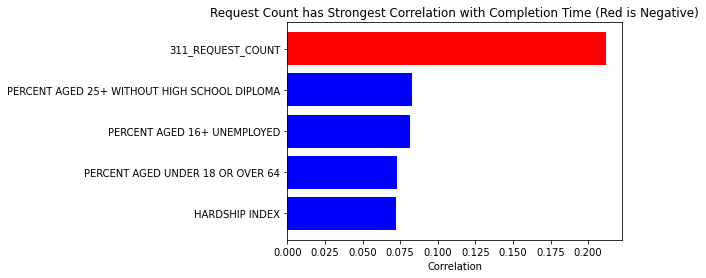

In [164]:
import matplotlib.pyplot as plt
scdc = service_calls_deomgraphics_count.corr()['COMPLETION_TIME_left'].abs().sort_values(ascending = False)
print(service_calls_deomgraphics_count.corr()['COMPLETION_TIME_left'])
scdc = scdc.iloc[2:].sort_values()
display(scdc)

plt.barh(scdc.tail(5).index,scdc.tail(5), color = ['b', 'b', 'b', 'b', 'r'])
plt.title('Request Count has Strongest Correlation with Completion Time (Red is Negative)')
plt.xlabel('Correlation')

Text(0.5, 0, 'Correlation')

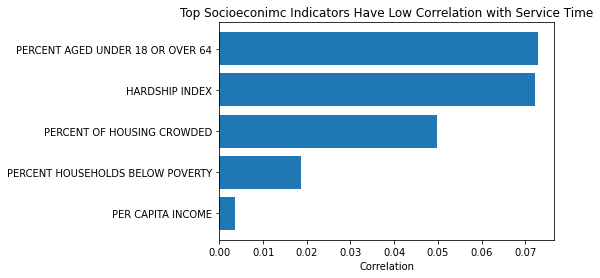

In [110]:
hi = service_calls_demographics.corr()['COMPLETION_TIME'].sort_values()

plt.barh(hi.head(5).index,hi.head(5))
plt.title('Top Socioeconimc Indicators Have Low Correlation with Service Time')
plt.xlabel('Correlation')

In [3]:
act = aggregated_completion_times.sort_values(by = 'COMPLETION_TIME')


NameError: name 'aggregated_completion_times' is not defined

In [112]:
aggregated_nbh = pd.DataFrame(aggregated_nbh)
aggregated_nbh

aggregated_nbh

,SR_TYPE
NEIGHBORHOOD,
,274
ANDERSONVILLE,38
"ARCHER HEIGHTS,WEST ELSDON",201
"ARMOUR SQUARE,CHINATOWN",62
ASHBURN,238
...,...
WEST PULLMAN,297
WEST RIDGE,270
"WICKER PARK,WEST TOWN",335


In [113]:
merged = hoods.set_index('sec_neigh').join(aggregated_nbh)
merged2 = merged[merged.index != 'OHARE']
merged2.reset_index(inplace = True)
#merged2.plot(figsize=(40,20))
merged2.columns = ['index', 'pri_neigh', 'shape_area', 'shape_len', 'geometry', '311_REQUEST_COUNT']
merged2

,index,pri_neigh,shape_area,shape_len,geometry,311_REQUEST_COUNT
0,ANDERSONVILLE,Andersonville,9.584593e+06,12534.092625,"POLYGON ((-87.66114 41.97630, -87.66132 41.976...",38
1,"ARCHER HEIGHTS,WEST ELSDON",Archer Heights,5.592251e+07,31880.021030,"POLYGON ((-87.71437 41.82604, -87.71436 41.825...",201
2,"ARCHER HEIGHTS,WEST ELSDON",West Elsdon,3.271109e+07,26229.695601,"POLYGON ((-87.71378 41.80393, -87.71377 41.803...",201
3,"ARMOUR SQUARE,CHINATOWN",Armour Square,1.714147e+07,24359.189625,"POLYGON ((-87.62920 41.84713, -87.62919 41.846...",62
4,"ARMOUR SQUARE,CHINATOWN",Chinatown,1.062473e+07,14452.766257,"POLYGON ((-87.63022 41.85770, -87.63022 41.857...",62
...,...,...,...,...,...,...
92,WEST RIDGE,West Ridge,9.842909e+07,43020.689458,"POLYGON ((-87.68465 42.01948, -87.68464 42.019...",270
93,"WICKER PARK,WEST TOWN",West Town,5.850773e+07,46673.620546,"POLYGON ((-87.65686 41.91078, -87.65685 41.910...",335
94,"WICKER PARK,WEST TOWN",Wicker Park,2.685319e+07,21992.660946,"POLYGON ((-87.66780 41.91430, -87.66780 41.914...",335
95,WOODLAWN,Woodlawn,4.051574e+07,28960.059037,"POLYGON ((-87.58630 41.77334, -87.58664 41.773...",134


In [114]:
merged_ct = hoods.set_index('sec_neigh').join(aggregated_completion_times)
merged_ct.reset_index(inplace = True)
merged_ct.COMPLETION_TIME.sort_values()



51     0.000000
64     0.228555
63     4.393939
30     6.400000
67     7.000000
        ...    
8     39.962162
97    40.571429
53    41.339130
52    41.339130
57    43.020408
Name: COMPLETION_TIME, Length: 98, dtype: float64

In [115]:
merged2

,index,pri_neigh,shape_area,shape_len,geometry,311_REQUEST_COUNT
0,ANDERSONVILLE,Andersonville,9.584593e+06,12534.092625,"POLYGON ((-87.66114 41.97630, -87.66132 41.976...",38
1,"ARCHER HEIGHTS,WEST ELSDON",Archer Heights,5.592251e+07,31880.021030,"POLYGON ((-87.71437 41.82604, -87.71436 41.825...",201
2,"ARCHER HEIGHTS,WEST ELSDON",West Elsdon,3.271109e+07,26229.695601,"POLYGON ((-87.71378 41.80393, -87.71377 41.803...",201
3,"ARMOUR SQUARE,CHINATOWN",Armour Square,1.714147e+07,24359.189625,"POLYGON ((-87.62920 41.84713, -87.62919 41.846...",62
4,"ARMOUR SQUARE,CHINATOWN",Chinatown,1.062473e+07,14452.766257,"POLYGON ((-87.63022 41.85770, -87.63022 41.857...",62
...,...,...,...,...,...,...
92,WEST RIDGE,West Ridge,9.842909e+07,43020.689458,"POLYGON ((-87.68465 42.01948, -87.68464 42.019...",270
93,"WICKER PARK,WEST TOWN",West Town,5.850773e+07,46673.620546,"POLYGON ((-87.65686 41.91078, -87.65685 41.910...",335
94,"WICKER PARK,WEST TOWN",Wicker Park,2.685319e+07,21992.660946,"POLYGON ((-87.66780 41.91430, -87.66780 41.914...",335
95,WOODLAWN,Woodlawn,4.051574e+07,28960.059037,"POLYGON ((-87.58630 41.77334, -87.58664 41.773...",134


In [116]:
# #Create Plot Space
# import matplotlib.pyplot as plt
# fig, ax = plt.subplots(1, figsize=(20, 10))
# ax.axis('off')
# ax.set_title('Service Request Count', fontdict={'fontsize': '20', 'fontweight' : '3'})

# #set color and min max
# color = 'Oranges'
# vmin, vmax = 0, 1340
# sm = plt.cm.ScalarMappable(cmap=color, norm=plt.Normalize(vmin=vmin, vmax=vmax))
# sm._A = []
# cbar = fig.colorbar(sm)
# cbar.ax.tick_params(labelsize=20)

# #plot data
# merged2.plot('311_REQUEST_COUNT', cmap=color, linewidth=0.8, ax=ax, figsize=(40,20))

In [117]:

merged_ct = merged_ct[merged_ct.pri_neigh!="O'Hare"]
merged_ct

,index,pri_neigh,shape_area,shape_len,geometry,COMPLETION_TIME
0,ANDERSONVILLE,Andersonville,9.584593e+06,12534.092625,"POLYGON ((-87.66114 41.97630, -87.66132 41.976...",36.578947
1,"ARCHER HEIGHTS,WEST ELSDON",Archer Heights,5.592251e+07,31880.021030,"POLYGON ((-87.71437 41.82604, -87.71436 41.825...",26.761194
2,"ARCHER HEIGHTS,WEST ELSDON",West Elsdon,3.271109e+07,26229.695601,"POLYGON ((-87.71378 41.80393, -87.71377 41.803...",26.761194
3,"ARMOUR SQUARE,CHINATOWN",Armour Square,1.714147e+07,24359.189625,"POLYGON ((-87.62920 41.84713, -87.62919 41.846...",19.064516
4,"ARMOUR SQUARE,CHINATOWN",Chinatown,1.062473e+07,14452.766257,"POLYGON ((-87.63022 41.85770, -87.63022 41.857...",19.064516
...,...,...,...,...,...,...
93,WEST RIDGE,West Ridge,9.842909e+07,43020.689458,"POLYGON ((-87.68465 42.01948, -87.68464 42.019...",26.185185
94,"WICKER PARK,WEST TOWN",West Town,5.850773e+07,46673.620546,"POLYGON ((-87.65686 41.91078, -87.65685 41.910...",22.250746
95,"WICKER PARK,WEST TOWN",Wicker Park,2.685319e+07,21992.660946,"POLYGON ((-87.66780 41.91430, -87.66780 41.914...",22.250746
96,WOODLAWN,Woodlawn,4.051574e+07,28960.059037,"POLYGON ((-87.58630 41.77334, -87.58664 41.773...",23.462687


# Create Heat Map of Service Completion Times

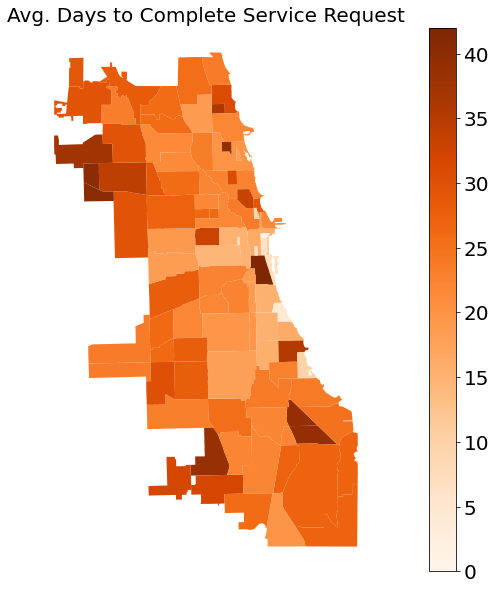

In [118]:
#Create Plot Space
fig, ax = plt.subplots(1, figsize=(20, 10))
ax.axis('off')
ax.set_title('Avg. Days to Complete Service Request', fontdict={'fontsize': '20', 'fontweight' : '3'})

#set color and min max
color = 'Oranges'
vmin, vmax = 0, 42
sm = plt.cm.ScalarMappable(cmap=color, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=20)

#plot data
merged_ct.plot('COMPLETION_TIME', cmap=color, linewidth=0.8, ax=ax, figsize=(40,20))

#look at correlation between number of requests and completion time



In [169]:
#neighborhoods['DOW'] = neighborhoods.CREATED_DATE.dt.dayofweek
neighborhoods['CREATED_DATE'] = pd.to_datetime(neighborhoods['CREATED_DATE'])

In [171]:
neighborhoods['DOW'] = neighborhoods.CREATED_DATE.dt.dayofweek


In [196]:
DOW_COUNT = neighborhoods.groupby('DOW')['SR_NUMBER'].count()
DOW_COUNT.index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
DOW_COUNT

Monday       27766
Tuesday      28311
Wednesday    27022
Thursday     25696
Friday       23021
Saturday      9247
Sunday        8884
Name: SR_NUMBER, dtype: int64

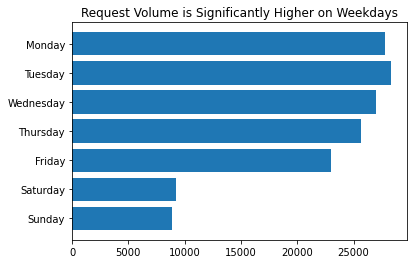

In [197]:
plt.barh(DOW_COUNT.index, DOW_COUNT)
plt.title('Request Volume is Significantly Higher on Weekdays')
plt.gca().invert_yaxis()


In [191]:
neighborhoods['MONTH'] = neighborhoods.CREATED_DATE.dt.month

In [202]:
Month_count = neighborhoods.groupby('MONTH')['SR_TYPE'].count()*10

In [203]:
Month_count.index = ['Jan', 'Feb', 'Mar', 'Apr', "May", "Jun", "Jul", 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

Text(0.5, 1.0, 'Request Volume Peaks in July and August')

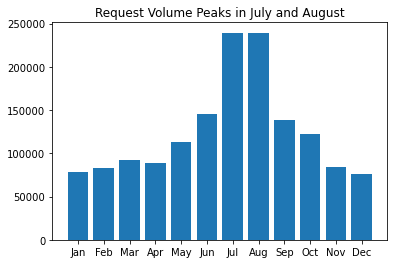

In [205]:
plt.bar(Month_count.index, Month_count)
plt.title('Request Volume Peaks in July and August')